In [1]:
from tensorflow.keras.utils import to_categorical
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l1
from callbacks import all_callbacks
from qkeras.qlayers import QDense, QActivation
from qkeras.quantizers import quantized_bits, quantized_relu
import plotting
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
import sys
seed = 0
np.random.seed(seed)
import tensorflow as tf
tf.random.set_seed(seed)
import os
os.environ['PATH'] = os.environ['XILINX_VIVADO'] + '/bin:' + os.environ['PATH']

2025-05-05 13:30:18.695439: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Open training and testing data

In [2]:
sample_0 = np.load('toymc_0.npy')
sample_1 = np.load('toymc_1.npy')
label_train = sample_0[:,3]
sample_train = sample_0[:,0:3]
label_test = sample_1[:,3]
sample_test = sample_1[:,0:3]

# Build quantized model with Qkeras

In [3]:
# For each layer here, we use 16 as total number of bits, and 8 as number of integer bits
# For the relu activation layer, we use 8 bits for quantization
model = Sequential()
model.add(
    QDense(
        16,
        input_shape=(3,),
        name='fc1',
        kernel_quantizer=quantized_bits(16, 8, alpha=1),
        bias_quantizer=quantized_bits(16, 8, alpha=1),
        kernel_initializer='lecun_uniform',
        kernel_regularizer=l1(0.0001),
    )
)
model.add(QActivation(activation=quantized_relu(16), name='relu1'))
model.add(
    QDense(
        32,
        name='fc2',
        kernel_quantizer=quantized_bits(16, 8, alpha=1),
        bias_quantizer=quantized_bits(16, 8, alpha=1),
        kernel_initializer='lecun_uniform',
        kernel_regularizer=l1(0.0001),
    )
)
model.add(QActivation(activation=quantized_relu(16), name='relu2'))
model.add(
    QDense(
        32,
        name='fc3',
        kernel_quantizer=quantized_bits(16, 8, alpha=1),
        bias_quantizer=quantized_bits(16, 8, alpha=1),
        kernel_initializer='lecun_uniform',
        kernel_regularizer=l1(0.0001),
    )
)
model.add(QActivation(activation=quantized_relu(16), name='relu3'))
model.add(
    QDense(
        1,
        name='output',
        kernel_quantizer=quantized_bits(16, 8, alpha=1),
        bias_quantizer=quantized_bits(16, 8, alpha=1),
        kernel_initializer='lecun_uniform',
        kernel_regularizer=l1(0.0001),
    )
)
model.add(Activation(activation='sigmoid', name='sigmoid'))

# Pruning

In [4]:
from tensorflow_model_optimization.python.core.sparsity.keras import prune, pruning_callbacks, pruning_schedule
from tensorflow_model_optimization.sparsity.keras import strip_pruning
# Here, 0.1 means that 10% of the weights will be forced to be 0.
pruning_params = {"pruning_schedule": pruning_schedule.ConstantSparsity(0.1, begin_step=2000, frequency=100)}
model = prune.prune_low_magnitude(model, **pruning_params)

# Do training and save the result when the "Train" flag is true
# Or it will take the previous trained result

In [33]:
train = True
if train:
    adam = Adam(learning_rate=0.0001)
    model.compile(optimizer=adam, loss=['binary_crossentropy'], metrics=['accuracy'])
    callbacks = all_callbacks(
        stop_patience=1000,
        lr_factor=0.5,
        lr_patience=10,
        lr_epsilon=0.000001,
        lr_cooldown=2,
        lr_minimum=0.0000001,
        outputDir='my_model_3',
    )
    callbacks.callbacks.append(pruning_callbacks.UpdatePruningStep())
    model.fit(
        sample_train,
        label_train,
        batch_size=1024,
        epochs=30,
        validation_split=0.25,
        shuffle=True,
        callbacks=callbacks.callbacks,
    )
    model = strip_pruning(model)
    model.save('my_model_3/KERAS_check_best_model.keras')
else:
    from tensorflow.keras.models import load_model
    from qkeras.utils import _add_supported_quantized_objects
    co = {}
    _add_supported_quantized_objects(co)
    model = load_model('my_model_3/KERAS_check_best_model.keras', custom_objects=co) # TypeError: <qkeras.qlayers.QActivation object at 0x7d55b0252260> could not be deserialized properly. Please ensure that components that are Python object instances (layers, models, etc.) returned by `get_config()` are explicitly deserialized in the model's `from_config()` method.

Epoch 1/30


/root/anaconda3/envs/hls4ml-tutorial/lib/python3.10/site-packages/keras/src/constraints.py:365: UserWarning: The `keras.constraints.serialize()` API should only be used for objects of type `keras.constraints.Constraint`. Found an instance of type <class 'qkeras.quantizers.quantized_bits'>, which may lead to improper serialization.
  warnings.warn(


  1/147 [..............................] - ETA: 2:08 - loss: 0.1570 - accuracy: 0.9590WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0018s vs `on_train_batch_end` time: 0.0027s). Check your callbacks.


120/147 [=======================>......] - ETA: 0s - loss: 0.1425 - accuracy: 0.9641
***callbacks***
saving losses to my_model_3/losses.log

Epoch 1: val_loss improved from inf to 0.27704, saving model to my_model_3/KERAS_check_best_model.h5

Epoch 1: val_loss improved from inf to 0.27704, saving model to my_model_3/KERAS_check_best_model_weights.h5

Epoch 1: saving model to my_model_3/KERAS_check_model_last.h5

Epoch 1: saving model to my_model_3/KERAS_check_model_last_weights.h5

***callbacks end***

147/147 [==============================] - 1s 4ms/step - loss: 0.1423 - accuracy: 0.9641 - val_loss: 0.2770 - val_accuracy: 0.9189 - lr: 1.0000e-04
Epoch 2/30
 91/147 [=================>............] - ETA: 0s - loss: 0.1434 - accuracy: 0.9634

/root/anaconda3/envs/hls4ml-tutorial/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


119/147 [=======================>......] - ETA: 0s - loss: 0.1421 - accuracy: 0.9638
***callbacks***
saving losses to my_model_3/losses.log

Epoch 2: val_loss improved from 0.27704 to 0.26126, saving model to my_model_3/KERAS_check_best_model.h5

Epoch 2: val_loss improved from 0.27704 to 0.26126, saving model to my_model_3/KERAS_check_best_model_weights.h5

Epoch 2: saving model to my_model_3/KERAS_check_model_last.h5

Epoch 2: saving model to my_model_3/KERAS_check_model_last_weights.h5

***callbacks end***

147/147 [==============================] - 0s 2ms/step - loss: 0.1417 - accuracy: 0.9639 - val_loss: 0.2613 - val_accuracy: 0.9217 - lr: 1.0000e-04
Epoch 3/30
122/147 [=======================>......] - ETA: 0s - loss: 0.1409 - accuracy: 0.9643
***callbacks***
saving losses to my_model_3/losses.log

Epoch 3: val_loss did not improve from 0.26126

Epoch 3: val_loss did not improve from 0.26126

Epoch 3: saving model to my_model_3/KERAS_check_model_last.h5

Epoch 3: saving model to 

125/147 [========================>.....] - ETA: 0s - loss: 0.1363 - accuracy: 0.9650
***callbacks***
saving losses to my_model_3/losses.log

Epoch 16: val_loss did not improve from 0.25567

Epoch 16: val_loss did not improve from 0.25567

Epoch 16: saving model to my_model_3/KERAS_check_model_last.h5

Epoch 16: saving model to my_model_3/KERAS_check_model_last_weights.h5

***callbacks end***

147/147 [==============================] - 0s 2ms/step - loss: 0.1361 - accuracy: 0.9649 - val_loss: 0.2636 - val_accuracy: 0.9226 - lr: 1.0000e-04
Epoch 17/30
127/147 [========================>.....] - ETA: 0s - loss: 0.1353 - accuracy: 0.9646
***callbacks***
saving losses to my_model_3/losses.log

Epoch 17: val_loss improved from 0.25567 to 0.25511, saving model to my_model_3/KERAS_check_best_model.h5

Epoch 17: val_loss improved from 0.25567 to 0.25511, saving model to my_model_3/KERAS_check_best_model_weights.h5

Epoch 17: saving model to my_model_3/KERAS_check_model_last.h5

Epoch 17: saving 

Epoch 30/30
118/147 [=======================>......] - ETA: 0s - loss: 0.1328 - accuracy: 0.9654
***callbacks***
saving losses to my_model_3/losses.log

Epoch 30: val_loss did not improve from 0.24745

Epoch 30: val_loss did not improve from 0.24745

Epoch 30: saving model to my_model_3/KERAS_check_model_last.h5

Epoch 30: saving model to my_model_3/KERAS_check_model_last_weights.h5

Epoch 30: saving model to my_model_3/KERAS_check_model_epoch30.h5

***callbacks end***

147/147 [==============================] - 0s 2ms/step - loss: 0.1330 - accuracy: 0.9654 - val_loss: 0.2567 - val_accuracy: 0.9245 - lr: 1.0000e-04


# Process the testing sample

In [6]:
y_keras = model.predict(sample_test)

6250/6250 [==============================] - 4s 571us/step


# Check the testing result with a cut on 0.5 and compraing to the expected label

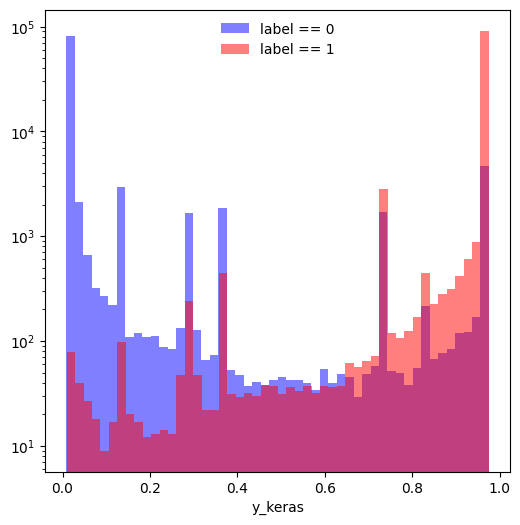

In [7]:
y_keras_sig = y_keras[ (label_test > 0 ) ]
y_keras_bkg = y_keras[ (label_test < 1) ]
plt.figure(figsize=(6,6))
plt.hist(y_keras_bkg,log=True,bins=50,label='label == 0',alpha=0.5,color='blue')
plt.hist(y_keras_sig,log=True,bins=50,label='label == 1',alpha=0.5,color='red')
plt.legend().get_frame().set_alpha(0)
plt.xlabel('y_keras')
plt.show()

Accuracy: 95.32%


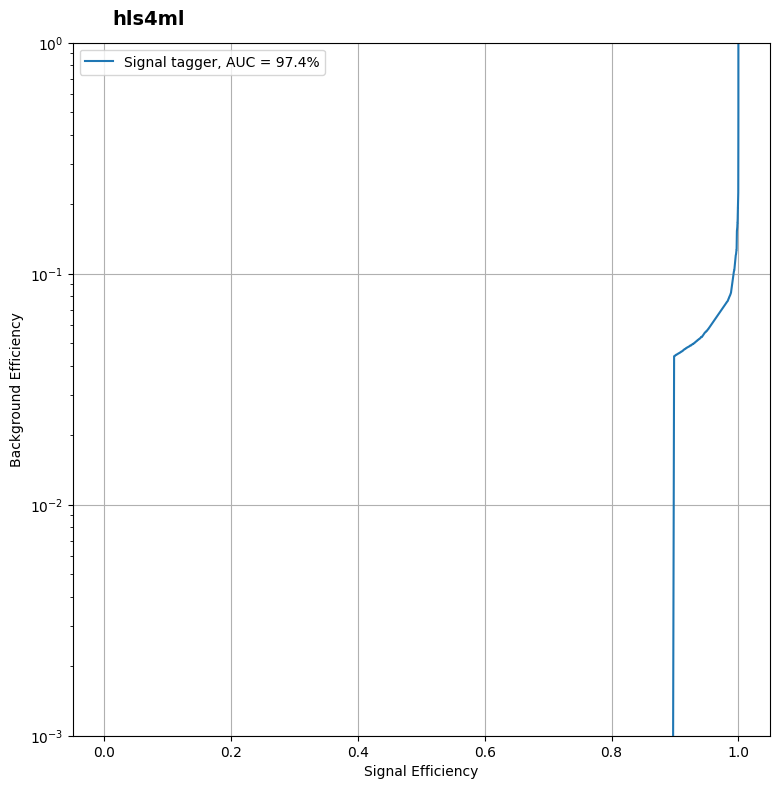

In [8]:
y_pred_binary = (y_keras > 0.5).astype(int)
accuracy = accuracy_score(label_test, y_pred_binary)
print("Accuracy: {:.2f}%".format(accuracy * 100))
label_test_reshape = label_test.reshape(len(label_test),1)
plt.figure(figsize=(9, 9))
_ = plotting.makeRoc(label_test_reshape, y_keras, ['Signal'])
plt.show()

# Build hls4ml model

In [9]:
# To create the text files to be used in later HLS Csimulation
import csv
with open('my_model_3/Input.dat', 'w') as f:
    csv.writer(f, delimiter=' ').writerows(sample_test)
with open('my_model_3/Output.dat', 'w') as f:
    csv.writer(f, delimiter=' ').writerows(y_keras)

In [16]:
import hls4ml
config = hls4ml.utils.config_from_keras_model(model, granularity='name')
# This is for quantization on the output layer using the HLS options
# After training, you can set the quantization for each layer like this
config['LayerName']['sigmoid']['exp_table_t'] = 'ap_fixed<16,6>'
config['LayerName']['sigmoid']['inv_table_t'] = 'ap_fixed<16,6>'
config['LayerName']['sigmoid']['Precision']='ap_fixed<16,6>'
plotting.print_dict(config)
hls_model = hls4ml.converters.convert_from_keras_model(
    model, hls_config=config, output_dir='my_model_3/hls4ml_prj', part='xc7a200tsbg484-1',
    input_data_tb = "my_model_3/Input.dat", output_data_tb = "my_model_3/Output.dat", backend='Vitis'
)
# "part" is the FPGA part of the Nexys video card
# By default, it will use Vivado HLS for backend
# If you use newer version of Xilinx software, you need to include backend='Vitis' in the argument to use Vitis HLS.
# Use io_type="io_parallel" in the argument to input all the bits in parallel

Interpreting Sequential
Topology:
Layer name: fc1_input, layer type: InputLayer, input shapes: [[None, 3]], output shape: [None, 3]
Layer name: fc1, layer type: QDense, input shapes: [[None, 3]], output shape: [None, 16]
Layer name: relu1, layer type: Activation, input shapes: [[None, 16]], output shape: [None, 16]
Layer name: fc2, layer type: QDense, input shapes: [[None, 16]], output shape: [None, 32]
Layer name: relu2, layer type: Activation, input shapes: [[None, 32]], output shape: [None, 32]
Layer name: fc3, layer type: QDense, input shapes: [[None, 32]], output shape: [None, 32]
Layer name: relu3, layer type: Activation, input shapes: [[None, 32]], output shape: [None, 32]
Layer name: output, layer type: QDense, input shapes: [[None, 32]], output shape: [None, 1]
Layer name: sigmoid, layer type: Activation, input shapes: [[None, 1]], output shape: [None, 1]
Model
  Precision
    default:         fixed<16,6>
  ReuseFactor:       1
  Strategy:          Latency
  BramFactor:       

/root/anaconda3/envs/hls4ml-tutorial/lib/python3.10/site-packages/keras/src/constraints.py:365: UserWarning: The `keras.constraints.serialize()` API should only be used for objects of type `keras.constraints.Constraint`. Found an instance of type <class 'qkeras.quantizers.quantized_bits'>, which may lead to improper serialization.
  warnings.warn(


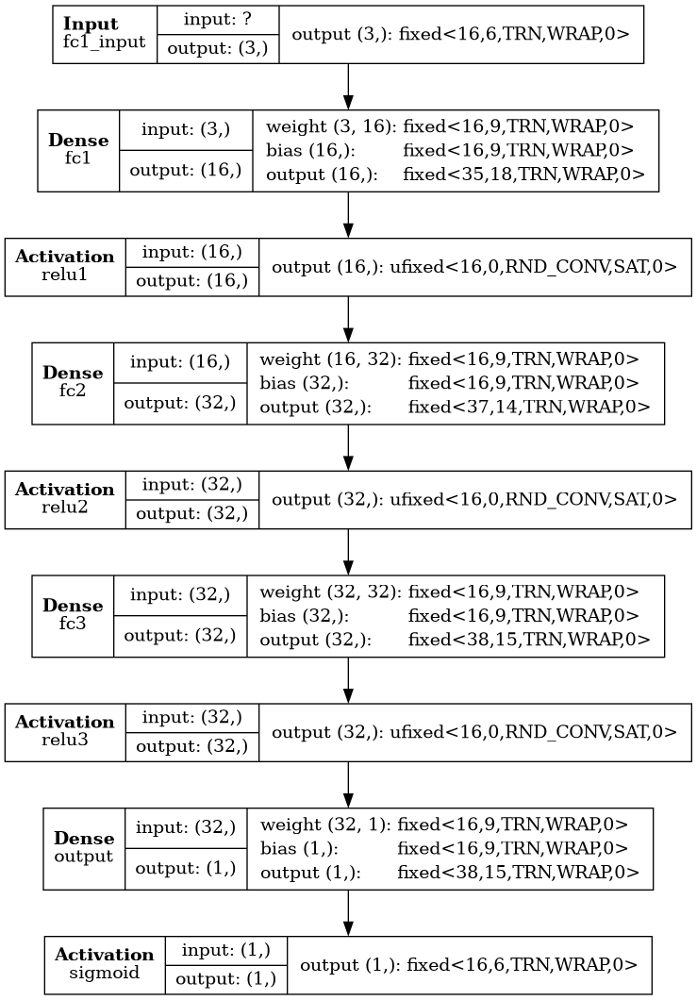

In [17]:
# This is to show the hls4ml model structure
from IPython.display import Image
hls4ml.utils.plot_model(hls_model, show_shapes=True, show_precision=True, to_file='hls_model.png')
Image('hls_model.png')

In [18]:
hls_model.compile()

Writing HLS project
Done


/root/anaconda3/envs/hls4ml-tutorial/lib/python3.10/site-packages/keras/src/constraints.py:365: UserWarning: The `keras.constraints.serialize()` API should only be used for objects of type `keras.constraints.Constraint`. Found an instance of type <class 'qkeras.quantizers.quantized_bits'>, which may lead to improper serialization.
  warnings.warn(


# Process the testing data with hls4ml model and see the performance

Accuracy Keras: 95.32%
Accuracy HLS: 94.03%


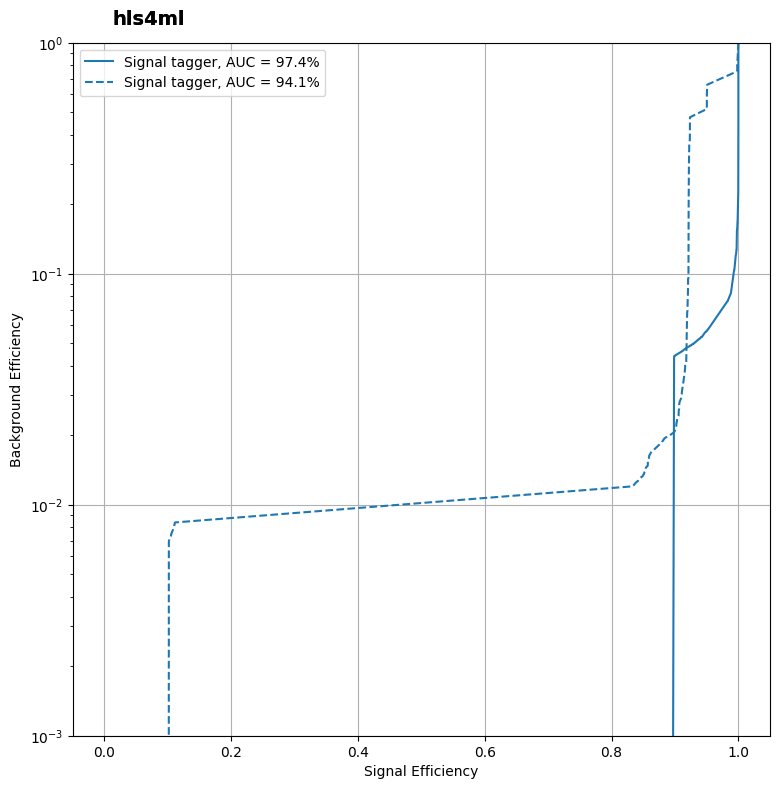

In [19]:
y_hls = hls_model.predict(np.ascontiguousarray(sample_test))
y_pred_binary_hls = (y_hls > 0.5).astype(int)
accuracy_hls = accuracy_score(label_test, y_pred_binary_hls)
print("Accuracy Keras: {:.2f}%".format(accuracy * 100))
print("Accuracy HLS: {:.2f}%".format(accuracy_hls * 100))
import matplotlib.pyplot as plt
plt.figure(figsize=(9, 9))
_ = plotting.makeRoc(label_test_reshape, y_keras, ['Signal'])
plt.gca().set_prop_cycle(None)  
_ = plotting.makeRoc(label_test_reshape, y_hls, ['Signal'], linestyle='--')
plt.show()

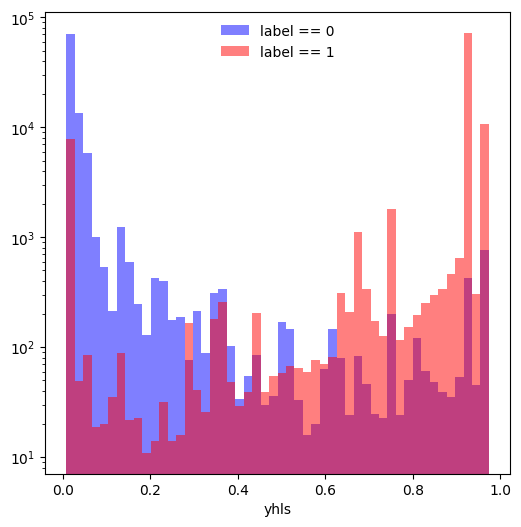

In [20]:
y_hls_sig = y_hls[ (label_test > 0 ) ]
y_hls_bkg = y_hls[ (label_test < 1) ]
plt.figure(figsize=(6,6))
plt.hist(y_hls_bkg,log=True,bins=50,label='label == 0',alpha=0.5,color='blue')
plt.hist(y_hls_sig,log=True,bins=50,label='label == 1',alpha=0.5,color='red')
plt.legend().get_frame().set_alpha(0)
plt.xlabel('yhls')
plt.show()

# Create the Vivado HLS project and do C simulation

In [24]:
# This requires the environment variable for Xilinx Vivado being included.
# For instance, you need to run:
# . /opt/Xilinx/Vivado/2023.1/settings64.sh
# mv /opt/Xilinx/Vivado/2023.1/tps/lnx64/binutils-2.37/bin/ld /opt/Xilinx/Vivado/2023.1/tps/lnx64/binutils-2.37/bin/ld.backup
# cd /lib/x86_64-linux-gnu/; ln -s libtinfo.so.6 libtinfo.so.5
# Since we set csim and cosim as True to start simulation, it takes few min.
hls_model.build(synth=True,csim=True,cosim=True)


****** Vitis HLS - High-Level Synthesis from C, C++ and OpenCL v2023.1 (64-bit)
  **** SW Build 3854077 on May  4 2023
  **** IP Build 3864474 on Sun May  7 20:36:21 MDT 2023
  **** SharedData Build 3865790 on Sun May 07 13:33:03 MDT 2023
    ** Copyright 1986-2022 Xilinx, Inc. All Rights Reserved.
    ** Copyright 2022-2023 Advanced Micro Devices, Inc. All Rights Reserved.

source /opt/Xilinx/Vitis_HLS/2023.1/scripts/vitis_hls/hls.tcl -notrace
INFO: [HLS 200-10] Running '/opt/Xilinx/Vitis_HLS/2023.1/bin/unwrapped/lnx64.o/vitis_hls'
INFO: [HLS 200-10] For user 'root' on host '0cb16a49e377' (Linux_x86_64 version 6.11.0-21-generic) on Mon May 05 13:34:56 EDT 2025
INFO: [HLS 200-10] In directory '/root/build/phys476/hls4ml/my_model_3/hls4ml_prj'
Sourcing Tcl script 'build_prj.tcl'
INFO: [HLS 200-1510] Running: open_project myproject_prj 
INFO: [HLS 200-10] Opening project '/root/build/phys476/hls4ml/my_model_3/hls4ml_prj/myproject_prj'.
INFO: [HLS 200-1510] Running: set_top myproject 
IN

INFO: [HLS 200-777] Using interface defaults for 'Vivado' flow target.
INFO: [HLS 200-1995] There were 6,500 instructions in the design after the 'Compile/Link' phase of compilation. See the Design Size Report for more details: /root/build/phys476/hls4ml/my_model_3/hls4ml_prj/myproject_prj/solution1/syn/report/csynth_design_size.rpt
INFO: [HLS 200-1995] There were 12,957 instructions in the design after the 'Performance/Pipeline' phase of compilation. See the Design Size Report for more details: /root/build/phys476/hls4ml/my_model_3/hls4ml_prj/myproject_prj/solution1/syn/report/csynth_design_size.rpt
INFO: [HLS 200-1995] There were 12,534 instructions in the design after the 'Optimizations' phase of compilation. See the Design Size Report for more details: /root/build/phys476/hls4ml/my_model_3/hls4ml_prj/myproject_prj/solution1/syn/report/csynth_design_size.rpt
INFO: [HLS 214-131] Inlining function 'nnet::product::mult<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 9, (ap

INFO: [HLS 200-111] Finished Standard Transforms: CPU user time: 0.2 seconds. CPU system time: 0 seconds. Elapsed time: 0.21 seconds; current allocated memory: 1.083 GB.
INFO: [HLS 200-10] Checking synthesizability ...
INFO: [HLS 200-111] Finished Checking Synthesizability: CPU user time: 0.19 seconds. CPU system time: 0 seconds. Elapsed time: 0.18 seconds; current allocated memory: 1.087 GB.
INFO: [XFORM 203-401] Performing if-conversion on hyperblock from (firmware/nnet_utils/nnet_activation.h:98:10) to (firmware/nnet_utils/nnet_activation.h:123:1) in function 'nnet::sigmoid<ap_fixed<38, 15, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, sigmoid_config13>'... converting 3 basic blocks.
INFO: [XFORM 203-401] Performing if-conversion on hyperblock from (firmware/nnet_utils/nnet_activation.h:43:31) in function 'nnet::relu<ap_fixed<38, 15, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_ufixed<16, 0, (ap_q_mode)4, (ap_o_mode)0, 0>, relu_config10>'... converting 93 bas

INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111] Finished Binding: CPU user time: 0.47 seconds. CPU system time: 0 seconds. Elapsed time: 0.47 seconds; current allocated memory: 1.237 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'relu_ap_fixed_37_14_5_3_0_ap_ufixed_16_0_4_0_0_relu_config7_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining function 'relu<ap_fixed<37, 14, 5, 3, 0>, ap_ufixed<16, 0, 4, 0, 0>, relu_config7>'.
INFO: [HLS 200-1470] Pipelining result : Target II = NA, Final II = 1, Depth = 2, function 'relu<ap_fixed<37, 14, 5, 3, 0>, ap_ufixed<16, 0, 4, 0, 0>, relu_config7>'
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111] Finished Scheduling: CPU user time: 0.78 seconds. CPU system time: 0 seconds. Elapsed time: 0.78 seconds; current a

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'relu_ap_fixed_35_18_5_3_0_ap_ufixed_16_0_4_0_0_relu_config4_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'relu_ap_fixed_35_18_5_3_0_ap_ufixed_16_0_4_0_0_relu_config4_s'.
INFO: [HLS 200-111] Finished Creating RTL model: CPU user time: 0.21 seconds. CPU system time: 0.01 seconds. Elapsed time: 0.22 seconds; current allocated memory: 1.271 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'dense_latency_ap_ufixed_16_0_4_0_0_ap_fixed_37_14_5_3_0_config5_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-104] Estimated max fanout for 'dense_latency_ap_ufixed_16_0_4_0_0_ap_fixed_37_14_5_3_0_config5_s' is 7095 from HDL expression

INFO: [COSIM 212-47] Using XSIM for RTL simulation.
INFO: [COSIM 212-14] Instrumenting C test bench ...
   Build using "/opt/Xilinx/Vitis_HLS/2023.1/tps/lnx64/gcc-8.3.0/bin/g++"
   Compiling apatb_myproject.cpp
   Compiling myproject.cpp_pre.cpp.tb.cpp
   Compiling myproject_test.cpp_pre.cpp.tb.cpp
   Compiling apatb_myproject_ir.ll
   Generating cosim.tv.exe
INFO: [COSIM 212-302] Starting C TB testing ... 
Processing input 0
Predictions
0.975006 
Quantized predictions
0.973633 
Processing input 5000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 10000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 15000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 20000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 25000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 30000
Predictions
0.975006 
Quantized predictions
0.00976563 
Processing input 35000
Predictions
0.975006 
Quantize

Starting static elaboration
Pass Through NonSizing Optimizer
Completed static elaboration
Starting simulation data flow analysis
Completed simulation data flow analysis
Time Resolution for simulation is 1ps
Compiling package xil_defaultlib.$unit_dataflow_monitor_sv
Compiling module xil_defaultlib.myproject_mul_16s_8ns_23_2_0(NUM...
Compiling module xil_defaultlib.myproject_mul_16s_7ns_23_2_0(NUM...
Compiling module xil_defaultlib.myproject_mul_16s_6ns_22_2_0(NUM...
Compiling module xil_defaultlib.myproject_mul_16s_8s_23_2_0(NUM_...
Compiling module xil_defaultlib.myproject_mul_16s_7s_23_2_0(NUM_...
Compiling module xil_defaultlib.myproject_mul_16s_6s_22_2_0(NUM_...
Compiling module xil_defaultlib.myproject_dense_latency_ap_fixed...
Compiling module xil_defaultlib.myproject_relu_ap_fixed_35_18_5_...
Compiling module xil_defaultlib.myproject_mul_16ns_7ns_22_2_0(NU...
Compiling module xil_defaultlib.myproject_mul_16ns_7s_23_2_0(NUM...
Compiling module xil_defaultlib.myproject_mul_16ns_6s_

// RTL Simulation : 347 / 200000 [97.37%] @ "2043000"
// RTL Simulation : 348 / 200000 [97.37%] @ "2048000"
// RTL Simulation : 349 / 200000 [97.37%] @ "2053000"
// RTL Simulation : 350 / 200000 [97.37%] @ "2058000"
// RTL Simulation : 351 / 200000 [97.37%] @ "2063000"
// RTL Simulation : 352 / 200000 [97.37%] @ "2068000"
// RTL Simulation : 353 / 200000 [97.37%] @ "2073000"
// RTL Simulation : 354 / 200000 [97.37%] @ "2078000"
// RTL Simulation : 355 / 200000 [97.37%] @ "2083000"
// RTL Simulation : 356 / 200000 [97.37%] @ "2088000"
// RTL Simulation : 357 / 200000 [97.37%] @ "2093000"
// RTL Simulation : 358 / 200000 [97.37%] @ "2098000"
// RTL Simulation : 359 / 200000 [97.37%] @ "2103000"
// RTL Simulation : 360 / 200000 [97.37%] @ "2108000"
// RTL Simulation : 361 / 200000 [97.37%] @ "2113000"
// RTL Simulation : 362 / 200000 [97.37%] @ "2118000"
// RTL Simulation : 363 / 200000 [97.37%] @ "2123000"
// RTL Simulation : 364 / 200000 [97.37%] @ "2128000"
// RTL Simulation : 365 / 20

// RTL Simulation : 826 / 200000 [97.37%] @ "4438000"
// RTL Simulation : 827 / 200000 [97.37%] @ "4443000"
// RTL Simulation : 828 / 200000 [97.37%] @ "4448000"
// RTL Simulation : 829 / 200000 [97.37%] @ "4453000"
// RTL Simulation : 830 / 200000 [97.37%] @ "4458000"
// RTL Simulation : 831 / 200000 [97.37%] @ "4463000"
// RTL Simulation : 832 / 200000 [97.37%] @ "4468000"
// RTL Simulation : 833 / 200000 [97.37%] @ "4473000"
// RTL Simulation : 834 / 200000 [97.37%] @ "4478000"
// RTL Simulation : 835 / 200000 [97.37%] @ "4483000"
// RTL Simulation : 836 / 200000 [97.37%] @ "4488000"
// RTL Simulation : 837 / 200000 [97.37%] @ "4493000"
// RTL Simulation : 838 / 200000 [97.37%] @ "4498000"
// RTL Simulation : 839 / 200000 [97.37%] @ "4503000"
// RTL Simulation : 840 / 200000 [97.37%] @ "4508000"
// RTL Simulation : 841 / 200000 [97.37%] @ "4513000"
// RTL Simulation : 842 / 200000 [97.37%] @ "4518000"
// RTL Simulation : 843 / 200000 [97.37%] @ "4523000"
// RTL Simulation : 844 / 20

// RTL Simulation : 1289 / 200000 [97.37%] @ "6753000"
// RTL Simulation : 1290 / 200000 [97.37%] @ "6758000"
// RTL Simulation : 1291 / 200000 [97.37%] @ "6763000"
// RTL Simulation : 1292 / 200000 [97.37%] @ "6768000"
// RTL Simulation : 1293 / 200000 [97.37%] @ "6773000"
// RTL Simulation : 1294 / 200000 [97.37%] @ "6778000"
// RTL Simulation : 1295 / 200000 [97.37%] @ "6783000"
// RTL Simulation : 1296 / 200000 [97.37%] @ "6788000"
// RTL Simulation : 1297 / 200000 [97.37%] @ "6793000"
// RTL Simulation : 1298 / 200000 [97.37%] @ "6798000"
// RTL Simulation : 1299 / 200000 [97.37%] @ "6803000"
// RTL Simulation : 1300 / 200000 [97.37%] @ "6808000"
// RTL Simulation : 1301 / 200000 [97.37%] @ "6813000"
// RTL Simulation : 1302 / 200000 [97.37%] @ "6818000"
// RTL Simulation : 1303 / 200000 [97.37%] @ "6823000"
// RTL Simulation : 1304 / 200000 [97.37%] @ "6828000"
// RTL Simulation : 1305 / 200000 [97.37%] @ "6833000"
// RTL Simulation : 1306 / 200000 [97.37%] @ "6838000"
// RTL Sim

// RTL Simulation : 1701 / 200000 [97.37%] @ "8813000"
// RTL Simulation : 1702 / 200000 [97.37%] @ "8818000"
// RTL Simulation : 1703 / 200000 [97.37%] @ "8823000"
// RTL Simulation : 1704 / 200000 [97.37%] @ "8828000"
// RTL Simulation : 1705 / 200000 [97.37%] @ "8833000"
// RTL Simulation : 1706 / 200000 [97.37%] @ "8838000"
// RTL Simulation : 1707 / 200000 [97.37%] @ "8843000"
// RTL Simulation : 1708 / 200000 [97.37%] @ "8848000"
// RTL Simulation : 1709 / 200000 [97.37%] @ "8853000"
// RTL Simulation : 1710 / 200000 [97.37%] @ "8858000"
// RTL Simulation : 1711 / 200000 [97.37%] @ "8863000"
// RTL Simulation : 1712 / 200000 [97.37%] @ "8868000"
// RTL Simulation : 1713 / 200000 [97.37%] @ "8873000"
// RTL Simulation : 1714 / 200000 [97.37%] @ "8878000"
// RTL Simulation : 1715 / 200000 [97.37%] @ "8883000"
// RTL Simulation : 1716 / 200000 [97.37%] @ "8888000"
// RTL Simulation : 1717 / 200000 [97.37%] @ "8893000"
// RTL Simulation : 1718 / 200000 [97.37%] @ "8898000"
// RTL Sim

// RTL Simulation : 2184 / 200000 [97.37%] @ "11228000"
// RTL Simulation : 2185 / 200000 [97.37%] @ "11233000"
// RTL Simulation : 2186 / 200000 [97.37%] @ "11238000"
// RTL Simulation : 2187 / 200000 [97.37%] @ "11243000"
// RTL Simulation : 2188 / 200000 [97.37%] @ "11248000"
// RTL Simulation : 2189 / 200000 [97.37%] @ "11253000"
// RTL Simulation : 2190 / 200000 [97.37%] @ "11258000"
// RTL Simulation : 2191 / 200000 [97.37%] @ "11263000"
// RTL Simulation : 2192 / 200000 [97.37%] @ "11268000"
// RTL Simulation : 2193 / 200000 [97.37%] @ "11273000"
// RTL Simulation : 2194 / 200000 [97.37%] @ "11278000"
// RTL Simulation : 2195 / 200000 [97.37%] @ "11283000"
// RTL Simulation : 2196 / 200000 [97.37%] @ "11288000"
// RTL Simulation : 2197 / 200000 [97.37%] @ "11293000"
// RTL Simulation : 2198 / 200000 [97.37%] @ "11298000"
// RTL Simulation : 2199 / 200000 [97.37%] @ "11303000"
// RTL Simulation : 2200 / 200000 [97.37%] @ "11308000"
// RTL Simulation : 2201 / 200000 [97.37%] @ "11

// RTL Simulation : 2667 / 200000 [97.37%] @ "13643000"
// RTL Simulation : 2668 / 200000 [97.37%] @ "13648000"
// RTL Simulation : 2669 / 200000 [97.37%] @ "13653000"
// RTL Simulation : 2670 / 200000 [97.37%] @ "13658000"
// RTL Simulation : 2671 / 200000 [97.37%] @ "13663000"
// RTL Simulation : 2672 / 200000 [97.37%] @ "13668000"
// RTL Simulation : 2673 / 200000 [97.37%] @ "13673000"
// RTL Simulation : 2674 / 200000 [97.37%] @ "13678000"
// RTL Simulation : 2675 / 200000 [97.37%] @ "13683000"
// RTL Simulation : 2676 / 200000 [97.37%] @ "13688000"
// RTL Simulation : 2677 / 200000 [97.37%] @ "13693000"
// RTL Simulation : 2678 / 200000 [97.37%] @ "13698000"
// RTL Simulation : 2679 / 200000 [97.37%] @ "13703000"
// RTL Simulation : 2680 / 200000 [97.37%] @ "13708000"
// RTL Simulation : 2681 / 200000 [97.37%] @ "13713000"
// RTL Simulation : 2682 / 200000 [97.37%] @ "13718000"
// RTL Simulation : 2683 / 200000 [97.37%] @ "13723000"
// RTL Simulation : 2684 / 200000 [97.37%] @ "13

// RTL Simulation : 3088 / 200000 [97.37%] @ "15748000"
// RTL Simulation : 3089 / 200000 [97.37%] @ "15753000"
// RTL Simulation : 3090 / 200000 [97.37%] @ "15758000"
// RTL Simulation : 3091 / 200000 [97.37%] @ "15763000"
// RTL Simulation : 3092 / 200000 [97.37%] @ "15768000"
// RTL Simulation : 3093 / 200000 [97.37%] @ "15773000"
// RTL Simulation : 3094 / 200000 [97.37%] @ "15778000"
// RTL Simulation : 3095 / 200000 [97.37%] @ "15783000"
// RTL Simulation : 3096 / 200000 [97.37%] @ "15788000"
// RTL Simulation : 3097 / 200000 [97.37%] @ "15793000"
// RTL Simulation : 3098 / 200000 [97.37%] @ "15798000"
// RTL Simulation : 3099 / 200000 [97.37%] @ "15803000"
// RTL Simulation : 3100 / 200000 [97.37%] @ "15808000"
// RTL Simulation : 3101 / 200000 [97.37%] @ "15813000"
// RTL Simulation : 3102 / 200000 [97.37%] @ "15818000"
// RTL Simulation : 3103 / 200000 [97.37%] @ "15823000"
// RTL Simulation : 3104 / 200000 [97.37%] @ "15828000"
// RTL Simulation : 3105 / 200000 [97.37%] @ "15

// RTL Simulation : 3509 / 200000 [97.37%] @ "17853000"
// RTL Simulation : 3510 / 200000 [97.37%] @ "17858000"
// RTL Simulation : 3511 / 200000 [97.37%] @ "17863000"
// RTL Simulation : 3512 / 200000 [97.37%] @ "17868000"
// RTL Simulation : 3513 / 200000 [97.37%] @ "17873000"
// RTL Simulation : 3514 / 200000 [97.37%] @ "17878000"
// RTL Simulation : 3515 / 200000 [97.37%] @ "17883000"
// RTL Simulation : 3516 / 200000 [97.37%] @ "17888000"
// RTL Simulation : 3517 / 200000 [97.37%] @ "17893000"
// RTL Simulation : 3518 / 200000 [97.37%] @ "17898000"
// RTL Simulation : 3519 / 200000 [97.37%] @ "17903000"
// RTL Simulation : 3520 / 200000 [97.37%] @ "17908000"
// RTL Simulation : 3521 / 200000 [97.37%] @ "17913000"
// RTL Simulation : 3522 / 200000 [97.37%] @ "17918000"
// RTL Simulation : 3523 / 200000 [97.37%] @ "17923000"
// RTL Simulation : 3524 / 200000 [97.37%] @ "17928000"
// RTL Simulation : 3525 / 200000 [97.37%] @ "17933000"
// RTL Simulation : 3526 / 200000 [97.37%] @ "17

// RTL Simulation : 4063 / 200000 [97.37%] @ "20623000"
// RTL Simulation : 4064 / 200000 [97.37%] @ "20628000"
// RTL Simulation : 4065 / 200000 [97.37%] @ "20633000"
// RTL Simulation : 4066 / 200000 [97.37%] @ "20638000"
// RTL Simulation : 4067 / 200000 [97.37%] @ "20643000"
// RTL Simulation : 4068 / 200000 [97.37%] @ "20648000"
// RTL Simulation : 4069 / 200000 [97.37%] @ "20653000"
// RTL Simulation : 4070 / 200000 [97.37%] @ "20658000"
// RTL Simulation : 4071 / 200000 [97.37%] @ "20663000"
// RTL Simulation : 4072 / 200000 [97.37%] @ "20668000"
// RTL Simulation : 4073 / 200000 [97.37%] @ "20673000"
// RTL Simulation : 4074 / 200000 [97.37%] @ "20678000"
// RTL Simulation : 4075 / 200000 [97.37%] @ "20683000"
// RTL Simulation : 4076 / 200000 [97.37%] @ "20688000"
// RTL Simulation : 4077 / 200000 [97.37%] @ "20693000"
// RTL Simulation : 4078 / 200000 [97.37%] @ "20698000"
// RTL Simulation : 4079 / 200000 [97.37%] @ "20703000"
// RTL Simulation : 4080 / 200000 [97.37%] @ "20

// RTL Simulation : 4615 / 200000 [97.37%] @ "23383000"
// RTL Simulation : 4616 / 200000 [97.37%] @ "23388000"
// RTL Simulation : 4617 / 200000 [97.37%] @ "23393000"
// RTL Simulation : 4618 / 200000 [97.37%] @ "23398000"
// RTL Simulation : 4619 / 200000 [97.37%] @ "23403000"
// RTL Simulation : 4620 / 200000 [97.37%] @ "23408000"
// RTL Simulation : 4621 / 200000 [97.37%] @ "23413000"
// RTL Simulation : 4622 / 200000 [97.37%] @ "23418000"
// RTL Simulation : 4623 / 200000 [97.37%] @ "23423000"
// RTL Simulation : 4624 / 200000 [97.37%] @ "23428000"
// RTL Simulation : 4625 / 200000 [97.37%] @ "23433000"
// RTL Simulation : 4626 / 200000 [97.37%] @ "23438000"
// RTL Simulation : 4627 / 200000 [97.37%] @ "23443000"
// RTL Simulation : 4628 / 200000 [97.37%] @ "23448000"
// RTL Simulation : 4629 / 200000 [97.37%] @ "23453000"
// RTL Simulation : 4630 / 200000 [97.37%] @ "23458000"
// RTL Simulation : 4631 / 200000 [97.37%] @ "23463000"
// RTL Simulation : 4632 / 200000 [97.37%] @ "23

// RTL Simulation : 5195 / 200000 [97.37%] @ "26283000"
// RTL Simulation : 5196 / 200000 [97.37%] @ "26288000"
// RTL Simulation : 5197 / 200000 [97.37%] @ "26293000"
// RTL Simulation : 5198 / 200000 [97.37%] @ "26298000"
// RTL Simulation : 5199 / 200000 [97.37%] @ "26303000"
// RTL Simulation : 5200 / 200000 [97.37%] @ "26308000"
// RTL Simulation : 5201 / 200000 [97.37%] @ "26313000"
// RTL Simulation : 5202 / 200000 [97.37%] @ "26318000"
// RTL Simulation : 5203 / 200000 [97.37%] @ "26323000"
// RTL Simulation : 5204 / 200000 [97.37%] @ "26328000"
// RTL Simulation : 5205 / 200000 [97.37%] @ "26333000"
// RTL Simulation : 5206 / 200000 [97.37%] @ "26338000"
// RTL Simulation : 5207 / 200000 [97.37%] @ "26343000"
// RTL Simulation : 5208 / 200000 [97.37%] @ "26348000"
// RTL Simulation : 5209 / 200000 [97.37%] @ "26353000"
// RTL Simulation : 5210 / 200000 [97.37%] @ "26358000"
// RTL Simulation : 5211 / 200000 [97.37%] @ "26363000"
// RTL Simulation : 5212 / 200000 [97.37%] @ "26

// RTL Simulation : 5759 / 200000 [97.37%] @ "29103000"
// RTL Simulation : 5760 / 200000 [97.37%] @ "29108000"
// RTL Simulation : 5761 / 200000 [97.37%] @ "29113000"
// RTL Simulation : 5762 / 200000 [97.37%] @ "29118000"
// RTL Simulation : 5763 / 200000 [97.37%] @ "29123000"
// RTL Simulation : 5764 / 200000 [97.37%] @ "29128000"
// RTL Simulation : 5765 / 200000 [97.37%] @ "29133000"
// RTL Simulation : 5766 / 200000 [97.37%] @ "29138000"
// RTL Simulation : 5767 / 200000 [97.37%] @ "29143000"
// RTL Simulation : 5768 / 200000 [97.37%] @ "29148000"
// RTL Simulation : 5769 / 200000 [97.37%] @ "29153000"
// RTL Simulation : 5770 / 200000 [97.37%] @ "29158000"
// RTL Simulation : 5771 / 200000 [97.37%] @ "29163000"
// RTL Simulation : 5772 / 200000 [97.37%] @ "29168000"
// RTL Simulation : 5773 / 200000 [97.37%] @ "29173000"
// RTL Simulation : 5774 / 200000 [97.37%] @ "29178000"
// RTL Simulation : 5775 / 200000 [97.37%] @ "29183000"
// RTL Simulation : 5776 / 200000 [97.37%] @ "29

// RTL Simulation : 6343 / 200000 [97.37%] @ "32023000"
// RTL Simulation : 6344 / 200000 [97.37%] @ "32028000"
// RTL Simulation : 6345 / 200000 [97.37%] @ "32033000"
// RTL Simulation : 6346 / 200000 [97.37%] @ "32038000"
// RTL Simulation : 6347 / 200000 [97.37%] @ "32043000"
// RTL Simulation : 6348 / 200000 [97.37%] @ "32048000"
// RTL Simulation : 6349 / 200000 [97.37%] @ "32053000"
// RTL Simulation : 6350 / 200000 [97.37%] @ "32058000"
// RTL Simulation : 6351 / 200000 [97.37%] @ "32063000"
// RTL Simulation : 6352 / 200000 [97.37%] @ "32068000"
// RTL Simulation : 6353 / 200000 [97.37%] @ "32073000"
// RTL Simulation : 6354 / 200000 [97.37%] @ "32078000"
// RTL Simulation : 6355 / 200000 [97.37%] @ "32083000"
// RTL Simulation : 6356 / 200000 [97.37%] @ "32088000"
// RTL Simulation : 6357 / 200000 [97.37%] @ "32093000"
// RTL Simulation : 6358 / 200000 [97.37%] @ "32098000"
// RTL Simulation : 6359 / 200000 [97.37%] @ "32103000"
// RTL Simulation : 6360 / 200000 [97.37%] @ "32

// RTL Simulation : 6920 / 200000 [97.37%] @ "34908000"
// RTL Simulation : 6921 / 200000 [97.37%] @ "34913000"
// RTL Simulation : 6922 / 200000 [97.37%] @ "34918000"
// RTL Simulation : 6923 / 200000 [97.37%] @ "34923000"
// RTL Simulation : 6924 / 200000 [97.37%] @ "34928000"
// RTL Simulation : 6925 / 200000 [97.37%] @ "34933000"
// RTL Simulation : 6926 / 200000 [97.37%] @ "34938000"
// RTL Simulation : 6927 / 200000 [97.37%] @ "34943000"
// RTL Simulation : 6928 / 200000 [97.37%] @ "34948000"
// RTL Simulation : 6929 / 200000 [97.37%] @ "34953000"
// RTL Simulation : 6930 / 200000 [97.37%] @ "34958000"
// RTL Simulation : 6931 / 200000 [97.37%] @ "34963000"
// RTL Simulation : 6932 / 200000 [97.37%] @ "34968000"
// RTL Simulation : 6933 / 200000 [97.37%] @ "34973000"
// RTL Simulation : 6934 / 200000 [97.37%] @ "34978000"
// RTL Simulation : 6935 / 200000 [97.37%] @ "34983000"
// RTL Simulation : 6936 / 200000 [97.37%] @ "34988000"
// RTL Simulation : 6937 / 200000 [97.37%] @ "34

// RTL Simulation : 7481 / 200000 [97.37%] @ "37713000"
// RTL Simulation : 7482 / 200000 [97.37%] @ "37718000"
// RTL Simulation : 7483 / 200000 [97.37%] @ "37723000"
// RTL Simulation : 7484 / 200000 [97.37%] @ "37728000"
// RTL Simulation : 7485 / 200000 [97.37%] @ "37733000"
// RTL Simulation : 7486 / 200000 [97.37%] @ "37738000"
// RTL Simulation : 7487 / 200000 [97.37%] @ "37743000"
// RTL Simulation : 7488 / 200000 [97.37%] @ "37748000"
// RTL Simulation : 7489 / 200000 [97.37%] @ "37753000"
// RTL Simulation : 7490 / 200000 [97.37%] @ "37758000"
// RTL Simulation : 7491 / 200000 [97.37%] @ "37763000"
// RTL Simulation : 7492 / 200000 [97.37%] @ "37768000"
// RTL Simulation : 7493 / 200000 [97.37%] @ "37773000"
// RTL Simulation : 7494 / 200000 [97.37%] @ "37778000"
// RTL Simulation : 7495 / 200000 [97.37%] @ "37783000"
// RTL Simulation : 7496 / 200000 [97.37%] @ "37788000"
// RTL Simulation : 7497 / 200000 [97.37%] @ "37793000"
// RTL Simulation : 7498 / 200000 [97.37%] @ "37

// RTL Simulation : 8039 / 200000 [97.37%] @ "40503000"
// RTL Simulation : 8040 / 200000 [97.37%] @ "40508000"
// RTL Simulation : 8041 / 200000 [97.37%] @ "40513000"
// RTL Simulation : 8042 / 200000 [97.37%] @ "40518000"
// RTL Simulation : 8043 / 200000 [97.37%] @ "40523000"
// RTL Simulation : 8044 / 200000 [97.37%] @ "40528000"
// RTL Simulation : 8045 / 200000 [97.37%] @ "40533000"
// RTL Simulation : 8046 / 200000 [97.37%] @ "40538000"
// RTL Simulation : 8047 / 200000 [97.37%] @ "40543000"
// RTL Simulation : 8048 / 200000 [97.37%] @ "40548000"
// RTL Simulation : 8049 / 200000 [97.37%] @ "40553000"
// RTL Simulation : 8050 / 200000 [97.37%] @ "40558000"
// RTL Simulation : 8051 / 200000 [97.37%] @ "40563000"
// RTL Simulation : 8052 / 200000 [97.37%] @ "40568000"
// RTL Simulation : 8053 / 200000 [97.37%] @ "40573000"
// RTL Simulation : 8054 / 200000 [97.37%] @ "40578000"
// RTL Simulation : 8055 / 200000 [97.37%] @ "40583000"
// RTL Simulation : 8056 / 200000 [97.37%] @ "40

// RTL Simulation : 8607 / 200000 [97.37%] @ "43343000"
// RTL Simulation : 8608 / 200000 [97.37%] @ "43348000"
// RTL Simulation : 8609 / 200000 [97.37%] @ "43353000"
// RTL Simulation : 8610 / 200000 [97.37%] @ "43358000"
// RTL Simulation : 8611 / 200000 [97.37%] @ "43363000"
// RTL Simulation : 8612 / 200000 [97.37%] @ "43368000"
// RTL Simulation : 8613 / 200000 [97.37%] @ "43373000"
// RTL Simulation : 8614 / 200000 [97.37%] @ "43378000"
// RTL Simulation : 8615 / 200000 [97.37%] @ "43383000"
// RTL Simulation : 8616 / 200000 [97.37%] @ "43388000"
// RTL Simulation : 8617 / 200000 [97.37%] @ "43393000"
// RTL Simulation : 8618 / 200000 [97.37%] @ "43398000"
// RTL Simulation : 8619 / 200000 [97.37%] @ "43403000"
// RTL Simulation : 8620 / 200000 [97.37%] @ "43408000"
// RTL Simulation : 8621 / 200000 [97.37%] @ "43413000"
// RTL Simulation : 8622 / 200000 [97.37%] @ "43418000"
// RTL Simulation : 8623 / 200000 [97.37%] @ "43423000"
// RTL Simulation : 8624 / 200000 [97.37%] @ "43

// RTL Simulation : 9173 / 200000 [97.37%] @ "46173000"
// RTL Simulation : 9174 / 200000 [97.37%] @ "46178000"
// RTL Simulation : 9175 / 200000 [97.37%] @ "46183000"
// RTL Simulation : 9176 / 200000 [97.37%] @ "46188000"
// RTL Simulation : 9177 / 200000 [97.37%] @ "46193000"
// RTL Simulation : 9178 / 200000 [97.37%] @ "46198000"
// RTL Simulation : 9179 / 200000 [97.37%] @ "46203000"
// RTL Simulation : 9180 / 200000 [97.37%] @ "46208000"
// RTL Simulation : 9181 / 200000 [97.37%] @ "46213000"
// RTL Simulation : 9182 / 200000 [97.37%] @ "46218000"
// RTL Simulation : 9183 / 200000 [97.37%] @ "46223000"
// RTL Simulation : 9184 / 200000 [97.37%] @ "46228000"
// RTL Simulation : 9185 / 200000 [97.37%] @ "46233000"
// RTL Simulation : 9186 / 200000 [97.37%] @ "46238000"
// RTL Simulation : 9187 / 200000 [97.37%] @ "46243000"
// RTL Simulation : 9188 / 200000 [97.37%] @ "46248000"
// RTL Simulation : 9189 / 200000 [97.37%] @ "46253000"
// RTL Simulation : 9190 / 200000 [97.37%] @ "46

// RTL Simulation : 9711 / 200000 [97.37%] @ "48863000"
// RTL Simulation : 9712 / 200000 [97.37%] @ "48868000"
// RTL Simulation : 9713 / 200000 [97.37%] @ "48873000"
// RTL Simulation : 9714 / 200000 [97.37%] @ "48878000"
// RTL Simulation : 9715 / 200000 [97.37%] @ "48883000"
// RTL Simulation : 9716 / 200000 [97.37%] @ "48888000"
// RTL Simulation : 9717 / 200000 [97.37%] @ "48893000"
// RTL Simulation : 9718 / 200000 [97.37%] @ "48898000"
// RTL Simulation : 9719 / 200000 [97.37%] @ "48903000"
// RTL Simulation : 9720 / 200000 [97.37%] @ "48908000"
// RTL Simulation : 9721 / 200000 [97.37%] @ "48913000"
// RTL Simulation : 9722 / 200000 [97.37%] @ "48918000"
// RTL Simulation : 9723 / 200000 [97.37%] @ "48923000"
// RTL Simulation : 9724 / 200000 [97.37%] @ "48928000"
// RTL Simulation : 9725 / 200000 [97.37%] @ "48933000"
// RTL Simulation : 9726 / 200000 [97.37%] @ "48938000"
// RTL Simulation : 9727 / 200000 [97.37%] @ "48943000"
// RTL Simulation : 9728 / 200000 [97.37%] @ "48

// RTL Simulation : 10269 / 200000 [97.37%] @ "51653000"
// RTL Simulation : 10270 / 200000 [97.37%] @ "51658000"
// RTL Simulation : 10271 / 200000 [97.37%] @ "51663000"
// RTL Simulation : 10272 / 200000 [97.37%] @ "51668000"
// RTL Simulation : 10273 / 200000 [97.37%] @ "51673000"
// RTL Simulation : 10274 / 200000 [97.37%] @ "51678000"
// RTL Simulation : 10275 / 200000 [97.37%] @ "51683000"
// RTL Simulation : 10276 / 200000 [97.37%] @ "51688000"
// RTL Simulation : 10277 / 200000 [97.37%] @ "51693000"
// RTL Simulation : 10278 / 200000 [97.37%] @ "51698000"
// RTL Simulation : 10279 / 200000 [97.37%] @ "51703000"
// RTL Simulation : 10280 / 200000 [97.37%] @ "51708000"
// RTL Simulation : 10281 / 200000 [97.37%] @ "51713000"
// RTL Simulation : 10282 / 200000 [97.37%] @ "51718000"
// RTL Simulation : 10283 / 200000 [97.37%] @ "51723000"
// RTL Simulation : 10284 / 200000 [97.37%] @ "51728000"
// RTL Simulation : 10285 / 200000 [97.37%] @ "51733000"
// RTL Simulation : 10286 / 200

// RTL Simulation : 10840 / 200000 [97.37%] @ "54508000"
// RTL Simulation : 10841 / 200000 [97.37%] @ "54513000"
// RTL Simulation : 10842 / 200000 [97.37%] @ "54518000"
// RTL Simulation : 10843 / 200000 [97.37%] @ "54523000"
// RTL Simulation : 10844 / 200000 [97.37%] @ "54528000"
// RTL Simulation : 10845 / 200000 [97.37%] @ "54533000"
// RTL Simulation : 10846 / 200000 [97.37%] @ "54538000"
// RTL Simulation : 10847 / 200000 [97.37%] @ "54543000"
// RTL Simulation : 10848 / 200000 [97.37%] @ "54548000"
// RTL Simulation : 10849 / 200000 [97.37%] @ "54553000"
// RTL Simulation : 10850 / 200000 [97.37%] @ "54558000"
// RTL Simulation : 10851 / 200000 [97.37%] @ "54563000"
// RTL Simulation : 10852 / 200000 [97.37%] @ "54568000"
// RTL Simulation : 10853 / 200000 [97.37%] @ "54573000"
// RTL Simulation : 10854 / 200000 [97.37%] @ "54578000"
// RTL Simulation : 10855 / 200000 [97.37%] @ "54583000"
// RTL Simulation : 10856 / 200000 [97.37%] @ "54588000"
// RTL Simulation : 10857 / 200

// RTL Simulation : 11381 / 200000 [97.37%] @ "57213000"
// RTL Simulation : 11382 / 200000 [97.37%] @ "57218000"
// RTL Simulation : 11383 / 200000 [97.37%] @ "57223000"
// RTL Simulation : 11384 / 200000 [97.37%] @ "57228000"
// RTL Simulation : 11385 / 200000 [97.37%] @ "57233000"
// RTL Simulation : 11386 / 200000 [97.37%] @ "57238000"
// RTL Simulation : 11387 / 200000 [97.37%] @ "57243000"
// RTL Simulation : 11388 / 200000 [97.37%] @ "57248000"
// RTL Simulation : 11389 / 200000 [97.37%] @ "57253000"
// RTL Simulation : 11390 / 200000 [97.37%] @ "57258000"
// RTL Simulation : 11391 / 200000 [97.37%] @ "57263000"
// RTL Simulation : 11392 / 200000 [97.37%] @ "57268000"
// RTL Simulation : 11393 / 200000 [97.37%] @ "57273000"
// RTL Simulation : 11394 / 200000 [97.37%] @ "57278000"
// RTL Simulation : 11395 / 200000 [97.37%] @ "57283000"
// RTL Simulation : 11396 / 200000 [97.37%] @ "57288000"
// RTL Simulation : 11397 / 200000 [97.37%] @ "57293000"
// RTL Simulation : 11398 / 200

// RTL Simulation : 11897 / 200000 [97.37%] @ "59793000"
// RTL Simulation : 11898 / 200000 [97.37%] @ "59798000"
// RTL Simulation : 11899 / 200000 [97.37%] @ "59803000"
// RTL Simulation : 11900 / 200000 [97.37%] @ "59808000"
// RTL Simulation : 11901 / 200000 [97.37%] @ "59813000"
// RTL Simulation : 11902 / 200000 [97.37%] @ "59818000"
// RTL Simulation : 11903 / 200000 [97.37%] @ "59823000"
// RTL Simulation : 11904 / 200000 [97.37%] @ "59828000"
// RTL Simulation : 11905 / 200000 [97.37%] @ "59833000"
// RTL Simulation : 11906 / 200000 [97.37%] @ "59838000"
// RTL Simulation : 11907 / 200000 [97.37%] @ "59843000"
// RTL Simulation : 11908 / 200000 [97.37%] @ "59848000"
// RTL Simulation : 11909 / 200000 [97.37%] @ "59853000"
// RTL Simulation : 11910 / 200000 [97.37%] @ "59858000"
// RTL Simulation : 11911 / 200000 [97.37%] @ "59863000"
// RTL Simulation : 11912 / 200000 [97.37%] @ "59868000"
// RTL Simulation : 11913 / 200000 [97.37%] @ "59873000"
// RTL Simulation : 11914 / 200

// RTL Simulation : 12455 / 200000 [97.37%] @ "62583000"
// RTL Simulation : 12456 / 200000 [97.37%] @ "62588000"
// RTL Simulation : 12457 / 200000 [97.37%] @ "62593000"
// RTL Simulation : 12458 / 200000 [97.37%] @ "62598000"
// RTL Simulation : 12459 / 200000 [97.37%] @ "62603000"
// RTL Simulation : 12460 / 200000 [97.37%] @ "62608000"
// RTL Simulation : 12461 / 200000 [97.37%] @ "62613000"
// RTL Simulation : 12462 / 200000 [97.37%] @ "62618000"
// RTL Simulation : 12463 / 200000 [97.37%] @ "62623000"
// RTL Simulation : 12464 / 200000 [97.37%] @ "62628000"
// RTL Simulation : 12465 / 200000 [97.37%] @ "62633000"
// RTL Simulation : 12466 / 200000 [97.37%] @ "62638000"
// RTL Simulation : 12467 / 200000 [97.37%] @ "62643000"
// RTL Simulation : 12468 / 200000 [97.37%] @ "62648000"
// RTL Simulation : 12469 / 200000 [97.37%] @ "62653000"
// RTL Simulation : 12470 / 200000 [97.37%] @ "62658000"
// RTL Simulation : 12471 / 200000 [97.37%] @ "62663000"
// RTL Simulation : 12472 / 200

// RTL Simulation : 13002 / 200000 [97.37%] @ "65318000"
// RTL Simulation : 13003 / 200000 [97.37%] @ "65323000"
// RTL Simulation : 13004 / 200000 [97.37%] @ "65328000"
// RTL Simulation : 13005 / 200000 [97.37%] @ "65333000"
// RTL Simulation : 13006 / 200000 [97.37%] @ "65338000"
// RTL Simulation : 13007 / 200000 [97.37%] @ "65343000"
// RTL Simulation : 13008 / 200000 [97.37%] @ "65348000"
// RTL Simulation : 13009 / 200000 [97.37%] @ "65353000"
// RTL Simulation : 13010 / 200000 [97.37%] @ "65358000"
// RTL Simulation : 13011 / 200000 [97.37%] @ "65363000"
// RTL Simulation : 13012 / 200000 [97.37%] @ "65368000"
// RTL Simulation : 13013 / 200000 [97.37%] @ "65373000"
// RTL Simulation : 13014 / 200000 [97.37%] @ "65378000"
// RTL Simulation : 13015 / 200000 [97.37%] @ "65383000"
// RTL Simulation : 13016 / 200000 [97.37%] @ "65388000"
// RTL Simulation : 13017 / 200000 [97.37%] @ "65393000"
// RTL Simulation : 13018 / 200000 [97.37%] @ "65398000"
// RTL Simulation : 13019 / 200

// RTL Simulation : 13558 / 200000 [97.37%] @ "68098000"
// RTL Simulation : 13559 / 200000 [97.37%] @ "68103000"
// RTL Simulation : 13560 / 200000 [97.37%] @ "68108000"
// RTL Simulation : 13561 / 200000 [97.37%] @ "68113000"
// RTL Simulation : 13562 / 200000 [97.37%] @ "68118000"
// RTL Simulation : 13563 / 200000 [97.37%] @ "68123000"
// RTL Simulation : 13564 / 200000 [97.37%] @ "68128000"
// RTL Simulation : 13565 / 200000 [97.37%] @ "68133000"
// RTL Simulation : 13566 / 200000 [97.37%] @ "68138000"
// RTL Simulation : 13567 / 200000 [97.37%] @ "68143000"
// RTL Simulation : 13568 / 200000 [97.37%] @ "68148000"
// RTL Simulation : 13569 / 200000 [97.37%] @ "68153000"
// RTL Simulation : 13570 / 200000 [97.37%] @ "68158000"
// RTL Simulation : 13571 / 200000 [97.37%] @ "68163000"
// RTL Simulation : 13572 / 200000 [97.37%] @ "68168000"
// RTL Simulation : 13573 / 200000 [97.37%] @ "68173000"
// RTL Simulation : 13574 / 200000 [97.37%] @ "68178000"
// RTL Simulation : 13575 / 200

// RTL Simulation : 14091 / 200000 [97.37%] @ "70763000"
// RTL Simulation : 14092 / 200000 [97.37%] @ "70768000"
// RTL Simulation : 14093 / 200000 [97.37%] @ "70773000"
// RTL Simulation : 14094 / 200000 [97.37%] @ "70778000"
// RTL Simulation : 14095 / 200000 [97.37%] @ "70783000"
// RTL Simulation : 14096 / 200000 [97.37%] @ "70788000"
// RTL Simulation : 14097 / 200000 [97.37%] @ "70793000"
// RTL Simulation : 14098 / 200000 [97.37%] @ "70798000"
// RTL Simulation : 14099 / 200000 [97.37%] @ "70803000"
// RTL Simulation : 14100 / 200000 [97.37%] @ "70808000"
// RTL Simulation : 14101 / 200000 [97.37%] @ "70813000"
// RTL Simulation : 14102 / 200000 [97.37%] @ "70818000"
// RTL Simulation : 14103 / 200000 [97.37%] @ "70823000"
// RTL Simulation : 14104 / 200000 [97.37%] @ "70828000"
// RTL Simulation : 14105 / 200000 [97.37%] @ "70833000"
// RTL Simulation : 14106 / 200000 [97.37%] @ "70838000"
// RTL Simulation : 14107 / 200000 [97.37%] @ "70843000"
// RTL Simulation : 14108 / 200

// RTL Simulation : 14628 / 200000 [97.37%] @ "73448000"
// RTL Simulation : 14629 / 200000 [97.37%] @ "73453000"
// RTL Simulation : 14630 / 200000 [97.37%] @ "73458000"
// RTL Simulation : 14631 / 200000 [97.37%] @ "73463000"
// RTL Simulation : 14632 / 200000 [97.37%] @ "73468000"
// RTL Simulation : 14633 / 200000 [97.37%] @ "73473000"
// RTL Simulation : 14634 / 200000 [97.37%] @ "73478000"
// RTL Simulation : 14635 / 200000 [97.37%] @ "73483000"
// RTL Simulation : 14636 / 200000 [97.37%] @ "73488000"
// RTL Simulation : 14637 / 200000 [97.37%] @ "73493000"
// RTL Simulation : 14638 / 200000 [97.37%] @ "73498000"
// RTL Simulation : 14639 / 200000 [97.37%] @ "73503000"
// RTL Simulation : 14640 / 200000 [97.37%] @ "73508000"
// RTL Simulation : 14641 / 200000 [97.37%] @ "73513000"
// RTL Simulation : 14642 / 200000 [97.37%] @ "73518000"
// RTL Simulation : 14643 / 200000 [97.37%] @ "73523000"
// RTL Simulation : 14644 / 200000 [97.37%] @ "73528000"
// RTL Simulation : 14645 / 200

// RTL Simulation : 15230 / 200000 [97.37%] @ "76458000"
// RTL Simulation : 15231 / 200000 [97.37%] @ "76463000"
// RTL Simulation : 15232 / 200000 [97.37%] @ "76468000"
// RTL Simulation : 15233 / 200000 [97.37%] @ "76473000"
// RTL Simulation : 15234 / 200000 [97.37%] @ "76478000"
// RTL Simulation : 15235 / 200000 [97.37%] @ "76483000"
// RTL Simulation : 15236 / 200000 [97.37%] @ "76488000"
// RTL Simulation : 15237 / 200000 [97.37%] @ "76493000"
// RTL Simulation : 15238 / 200000 [97.37%] @ "76498000"
// RTL Simulation : 15239 / 200000 [97.37%] @ "76503000"
// RTL Simulation : 15240 / 200000 [97.37%] @ "76508000"
// RTL Simulation : 15241 / 200000 [97.37%] @ "76513000"
// RTL Simulation : 15242 / 200000 [97.37%] @ "76518000"
// RTL Simulation : 15243 / 200000 [97.37%] @ "76523000"
// RTL Simulation : 15244 / 200000 [97.37%] @ "76528000"
// RTL Simulation : 15245 / 200000 [97.37%] @ "76533000"
// RTL Simulation : 15246 / 200000 [97.37%] @ "76538000"
// RTL Simulation : 15247 / 200

// RTL Simulation : 15804 / 200000 [97.37%] @ "79328000"
// RTL Simulation : 15805 / 200000 [97.37%] @ "79333000"
// RTL Simulation : 15806 / 200000 [97.37%] @ "79338000"
// RTL Simulation : 15807 / 200000 [97.37%] @ "79343000"
// RTL Simulation : 15808 / 200000 [97.37%] @ "79348000"
// RTL Simulation : 15809 / 200000 [97.37%] @ "79353000"
// RTL Simulation : 15810 / 200000 [97.37%] @ "79358000"
// RTL Simulation : 15811 / 200000 [97.37%] @ "79363000"
// RTL Simulation : 15812 / 200000 [97.37%] @ "79368000"
// RTL Simulation : 15813 / 200000 [97.37%] @ "79373000"
// RTL Simulation : 15814 / 200000 [97.37%] @ "79378000"
// RTL Simulation : 15815 / 200000 [97.37%] @ "79383000"
// RTL Simulation : 15816 / 200000 [97.37%] @ "79388000"
// RTL Simulation : 15817 / 200000 [97.37%] @ "79393000"
// RTL Simulation : 15818 / 200000 [97.37%] @ "79398000"
// RTL Simulation : 15819 / 200000 [97.37%] @ "79403000"
// RTL Simulation : 15820 / 200000 [97.37%] @ "79408000"
// RTL Simulation : 15821 / 200

// RTL Simulation : 16390 / 200000 [97.37%] @ "82258000"
// RTL Simulation : 16391 / 200000 [97.37%] @ "82263000"
// RTL Simulation : 16392 / 200000 [97.37%] @ "82268000"
// RTL Simulation : 16393 / 200000 [97.37%] @ "82273000"
// RTL Simulation : 16394 / 200000 [97.37%] @ "82278000"
// RTL Simulation : 16395 / 200000 [97.37%] @ "82283000"
// RTL Simulation : 16396 / 200000 [97.37%] @ "82288000"
// RTL Simulation : 16397 / 200000 [97.37%] @ "82293000"
// RTL Simulation : 16398 / 200000 [97.37%] @ "82298000"
// RTL Simulation : 16399 / 200000 [97.37%] @ "82303000"
// RTL Simulation : 16400 / 200000 [97.37%] @ "82308000"
// RTL Simulation : 16401 / 200000 [97.37%] @ "82313000"
// RTL Simulation : 16402 / 200000 [97.37%] @ "82318000"
// RTL Simulation : 16403 / 200000 [97.37%] @ "82323000"
// RTL Simulation : 16404 / 200000 [97.37%] @ "82328000"
// RTL Simulation : 16405 / 200000 [97.37%] @ "82333000"
// RTL Simulation : 16406 / 200000 [97.37%] @ "82338000"
// RTL Simulation : 16407 / 200

// RTL Simulation : 16955 / 200000 [97.37%] @ "85083000"
// RTL Simulation : 16956 / 200000 [97.37%] @ "85088000"
// RTL Simulation : 16957 / 200000 [97.37%] @ "85093000"
// RTL Simulation : 16958 / 200000 [97.37%] @ "85098000"
// RTL Simulation : 16959 / 200000 [97.37%] @ "85103000"
// RTL Simulation : 16960 / 200000 [97.37%] @ "85108000"
// RTL Simulation : 16961 / 200000 [97.37%] @ "85113000"
// RTL Simulation : 16962 / 200000 [97.37%] @ "85118000"
// RTL Simulation : 16963 / 200000 [97.37%] @ "85123000"
// RTL Simulation : 16964 / 200000 [97.37%] @ "85128000"
// RTL Simulation : 16965 / 200000 [97.37%] @ "85133000"
// RTL Simulation : 16966 / 200000 [97.37%] @ "85138000"
// RTL Simulation : 16967 / 200000 [97.37%] @ "85143000"
// RTL Simulation : 16968 / 200000 [97.37%] @ "85148000"
// RTL Simulation : 16969 / 200000 [97.37%] @ "85153000"
// RTL Simulation : 16970 / 200000 [97.37%] @ "85158000"
// RTL Simulation : 16971 / 200000 [97.37%] @ "85163000"
// RTL Simulation : 16972 / 200

// RTL Simulation : 17499 / 200000 [97.37%] @ "87803000"
// RTL Simulation : 17500 / 200000 [97.37%] @ "87808000"
// RTL Simulation : 17501 / 200000 [97.37%] @ "87813000"
// RTL Simulation : 17502 / 200000 [97.37%] @ "87818000"
// RTL Simulation : 17503 / 200000 [97.37%] @ "87823000"
// RTL Simulation : 17504 / 200000 [97.37%] @ "87828000"
// RTL Simulation : 17505 / 200000 [97.37%] @ "87833000"
// RTL Simulation : 17506 / 200000 [97.37%] @ "87838000"
// RTL Simulation : 17507 / 200000 [97.37%] @ "87843000"
// RTL Simulation : 17508 / 200000 [97.37%] @ "87848000"
// RTL Simulation : 17509 / 200000 [97.37%] @ "87853000"
// RTL Simulation : 17510 / 200000 [97.37%] @ "87858000"
// RTL Simulation : 17511 / 200000 [97.37%] @ "87863000"
// RTL Simulation : 17512 / 200000 [97.37%] @ "87868000"
// RTL Simulation : 17513 / 200000 [97.37%] @ "87873000"
// RTL Simulation : 17514 / 200000 [97.37%] @ "87878000"
// RTL Simulation : 17515 / 200000 [97.37%] @ "87883000"
// RTL Simulation : 17516 / 200

// RTL Simulation : 18057 / 200000 [97.37%] @ "90593000"
// RTL Simulation : 18058 / 200000 [97.37%] @ "90598000"
// RTL Simulation : 18059 / 200000 [97.37%] @ "90603000"
// RTL Simulation : 18060 / 200000 [97.37%] @ "90608000"
// RTL Simulation : 18061 / 200000 [97.37%] @ "90613000"
// RTL Simulation : 18062 / 200000 [97.37%] @ "90618000"
// RTL Simulation : 18063 / 200000 [97.37%] @ "90623000"
// RTL Simulation : 18064 / 200000 [97.37%] @ "90628000"
// RTL Simulation : 18065 / 200000 [97.37%] @ "90633000"
// RTL Simulation : 18066 / 200000 [97.37%] @ "90638000"
// RTL Simulation : 18067 / 200000 [97.37%] @ "90643000"
// RTL Simulation : 18068 / 200000 [97.37%] @ "90648000"
// RTL Simulation : 18069 / 200000 [97.37%] @ "90653000"
// RTL Simulation : 18070 / 200000 [97.37%] @ "90658000"
// RTL Simulation : 18071 / 200000 [97.37%] @ "90663000"
// RTL Simulation : 18072 / 200000 [97.37%] @ "90668000"
// RTL Simulation : 18073 / 200000 [97.37%] @ "90673000"
// RTL Simulation : 18074 / 200

// RTL Simulation : 18628 / 200000 [97.37%] @ "93448000"
// RTL Simulation : 18629 / 200000 [97.37%] @ "93453000"
// RTL Simulation : 18630 / 200000 [97.37%] @ "93458000"
// RTL Simulation : 18631 / 200000 [97.37%] @ "93463000"
// RTL Simulation : 18632 / 200000 [97.37%] @ "93468000"
// RTL Simulation : 18633 / 200000 [97.37%] @ "93473000"
// RTL Simulation : 18634 / 200000 [97.37%] @ "93478000"
// RTL Simulation : 18635 / 200000 [97.37%] @ "93483000"
// RTL Simulation : 18636 / 200000 [97.37%] @ "93488000"
// RTL Simulation : 18637 / 200000 [97.37%] @ "93493000"
// RTL Simulation : 18638 / 200000 [97.37%] @ "93498000"
// RTL Simulation : 18639 / 200000 [97.37%] @ "93503000"
// RTL Simulation : 18640 / 200000 [97.37%] @ "93508000"
// RTL Simulation : 18641 / 200000 [97.37%] @ "93513000"
// RTL Simulation : 18642 / 200000 [97.37%] @ "93518000"
// RTL Simulation : 18643 / 200000 [97.37%] @ "93523000"
// RTL Simulation : 18644 / 200000 [97.37%] @ "93528000"
// RTL Simulation : 18645 / 200

// RTL Simulation : 19202 / 200000 [97.37%] @ "96318000"
// RTL Simulation : 19203 / 200000 [97.37%] @ "96323000"
// RTL Simulation : 19204 / 200000 [97.37%] @ "96328000"
// RTL Simulation : 19205 / 200000 [97.37%] @ "96333000"
// RTL Simulation : 19206 / 200000 [97.37%] @ "96338000"
// RTL Simulation : 19207 / 200000 [97.37%] @ "96343000"
// RTL Simulation : 19208 / 200000 [97.37%] @ "96348000"
// RTL Simulation : 19209 / 200000 [97.37%] @ "96353000"
// RTL Simulation : 19210 / 200000 [97.37%] @ "96358000"
// RTL Simulation : 19211 / 200000 [97.37%] @ "96363000"
// RTL Simulation : 19212 / 200000 [97.37%] @ "96368000"
// RTL Simulation : 19213 / 200000 [97.37%] @ "96373000"
// RTL Simulation : 19214 / 200000 [97.37%] @ "96378000"
// RTL Simulation : 19215 / 200000 [97.37%] @ "96383000"
// RTL Simulation : 19216 / 200000 [97.37%] @ "96388000"
// RTL Simulation : 19217 / 200000 [97.37%] @ "96393000"
// RTL Simulation : 19218 / 200000 [97.37%] @ "96398000"
// RTL Simulation : 19219 / 200

// RTL Simulation : 19752 / 200000 [97.37%] @ "99068000"
// RTL Simulation : 19753 / 200000 [97.37%] @ "99073000"
// RTL Simulation : 19754 / 200000 [97.37%] @ "99078000"
// RTL Simulation : 19755 / 200000 [97.37%] @ "99083000"
// RTL Simulation : 19756 / 200000 [97.37%] @ "99088000"
// RTL Simulation : 19757 / 200000 [97.37%] @ "99093000"
// RTL Simulation : 19758 / 200000 [97.37%] @ "99098000"
// RTL Simulation : 19759 / 200000 [97.37%] @ "99103000"
// RTL Simulation : 19760 / 200000 [97.37%] @ "99108000"
// RTL Simulation : 19761 / 200000 [97.37%] @ "99113000"
// RTL Simulation : 19762 / 200000 [97.37%] @ "99118000"
// RTL Simulation : 19763 / 200000 [97.37%] @ "99123000"
// RTL Simulation : 19764 / 200000 [97.37%] @ "99128000"
// RTL Simulation : 19765 / 200000 [97.37%] @ "99133000"
// RTL Simulation : 19766 / 200000 [97.37%] @ "99138000"
// RTL Simulation : 19767 / 200000 [97.37%] @ "99143000"
// RTL Simulation : 19768 / 200000 [97.37%] @ "99148000"
// RTL Simulation : 19769 / 200

// RTL Simulation : 20304 / 200000 [97.37%] @ "101828000"
// RTL Simulation : 20305 / 200000 [97.37%] @ "101833000"
// RTL Simulation : 20306 / 200000 [97.37%] @ "101838000"
// RTL Simulation : 20307 / 200000 [97.37%] @ "101843000"
// RTL Simulation : 20308 / 200000 [97.37%] @ "101848000"
// RTL Simulation : 20309 / 200000 [97.37%] @ "101853000"
// RTL Simulation : 20310 / 200000 [97.37%] @ "101858000"
// RTL Simulation : 20311 / 200000 [97.37%] @ "101863000"
// RTL Simulation : 20312 / 200000 [97.37%] @ "101868000"
// RTL Simulation : 20313 / 200000 [97.37%] @ "101873000"
// RTL Simulation : 20314 / 200000 [97.37%] @ "101878000"
// RTL Simulation : 20315 / 200000 [97.37%] @ "101883000"
// RTL Simulation : 20316 / 200000 [97.37%] @ "101888000"
// RTL Simulation : 20317 / 200000 [97.37%] @ "101893000"
// RTL Simulation : 20318 / 200000 [97.37%] @ "101898000"
// RTL Simulation : 20319 / 200000 [97.37%] @ "101903000"
// RTL Simulation : 20320 / 200000 [97.37%] @ "101908000"
// RTL Simulat

// RTL Simulation : 20887 / 200000 [97.37%] @ "104743000"
// RTL Simulation : 20888 / 200000 [97.37%] @ "104748000"
// RTL Simulation : 20889 / 200000 [97.37%] @ "104753000"
// RTL Simulation : 20890 / 200000 [97.37%] @ "104758000"
// RTL Simulation : 20891 / 200000 [97.37%] @ "104763000"
// RTL Simulation : 20892 / 200000 [97.37%] @ "104768000"
// RTL Simulation : 20893 / 200000 [97.37%] @ "104773000"
// RTL Simulation : 20894 / 200000 [97.37%] @ "104778000"
// RTL Simulation : 20895 / 200000 [97.37%] @ "104783000"
// RTL Simulation : 20896 / 200000 [97.37%] @ "104788000"
// RTL Simulation : 20897 / 200000 [97.37%] @ "104793000"
// RTL Simulation : 20898 / 200000 [97.37%] @ "104798000"
// RTL Simulation : 20899 / 200000 [97.37%] @ "104803000"
// RTL Simulation : 20900 / 200000 [97.37%] @ "104808000"
// RTL Simulation : 20901 / 200000 [97.37%] @ "104813000"
// RTL Simulation : 20902 / 200000 [97.37%] @ "104818000"
// RTL Simulation : 20903 / 200000 [97.37%] @ "104823000"
// RTL Simulat

// RTL Simulation : 21473 / 200000 [97.37%] @ "107673000"
// RTL Simulation : 21474 / 200000 [97.37%] @ "107678000"
// RTL Simulation : 21475 / 200000 [97.37%] @ "107683000"
// RTL Simulation : 21476 / 200000 [97.37%] @ "107688000"
// RTL Simulation : 21477 / 200000 [97.37%] @ "107693000"
// RTL Simulation : 21478 / 200000 [97.37%] @ "107698000"
// RTL Simulation : 21479 / 200000 [97.37%] @ "107703000"
// RTL Simulation : 21480 / 200000 [97.37%] @ "107708000"
// RTL Simulation : 21481 / 200000 [97.37%] @ "107713000"
// RTL Simulation : 21482 / 200000 [97.37%] @ "107718000"
// RTL Simulation : 21483 / 200000 [97.37%] @ "107723000"
// RTL Simulation : 21484 / 200000 [97.37%] @ "107728000"
// RTL Simulation : 21485 / 200000 [97.37%] @ "107733000"
// RTL Simulation : 21486 / 200000 [97.37%] @ "107738000"
// RTL Simulation : 21487 / 200000 [97.37%] @ "107743000"
// RTL Simulation : 21488 / 200000 [97.37%] @ "107748000"
// RTL Simulation : 21489 / 200000 [97.37%] @ "107753000"
// RTL Simulat

// RTL Simulation : 22044 / 200000 [97.37%] @ "110528000"
// RTL Simulation : 22045 / 200000 [97.37%] @ "110533000"
// RTL Simulation : 22046 / 200000 [97.37%] @ "110538000"
// RTL Simulation : 22047 / 200000 [97.37%] @ "110543000"
// RTL Simulation : 22048 / 200000 [97.37%] @ "110548000"
// RTL Simulation : 22049 / 200000 [97.37%] @ "110553000"
// RTL Simulation : 22050 / 200000 [97.37%] @ "110558000"
// RTL Simulation : 22051 / 200000 [97.37%] @ "110563000"
// RTL Simulation : 22052 / 200000 [97.37%] @ "110568000"
// RTL Simulation : 22053 / 200000 [97.37%] @ "110573000"
// RTL Simulation : 22054 / 200000 [97.37%] @ "110578000"
// RTL Simulation : 22055 / 200000 [97.37%] @ "110583000"
// RTL Simulation : 22056 / 200000 [97.37%] @ "110588000"
// RTL Simulation : 22057 / 200000 [97.37%] @ "110593000"
// RTL Simulation : 22058 / 200000 [97.37%] @ "110598000"
// RTL Simulation : 22059 / 200000 [97.37%] @ "110603000"
// RTL Simulation : 22060 / 200000 [97.37%] @ "110608000"
// RTL Simulat

// RTL Simulation : 22589 / 200000 [97.37%] @ "113253000"
// RTL Simulation : 22590 / 200000 [97.37%] @ "113258000"
// RTL Simulation : 22591 / 200000 [97.37%] @ "113263000"
// RTL Simulation : 22592 / 200000 [97.37%] @ "113268000"
// RTL Simulation : 22593 / 200000 [97.37%] @ "113273000"
// RTL Simulation : 22594 / 200000 [97.37%] @ "113278000"
// RTL Simulation : 22595 / 200000 [97.37%] @ "113283000"
// RTL Simulation : 22596 / 200000 [97.37%] @ "113288000"
// RTL Simulation : 22597 / 200000 [97.37%] @ "113293000"
// RTL Simulation : 22598 / 200000 [97.37%] @ "113298000"
// RTL Simulation : 22599 / 200000 [97.37%] @ "113303000"
// RTL Simulation : 22600 / 200000 [97.37%] @ "113308000"
// RTL Simulation : 22601 / 200000 [97.37%] @ "113313000"
// RTL Simulation : 22602 / 200000 [97.37%] @ "113318000"
// RTL Simulation : 22603 / 200000 [97.37%] @ "113323000"
// RTL Simulation : 22604 / 200000 [97.37%] @ "113328000"
// RTL Simulation : 22605 / 200000 [97.37%] @ "113333000"
// RTL Simulat

// RTL Simulation : 23137 / 200000 [97.37%] @ "115993000"
// RTL Simulation : 23138 / 200000 [97.37%] @ "115998000"
// RTL Simulation : 23139 / 200000 [97.37%] @ "116003000"
// RTL Simulation : 23140 / 200000 [97.37%] @ "116008000"
// RTL Simulation : 23141 / 200000 [97.37%] @ "116013000"
// RTL Simulation : 23142 / 200000 [97.37%] @ "116018000"
// RTL Simulation : 23143 / 200000 [97.37%] @ "116023000"
// RTL Simulation : 23144 / 200000 [97.37%] @ "116028000"
// RTL Simulation : 23145 / 200000 [97.37%] @ "116033000"
// RTL Simulation : 23146 / 200000 [97.37%] @ "116038000"
// RTL Simulation : 23147 / 200000 [97.37%] @ "116043000"
// RTL Simulation : 23148 / 200000 [97.37%] @ "116048000"
// RTL Simulation : 23149 / 200000 [97.37%] @ "116053000"
// RTL Simulation : 23150 / 200000 [97.37%] @ "116058000"
// RTL Simulation : 23151 / 200000 [97.37%] @ "116063000"
// RTL Simulation : 23152 / 200000 [97.37%] @ "116068000"
// RTL Simulation : 23153 / 200000 [97.37%] @ "116073000"
// RTL Simulat

// RTL Simulation : 23676 / 200000 [97.37%] @ "118688000"
// RTL Simulation : 23677 / 200000 [97.37%] @ "118693000"
// RTL Simulation : 23678 / 200000 [97.37%] @ "118698000"
// RTL Simulation : 23679 / 200000 [97.37%] @ "118703000"
// RTL Simulation : 23680 / 200000 [97.37%] @ "118708000"
// RTL Simulation : 23681 / 200000 [97.37%] @ "118713000"
// RTL Simulation : 23682 / 200000 [97.37%] @ "118718000"
// RTL Simulation : 23683 / 200000 [97.37%] @ "118723000"
// RTL Simulation : 23684 / 200000 [97.37%] @ "118728000"
// RTL Simulation : 23685 / 200000 [97.37%] @ "118733000"
// RTL Simulation : 23686 / 200000 [97.37%] @ "118738000"
// RTL Simulation : 23687 / 200000 [97.37%] @ "118743000"
// RTL Simulation : 23688 / 200000 [97.37%] @ "118748000"
// RTL Simulation : 23689 / 200000 [97.37%] @ "118753000"
// RTL Simulation : 23690 / 200000 [97.37%] @ "118758000"
// RTL Simulation : 23691 / 200000 [97.37%] @ "118763000"
// RTL Simulation : 23692 / 200000 [97.37%] @ "118768000"
// RTL Simulat

// RTL Simulation : 24235 / 200000 [97.37%] @ "121483000"
// RTL Simulation : 24236 / 200000 [97.37%] @ "121488000"
// RTL Simulation : 24237 / 200000 [97.37%] @ "121493000"
// RTL Simulation : 24238 / 200000 [97.37%] @ "121498000"
// RTL Simulation : 24239 / 200000 [97.37%] @ "121503000"
// RTL Simulation : 24240 / 200000 [97.37%] @ "121508000"
// RTL Simulation : 24241 / 200000 [97.37%] @ "121513000"
// RTL Simulation : 24242 / 200000 [97.37%] @ "121518000"
// RTL Simulation : 24243 / 200000 [97.37%] @ "121523000"
// RTL Simulation : 24244 / 200000 [97.37%] @ "121528000"
// RTL Simulation : 24245 / 200000 [97.37%] @ "121533000"
// RTL Simulation : 24246 / 200000 [97.37%] @ "121538000"
// RTL Simulation : 24247 / 200000 [97.37%] @ "121543000"
// RTL Simulation : 24248 / 200000 [97.37%] @ "121548000"
// RTL Simulation : 24249 / 200000 [97.37%] @ "121553000"
// RTL Simulation : 24250 / 200000 [97.37%] @ "121558000"
// RTL Simulation : 24251 / 200000 [97.37%] @ "121563000"
// RTL Simulat

// RTL Simulation : 24810 / 200000 [97.37%] @ "124358000"
// RTL Simulation : 24811 / 200000 [97.37%] @ "124363000"
// RTL Simulation : 24812 / 200000 [97.37%] @ "124368000"
// RTL Simulation : 24813 / 200000 [97.37%] @ "124373000"
// RTL Simulation : 24814 / 200000 [97.37%] @ "124378000"
// RTL Simulation : 24815 / 200000 [97.37%] @ "124383000"
// RTL Simulation : 24816 / 200000 [97.37%] @ "124388000"
// RTL Simulation : 24817 / 200000 [97.37%] @ "124393000"
// RTL Simulation : 24818 / 200000 [97.37%] @ "124398000"
// RTL Simulation : 24819 / 200000 [97.37%] @ "124403000"
// RTL Simulation : 24820 / 200000 [97.37%] @ "124408000"
// RTL Simulation : 24821 / 200000 [97.37%] @ "124413000"
// RTL Simulation : 24822 / 200000 [97.37%] @ "124418000"
// RTL Simulation : 24823 / 200000 [97.37%] @ "124423000"
// RTL Simulation : 24824 / 200000 [97.37%] @ "124428000"
// RTL Simulation : 24825 / 200000 [97.37%] @ "124433000"
// RTL Simulation : 24826 / 200000 [97.37%] @ "124438000"
// RTL Simulat

// RTL Simulation : 25349 / 200000 [97.37%] @ "127053000"
// RTL Simulation : 25350 / 200000 [97.37%] @ "127058000"
// RTL Simulation : 25351 / 200000 [97.37%] @ "127063000"
// RTL Simulation : 25352 / 200000 [97.37%] @ "127068000"
// RTL Simulation : 25353 / 200000 [97.37%] @ "127073000"
// RTL Simulation : 25354 / 200000 [97.37%] @ "127078000"
// RTL Simulation : 25355 / 200000 [97.37%] @ "127083000"
// RTL Simulation : 25356 / 200000 [97.37%] @ "127088000"
// RTL Simulation : 25357 / 200000 [97.37%] @ "127093000"
// RTL Simulation : 25358 / 200000 [97.37%] @ "127098000"
// RTL Simulation : 25359 / 200000 [97.37%] @ "127103000"
// RTL Simulation : 25360 / 200000 [97.37%] @ "127108000"
// RTL Simulation : 25361 / 200000 [97.37%] @ "127113000"
// RTL Simulation : 25362 / 200000 [97.37%] @ "127118000"
// RTL Simulation : 25363 / 200000 [97.37%] @ "127123000"
// RTL Simulation : 25364 / 200000 [97.37%] @ "127128000"
// RTL Simulation : 25365 / 200000 [97.37%] @ "127133000"
// RTL Simulat

// RTL Simulation : 25921 / 200000 [97.37%] @ "129913000"
// RTL Simulation : 25922 / 200000 [97.37%] @ "129918000"
// RTL Simulation : 25923 / 200000 [97.37%] @ "129923000"
// RTL Simulation : 25924 / 200000 [97.37%] @ "129928000"
// RTL Simulation : 25925 / 200000 [97.37%] @ "129933000"
// RTL Simulation : 25926 / 200000 [97.37%] @ "129938000"
// RTL Simulation : 25927 / 200000 [97.37%] @ "129943000"
// RTL Simulation : 25928 / 200000 [97.37%] @ "129948000"
// RTL Simulation : 25929 / 200000 [97.37%] @ "129953000"
// RTL Simulation : 25930 / 200000 [97.37%] @ "129958000"
// RTL Simulation : 25931 / 200000 [97.37%] @ "129963000"
// RTL Simulation : 25932 / 200000 [97.37%] @ "129968000"
// RTL Simulation : 25933 / 200000 [97.37%] @ "129973000"
// RTL Simulation : 25934 / 200000 [97.37%] @ "129978000"
// RTL Simulation : 25935 / 200000 [97.37%] @ "129983000"
// RTL Simulation : 25936 / 200000 [97.37%] @ "129988000"
// RTL Simulation : 25937 / 200000 [97.37%] @ "129993000"
// RTL Simulat

// RTL Simulation : 26468 / 200000 [97.37%] @ "132648000"
// RTL Simulation : 26469 / 200000 [97.37%] @ "132653000"
// RTL Simulation : 26470 / 200000 [97.37%] @ "132658000"
// RTL Simulation : 26471 / 200000 [97.37%] @ "132663000"
// RTL Simulation : 26472 / 200000 [97.37%] @ "132668000"
// RTL Simulation : 26473 / 200000 [97.37%] @ "132673000"
// RTL Simulation : 26474 / 200000 [97.37%] @ "132678000"
// RTL Simulation : 26475 / 200000 [97.37%] @ "132683000"
// RTL Simulation : 26476 / 200000 [97.37%] @ "132688000"
// RTL Simulation : 26477 / 200000 [97.37%] @ "132693000"
// RTL Simulation : 26478 / 200000 [97.37%] @ "132698000"
// RTL Simulation : 26479 / 200000 [97.37%] @ "132703000"
// RTL Simulation : 26480 / 200000 [97.37%] @ "132708000"
// RTL Simulation : 26481 / 200000 [97.37%] @ "132713000"
// RTL Simulation : 26482 / 200000 [97.37%] @ "132718000"
// RTL Simulation : 26483 / 200000 [97.37%] @ "132723000"
// RTL Simulation : 26484 / 200000 [97.37%] @ "132728000"
// RTL Simulat

// RTL Simulation : 27031 / 200000 [97.37%] @ "135463000"
// RTL Simulation : 27032 / 200000 [97.37%] @ "135468000"
// RTL Simulation : 27033 / 200000 [97.37%] @ "135473000"
// RTL Simulation : 27034 / 200000 [97.37%] @ "135478000"
// RTL Simulation : 27035 / 200000 [97.37%] @ "135483000"
// RTL Simulation : 27036 / 200000 [97.37%] @ "135488000"
// RTL Simulation : 27037 / 200000 [97.37%] @ "135493000"
// RTL Simulation : 27038 / 200000 [97.37%] @ "135498000"
// RTL Simulation : 27039 / 200000 [97.37%] @ "135503000"
// RTL Simulation : 27040 / 200000 [97.37%] @ "135508000"
// RTL Simulation : 27041 / 200000 [97.37%] @ "135513000"
// RTL Simulation : 27042 / 200000 [97.37%] @ "135518000"
// RTL Simulation : 27043 / 200000 [97.37%] @ "135523000"
// RTL Simulation : 27044 / 200000 [97.37%] @ "135528000"
// RTL Simulation : 27045 / 200000 [97.37%] @ "135533000"
// RTL Simulation : 27046 / 200000 [97.37%] @ "135538000"
// RTL Simulation : 27047 / 200000 [97.37%] @ "135543000"
// RTL Simulat

// RTL Simulation : 27573 / 200000 [97.37%] @ "138173000"
// RTL Simulation : 27574 / 200000 [97.37%] @ "138178000"
// RTL Simulation : 27575 / 200000 [97.37%] @ "138183000"
// RTL Simulation : 27576 / 200000 [97.37%] @ "138188000"
// RTL Simulation : 27577 / 200000 [97.37%] @ "138193000"
// RTL Simulation : 27578 / 200000 [97.37%] @ "138198000"
// RTL Simulation : 27579 / 200000 [97.37%] @ "138203000"
// RTL Simulation : 27580 / 200000 [97.37%] @ "138208000"
// RTL Simulation : 27581 / 200000 [97.37%] @ "138213000"
// RTL Simulation : 27582 / 200000 [97.37%] @ "138218000"
// RTL Simulation : 27583 / 200000 [97.37%] @ "138223000"
// RTL Simulation : 27584 / 200000 [97.37%] @ "138228000"
// RTL Simulation : 27585 / 200000 [97.37%] @ "138233000"
// RTL Simulation : 27586 / 200000 [97.37%] @ "138238000"
// RTL Simulation : 27587 / 200000 [97.37%] @ "138243000"
// RTL Simulation : 27588 / 200000 [97.37%] @ "138248000"
// RTL Simulation : 27589 / 200000 [97.37%] @ "138253000"
// RTL Simulat

// RTL Simulation : 28156 / 200000 [97.37%] @ "141088000"
// RTL Simulation : 28157 / 200000 [97.37%] @ "141093000"
// RTL Simulation : 28158 / 200000 [97.37%] @ "141098000"
// RTL Simulation : 28159 / 200000 [97.37%] @ "141103000"
// RTL Simulation : 28160 / 200000 [97.37%] @ "141108000"
// RTL Simulation : 28161 / 200000 [97.37%] @ "141113000"
// RTL Simulation : 28162 / 200000 [97.37%] @ "141118000"
// RTL Simulation : 28163 / 200000 [97.37%] @ "141123000"
// RTL Simulation : 28164 / 200000 [97.37%] @ "141128000"
// RTL Simulation : 28165 / 200000 [97.37%] @ "141133000"
// RTL Simulation : 28166 / 200000 [97.37%] @ "141138000"
// RTL Simulation : 28167 / 200000 [97.37%] @ "141143000"
// RTL Simulation : 28168 / 200000 [97.37%] @ "141148000"
// RTL Simulation : 28169 / 200000 [97.37%] @ "141153000"
// RTL Simulation : 28170 / 200000 [97.37%] @ "141158000"
// RTL Simulation : 28171 / 200000 [97.37%] @ "141163000"
// RTL Simulation : 28172 / 200000 [97.37%] @ "141168000"
// RTL Simulat

// RTL Simulation : 28709 / 200000 [97.37%] @ "143853000"
// RTL Simulation : 28710 / 200000 [97.37%] @ "143858000"
// RTL Simulation : 28711 / 200000 [97.37%] @ "143863000"
// RTL Simulation : 28712 / 200000 [97.37%] @ "143868000"
// RTL Simulation : 28713 / 200000 [97.37%] @ "143873000"
// RTL Simulation : 28714 / 200000 [97.37%] @ "143878000"
// RTL Simulation : 28715 / 200000 [97.37%] @ "143883000"
// RTL Simulation : 28716 / 200000 [97.37%] @ "143888000"
// RTL Simulation : 28717 / 200000 [97.37%] @ "143893000"
// RTL Simulation : 28718 / 200000 [97.37%] @ "143898000"
// RTL Simulation : 28719 / 200000 [97.37%] @ "143903000"
// RTL Simulation : 28720 / 200000 [97.37%] @ "143908000"
// RTL Simulation : 28721 / 200000 [97.37%] @ "143913000"
// RTL Simulation : 28722 / 200000 [97.37%] @ "143918000"
// RTL Simulation : 28723 / 200000 [97.37%] @ "143923000"
// RTL Simulation : 28724 / 200000 [97.37%] @ "143928000"
// RTL Simulation : 28725 / 200000 [97.37%] @ "143933000"
// RTL Simulat

// RTL Simulation : 29243 / 200000 [97.37%] @ "146523000"
// RTL Simulation : 29244 / 200000 [97.37%] @ "146528000"
// RTL Simulation : 29245 / 200000 [97.37%] @ "146533000"
// RTL Simulation : 29246 / 200000 [97.37%] @ "146538000"
// RTL Simulation : 29247 / 200000 [97.37%] @ "146543000"
// RTL Simulation : 29248 / 200000 [97.37%] @ "146548000"
// RTL Simulation : 29249 / 200000 [97.37%] @ "146553000"
// RTL Simulation : 29250 / 200000 [97.37%] @ "146558000"
// RTL Simulation : 29251 / 200000 [97.37%] @ "146563000"
// RTL Simulation : 29252 / 200000 [97.37%] @ "146568000"
// RTL Simulation : 29253 / 200000 [97.37%] @ "146573000"
// RTL Simulation : 29254 / 200000 [97.37%] @ "146578000"
// RTL Simulation : 29255 / 200000 [97.37%] @ "146583000"
// RTL Simulation : 29256 / 200000 [97.37%] @ "146588000"
// RTL Simulation : 29257 / 200000 [97.37%] @ "146593000"
// RTL Simulation : 29258 / 200000 [97.37%] @ "146598000"
// RTL Simulation : 29259 / 200000 [97.37%] @ "146603000"
// RTL Simulat

// RTL Simulation : 29819 / 200000 [97.37%] @ "149403000"
// RTL Simulation : 29820 / 200000 [97.37%] @ "149408000"
// RTL Simulation : 29821 / 200000 [97.37%] @ "149413000"
// RTL Simulation : 29822 / 200000 [97.37%] @ "149418000"
// RTL Simulation : 29823 / 200000 [97.37%] @ "149423000"
// RTL Simulation : 29824 / 200000 [97.37%] @ "149428000"
// RTL Simulation : 29825 / 200000 [97.37%] @ "149433000"
// RTL Simulation : 29826 / 200000 [97.37%] @ "149438000"
// RTL Simulation : 29827 / 200000 [97.37%] @ "149443000"
// RTL Simulation : 29828 / 200000 [97.37%] @ "149448000"
// RTL Simulation : 29829 / 200000 [97.37%] @ "149453000"
// RTL Simulation : 29830 / 200000 [97.37%] @ "149458000"
// RTL Simulation : 29831 / 200000 [97.37%] @ "149463000"
// RTL Simulation : 29832 / 200000 [97.37%] @ "149468000"
// RTL Simulation : 29833 / 200000 [97.37%] @ "149473000"
// RTL Simulation : 29834 / 200000 [97.37%] @ "149478000"
// RTL Simulation : 29835 / 200000 [97.37%] @ "149483000"
// RTL Simulat

// RTL Simulation : 30384 / 200000 [97.37%] @ "152228000"
// RTL Simulation : 30385 / 200000 [97.37%] @ "152233000"
// RTL Simulation : 30386 / 200000 [97.37%] @ "152238000"
// RTL Simulation : 30387 / 200000 [97.37%] @ "152243000"
// RTL Simulation : 30388 / 200000 [97.37%] @ "152248000"
// RTL Simulation : 30389 / 200000 [97.37%] @ "152253000"
// RTL Simulation : 30390 / 200000 [97.37%] @ "152258000"
// RTL Simulation : 30391 / 200000 [97.37%] @ "152263000"
// RTL Simulation : 30392 / 200000 [97.37%] @ "152268000"
// RTL Simulation : 30393 / 200000 [97.37%] @ "152273000"
// RTL Simulation : 30394 / 200000 [97.37%] @ "152278000"
// RTL Simulation : 30395 / 200000 [97.37%] @ "152283000"
// RTL Simulation : 30396 / 200000 [97.37%] @ "152288000"
// RTL Simulation : 30397 / 200000 [97.37%] @ "152293000"
// RTL Simulation : 30398 / 200000 [97.37%] @ "152298000"
// RTL Simulation : 30399 / 200000 [97.37%] @ "152303000"
// RTL Simulation : 30400 / 200000 [97.37%] @ "152308000"
// RTL Simulat

// RTL Simulation : 30938 / 200000 [97.37%] @ "154998000"
// RTL Simulation : 30939 / 200000 [97.37%] @ "155003000"
// RTL Simulation : 30940 / 200000 [97.37%] @ "155008000"
// RTL Simulation : 30941 / 200000 [97.37%] @ "155013000"
// RTL Simulation : 30942 / 200000 [97.37%] @ "155018000"
// RTL Simulation : 30943 / 200000 [97.37%] @ "155023000"
// RTL Simulation : 30944 / 200000 [97.37%] @ "155028000"
// RTL Simulation : 30945 / 200000 [97.37%] @ "155033000"
// RTL Simulation : 30946 / 200000 [97.37%] @ "155038000"
// RTL Simulation : 30947 / 200000 [97.37%] @ "155043000"
// RTL Simulation : 30948 / 200000 [97.37%] @ "155048000"
// RTL Simulation : 30949 / 200000 [97.37%] @ "155053000"
// RTL Simulation : 30950 / 200000 [97.37%] @ "155058000"
// RTL Simulation : 30951 / 200000 [97.37%] @ "155063000"
// RTL Simulation : 30952 / 200000 [97.37%] @ "155068000"
// RTL Simulation : 30953 / 200000 [97.37%] @ "155073000"
// RTL Simulation : 30954 / 200000 [97.37%] @ "155078000"
// RTL Simulat

// RTL Simulation : 31488 / 200000 [97.37%] @ "157748000"
// RTL Simulation : 31489 / 200000 [97.37%] @ "157753000"
// RTL Simulation : 31490 / 200000 [97.37%] @ "157758000"
// RTL Simulation : 31491 / 200000 [97.37%] @ "157763000"
// RTL Simulation : 31492 / 200000 [97.37%] @ "157768000"
// RTL Simulation : 31493 / 200000 [97.37%] @ "157773000"
// RTL Simulation : 31494 / 200000 [97.37%] @ "157778000"
// RTL Simulation : 31495 / 200000 [97.37%] @ "157783000"
// RTL Simulation : 31496 / 200000 [97.37%] @ "157788000"
// RTL Simulation : 31497 / 200000 [97.37%] @ "157793000"
// RTL Simulation : 31498 / 200000 [97.37%] @ "157798000"
// RTL Simulation : 31499 / 200000 [97.37%] @ "157803000"
// RTL Simulation : 31500 / 200000 [97.37%] @ "157808000"
// RTL Simulation : 31501 / 200000 [97.37%] @ "157813000"
// RTL Simulation : 31502 / 200000 [97.37%] @ "157818000"
// RTL Simulation : 31503 / 200000 [97.37%] @ "157823000"
// RTL Simulation : 31504 / 200000 [97.37%] @ "157828000"
// RTL Simulat

// RTL Simulation : 32049 / 200000 [97.37%] @ "160553000"
// RTL Simulation : 32050 / 200000 [97.37%] @ "160558000"
// RTL Simulation : 32051 / 200000 [97.37%] @ "160563000"
// RTL Simulation : 32052 / 200000 [97.37%] @ "160568000"
// RTL Simulation : 32053 / 200000 [97.37%] @ "160573000"
// RTL Simulation : 32054 / 200000 [97.37%] @ "160578000"
// RTL Simulation : 32055 / 200000 [97.37%] @ "160583000"
// RTL Simulation : 32056 / 200000 [97.37%] @ "160588000"
// RTL Simulation : 32057 / 200000 [97.37%] @ "160593000"
// RTL Simulation : 32058 / 200000 [97.37%] @ "160598000"
// RTL Simulation : 32059 / 200000 [97.37%] @ "160603000"
// RTL Simulation : 32060 / 200000 [97.37%] @ "160608000"
// RTL Simulation : 32061 / 200000 [97.37%] @ "160613000"
// RTL Simulation : 32062 / 200000 [97.37%] @ "160618000"
// RTL Simulation : 32063 / 200000 [97.37%] @ "160623000"
// RTL Simulation : 32064 / 200000 [97.37%] @ "160628000"
// RTL Simulation : 32065 / 200000 [97.37%] @ "160633000"
// RTL Simulat

// RTL Simulation : 32610 / 200000 [97.37%] @ "163358000"
// RTL Simulation : 32611 / 200000 [97.37%] @ "163363000"
// RTL Simulation : 32612 / 200000 [97.37%] @ "163368000"
// RTL Simulation : 32613 / 200000 [97.37%] @ "163373000"
// RTL Simulation : 32614 / 200000 [97.37%] @ "163378000"
// RTL Simulation : 32615 / 200000 [97.37%] @ "163383000"
// RTL Simulation : 32616 / 200000 [97.37%] @ "163388000"
// RTL Simulation : 32617 / 200000 [97.37%] @ "163393000"
// RTL Simulation : 32618 / 200000 [97.37%] @ "163398000"
// RTL Simulation : 32619 / 200000 [97.37%] @ "163403000"
// RTL Simulation : 32620 / 200000 [97.37%] @ "163408000"
// RTL Simulation : 32621 / 200000 [97.37%] @ "163413000"
// RTL Simulation : 32622 / 200000 [97.37%] @ "163418000"
// RTL Simulation : 32623 / 200000 [97.37%] @ "163423000"
// RTL Simulation : 32624 / 200000 [97.37%] @ "163428000"
// RTL Simulation : 32625 / 200000 [97.37%] @ "163433000"
// RTL Simulation : 32626 / 200000 [97.37%] @ "163438000"
// RTL Simulat

// RTL Simulation : 33168 / 200000 [97.37%] @ "166148000"
// RTL Simulation : 33169 / 200000 [97.37%] @ "166153000"
// RTL Simulation : 33170 / 200000 [97.37%] @ "166158000"
// RTL Simulation : 33171 / 200000 [97.37%] @ "166163000"
// RTL Simulation : 33172 / 200000 [97.37%] @ "166168000"
// RTL Simulation : 33173 / 200000 [97.37%] @ "166173000"
// RTL Simulation : 33174 / 200000 [97.37%] @ "166178000"
// RTL Simulation : 33175 / 200000 [97.37%] @ "166183000"
// RTL Simulation : 33176 / 200000 [97.37%] @ "166188000"
// RTL Simulation : 33177 / 200000 [97.37%] @ "166193000"
// RTL Simulation : 33178 / 200000 [97.37%] @ "166198000"
// RTL Simulation : 33179 / 200000 [97.37%] @ "166203000"
// RTL Simulation : 33180 / 200000 [97.37%] @ "166208000"
// RTL Simulation : 33181 / 200000 [97.37%] @ "166213000"
// RTL Simulation : 33182 / 200000 [97.37%] @ "166218000"
// RTL Simulation : 33183 / 200000 [97.37%] @ "166223000"
// RTL Simulation : 33184 / 200000 [97.37%] @ "166228000"
// RTL Simulat

// RTL Simulation : 33732 / 200000 [97.37%] @ "168968000"
// RTL Simulation : 33733 / 200000 [97.37%] @ "168973000"
// RTL Simulation : 33734 / 200000 [97.37%] @ "168978000"
// RTL Simulation : 33735 / 200000 [97.37%] @ "168983000"
// RTL Simulation : 33736 / 200000 [97.37%] @ "168988000"
// RTL Simulation : 33737 / 200000 [97.37%] @ "168993000"
// RTL Simulation : 33738 / 200000 [97.37%] @ "168998000"
// RTL Simulation : 33739 / 200000 [97.37%] @ "169003000"
// RTL Simulation : 33740 / 200000 [97.37%] @ "169008000"
// RTL Simulation : 33741 / 200000 [97.37%] @ "169013000"
// RTL Simulation : 33742 / 200000 [97.37%] @ "169018000"
// RTL Simulation : 33743 / 200000 [97.37%] @ "169023000"
// RTL Simulation : 33744 / 200000 [97.37%] @ "169028000"
// RTL Simulation : 33745 / 200000 [97.37%] @ "169033000"
// RTL Simulation : 33746 / 200000 [97.37%] @ "169038000"
// RTL Simulation : 33747 / 200000 [97.37%] @ "169043000"
// RTL Simulation : 33748 / 200000 [97.37%] @ "169048000"
// RTL Simulat

// RTL Simulation : 34270 / 200000 [97.37%] @ "171658000"
// RTL Simulation : 34271 / 200000 [97.37%] @ "171663000"
// RTL Simulation : 34272 / 200000 [97.37%] @ "171668000"
// RTL Simulation : 34273 / 200000 [97.37%] @ "171673000"
// RTL Simulation : 34274 / 200000 [97.37%] @ "171678000"
// RTL Simulation : 34275 / 200000 [97.37%] @ "171683000"
// RTL Simulation : 34276 / 200000 [97.37%] @ "171688000"
// RTL Simulation : 34277 / 200000 [97.37%] @ "171693000"
// RTL Simulation : 34278 / 200000 [97.37%] @ "171698000"
// RTL Simulation : 34279 / 200000 [97.37%] @ "171703000"
// RTL Simulation : 34280 / 200000 [97.37%] @ "171708000"
// RTL Simulation : 34281 / 200000 [97.37%] @ "171713000"
// RTL Simulation : 34282 / 200000 [97.37%] @ "171718000"
// RTL Simulation : 34283 / 200000 [97.37%] @ "171723000"
// RTL Simulation : 34284 / 200000 [97.37%] @ "171728000"
// RTL Simulation : 34285 / 200000 [97.37%] @ "171733000"
// RTL Simulation : 34286 / 200000 [97.37%] @ "171738000"
// RTL Simulat

// RTL Simulation : 34818 / 200000 [97.37%] @ "174398000"
// RTL Simulation : 34819 / 200000 [97.37%] @ "174403000"
// RTL Simulation : 34820 / 200000 [97.37%] @ "174408000"
// RTL Simulation : 34821 / 200000 [97.37%] @ "174413000"
// RTL Simulation : 34822 / 200000 [97.37%] @ "174418000"
// RTL Simulation : 34823 / 200000 [97.37%] @ "174423000"
// RTL Simulation : 34824 / 200000 [97.37%] @ "174428000"
// RTL Simulation : 34825 / 200000 [97.37%] @ "174433000"
// RTL Simulation : 34826 / 200000 [97.37%] @ "174438000"
// RTL Simulation : 34827 / 200000 [97.37%] @ "174443000"
// RTL Simulation : 34828 / 200000 [97.37%] @ "174448000"
// RTL Simulation : 34829 / 200000 [97.37%] @ "174453000"
// RTL Simulation : 34830 / 200000 [97.37%] @ "174458000"
// RTL Simulation : 34831 / 200000 [97.37%] @ "174463000"
// RTL Simulation : 34832 / 200000 [97.37%] @ "174468000"
// RTL Simulation : 34833 / 200000 [97.37%] @ "174473000"
// RTL Simulation : 34834 / 200000 [97.37%] @ "174478000"
// RTL Simulat

// RTL Simulation : 35357 / 200000 [97.37%] @ "177093000"
// RTL Simulation : 35358 / 200000 [97.37%] @ "177098000"
// RTL Simulation : 35359 / 200000 [97.37%] @ "177103000"
// RTL Simulation : 35360 / 200000 [97.37%] @ "177108000"
// RTL Simulation : 35361 / 200000 [97.37%] @ "177113000"
// RTL Simulation : 35362 / 200000 [97.37%] @ "177118000"
// RTL Simulation : 35363 / 200000 [97.37%] @ "177123000"
// RTL Simulation : 35364 / 200000 [97.37%] @ "177128000"
// RTL Simulation : 35365 / 200000 [97.37%] @ "177133000"
// RTL Simulation : 35366 / 200000 [97.37%] @ "177138000"
// RTL Simulation : 35367 / 200000 [97.37%] @ "177143000"
// RTL Simulation : 35368 / 200000 [97.37%] @ "177148000"
// RTL Simulation : 35369 / 200000 [97.37%] @ "177153000"
// RTL Simulation : 35370 / 200000 [97.37%] @ "177158000"
// RTL Simulation : 35371 / 200000 [97.37%] @ "177163000"
// RTL Simulation : 35372 / 200000 [97.37%] @ "177168000"
// RTL Simulation : 35373 / 200000 [97.37%] @ "177173000"
// RTL Simulat

// RTL Simulation : 35894 / 200000 [97.37%] @ "179778000"
// RTL Simulation : 35895 / 200000 [97.37%] @ "179783000"
// RTL Simulation : 35896 / 200000 [97.37%] @ "179788000"
// RTL Simulation : 35897 / 200000 [97.37%] @ "179793000"
// RTL Simulation : 35898 / 200000 [97.37%] @ "179798000"
// RTL Simulation : 35899 / 200000 [97.37%] @ "179803000"
// RTL Simulation : 35900 / 200000 [97.37%] @ "179808000"
// RTL Simulation : 35901 / 200000 [97.37%] @ "179813000"
// RTL Simulation : 35902 / 200000 [97.37%] @ "179818000"
// RTL Simulation : 35903 / 200000 [97.37%] @ "179823000"
// RTL Simulation : 35904 / 200000 [97.37%] @ "179828000"
// RTL Simulation : 35905 / 200000 [97.37%] @ "179833000"
// RTL Simulation : 35906 / 200000 [97.37%] @ "179838000"
// RTL Simulation : 35907 / 200000 [97.37%] @ "179843000"
// RTL Simulation : 35908 / 200000 [97.37%] @ "179848000"
// RTL Simulation : 35909 / 200000 [97.37%] @ "179853000"
// RTL Simulation : 35910 / 200000 [97.37%] @ "179858000"
// RTL Simulat

// RTL Simulation : 36469 / 200000 [97.37%] @ "182653000"
// RTL Simulation : 36470 / 200000 [97.37%] @ "182658000"
// RTL Simulation : 36471 / 200000 [97.37%] @ "182663000"
// RTL Simulation : 36472 / 200000 [97.37%] @ "182668000"
// RTL Simulation : 36473 / 200000 [97.37%] @ "182673000"
// RTL Simulation : 36474 / 200000 [97.37%] @ "182678000"
// RTL Simulation : 36475 / 200000 [97.37%] @ "182683000"
// RTL Simulation : 36476 / 200000 [97.37%] @ "182688000"
// RTL Simulation : 36477 / 200000 [97.37%] @ "182693000"
// RTL Simulation : 36478 / 200000 [97.37%] @ "182698000"
// RTL Simulation : 36479 / 200000 [97.37%] @ "182703000"
// RTL Simulation : 36480 / 200000 [97.37%] @ "182708000"
// RTL Simulation : 36481 / 200000 [97.37%] @ "182713000"
// RTL Simulation : 36482 / 200000 [97.37%] @ "182718000"
// RTL Simulation : 36483 / 200000 [97.37%] @ "182723000"
// RTL Simulation : 36484 / 200000 [97.37%] @ "182728000"
// RTL Simulation : 36485 / 200000 [97.37%] @ "182733000"
// RTL Simulat

// RTL Simulation : 37025 / 200000 [97.37%] @ "185433000"
// RTL Simulation : 37026 / 200000 [97.37%] @ "185438000"
// RTL Simulation : 37027 / 200000 [97.37%] @ "185443000"
// RTL Simulation : 37028 / 200000 [97.37%] @ "185448000"
// RTL Simulation : 37029 / 200000 [97.37%] @ "185453000"
// RTL Simulation : 37030 / 200000 [97.37%] @ "185458000"
// RTL Simulation : 37031 / 200000 [97.37%] @ "185463000"
// RTL Simulation : 37032 / 200000 [97.37%] @ "185468000"
// RTL Simulation : 37033 / 200000 [97.37%] @ "185473000"
// RTL Simulation : 37034 / 200000 [97.37%] @ "185478000"
// RTL Simulation : 37035 / 200000 [97.37%] @ "185483000"
// RTL Simulation : 37036 / 200000 [97.37%] @ "185488000"
// RTL Simulation : 37037 / 200000 [97.37%] @ "185493000"
// RTL Simulation : 37038 / 200000 [97.37%] @ "185498000"
// RTL Simulation : 37039 / 200000 [97.37%] @ "185503000"
// RTL Simulation : 37040 / 200000 [97.37%] @ "185508000"
// RTL Simulation : 37041 / 200000 [97.37%] @ "185513000"
// RTL Simulat

// RTL Simulation : 37575 / 200000 [97.37%] @ "188183000"
// RTL Simulation : 37576 / 200000 [97.37%] @ "188188000"
// RTL Simulation : 37577 / 200000 [97.37%] @ "188193000"
// RTL Simulation : 37578 / 200000 [97.37%] @ "188198000"
// RTL Simulation : 37579 / 200000 [97.37%] @ "188203000"
// RTL Simulation : 37580 / 200000 [97.37%] @ "188208000"
// RTL Simulation : 37581 / 200000 [97.37%] @ "188213000"
// RTL Simulation : 37582 / 200000 [97.37%] @ "188218000"
// RTL Simulation : 37583 / 200000 [97.37%] @ "188223000"
// RTL Simulation : 37584 / 200000 [97.37%] @ "188228000"
// RTL Simulation : 37585 / 200000 [97.37%] @ "188233000"
// RTL Simulation : 37586 / 200000 [97.37%] @ "188238000"
// RTL Simulation : 37587 / 200000 [97.37%] @ "188243000"
// RTL Simulation : 37588 / 200000 [97.37%] @ "188248000"
// RTL Simulation : 37589 / 200000 [97.37%] @ "188253000"
// RTL Simulation : 37590 / 200000 [97.37%] @ "188258000"
// RTL Simulation : 37591 / 200000 [97.37%] @ "188263000"
// RTL Simulat

// RTL Simulation : 38152 / 200000 [97.37%] @ "191068000"
// RTL Simulation : 38153 / 200000 [97.37%] @ "191073000"
// RTL Simulation : 38154 / 200000 [97.37%] @ "191078000"
// RTL Simulation : 38155 / 200000 [97.37%] @ "191083000"
// RTL Simulation : 38156 / 200000 [97.37%] @ "191088000"
// RTL Simulation : 38157 / 200000 [97.37%] @ "191093000"
// RTL Simulation : 38158 / 200000 [97.37%] @ "191098000"
// RTL Simulation : 38159 / 200000 [97.37%] @ "191103000"
// RTL Simulation : 38160 / 200000 [97.37%] @ "191108000"
// RTL Simulation : 38161 / 200000 [97.37%] @ "191113000"
// RTL Simulation : 38162 / 200000 [97.37%] @ "191118000"
// RTL Simulation : 38163 / 200000 [97.37%] @ "191123000"
// RTL Simulation : 38164 / 200000 [97.37%] @ "191128000"
// RTL Simulation : 38165 / 200000 [97.37%] @ "191133000"
// RTL Simulation : 38166 / 200000 [97.37%] @ "191138000"
// RTL Simulation : 38167 / 200000 [97.37%] @ "191143000"
// RTL Simulation : 38168 / 200000 [97.37%] @ "191148000"
// RTL Simulat

// RTL Simulation : 38730 / 200000 [97.37%] @ "193958000"
// RTL Simulation : 38731 / 200000 [97.37%] @ "193963000"
// RTL Simulation : 38732 / 200000 [97.37%] @ "193968000"
// RTL Simulation : 38733 / 200000 [97.37%] @ "193973000"
// RTL Simulation : 38734 / 200000 [97.37%] @ "193978000"
// RTL Simulation : 38735 / 200000 [97.37%] @ "193983000"
// RTL Simulation : 38736 / 200000 [97.37%] @ "193988000"
// RTL Simulation : 38737 / 200000 [97.37%] @ "193993000"
// RTL Simulation : 38738 / 200000 [97.37%] @ "193998000"
// RTL Simulation : 38739 / 200000 [97.37%] @ "194003000"
// RTL Simulation : 38740 / 200000 [97.37%] @ "194008000"
// RTL Simulation : 38741 / 200000 [97.37%] @ "194013000"
// RTL Simulation : 38742 / 200000 [97.37%] @ "194018000"
// RTL Simulation : 38743 / 200000 [97.37%] @ "194023000"
// RTL Simulation : 38744 / 200000 [97.37%] @ "194028000"
// RTL Simulation : 38745 / 200000 [97.37%] @ "194033000"
// RTL Simulation : 38746 / 200000 [97.37%] @ "194038000"
// RTL Simulat

// RTL Simulation : 39310 / 200000 [97.37%] @ "196858000"
// RTL Simulation : 39311 / 200000 [97.37%] @ "196863000"
// RTL Simulation : 39312 / 200000 [97.37%] @ "196868000"
// RTL Simulation : 39313 / 200000 [97.37%] @ "196873000"
// RTL Simulation : 39314 / 200000 [97.37%] @ "196878000"
// RTL Simulation : 39315 / 200000 [97.37%] @ "196883000"
// RTL Simulation : 39316 / 200000 [97.37%] @ "196888000"
// RTL Simulation : 39317 / 200000 [97.37%] @ "196893000"
// RTL Simulation : 39318 / 200000 [97.37%] @ "196898000"
// RTL Simulation : 39319 / 200000 [97.37%] @ "196903000"
// RTL Simulation : 39320 / 200000 [97.37%] @ "196908000"
// RTL Simulation : 39321 / 200000 [97.37%] @ "196913000"
// RTL Simulation : 39322 / 200000 [97.37%] @ "196918000"
// RTL Simulation : 39323 / 200000 [97.37%] @ "196923000"
// RTL Simulation : 39324 / 200000 [97.37%] @ "196928000"
// RTL Simulation : 39325 / 200000 [97.37%] @ "196933000"
// RTL Simulation : 39326 / 200000 [97.37%] @ "196938000"
// RTL Simulat

// RTL Simulation : 39885 / 200000 [97.37%] @ "199733000"
// RTL Simulation : 39886 / 200000 [97.37%] @ "199738000"
// RTL Simulation : 39887 / 200000 [97.37%] @ "199743000"
// RTL Simulation : 39888 / 200000 [97.37%] @ "199748000"
// RTL Simulation : 39889 / 200000 [97.37%] @ "199753000"
// RTL Simulation : 39890 / 200000 [97.37%] @ "199758000"
// RTL Simulation : 39891 / 200000 [97.37%] @ "199763000"
// RTL Simulation : 39892 / 200000 [97.37%] @ "199768000"
// RTL Simulation : 39893 / 200000 [97.37%] @ "199773000"
// RTL Simulation : 39894 / 200000 [97.37%] @ "199778000"
// RTL Simulation : 39895 / 200000 [97.37%] @ "199783000"
// RTL Simulation : 39896 / 200000 [97.37%] @ "199788000"
// RTL Simulation : 39897 / 200000 [97.37%] @ "199793000"
// RTL Simulation : 39898 / 200000 [97.37%] @ "199798000"
// RTL Simulation : 39899 / 200000 [97.37%] @ "199803000"
// RTL Simulation : 39900 / 200000 [97.37%] @ "199808000"
// RTL Simulation : 39901 / 200000 [97.37%] @ "199813000"
// RTL Simulat

// RTL Simulation : 40422 / 200000 [97.37%] @ "202418000"
// RTL Simulation : 40423 / 200000 [97.37%] @ "202423000"
// RTL Simulation : 40424 / 200000 [97.37%] @ "202428000"
// RTL Simulation : 40425 / 200000 [97.37%] @ "202433000"
// RTL Simulation : 40426 / 200000 [97.37%] @ "202438000"
// RTL Simulation : 40427 / 200000 [97.37%] @ "202443000"
// RTL Simulation : 40428 / 200000 [97.37%] @ "202448000"
// RTL Simulation : 40429 / 200000 [97.37%] @ "202453000"
// RTL Simulation : 40430 / 200000 [97.37%] @ "202458000"
// RTL Simulation : 40431 / 200000 [97.37%] @ "202463000"
// RTL Simulation : 40432 / 200000 [97.37%] @ "202468000"
// RTL Simulation : 40433 / 200000 [97.37%] @ "202473000"
// RTL Simulation : 40434 / 200000 [97.37%] @ "202478000"
// RTL Simulation : 40435 / 200000 [97.37%] @ "202483000"
// RTL Simulation : 40436 / 200000 [97.37%] @ "202488000"
// RTL Simulation : 40437 / 200000 [97.37%] @ "202493000"
// RTL Simulation : 40438 / 200000 [97.37%] @ "202498000"
// RTL Simulat

// RTL Simulation : 40960 / 200000 [97.37%] @ "205108000"
// RTL Simulation : 40961 / 200000 [97.37%] @ "205113000"
// RTL Simulation : 40962 / 200000 [97.37%] @ "205118000"
// RTL Simulation : 40963 / 200000 [97.37%] @ "205123000"
// RTL Simulation : 40964 / 200000 [97.37%] @ "205128000"
// RTL Simulation : 40965 / 200000 [97.37%] @ "205133000"
// RTL Simulation : 40966 / 200000 [97.37%] @ "205138000"
// RTL Simulation : 40967 / 200000 [97.37%] @ "205143000"
// RTL Simulation : 40968 / 200000 [97.37%] @ "205148000"
// RTL Simulation : 40969 / 200000 [97.37%] @ "205153000"
// RTL Simulation : 40970 / 200000 [97.37%] @ "205158000"
// RTL Simulation : 40971 / 200000 [97.37%] @ "205163000"
// RTL Simulation : 40972 / 200000 [97.37%] @ "205168000"
// RTL Simulation : 40973 / 200000 [97.37%] @ "205173000"
// RTL Simulation : 40974 / 200000 [97.37%] @ "205178000"
// RTL Simulation : 40975 / 200000 [97.37%] @ "205183000"
// RTL Simulation : 40976 / 200000 [97.37%] @ "205188000"
// RTL Simulat

// RTL Simulation : 41511 / 200000 [97.37%] @ "207863000"
// RTL Simulation : 41512 / 200000 [97.37%] @ "207868000"
// RTL Simulation : 41513 / 200000 [97.37%] @ "207873000"
// RTL Simulation : 41514 / 200000 [97.37%] @ "207878000"
// RTL Simulation : 41515 / 200000 [97.37%] @ "207883000"
// RTL Simulation : 41516 / 200000 [97.37%] @ "207888000"
// RTL Simulation : 41517 / 200000 [97.37%] @ "207893000"
// RTL Simulation : 41518 / 200000 [97.37%] @ "207898000"
// RTL Simulation : 41519 / 200000 [97.37%] @ "207903000"
// RTL Simulation : 41520 / 200000 [97.37%] @ "207908000"
// RTL Simulation : 41521 / 200000 [97.37%] @ "207913000"
// RTL Simulation : 41522 / 200000 [97.37%] @ "207918000"
// RTL Simulation : 41523 / 200000 [97.37%] @ "207923000"
// RTL Simulation : 41524 / 200000 [97.37%] @ "207928000"
// RTL Simulation : 41525 / 200000 [97.37%] @ "207933000"
// RTL Simulation : 41526 / 200000 [97.37%] @ "207938000"
// RTL Simulation : 41527 / 200000 [97.37%] @ "207943000"
// RTL Simulat

// RTL Simulation : 42087 / 200000 [97.37%] @ "210743000"
// RTL Simulation : 42088 / 200000 [97.37%] @ "210748000"
// RTL Simulation : 42089 / 200000 [97.37%] @ "210753000"
// RTL Simulation : 42090 / 200000 [97.37%] @ "210758000"
// RTL Simulation : 42091 / 200000 [97.37%] @ "210763000"
// RTL Simulation : 42092 / 200000 [97.37%] @ "210768000"
// RTL Simulation : 42093 / 200000 [97.37%] @ "210773000"
// RTL Simulation : 42094 / 200000 [97.37%] @ "210778000"
// RTL Simulation : 42095 / 200000 [97.37%] @ "210783000"
// RTL Simulation : 42096 / 200000 [97.37%] @ "210788000"
// RTL Simulation : 42097 / 200000 [97.37%] @ "210793000"
// RTL Simulation : 42098 / 200000 [97.37%] @ "210798000"
// RTL Simulation : 42099 / 200000 [97.37%] @ "210803000"
// RTL Simulation : 42100 / 200000 [97.37%] @ "210808000"
// RTL Simulation : 42101 / 200000 [97.37%] @ "210813000"
// RTL Simulation : 42102 / 200000 [97.37%] @ "210818000"
// RTL Simulation : 42103 / 200000 [97.37%] @ "210823000"
// RTL Simulat

// RTL Simulation : 42616 / 200000 [97.37%] @ "213388000"
// RTL Simulation : 42617 / 200000 [97.37%] @ "213393000"
// RTL Simulation : 42618 / 200000 [97.37%] @ "213398000"
// RTL Simulation : 42619 / 200000 [97.37%] @ "213403000"
// RTL Simulation : 42620 / 200000 [97.37%] @ "213408000"
// RTL Simulation : 42621 / 200000 [97.37%] @ "213413000"
// RTL Simulation : 42622 / 200000 [97.37%] @ "213418000"
// RTL Simulation : 42623 / 200000 [97.37%] @ "213423000"
// RTL Simulation : 42624 / 200000 [97.37%] @ "213428000"
// RTL Simulation : 42625 / 200000 [97.37%] @ "213433000"
// RTL Simulation : 42626 / 200000 [97.37%] @ "213438000"
// RTL Simulation : 42627 / 200000 [97.37%] @ "213443000"
// RTL Simulation : 42628 / 200000 [97.37%] @ "213448000"
// RTL Simulation : 42629 / 200000 [97.37%] @ "213453000"
// RTL Simulation : 42630 / 200000 [97.37%] @ "213458000"
// RTL Simulation : 42631 / 200000 [97.37%] @ "213463000"
// RTL Simulation : 42632 / 200000 [97.37%] @ "213468000"
// RTL Simulat

// RTL Simulation : 43142 / 200000 [97.37%] @ "216018000"
// RTL Simulation : 43143 / 200000 [97.37%] @ "216023000"
// RTL Simulation : 43144 / 200000 [97.37%] @ "216028000"
// RTL Simulation : 43145 / 200000 [97.37%] @ "216033000"
// RTL Simulation : 43146 / 200000 [97.37%] @ "216038000"
// RTL Simulation : 43147 / 200000 [97.37%] @ "216043000"
// RTL Simulation : 43148 / 200000 [97.37%] @ "216048000"
// RTL Simulation : 43149 / 200000 [97.37%] @ "216053000"
// RTL Simulation : 43150 / 200000 [97.37%] @ "216058000"
// RTL Simulation : 43151 / 200000 [97.37%] @ "216063000"
// RTL Simulation : 43152 / 200000 [97.37%] @ "216068000"
// RTL Simulation : 43153 / 200000 [97.37%] @ "216073000"
// RTL Simulation : 43154 / 200000 [97.37%] @ "216078000"
// RTL Simulation : 43155 / 200000 [97.37%] @ "216083000"
// RTL Simulation : 43156 / 200000 [97.37%] @ "216088000"
// RTL Simulation : 43157 / 200000 [97.37%] @ "216093000"
// RTL Simulation : 43158 / 200000 [97.37%] @ "216098000"
// RTL Simulat

// RTL Simulation : 43679 / 200000 [97.37%] @ "218703000"
// RTL Simulation : 43680 / 200000 [97.37%] @ "218708000"
// RTL Simulation : 43681 / 200000 [97.37%] @ "218713000"
// RTL Simulation : 43682 / 200000 [97.37%] @ "218718000"
// RTL Simulation : 43683 / 200000 [97.37%] @ "218723000"
// RTL Simulation : 43684 / 200000 [97.37%] @ "218728000"
// RTL Simulation : 43685 / 200000 [97.37%] @ "218733000"
// RTL Simulation : 43686 / 200000 [97.37%] @ "218738000"
// RTL Simulation : 43687 / 200000 [97.37%] @ "218743000"
// RTL Simulation : 43688 / 200000 [97.37%] @ "218748000"
// RTL Simulation : 43689 / 200000 [97.37%] @ "218753000"
// RTL Simulation : 43690 / 200000 [97.37%] @ "218758000"
// RTL Simulation : 43691 / 200000 [97.37%] @ "218763000"
// RTL Simulation : 43692 / 200000 [97.37%] @ "218768000"
// RTL Simulation : 43693 / 200000 [97.37%] @ "218773000"
// RTL Simulation : 43694 / 200000 [97.37%] @ "218778000"
// RTL Simulation : 43695 / 200000 [97.37%] @ "218783000"
// RTL Simulat

// RTL Simulation : 44240 / 200000 [97.37%] @ "221508000"
// RTL Simulation : 44241 / 200000 [97.37%] @ "221513000"
// RTL Simulation : 44242 / 200000 [97.37%] @ "221518000"
// RTL Simulation : 44243 / 200000 [97.37%] @ "221523000"
// RTL Simulation : 44244 / 200000 [97.37%] @ "221528000"
// RTL Simulation : 44245 / 200000 [97.37%] @ "221533000"
// RTL Simulation : 44246 / 200000 [97.37%] @ "221538000"
// RTL Simulation : 44247 / 200000 [97.37%] @ "221543000"
// RTL Simulation : 44248 / 200000 [97.37%] @ "221548000"
// RTL Simulation : 44249 / 200000 [97.37%] @ "221553000"
// RTL Simulation : 44250 / 200000 [97.37%] @ "221558000"
// RTL Simulation : 44251 / 200000 [97.37%] @ "221563000"
// RTL Simulation : 44252 / 200000 [97.37%] @ "221568000"
// RTL Simulation : 44253 / 200000 [97.37%] @ "221573000"
// RTL Simulation : 44254 / 200000 [97.37%] @ "221578000"
// RTL Simulation : 44255 / 200000 [97.37%] @ "221583000"
// RTL Simulation : 44256 / 200000 [97.37%] @ "221588000"
// RTL Simulat

// RTL Simulation : 44799 / 200000 [97.37%] @ "224303000"
// RTL Simulation : 44800 / 200000 [97.37%] @ "224308000"
// RTL Simulation : 44801 / 200000 [97.37%] @ "224313000"
// RTL Simulation : 44802 / 200000 [97.37%] @ "224318000"
// RTL Simulation : 44803 / 200000 [97.37%] @ "224323000"
// RTL Simulation : 44804 / 200000 [97.37%] @ "224328000"
// RTL Simulation : 44805 / 200000 [97.37%] @ "224333000"
// RTL Simulation : 44806 / 200000 [97.37%] @ "224338000"
// RTL Simulation : 44807 / 200000 [97.37%] @ "224343000"
// RTL Simulation : 44808 / 200000 [97.37%] @ "224348000"
// RTL Simulation : 44809 / 200000 [97.37%] @ "224353000"
// RTL Simulation : 44810 / 200000 [97.37%] @ "224358000"
// RTL Simulation : 44811 / 200000 [97.37%] @ "224363000"
// RTL Simulation : 44812 / 200000 [97.37%] @ "224368000"
// RTL Simulation : 44813 / 200000 [97.37%] @ "224373000"
// RTL Simulation : 44814 / 200000 [97.37%] @ "224378000"
// RTL Simulation : 44815 / 200000 [97.37%] @ "224383000"
// RTL Simulat

// RTL Simulation : 45351 / 200000 [97.37%] @ "227063000"
// RTL Simulation : 45352 / 200000 [97.37%] @ "227068000"
// RTL Simulation : 45353 / 200000 [97.37%] @ "227073000"
// RTL Simulation : 45354 / 200000 [97.37%] @ "227078000"
// RTL Simulation : 45355 / 200000 [97.37%] @ "227083000"
// RTL Simulation : 45356 / 200000 [97.37%] @ "227088000"
// RTL Simulation : 45357 / 200000 [97.37%] @ "227093000"
// RTL Simulation : 45358 / 200000 [97.37%] @ "227098000"
// RTL Simulation : 45359 / 200000 [97.37%] @ "227103000"
// RTL Simulation : 45360 / 200000 [97.37%] @ "227108000"
// RTL Simulation : 45361 / 200000 [97.37%] @ "227113000"
// RTL Simulation : 45362 / 200000 [97.37%] @ "227118000"
// RTL Simulation : 45363 / 200000 [97.37%] @ "227123000"
// RTL Simulation : 45364 / 200000 [97.37%] @ "227128000"
// RTL Simulation : 45365 / 200000 [97.37%] @ "227133000"
// RTL Simulation : 45366 / 200000 [97.37%] @ "227138000"
// RTL Simulation : 45367 / 200000 [97.37%] @ "227143000"
// RTL Simulat

// RTL Simulation : 45902 / 200000 [97.37%] @ "229818000"
// RTL Simulation : 45903 / 200000 [97.37%] @ "229823000"
// RTL Simulation : 45904 / 200000 [97.37%] @ "229828000"
// RTL Simulation : 45905 / 200000 [97.37%] @ "229833000"
// RTL Simulation : 45906 / 200000 [97.37%] @ "229838000"
// RTL Simulation : 45907 / 200000 [97.37%] @ "229843000"
// RTL Simulation : 45908 / 200000 [97.37%] @ "229848000"
// RTL Simulation : 45909 / 200000 [97.37%] @ "229853000"
// RTL Simulation : 45910 / 200000 [97.37%] @ "229858000"
// RTL Simulation : 45911 / 200000 [97.37%] @ "229863000"
// RTL Simulation : 45912 / 200000 [97.37%] @ "229868000"
// RTL Simulation : 45913 / 200000 [97.37%] @ "229873000"
// RTL Simulation : 45914 / 200000 [97.37%] @ "229878000"
// RTL Simulation : 45915 / 200000 [97.37%] @ "229883000"
// RTL Simulation : 45916 / 200000 [97.37%] @ "229888000"
// RTL Simulation : 45917 / 200000 [97.37%] @ "229893000"
// RTL Simulation : 45918 / 200000 [97.37%] @ "229898000"
// RTL Simulat

// RTL Simulation : 46460 / 200000 [97.37%] @ "232608000"
// RTL Simulation : 46461 / 200000 [97.37%] @ "232613000"
// RTL Simulation : 46462 / 200000 [97.37%] @ "232618000"
// RTL Simulation : 46463 / 200000 [97.37%] @ "232623000"
// RTL Simulation : 46464 / 200000 [97.37%] @ "232628000"
// RTL Simulation : 46465 / 200000 [97.37%] @ "232633000"
// RTL Simulation : 46466 / 200000 [97.37%] @ "232638000"
// RTL Simulation : 46467 / 200000 [97.37%] @ "232643000"
// RTL Simulation : 46468 / 200000 [97.37%] @ "232648000"
// RTL Simulation : 46469 / 200000 [97.37%] @ "232653000"
// RTL Simulation : 46470 / 200000 [97.37%] @ "232658000"
// RTL Simulation : 46471 / 200000 [97.37%] @ "232663000"
// RTL Simulation : 46472 / 200000 [97.37%] @ "232668000"
// RTL Simulation : 46473 / 200000 [97.37%] @ "232673000"
// RTL Simulation : 46474 / 200000 [97.37%] @ "232678000"
// RTL Simulation : 46475 / 200000 [97.37%] @ "232683000"
// RTL Simulation : 46476 / 200000 [97.37%] @ "232688000"
// RTL Simulat

// RTL Simulation : 46970 / 200000 [97.37%] @ "235158000"
// RTL Simulation : 46971 / 200000 [97.37%] @ "235163000"
// RTL Simulation : 46972 / 200000 [97.37%] @ "235168000"
// RTL Simulation : 46973 / 200000 [97.37%] @ "235173000"
// RTL Simulation : 46974 / 200000 [97.37%] @ "235178000"
// RTL Simulation : 46975 / 200000 [97.37%] @ "235183000"
// RTL Simulation : 46976 / 200000 [97.37%] @ "235188000"
// RTL Simulation : 46977 / 200000 [97.37%] @ "235193000"
// RTL Simulation : 46978 / 200000 [97.37%] @ "235198000"
// RTL Simulation : 46979 / 200000 [97.37%] @ "235203000"
// RTL Simulation : 46980 / 200000 [97.37%] @ "235208000"
// RTL Simulation : 46981 / 200000 [97.37%] @ "235213000"
// RTL Simulation : 46982 / 200000 [97.37%] @ "235218000"
// RTL Simulation : 46983 / 200000 [97.37%] @ "235223000"
// RTL Simulation : 46984 / 200000 [97.37%] @ "235228000"
// RTL Simulation : 46985 / 200000 [97.37%] @ "235233000"
// RTL Simulation : 46986 / 200000 [97.37%] @ "235238000"
// RTL Simulat

// RTL Simulation : 47518 / 200000 [97.37%] @ "237898000"
// RTL Simulation : 47519 / 200000 [97.37%] @ "237903000"
// RTL Simulation : 47520 / 200000 [97.37%] @ "237908000"
// RTL Simulation : 47521 / 200000 [97.37%] @ "237913000"
// RTL Simulation : 47522 / 200000 [97.37%] @ "237918000"
// RTL Simulation : 47523 / 200000 [97.37%] @ "237923000"
// RTL Simulation : 47524 / 200000 [97.37%] @ "237928000"
// RTL Simulation : 47525 / 200000 [97.37%] @ "237933000"
// RTL Simulation : 47526 / 200000 [97.37%] @ "237938000"
// RTL Simulation : 47527 / 200000 [97.37%] @ "237943000"
// RTL Simulation : 47528 / 200000 [97.37%] @ "237948000"
// RTL Simulation : 47529 / 200000 [97.37%] @ "237953000"
// RTL Simulation : 47530 / 200000 [97.37%] @ "237958000"
// RTL Simulation : 47531 / 200000 [97.37%] @ "237963000"
// RTL Simulation : 47532 / 200000 [97.37%] @ "237968000"
// RTL Simulation : 47533 / 200000 [97.37%] @ "237973000"
// RTL Simulation : 47534 / 200000 [97.37%] @ "237978000"
// RTL Simulat

// RTL Simulation : 48081 / 200000 [97.37%] @ "240713000"
// RTL Simulation : 48082 / 200000 [97.37%] @ "240718000"
// RTL Simulation : 48083 / 200000 [97.37%] @ "240723000"
// RTL Simulation : 48084 / 200000 [97.37%] @ "240728000"
// RTL Simulation : 48085 / 200000 [97.37%] @ "240733000"
// RTL Simulation : 48086 / 200000 [97.37%] @ "240738000"
// RTL Simulation : 48087 / 200000 [97.37%] @ "240743000"
// RTL Simulation : 48088 / 200000 [97.37%] @ "240748000"
// RTL Simulation : 48089 / 200000 [97.37%] @ "240753000"
// RTL Simulation : 48090 / 200000 [97.37%] @ "240758000"
// RTL Simulation : 48091 / 200000 [97.37%] @ "240763000"
// RTL Simulation : 48092 / 200000 [97.37%] @ "240768000"
// RTL Simulation : 48093 / 200000 [97.37%] @ "240773000"
// RTL Simulation : 48094 / 200000 [97.37%] @ "240778000"
// RTL Simulation : 48095 / 200000 [97.37%] @ "240783000"
// RTL Simulation : 48096 / 200000 [97.37%] @ "240788000"
// RTL Simulation : 48097 / 200000 [97.37%] @ "240793000"
// RTL Simulat

// RTL Simulation : 48631 / 200000 [97.37%] @ "243463000"
// RTL Simulation : 48632 / 200000 [97.37%] @ "243468000"
// RTL Simulation : 48633 / 200000 [97.37%] @ "243473000"
// RTL Simulation : 48634 / 200000 [97.37%] @ "243478000"
// RTL Simulation : 48635 / 200000 [97.37%] @ "243483000"
// RTL Simulation : 48636 / 200000 [97.37%] @ "243488000"
// RTL Simulation : 48637 / 200000 [97.37%] @ "243493000"
// RTL Simulation : 48638 / 200000 [97.37%] @ "243498000"
// RTL Simulation : 48639 / 200000 [97.37%] @ "243503000"
// RTL Simulation : 48640 / 200000 [97.37%] @ "243508000"
// RTL Simulation : 48641 / 200000 [97.37%] @ "243513000"
// RTL Simulation : 48642 / 200000 [97.37%] @ "243518000"
// RTL Simulation : 48643 / 200000 [97.37%] @ "243523000"
// RTL Simulation : 48644 / 200000 [97.37%] @ "243528000"
// RTL Simulation : 48645 / 200000 [97.37%] @ "243533000"
// RTL Simulation : 48646 / 200000 [97.37%] @ "243538000"
// RTL Simulation : 48647 / 200000 [97.37%] @ "243543000"
// RTL Simulat

// RTL Simulation : 49192 / 200000 [97.37%] @ "246268000"
// RTL Simulation : 49193 / 200000 [97.37%] @ "246273000"
// RTL Simulation : 49194 / 200000 [97.37%] @ "246278000"
// RTL Simulation : 49195 / 200000 [97.37%] @ "246283000"
// RTL Simulation : 49196 / 200000 [97.37%] @ "246288000"
// RTL Simulation : 49197 / 200000 [97.37%] @ "246293000"
// RTL Simulation : 49198 / 200000 [97.37%] @ "246298000"
// RTL Simulation : 49199 / 200000 [97.37%] @ "246303000"
// RTL Simulation : 49200 / 200000 [97.37%] @ "246308000"
// RTL Simulation : 49201 / 200000 [97.37%] @ "246313000"
// RTL Simulation : 49202 / 200000 [97.37%] @ "246318000"
// RTL Simulation : 49203 / 200000 [97.37%] @ "246323000"
// RTL Simulation : 49204 / 200000 [97.37%] @ "246328000"
// RTL Simulation : 49205 / 200000 [97.37%] @ "246333000"
// RTL Simulation : 49206 / 200000 [97.37%] @ "246338000"
// RTL Simulation : 49207 / 200000 [97.37%] @ "246343000"
// RTL Simulation : 49208 / 200000 [97.37%] @ "246348000"
// RTL Simulat

// RTL Simulation : 49741 / 200000 [97.37%] @ "249013000"
// RTL Simulation : 49742 / 200000 [97.37%] @ "249018000"
// RTL Simulation : 49743 / 200000 [97.37%] @ "249023000"
// RTL Simulation : 49744 / 200000 [97.37%] @ "249028000"
// RTL Simulation : 49745 / 200000 [97.37%] @ "249033000"
// RTL Simulation : 49746 / 200000 [97.37%] @ "249038000"
// RTL Simulation : 49747 / 200000 [97.37%] @ "249043000"
// RTL Simulation : 49748 / 200000 [97.37%] @ "249048000"
// RTL Simulation : 49749 / 200000 [97.37%] @ "249053000"
// RTL Simulation : 49750 / 200000 [97.37%] @ "249058000"
// RTL Simulation : 49751 / 200000 [97.37%] @ "249063000"
// RTL Simulation : 49752 / 200000 [97.37%] @ "249068000"
// RTL Simulation : 49753 / 200000 [97.37%] @ "249073000"
// RTL Simulation : 49754 / 200000 [97.37%] @ "249078000"
// RTL Simulation : 49755 / 200000 [97.37%] @ "249083000"
// RTL Simulation : 49756 / 200000 [97.37%] @ "249088000"
// RTL Simulation : 49757 / 200000 [97.37%] @ "249093000"
// RTL Simulat

// RTL Simulation : 50268 / 200000 [97.37%] @ "251648000"
// RTL Simulation : 50269 / 200000 [97.37%] @ "251653000"
// RTL Simulation : 50270 / 200000 [97.37%] @ "251658000"
// RTL Simulation : 50271 / 200000 [97.37%] @ "251663000"
// RTL Simulation : 50272 / 200000 [97.37%] @ "251668000"
// RTL Simulation : 50273 / 200000 [97.37%] @ "251673000"
// RTL Simulation : 50274 / 200000 [97.37%] @ "251678000"
// RTL Simulation : 50275 / 200000 [97.37%] @ "251683000"
// RTL Simulation : 50276 / 200000 [97.37%] @ "251688000"
// RTL Simulation : 50277 / 200000 [97.37%] @ "251693000"
// RTL Simulation : 50278 / 200000 [97.37%] @ "251698000"
// RTL Simulation : 50279 / 200000 [97.37%] @ "251703000"
// RTL Simulation : 50280 / 200000 [97.37%] @ "251708000"
// RTL Simulation : 50281 / 200000 [97.37%] @ "251713000"
// RTL Simulation : 50282 / 200000 [97.37%] @ "251718000"
// RTL Simulation : 50283 / 200000 [97.37%] @ "251723000"
// RTL Simulation : 50284 / 200000 [97.37%] @ "251728000"
// RTL Simulat

// RTL Simulation : 50820 / 200000 [97.37%] @ "254408000"
// RTL Simulation : 50821 / 200000 [97.37%] @ "254413000"
// RTL Simulation : 50822 / 200000 [97.37%] @ "254418000"
// RTL Simulation : 50823 / 200000 [97.37%] @ "254423000"
// RTL Simulation : 50824 / 200000 [97.37%] @ "254428000"
// RTL Simulation : 50825 / 200000 [97.37%] @ "254433000"
// RTL Simulation : 50826 / 200000 [97.37%] @ "254438000"
// RTL Simulation : 50827 / 200000 [97.37%] @ "254443000"
// RTL Simulation : 50828 / 200000 [97.37%] @ "254448000"
// RTL Simulation : 50829 / 200000 [97.37%] @ "254453000"
// RTL Simulation : 50830 / 200000 [97.37%] @ "254458000"
// RTL Simulation : 50831 / 200000 [97.37%] @ "254463000"
// RTL Simulation : 50832 / 200000 [97.37%] @ "254468000"
// RTL Simulation : 50833 / 200000 [97.37%] @ "254473000"
// RTL Simulation : 50834 / 200000 [97.37%] @ "254478000"
// RTL Simulation : 50835 / 200000 [97.37%] @ "254483000"
// RTL Simulation : 50836 / 200000 [97.37%] @ "254488000"
// RTL Simulat

// RTL Simulation : 51371 / 200000 [97.37%] @ "257163000"
// RTL Simulation : 51372 / 200000 [97.37%] @ "257168000"
// RTL Simulation : 51373 / 200000 [97.37%] @ "257173000"
// RTL Simulation : 51374 / 200000 [97.37%] @ "257178000"
// RTL Simulation : 51375 / 200000 [97.37%] @ "257183000"
// RTL Simulation : 51376 / 200000 [97.37%] @ "257188000"
// RTL Simulation : 51377 / 200000 [97.37%] @ "257193000"
// RTL Simulation : 51378 / 200000 [97.37%] @ "257198000"
// RTL Simulation : 51379 / 200000 [97.37%] @ "257203000"
// RTL Simulation : 51380 / 200000 [97.37%] @ "257208000"
// RTL Simulation : 51381 / 200000 [97.37%] @ "257213000"
// RTL Simulation : 51382 / 200000 [97.37%] @ "257218000"
// RTL Simulation : 51383 / 200000 [97.37%] @ "257223000"
// RTL Simulation : 51384 / 200000 [97.37%] @ "257228000"
// RTL Simulation : 51385 / 200000 [97.37%] @ "257233000"
// RTL Simulation : 51386 / 200000 [97.37%] @ "257238000"
// RTL Simulation : 51387 / 200000 [97.37%] @ "257243000"
// RTL Simulat

// RTL Simulation : 51910 / 200000 [97.37%] @ "259858000"
// RTL Simulation : 51911 / 200000 [97.37%] @ "259863000"
// RTL Simulation : 51912 / 200000 [97.37%] @ "259868000"
// RTL Simulation : 51913 / 200000 [97.37%] @ "259873000"
// RTL Simulation : 51914 / 200000 [97.37%] @ "259878000"
// RTL Simulation : 51915 / 200000 [97.37%] @ "259883000"
// RTL Simulation : 51916 / 200000 [97.37%] @ "259888000"
// RTL Simulation : 51917 / 200000 [97.37%] @ "259893000"
// RTL Simulation : 51918 / 200000 [97.37%] @ "259898000"
// RTL Simulation : 51919 / 200000 [97.37%] @ "259903000"
// RTL Simulation : 51920 / 200000 [97.37%] @ "259908000"
// RTL Simulation : 51921 / 200000 [97.37%] @ "259913000"
// RTL Simulation : 51922 / 200000 [97.37%] @ "259918000"
// RTL Simulation : 51923 / 200000 [97.37%] @ "259923000"
// RTL Simulation : 51924 / 200000 [97.37%] @ "259928000"
// RTL Simulation : 51925 / 200000 [97.37%] @ "259933000"
// RTL Simulation : 51926 / 200000 [97.37%] @ "259938000"
// RTL Simulat

// RTL Simulation : 52455 / 200000 [97.37%] @ "262583000"
// RTL Simulation : 52456 / 200000 [97.37%] @ "262588000"
// RTL Simulation : 52457 / 200000 [97.37%] @ "262593000"
// RTL Simulation : 52458 / 200000 [97.37%] @ "262598000"
// RTL Simulation : 52459 / 200000 [97.37%] @ "262603000"
// RTL Simulation : 52460 / 200000 [97.37%] @ "262608000"
// RTL Simulation : 52461 / 200000 [97.37%] @ "262613000"
// RTL Simulation : 52462 / 200000 [97.37%] @ "262618000"
// RTL Simulation : 52463 / 200000 [97.37%] @ "262623000"
// RTL Simulation : 52464 / 200000 [97.37%] @ "262628000"
// RTL Simulation : 52465 / 200000 [97.37%] @ "262633000"
// RTL Simulation : 52466 / 200000 [97.37%] @ "262638000"
// RTL Simulation : 52467 / 200000 [97.37%] @ "262643000"
// RTL Simulation : 52468 / 200000 [97.37%] @ "262648000"
// RTL Simulation : 52469 / 200000 [97.37%] @ "262653000"
// RTL Simulation : 52470 / 200000 [97.37%] @ "262658000"
// RTL Simulation : 52471 / 200000 [97.37%] @ "262663000"
// RTL Simulat

// RTL Simulation : 53007 / 200000 [97.37%] @ "265343000"
// RTL Simulation : 53008 / 200000 [97.37%] @ "265348000"
// RTL Simulation : 53009 / 200000 [97.37%] @ "265353000"
// RTL Simulation : 53010 / 200000 [97.37%] @ "265358000"
// RTL Simulation : 53011 / 200000 [97.37%] @ "265363000"
// RTL Simulation : 53012 / 200000 [97.37%] @ "265368000"
// RTL Simulation : 53013 / 200000 [97.37%] @ "265373000"
// RTL Simulation : 53014 / 200000 [97.37%] @ "265378000"
// RTL Simulation : 53015 / 200000 [97.37%] @ "265383000"
// RTL Simulation : 53016 / 200000 [97.37%] @ "265388000"
// RTL Simulation : 53017 / 200000 [97.37%] @ "265393000"
// RTL Simulation : 53018 / 200000 [97.37%] @ "265398000"
// RTL Simulation : 53019 / 200000 [97.37%] @ "265403000"
// RTL Simulation : 53020 / 200000 [97.37%] @ "265408000"
// RTL Simulation : 53021 / 200000 [97.37%] @ "265413000"
// RTL Simulation : 53022 / 200000 [97.37%] @ "265418000"
// RTL Simulation : 53023 / 200000 [97.37%] @ "265423000"
// RTL Simulat

// RTL Simulation : 53574 / 200000 [97.37%] @ "268178000"
// RTL Simulation : 53575 / 200000 [97.37%] @ "268183000"
// RTL Simulation : 53576 / 200000 [97.37%] @ "268188000"
// RTL Simulation : 53577 / 200000 [97.37%] @ "268193000"
// RTL Simulation : 53578 / 200000 [97.37%] @ "268198000"
// RTL Simulation : 53579 / 200000 [97.37%] @ "268203000"
// RTL Simulation : 53580 / 200000 [97.37%] @ "268208000"
// RTL Simulation : 53581 / 200000 [97.37%] @ "268213000"
// RTL Simulation : 53582 / 200000 [97.37%] @ "268218000"
// RTL Simulation : 53583 / 200000 [97.37%] @ "268223000"
// RTL Simulation : 53584 / 200000 [97.37%] @ "268228000"
// RTL Simulation : 53585 / 200000 [97.37%] @ "268233000"
// RTL Simulation : 53586 / 200000 [97.37%] @ "268238000"
// RTL Simulation : 53587 / 200000 [97.37%] @ "268243000"
// RTL Simulation : 53588 / 200000 [97.37%] @ "268248000"
// RTL Simulation : 53589 / 200000 [97.37%] @ "268253000"
// RTL Simulation : 53590 / 200000 [97.37%] @ "268258000"
// RTL Simulat

// RTL Simulation : 54138 / 200000 [97.37%] @ "270998000"
// RTL Simulation : 54139 / 200000 [97.37%] @ "271003000"
// RTL Simulation : 54140 / 200000 [97.37%] @ "271008000"
// RTL Simulation : 54141 / 200000 [97.37%] @ "271013000"
// RTL Simulation : 54142 / 200000 [97.37%] @ "271018000"
// RTL Simulation : 54143 / 200000 [97.37%] @ "271023000"
// RTL Simulation : 54144 / 200000 [97.37%] @ "271028000"
// RTL Simulation : 54145 / 200000 [97.37%] @ "271033000"
// RTL Simulation : 54146 / 200000 [97.37%] @ "271038000"
// RTL Simulation : 54147 / 200000 [97.37%] @ "271043000"
// RTL Simulation : 54148 / 200000 [97.37%] @ "271048000"
// RTL Simulation : 54149 / 200000 [97.37%] @ "271053000"
// RTL Simulation : 54150 / 200000 [97.37%] @ "271058000"
// RTL Simulation : 54151 / 200000 [97.37%] @ "271063000"
// RTL Simulation : 54152 / 200000 [97.37%] @ "271068000"
// RTL Simulation : 54153 / 200000 [97.37%] @ "271073000"
// RTL Simulation : 54154 / 200000 [97.37%] @ "271078000"
// RTL Simulat

// RTL Simulation : 54697 / 200000 [97.37%] @ "273793000"
// RTL Simulation : 54698 / 200000 [97.37%] @ "273798000"
// RTL Simulation : 54699 / 200000 [97.37%] @ "273803000"
// RTL Simulation : 54700 / 200000 [97.37%] @ "273808000"
// RTL Simulation : 54701 / 200000 [97.37%] @ "273813000"
// RTL Simulation : 54702 / 200000 [97.37%] @ "273818000"
// RTL Simulation : 54703 / 200000 [97.37%] @ "273823000"
// RTL Simulation : 54704 / 200000 [97.37%] @ "273828000"
// RTL Simulation : 54705 / 200000 [97.37%] @ "273833000"
// RTL Simulation : 54706 / 200000 [97.37%] @ "273838000"
// RTL Simulation : 54707 / 200000 [97.37%] @ "273843000"
// RTL Simulation : 54708 / 200000 [97.37%] @ "273848000"
// RTL Simulation : 54709 / 200000 [97.37%] @ "273853000"
// RTL Simulation : 54710 / 200000 [97.37%] @ "273858000"
// RTL Simulation : 54711 / 200000 [97.37%] @ "273863000"
// RTL Simulation : 54712 / 200000 [97.37%] @ "273868000"
// RTL Simulation : 54713 / 200000 [97.37%] @ "273873000"
// RTL Simulat

// RTL Simulation : 55241 / 200000 [97.37%] @ "276513000"
// RTL Simulation : 55242 / 200000 [97.37%] @ "276518000"
// RTL Simulation : 55243 / 200000 [97.37%] @ "276523000"
// RTL Simulation : 55244 / 200000 [97.37%] @ "276528000"
// RTL Simulation : 55245 / 200000 [97.37%] @ "276533000"
// RTL Simulation : 55246 / 200000 [97.37%] @ "276538000"
// RTL Simulation : 55247 / 200000 [97.37%] @ "276543000"
// RTL Simulation : 55248 / 200000 [97.37%] @ "276548000"
// RTL Simulation : 55249 / 200000 [97.37%] @ "276553000"
// RTL Simulation : 55250 / 200000 [97.37%] @ "276558000"
// RTL Simulation : 55251 / 200000 [97.37%] @ "276563000"
// RTL Simulation : 55252 / 200000 [97.37%] @ "276568000"
// RTL Simulation : 55253 / 200000 [97.37%] @ "276573000"
// RTL Simulation : 55254 / 200000 [97.37%] @ "276578000"
// RTL Simulation : 55255 / 200000 [97.37%] @ "276583000"
// RTL Simulation : 55256 / 200000 [97.37%] @ "276588000"
// RTL Simulation : 55257 / 200000 [97.37%] @ "276593000"
// RTL Simulat

// RTL Simulation : 55799 / 200000 [97.37%] @ "279303000"
// RTL Simulation : 55800 / 200000 [97.37%] @ "279308000"
// RTL Simulation : 55801 / 200000 [97.37%] @ "279313000"
// RTL Simulation : 55802 / 200000 [97.37%] @ "279318000"
// RTL Simulation : 55803 / 200000 [97.37%] @ "279323000"
// RTL Simulation : 55804 / 200000 [97.37%] @ "279328000"
// RTL Simulation : 55805 / 200000 [97.37%] @ "279333000"
// RTL Simulation : 55806 / 200000 [97.37%] @ "279338000"
// RTL Simulation : 55807 / 200000 [97.37%] @ "279343000"
// RTL Simulation : 55808 / 200000 [97.37%] @ "279348000"
// RTL Simulation : 55809 / 200000 [97.37%] @ "279353000"
// RTL Simulation : 55810 / 200000 [97.37%] @ "279358000"
// RTL Simulation : 55811 / 200000 [97.37%] @ "279363000"
// RTL Simulation : 55812 / 200000 [97.37%] @ "279368000"
// RTL Simulation : 55813 / 200000 [97.37%] @ "279373000"
// RTL Simulation : 55814 / 200000 [97.37%] @ "279378000"
// RTL Simulation : 55815 / 200000 [97.37%] @ "279383000"
// RTL Simulat

// RTL Simulation : 56348 / 200000 [97.37%] @ "282048000"
// RTL Simulation : 56349 / 200000 [97.37%] @ "282053000"
// RTL Simulation : 56350 / 200000 [97.37%] @ "282058000"
// RTL Simulation : 56351 / 200000 [97.37%] @ "282063000"
// RTL Simulation : 56352 / 200000 [97.37%] @ "282068000"
// RTL Simulation : 56353 / 200000 [97.37%] @ "282073000"
// RTL Simulation : 56354 / 200000 [97.37%] @ "282078000"
// RTL Simulation : 56355 / 200000 [97.37%] @ "282083000"
// RTL Simulation : 56356 / 200000 [97.37%] @ "282088000"
// RTL Simulation : 56357 / 200000 [97.37%] @ "282093000"
// RTL Simulation : 56358 / 200000 [97.37%] @ "282098000"
// RTL Simulation : 56359 / 200000 [97.37%] @ "282103000"
// RTL Simulation : 56360 / 200000 [97.37%] @ "282108000"
// RTL Simulation : 56361 / 200000 [97.37%] @ "282113000"
// RTL Simulation : 56362 / 200000 [97.37%] @ "282118000"
// RTL Simulation : 56363 / 200000 [97.37%] @ "282123000"
// RTL Simulation : 56364 / 200000 [97.37%] @ "282128000"
// RTL Simulat

// RTL Simulation : 56894 / 200000 [97.37%] @ "284778000"
// RTL Simulation : 56895 / 200000 [97.37%] @ "284783000"
// RTL Simulation : 56896 / 200000 [97.37%] @ "284788000"
// RTL Simulation : 56897 / 200000 [97.37%] @ "284793000"
// RTL Simulation : 56898 / 200000 [97.37%] @ "284798000"
// RTL Simulation : 56899 / 200000 [97.37%] @ "284803000"
// RTL Simulation : 56900 / 200000 [97.37%] @ "284808000"
// RTL Simulation : 56901 / 200000 [97.37%] @ "284813000"
// RTL Simulation : 56902 / 200000 [97.37%] @ "284818000"
// RTL Simulation : 56903 / 200000 [97.37%] @ "284823000"
// RTL Simulation : 56904 / 200000 [97.37%] @ "284828000"
// RTL Simulation : 56905 / 200000 [97.37%] @ "284833000"
// RTL Simulation : 56906 / 200000 [97.37%] @ "284838000"
// RTL Simulation : 56907 / 200000 [97.37%] @ "284843000"
// RTL Simulation : 56908 / 200000 [97.37%] @ "284848000"
// RTL Simulation : 56909 / 200000 [97.37%] @ "284853000"
// RTL Simulation : 56910 / 200000 [97.37%] @ "284858000"
// RTL Simulat

// RTL Simulation : 57490 / 200000 [97.37%] @ "287758000"
// RTL Simulation : 57491 / 200000 [97.37%] @ "287763000"
// RTL Simulation : 57492 / 200000 [97.37%] @ "287768000"
// RTL Simulation : 57493 / 200000 [97.37%] @ "287773000"
// RTL Simulation : 57494 / 200000 [97.37%] @ "287778000"
// RTL Simulation : 57495 / 200000 [97.37%] @ "287783000"
// RTL Simulation : 57496 / 200000 [97.37%] @ "287788000"
// RTL Simulation : 57497 / 200000 [97.37%] @ "287793000"
// RTL Simulation : 57498 / 200000 [97.37%] @ "287798000"
// RTL Simulation : 57499 / 200000 [97.37%] @ "287803000"
// RTL Simulation : 57500 / 200000 [97.37%] @ "287808000"
// RTL Simulation : 57501 / 200000 [97.37%] @ "287813000"
// RTL Simulation : 57502 / 200000 [97.37%] @ "287818000"
// RTL Simulation : 57503 / 200000 [97.37%] @ "287823000"
// RTL Simulation : 57504 / 200000 [97.37%] @ "287828000"
// RTL Simulation : 57505 / 200000 [97.37%] @ "287833000"
// RTL Simulation : 57506 / 200000 [97.37%] @ "287838000"
// RTL Simulat

// RTL Simulation : 58075 / 200000 [97.37%] @ "290683000"
// RTL Simulation : 58076 / 200000 [97.37%] @ "290688000"
// RTL Simulation : 58077 / 200000 [97.37%] @ "290693000"
// RTL Simulation : 58078 / 200000 [97.37%] @ "290698000"
// RTL Simulation : 58079 / 200000 [97.37%] @ "290703000"
// RTL Simulation : 58080 / 200000 [97.37%] @ "290708000"
// RTL Simulation : 58081 / 200000 [97.37%] @ "290713000"
// RTL Simulation : 58082 / 200000 [97.37%] @ "290718000"
// RTL Simulation : 58083 / 200000 [97.37%] @ "290723000"
// RTL Simulation : 58084 / 200000 [97.37%] @ "290728000"
// RTL Simulation : 58085 / 200000 [97.37%] @ "290733000"
// RTL Simulation : 58086 / 200000 [97.37%] @ "290738000"
// RTL Simulation : 58087 / 200000 [97.37%] @ "290743000"
// RTL Simulation : 58088 / 200000 [97.37%] @ "290748000"
// RTL Simulation : 58089 / 200000 [97.37%] @ "290753000"
// RTL Simulation : 58090 / 200000 [97.37%] @ "290758000"
// RTL Simulation : 58091 / 200000 [97.37%] @ "290763000"
// RTL Simulat

// RTL Simulation : 58667 / 200000 [97.37%] @ "293643000"
// RTL Simulation : 58668 / 200000 [97.37%] @ "293648000"
// RTL Simulation : 58669 / 200000 [97.37%] @ "293653000"
// RTL Simulation : 58670 / 200000 [97.37%] @ "293658000"
// RTL Simulation : 58671 / 200000 [97.37%] @ "293663000"
// RTL Simulation : 58672 / 200000 [97.37%] @ "293668000"
// RTL Simulation : 58673 / 200000 [97.37%] @ "293673000"
// RTL Simulation : 58674 / 200000 [97.37%] @ "293678000"
// RTL Simulation : 58675 / 200000 [97.37%] @ "293683000"
// RTL Simulation : 58676 / 200000 [97.37%] @ "293688000"
// RTL Simulation : 58677 / 200000 [97.37%] @ "293693000"
// RTL Simulation : 58678 / 200000 [97.37%] @ "293698000"
// RTL Simulation : 58679 / 200000 [97.37%] @ "293703000"
// RTL Simulation : 58680 / 200000 [97.37%] @ "293708000"
// RTL Simulation : 58681 / 200000 [97.37%] @ "293713000"
// RTL Simulation : 58682 / 200000 [97.37%] @ "293718000"
// RTL Simulation : 58683 / 200000 [97.37%] @ "293723000"
// RTL Simulat

// RTL Simulation : 59213 / 200000 [97.37%] @ "296373000"
// RTL Simulation : 59214 / 200000 [97.37%] @ "296378000"
// RTL Simulation : 59215 / 200000 [97.37%] @ "296383000"
// RTL Simulation : 59216 / 200000 [97.37%] @ "296388000"
// RTL Simulation : 59217 / 200000 [97.37%] @ "296393000"
// RTL Simulation : 59218 / 200000 [97.37%] @ "296398000"
// RTL Simulation : 59219 / 200000 [97.37%] @ "296403000"
// RTL Simulation : 59220 / 200000 [97.37%] @ "296408000"
// RTL Simulation : 59221 / 200000 [97.37%] @ "296413000"
// RTL Simulation : 59222 / 200000 [97.37%] @ "296418000"
// RTL Simulation : 59223 / 200000 [97.37%] @ "296423000"
// RTL Simulation : 59224 / 200000 [97.37%] @ "296428000"
// RTL Simulation : 59225 / 200000 [97.37%] @ "296433000"
// RTL Simulation : 59226 / 200000 [97.37%] @ "296438000"
// RTL Simulation : 59227 / 200000 [97.37%] @ "296443000"
// RTL Simulation : 59228 / 200000 [97.37%] @ "296448000"
// RTL Simulation : 59229 / 200000 [97.37%] @ "296453000"
// RTL Simulat

// RTL Simulation : 59792 / 200000 [97.37%] @ "299268000"
// RTL Simulation : 59793 / 200000 [97.37%] @ "299273000"
// RTL Simulation : 59794 / 200000 [97.37%] @ "299278000"
// RTL Simulation : 59795 / 200000 [97.37%] @ "299283000"
// RTL Simulation : 59796 / 200000 [97.37%] @ "299288000"
// RTL Simulation : 59797 / 200000 [97.37%] @ "299293000"
// RTL Simulation : 59798 / 200000 [97.37%] @ "299298000"
// RTL Simulation : 59799 / 200000 [97.37%] @ "299303000"
// RTL Simulation : 59800 / 200000 [97.37%] @ "299308000"
// RTL Simulation : 59801 / 200000 [97.37%] @ "299313000"
// RTL Simulation : 59802 / 200000 [97.37%] @ "299318000"
// RTL Simulation : 59803 / 200000 [97.37%] @ "299323000"
// RTL Simulation : 59804 / 200000 [97.37%] @ "299328000"
// RTL Simulation : 59805 / 200000 [97.37%] @ "299333000"
// RTL Simulation : 59806 / 200000 [97.37%] @ "299338000"
// RTL Simulation : 59807 / 200000 [97.37%] @ "299343000"
// RTL Simulation : 59808 / 200000 [97.37%] @ "299348000"
// RTL Simulat

// RTL Simulation : 60363 / 200000 [97.37%] @ "302123000"
// RTL Simulation : 60364 / 200000 [97.37%] @ "302128000"
// RTL Simulation : 60365 / 200000 [97.37%] @ "302133000"
// RTL Simulation : 60366 / 200000 [97.37%] @ "302138000"
// RTL Simulation : 60367 / 200000 [97.37%] @ "302143000"
// RTL Simulation : 60368 / 200000 [97.37%] @ "302148000"
// RTL Simulation : 60369 / 200000 [97.37%] @ "302153000"
// RTL Simulation : 60370 / 200000 [97.37%] @ "302158000"
// RTL Simulation : 60371 / 200000 [97.37%] @ "302163000"
// RTL Simulation : 60372 / 200000 [97.37%] @ "302168000"
// RTL Simulation : 60373 / 200000 [97.37%] @ "302173000"
// RTL Simulation : 60374 / 200000 [97.37%] @ "302178000"
// RTL Simulation : 60375 / 200000 [97.37%] @ "302183000"
// RTL Simulation : 60376 / 200000 [97.37%] @ "302188000"
// RTL Simulation : 60377 / 200000 [97.37%] @ "302193000"
// RTL Simulation : 60378 / 200000 [97.37%] @ "302198000"
// RTL Simulation : 60379 / 200000 [97.37%] @ "302203000"
// RTL Simulat

// RTL Simulation : 60920 / 200000 [97.37%] @ "304908000"
// RTL Simulation : 60921 / 200000 [97.37%] @ "304913000"
// RTL Simulation : 60922 / 200000 [97.37%] @ "304918000"
// RTL Simulation : 60923 / 200000 [97.37%] @ "304923000"
// RTL Simulation : 60924 / 200000 [97.37%] @ "304928000"
// RTL Simulation : 60925 / 200000 [97.37%] @ "304933000"
// RTL Simulation : 60926 / 200000 [97.37%] @ "304938000"
// RTL Simulation : 60927 / 200000 [97.37%] @ "304943000"
// RTL Simulation : 60928 / 200000 [97.37%] @ "304948000"
// RTL Simulation : 60929 / 200000 [97.37%] @ "304953000"
// RTL Simulation : 60930 / 200000 [97.37%] @ "304958000"
// RTL Simulation : 60931 / 200000 [97.37%] @ "304963000"
// RTL Simulation : 60932 / 200000 [97.37%] @ "304968000"
// RTL Simulation : 60933 / 200000 [97.37%] @ "304973000"
// RTL Simulation : 60934 / 200000 [97.37%] @ "304978000"
// RTL Simulation : 60935 / 200000 [97.37%] @ "304983000"
// RTL Simulation : 60936 / 200000 [97.37%] @ "304988000"
// RTL Simulat

// RTL Simulation : 61491 / 200000 [97.37%] @ "307763000"
// RTL Simulation : 61492 / 200000 [97.37%] @ "307768000"
// RTL Simulation : 61493 / 200000 [97.37%] @ "307773000"
// RTL Simulation : 61494 / 200000 [97.37%] @ "307778000"
// RTL Simulation : 61495 / 200000 [97.37%] @ "307783000"
// RTL Simulation : 61496 / 200000 [97.37%] @ "307788000"
// RTL Simulation : 61497 / 200000 [97.37%] @ "307793000"
// RTL Simulation : 61498 / 200000 [97.37%] @ "307798000"
// RTL Simulation : 61499 / 200000 [97.37%] @ "307803000"
// RTL Simulation : 61500 / 200000 [97.37%] @ "307808000"
// RTL Simulation : 61501 / 200000 [97.37%] @ "307813000"
// RTL Simulation : 61502 / 200000 [97.37%] @ "307818000"
// RTL Simulation : 61503 / 200000 [97.37%] @ "307823000"
// RTL Simulation : 61504 / 200000 [97.37%] @ "307828000"
// RTL Simulation : 61505 / 200000 [97.37%] @ "307833000"
// RTL Simulation : 61506 / 200000 [97.37%] @ "307838000"
// RTL Simulation : 61507 / 200000 [97.37%] @ "307843000"
// RTL Simulat

// RTL Simulation : 62093 / 200000 [97.37%] @ "310773000"
// RTL Simulation : 62094 / 200000 [97.37%] @ "310778000"
// RTL Simulation : 62095 / 200000 [97.37%] @ "310783000"
// RTL Simulation : 62096 / 200000 [97.37%] @ "310788000"
// RTL Simulation : 62097 / 200000 [97.37%] @ "310793000"
// RTL Simulation : 62098 / 200000 [97.37%] @ "310798000"
// RTL Simulation : 62099 / 200000 [97.37%] @ "310803000"
// RTL Simulation : 62100 / 200000 [97.37%] @ "310808000"
// RTL Simulation : 62101 / 200000 [97.37%] @ "310813000"
// RTL Simulation : 62102 / 200000 [97.37%] @ "310818000"
// RTL Simulation : 62103 / 200000 [97.37%] @ "310823000"
// RTL Simulation : 62104 / 200000 [97.37%] @ "310828000"
// RTL Simulation : 62105 / 200000 [97.37%] @ "310833000"
// RTL Simulation : 62106 / 200000 [97.37%] @ "310838000"
// RTL Simulation : 62107 / 200000 [97.37%] @ "310843000"
// RTL Simulation : 62108 / 200000 [97.37%] @ "310848000"
// RTL Simulation : 62109 / 200000 [97.37%] @ "310853000"
// RTL Simulat

// RTL Simulation : 62633 / 200000 [97.37%] @ "313473000"
// RTL Simulation : 62634 / 200000 [97.37%] @ "313478000"
// RTL Simulation : 62635 / 200000 [97.37%] @ "313483000"
// RTL Simulation : 62636 / 200000 [97.37%] @ "313488000"
// RTL Simulation : 62637 / 200000 [97.37%] @ "313493000"
// RTL Simulation : 62638 / 200000 [97.37%] @ "313498000"
// RTL Simulation : 62639 / 200000 [97.37%] @ "313503000"
// RTL Simulation : 62640 / 200000 [97.37%] @ "313508000"
// RTL Simulation : 62641 / 200000 [97.37%] @ "313513000"
// RTL Simulation : 62642 / 200000 [97.37%] @ "313518000"
// RTL Simulation : 62643 / 200000 [97.37%] @ "313523000"
// RTL Simulation : 62644 / 200000 [97.37%] @ "313528000"
// RTL Simulation : 62645 / 200000 [97.37%] @ "313533000"
// RTL Simulation : 62646 / 200000 [97.37%] @ "313538000"
// RTL Simulation : 62647 / 200000 [97.37%] @ "313543000"
// RTL Simulation : 62648 / 200000 [97.37%] @ "313548000"
// RTL Simulation : 62649 / 200000 [97.37%] @ "313553000"
// RTL Simulat

// RTL Simulation : 63156 / 200000 [97.37%] @ "316088000"
// RTL Simulation : 63157 / 200000 [97.37%] @ "316093000"
// RTL Simulation : 63158 / 200000 [97.37%] @ "316098000"
// RTL Simulation : 63159 / 200000 [97.37%] @ "316103000"
// RTL Simulation : 63160 / 200000 [97.37%] @ "316108000"
// RTL Simulation : 63161 / 200000 [97.37%] @ "316113000"
// RTL Simulation : 63162 / 200000 [97.37%] @ "316118000"
// RTL Simulation : 63163 / 200000 [97.37%] @ "316123000"
// RTL Simulation : 63164 / 200000 [97.37%] @ "316128000"
// RTL Simulation : 63165 / 200000 [97.37%] @ "316133000"
// RTL Simulation : 63166 / 200000 [97.37%] @ "316138000"
// RTL Simulation : 63167 / 200000 [97.37%] @ "316143000"
// RTL Simulation : 63168 / 200000 [97.37%] @ "316148000"
// RTL Simulation : 63169 / 200000 [97.37%] @ "316153000"
// RTL Simulation : 63170 / 200000 [97.37%] @ "316158000"
// RTL Simulation : 63171 / 200000 [97.37%] @ "316163000"
// RTL Simulation : 63172 / 200000 [97.37%] @ "316168000"
// RTL Simulat

// RTL Simulation : 63696 / 200000 [97.37%] @ "318788000"
// RTL Simulation : 63697 / 200000 [97.37%] @ "318793000"
// RTL Simulation : 63698 / 200000 [97.37%] @ "318798000"
// RTL Simulation : 63699 / 200000 [97.37%] @ "318803000"
// RTL Simulation : 63700 / 200000 [97.37%] @ "318808000"
// RTL Simulation : 63701 / 200000 [97.37%] @ "318813000"
// RTL Simulation : 63702 / 200000 [97.37%] @ "318818000"
// RTL Simulation : 63703 / 200000 [97.37%] @ "318823000"
// RTL Simulation : 63704 / 200000 [97.37%] @ "318828000"
// RTL Simulation : 63705 / 200000 [97.37%] @ "318833000"
// RTL Simulation : 63706 / 200000 [97.37%] @ "318838000"
// RTL Simulation : 63707 / 200000 [97.37%] @ "318843000"
// RTL Simulation : 63708 / 200000 [97.37%] @ "318848000"
// RTL Simulation : 63709 / 200000 [97.37%] @ "318853000"
// RTL Simulation : 63710 / 200000 [97.37%] @ "318858000"
// RTL Simulation : 63711 / 200000 [97.37%] @ "318863000"
// RTL Simulation : 63712 / 200000 [97.37%] @ "318868000"
// RTL Simulat

// RTL Simulation : 64262 / 200000 [97.37%] @ "321618000"
// RTL Simulation : 64263 / 200000 [97.37%] @ "321623000"
// RTL Simulation : 64264 / 200000 [97.37%] @ "321628000"
// RTL Simulation : 64265 / 200000 [97.37%] @ "321633000"
// RTL Simulation : 64266 / 200000 [97.37%] @ "321638000"
// RTL Simulation : 64267 / 200000 [97.37%] @ "321643000"
// RTL Simulation : 64268 / 200000 [97.37%] @ "321648000"
// RTL Simulation : 64269 / 200000 [97.37%] @ "321653000"
// RTL Simulation : 64270 / 200000 [97.37%] @ "321658000"
// RTL Simulation : 64271 / 200000 [97.37%] @ "321663000"
// RTL Simulation : 64272 / 200000 [97.37%] @ "321668000"
// RTL Simulation : 64273 / 200000 [97.37%] @ "321673000"
// RTL Simulation : 64274 / 200000 [97.37%] @ "321678000"
// RTL Simulation : 64275 / 200000 [97.37%] @ "321683000"
// RTL Simulation : 64276 / 200000 [97.37%] @ "321688000"
// RTL Simulation : 64277 / 200000 [97.37%] @ "321693000"
// RTL Simulation : 64278 / 200000 [97.37%] @ "321698000"
// RTL Simulat

// RTL Simulation : 64829 / 200000 [97.37%] @ "324453000"
// RTL Simulation : 64830 / 200000 [97.37%] @ "324458000"
// RTL Simulation : 64831 / 200000 [97.37%] @ "324463000"
// RTL Simulation : 64832 / 200000 [97.37%] @ "324468000"
// RTL Simulation : 64833 / 200000 [97.37%] @ "324473000"
// RTL Simulation : 64834 / 200000 [97.37%] @ "324478000"
// RTL Simulation : 64835 / 200000 [97.37%] @ "324483000"
// RTL Simulation : 64836 / 200000 [97.37%] @ "324488000"
// RTL Simulation : 64837 / 200000 [97.37%] @ "324493000"
// RTL Simulation : 64838 / 200000 [97.37%] @ "324498000"
// RTL Simulation : 64839 / 200000 [97.37%] @ "324503000"
// RTL Simulation : 64840 / 200000 [97.37%] @ "324508000"
// RTL Simulation : 64841 / 200000 [97.37%] @ "324513000"
// RTL Simulation : 64842 / 200000 [97.37%] @ "324518000"
// RTL Simulation : 64843 / 200000 [97.37%] @ "324523000"
// RTL Simulation : 64844 / 200000 [97.37%] @ "324528000"
// RTL Simulation : 64845 / 200000 [97.37%] @ "324533000"
// RTL Simulat

// RTL Simulation : 65392 / 200000 [97.37%] @ "327268000"
// RTL Simulation : 65393 / 200000 [97.37%] @ "327273000"
// RTL Simulation : 65394 / 200000 [97.37%] @ "327278000"
// RTL Simulation : 65395 / 200000 [97.37%] @ "327283000"
// RTL Simulation : 65396 / 200000 [97.37%] @ "327288000"
// RTL Simulation : 65397 / 200000 [97.37%] @ "327293000"
// RTL Simulation : 65398 / 200000 [97.37%] @ "327298000"
// RTL Simulation : 65399 / 200000 [97.37%] @ "327303000"
// RTL Simulation : 65400 / 200000 [97.37%] @ "327308000"
// RTL Simulation : 65401 / 200000 [97.37%] @ "327313000"
// RTL Simulation : 65402 / 200000 [97.37%] @ "327318000"
// RTL Simulation : 65403 / 200000 [97.37%] @ "327323000"
// RTL Simulation : 65404 / 200000 [97.37%] @ "327328000"
// RTL Simulation : 65405 / 200000 [97.37%] @ "327333000"
// RTL Simulation : 65406 / 200000 [97.37%] @ "327338000"
// RTL Simulation : 65407 / 200000 [97.37%] @ "327343000"
// RTL Simulation : 65408 / 200000 [97.37%] @ "327348000"
// RTL Simulat

// RTL Simulation : 65984 / 200000 [97.37%] @ "330228000"
// RTL Simulation : 65985 / 200000 [97.37%] @ "330233000"
// RTL Simulation : 65986 / 200000 [97.37%] @ "330238000"
// RTL Simulation : 65987 / 200000 [97.37%] @ "330243000"
// RTL Simulation : 65988 / 200000 [97.37%] @ "330248000"
// RTL Simulation : 65989 / 200000 [97.37%] @ "330253000"
// RTL Simulation : 65990 / 200000 [97.37%] @ "330258000"
// RTL Simulation : 65991 / 200000 [97.37%] @ "330263000"
// RTL Simulation : 65992 / 200000 [97.37%] @ "330268000"
// RTL Simulation : 65993 / 200000 [97.37%] @ "330273000"
// RTL Simulation : 65994 / 200000 [97.37%] @ "330278000"
// RTL Simulation : 65995 / 200000 [97.37%] @ "330283000"
// RTL Simulation : 65996 / 200000 [97.37%] @ "330288000"
// RTL Simulation : 65997 / 200000 [97.37%] @ "330293000"
// RTL Simulation : 65998 / 200000 [97.37%] @ "330298000"
// RTL Simulation : 65999 / 200000 [97.37%] @ "330303000"
// RTL Simulation : 66000 / 200000 [97.37%] @ "330308000"
// RTL Simulat

// RTL Simulation : 66540 / 200000 [97.37%] @ "333008000"
// RTL Simulation : 66541 / 200000 [97.37%] @ "333013000"
// RTL Simulation : 66542 / 200000 [97.37%] @ "333018000"
// RTL Simulation : 66543 / 200000 [97.37%] @ "333023000"
// RTL Simulation : 66544 / 200000 [97.37%] @ "333028000"
// RTL Simulation : 66545 / 200000 [97.37%] @ "333033000"
// RTL Simulation : 66546 / 200000 [97.37%] @ "333038000"
// RTL Simulation : 66547 / 200000 [97.37%] @ "333043000"
// RTL Simulation : 66548 / 200000 [97.37%] @ "333048000"
// RTL Simulation : 66549 / 200000 [97.37%] @ "333053000"
// RTL Simulation : 66550 / 200000 [97.37%] @ "333058000"
// RTL Simulation : 66551 / 200000 [97.37%] @ "333063000"
// RTL Simulation : 66552 / 200000 [97.37%] @ "333068000"
// RTL Simulation : 66553 / 200000 [97.37%] @ "333073000"
// RTL Simulation : 66554 / 200000 [97.37%] @ "333078000"
// RTL Simulation : 66555 / 200000 [97.37%] @ "333083000"
// RTL Simulation : 66556 / 200000 [97.37%] @ "333088000"
// RTL Simulat

// RTL Simulation : 67028 / 200000 [97.37%] @ "335448000"
// RTL Simulation : 67029 / 200000 [97.37%] @ "335453000"
// RTL Simulation : 67030 / 200000 [97.37%] @ "335458000"
// RTL Simulation : 67031 / 200000 [97.37%] @ "335463000"
// RTL Simulation : 67032 / 200000 [97.37%] @ "335468000"
// RTL Simulation : 67033 / 200000 [97.37%] @ "335473000"
// RTL Simulation : 67034 / 200000 [97.37%] @ "335478000"
// RTL Simulation : 67035 / 200000 [97.37%] @ "335483000"
// RTL Simulation : 67036 / 200000 [97.37%] @ "335488000"
// RTL Simulation : 67037 / 200000 [97.37%] @ "335493000"
// RTL Simulation : 67038 / 200000 [97.37%] @ "335498000"
// RTL Simulation : 67039 / 200000 [97.37%] @ "335503000"
// RTL Simulation : 67040 / 200000 [97.37%] @ "335508000"
// RTL Simulation : 67041 / 200000 [97.37%] @ "335513000"
// RTL Simulation : 67042 / 200000 [97.37%] @ "335518000"
// RTL Simulation : 67043 / 200000 [97.37%] @ "335523000"
// RTL Simulation : 67044 / 200000 [97.37%] @ "335528000"
// RTL Simulat

// RTL Simulation : 67561 / 200000 [97.37%] @ "338113000"
// RTL Simulation : 67562 / 200000 [97.37%] @ "338118000"
// RTL Simulation : 67563 / 200000 [97.37%] @ "338123000"
// RTL Simulation : 67564 / 200000 [97.37%] @ "338128000"
// RTL Simulation : 67565 / 200000 [97.37%] @ "338133000"
// RTL Simulation : 67566 / 200000 [97.37%] @ "338138000"
// RTL Simulation : 67567 / 200000 [97.37%] @ "338143000"
// RTL Simulation : 67568 / 200000 [97.37%] @ "338148000"
// RTL Simulation : 67569 / 200000 [97.37%] @ "338153000"
// RTL Simulation : 67570 / 200000 [97.37%] @ "338158000"
// RTL Simulation : 67571 / 200000 [97.37%] @ "338163000"
// RTL Simulation : 67572 / 200000 [97.37%] @ "338168000"
// RTL Simulation : 67573 / 200000 [97.37%] @ "338173000"
// RTL Simulation : 67574 / 200000 [97.37%] @ "338178000"
// RTL Simulation : 67575 / 200000 [97.37%] @ "338183000"
// RTL Simulation : 67576 / 200000 [97.37%] @ "338188000"
// RTL Simulation : 67577 / 200000 [97.37%] @ "338193000"
// RTL Simulat

// RTL Simulation : 68116 / 200000 [97.37%] @ "340888000"
// RTL Simulation : 68117 / 200000 [97.37%] @ "340893000"
// RTL Simulation : 68118 / 200000 [97.37%] @ "340898000"
// RTL Simulation : 68119 / 200000 [97.37%] @ "340903000"
// RTL Simulation : 68120 / 200000 [97.37%] @ "340908000"
// RTL Simulation : 68121 / 200000 [97.37%] @ "340913000"
// RTL Simulation : 68122 / 200000 [97.37%] @ "340918000"
// RTL Simulation : 68123 / 200000 [97.37%] @ "340923000"
// RTL Simulation : 68124 / 200000 [97.37%] @ "340928000"
// RTL Simulation : 68125 / 200000 [97.37%] @ "340933000"
// RTL Simulation : 68126 / 200000 [97.37%] @ "340938000"
// RTL Simulation : 68127 / 200000 [97.37%] @ "340943000"
// RTL Simulation : 68128 / 200000 [97.37%] @ "340948000"
// RTL Simulation : 68129 / 200000 [97.37%] @ "340953000"
// RTL Simulation : 68130 / 200000 [97.37%] @ "340958000"
// RTL Simulation : 68131 / 200000 [97.37%] @ "340963000"
// RTL Simulation : 68132 / 200000 [97.37%] @ "340968000"
// RTL Simulat

// RTL Simulation : 68684 / 200000 [97.37%] @ "343728000"
// RTL Simulation : 68685 / 200000 [97.37%] @ "343733000"
// RTL Simulation : 68686 / 200000 [97.37%] @ "343738000"
// RTL Simulation : 68687 / 200000 [97.37%] @ "343743000"
// RTL Simulation : 68688 / 200000 [97.37%] @ "343748000"
// RTL Simulation : 68689 / 200000 [97.37%] @ "343753000"
// RTL Simulation : 68690 / 200000 [97.37%] @ "343758000"
// RTL Simulation : 68691 / 200000 [97.37%] @ "343763000"
// RTL Simulation : 68692 / 200000 [97.37%] @ "343768000"
// RTL Simulation : 68693 / 200000 [97.37%] @ "343773000"
// RTL Simulation : 68694 / 200000 [97.37%] @ "343778000"
// RTL Simulation : 68695 / 200000 [97.37%] @ "343783000"
// RTL Simulation : 68696 / 200000 [97.37%] @ "343788000"
// RTL Simulation : 68697 / 200000 [97.37%] @ "343793000"
// RTL Simulation : 68698 / 200000 [97.37%] @ "343798000"
// RTL Simulation : 68699 / 200000 [97.37%] @ "343803000"
// RTL Simulation : 68700 / 200000 [97.37%] @ "343808000"
// RTL Simulat

// RTL Simulation : 69266 / 200000 [97.37%] @ "346638000"
// RTL Simulation : 69267 / 200000 [97.37%] @ "346643000"
// RTL Simulation : 69268 / 200000 [97.37%] @ "346648000"
// RTL Simulation : 69269 / 200000 [97.37%] @ "346653000"
// RTL Simulation : 69270 / 200000 [97.37%] @ "346658000"
// RTL Simulation : 69271 / 200000 [97.37%] @ "346663000"
// RTL Simulation : 69272 / 200000 [97.37%] @ "346668000"
// RTL Simulation : 69273 / 200000 [97.37%] @ "346673000"
// RTL Simulation : 69274 / 200000 [97.37%] @ "346678000"
// RTL Simulation : 69275 / 200000 [97.37%] @ "346683000"
// RTL Simulation : 69276 / 200000 [97.37%] @ "346688000"
// RTL Simulation : 69277 / 200000 [97.37%] @ "346693000"
// RTL Simulation : 69278 / 200000 [97.37%] @ "346698000"
// RTL Simulation : 69279 / 200000 [97.37%] @ "346703000"
// RTL Simulation : 69280 / 200000 [97.37%] @ "346708000"
// RTL Simulation : 69281 / 200000 [97.37%] @ "346713000"
// RTL Simulation : 69282 / 200000 [97.37%] @ "346718000"
// RTL Simulat

// RTL Simulation : 69858 / 200000 [97.37%] @ "349598000"
// RTL Simulation : 69859 / 200000 [97.37%] @ "349603000"
// RTL Simulation : 69860 / 200000 [97.37%] @ "349608000"
// RTL Simulation : 69861 / 200000 [97.37%] @ "349613000"
// RTL Simulation : 69862 / 200000 [97.37%] @ "349618000"
// RTL Simulation : 69863 / 200000 [97.37%] @ "349623000"
// RTL Simulation : 69864 / 200000 [97.37%] @ "349628000"
// RTL Simulation : 69865 / 200000 [97.37%] @ "349633000"
// RTL Simulation : 69866 / 200000 [97.37%] @ "349638000"
// RTL Simulation : 69867 / 200000 [97.37%] @ "349643000"
// RTL Simulation : 69868 / 200000 [97.37%] @ "349648000"
// RTL Simulation : 69869 / 200000 [97.37%] @ "349653000"
// RTL Simulation : 69870 / 200000 [97.37%] @ "349658000"
// RTL Simulation : 69871 / 200000 [97.37%] @ "349663000"
// RTL Simulation : 69872 / 200000 [97.37%] @ "349668000"
// RTL Simulation : 69873 / 200000 [97.37%] @ "349673000"
// RTL Simulation : 69874 / 200000 [97.37%] @ "349678000"
// RTL Simulat

// RTL Simulation : 70420 / 200000 [97.37%] @ "352408000"
// RTL Simulation : 70421 / 200000 [97.37%] @ "352413000"
// RTL Simulation : 70422 / 200000 [97.37%] @ "352418000"
// RTL Simulation : 70423 / 200000 [97.37%] @ "352423000"
// RTL Simulation : 70424 / 200000 [97.37%] @ "352428000"
// RTL Simulation : 70425 / 200000 [97.37%] @ "352433000"
// RTL Simulation : 70426 / 200000 [97.37%] @ "352438000"
// RTL Simulation : 70427 / 200000 [97.37%] @ "352443000"
// RTL Simulation : 70428 / 200000 [97.37%] @ "352448000"
// RTL Simulation : 70429 / 200000 [97.37%] @ "352453000"
// RTL Simulation : 70430 / 200000 [97.37%] @ "352458000"
// RTL Simulation : 70431 / 200000 [97.37%] @ "352463000"
// RTL Simulation : 70432 / 200000 [97.37%] @ "352468000"
// RTL Simulation : 70433 / 200000 [97.37%] @ "352473000"
// RTL Simulation : 70434 / 200000 [97.37%] @ "352478000"
// RTL Simulation : 70435 / 200000 [97.37%] @ "352483000"
// RTL Simulation : 70436 / 200000 [97.37%] @ "352488000"
// RTL Simulat

// RTL Simulation : 70977 / 200000 [97.37%] @ "355193000"
// RTL Simulation : 70978 / 200000 [97.37%] @ "355198000"
// RTL Simulation : 70979 / 200000 [97.37%] @ "355203000"
// RTL Simulation : 70980 / 200000 [97.37%] @ "355208000"
// RTL Simulation : 70981 / 200000 [97.37%] @ "355213000"
// RTL Simulation : 70982 / 200000 [97.37%] @ "355218000"
// RTL Simulation : 70983 / 200000 [97.37%] @ "355223000"
// RTL Simulation : 70984 / 200000 [97.37%] @ "355228000"
// RTL Simulation : 70985 / 200000 [97.37%] @ "355233000"
// RTL Simulation : 70986 / 200000 [97.37%] @ "355238000"
// RTL Simulation : 70987 / 200000 [97.37%] @ "355243000"
// RTL Simulation : 70988 / 200000 [97.37%] @ "355248000"
// RTL Simulation : 70989 / 200000 [97.37%] @ "355253000"
// RTL Simulation : 70990 / 200000 [97.37%] @ "355258000"
// RTL Simulation : 70991 / 200000 [97.37%] @ "355263000"
// RTL Simulation : 70992 / 200000 [97.37%] @ "355268000"
// RTL Simulation : 70993 / 200000 [97.37%] @ "355273000"
// RTL Simulat

// RTL Simulation : 71557 / 200000 [97.37%] @ "358093000"
// RTL Simulation : 71558 / 200000 [97.37%] @ "358098000"
// RTL Simulation : 71559 / 200000 [97.37%] @ "358103000"
// RTL Simulation : 71560 / 200000 [97.37%] @ "358108000"
// RTL Simulation : 71561 / 200000 [97.37%] @ "358113000"
// RTL Simulation : 71562 / 200000 [97.37%] @ "358118000"
// RTL Simulation : 71563 / 200000 [97.37%] @ "358123000"
// RTL Simulation : 71564 / 200000 [97.37%] @ "358128000"
// RTL Simulation : 71565 / 200000 [97.37%] @ "358133000"
// RTL Simulation : 71566 / 200000 [97.37%] @ "358138000"
// RTL Simulation : 71567 / 200000 [97.37%] @ "358143000"
// RTL Simulation : 71568 / 200000 [97.37%] @ "358148000"
// RTL Simulation : 71569 / 200000 [97.37%] @ "358153000"
// RTL Simulation : 71570 / 200000 [97.37%] @ "358158000"
// RTL Simulation : 71571 / 200000 [97.37%] @ "358163000"
// RTL Simulation : 71572 / 200000 [97.37%] @ "358168000"
// RTL Simulation : 71573 / 200000 [97.37%] @ "358173000"
// RTL Simulat

// RTL Simulation : 72134 / 200000 [97.37%] @ "360978000"
// RTL Simulation : 72135 / 200000 [97.37%] @ "360983000"
// RTL Simulation : 72136 / 200000 [97.37%] @ "360988000"
// RTL Simulation : 72137 / 200000 [97.37%] @ "360993000"
// RTL Simulation : 72138 / 200000 [97.37%] @ "360998000"
// RTL Simulation : 72139 / 200000 [97.37%] @ "361003000"
// RTL Simulation : 72140 / 200000 [97.37%] @ "361008000"
// RTL Simulation : 72141 / 200000 [97.37%] @ "361013000"
// RTL Simulation : 72142 / 200000 [97.37%] @ "361018000"
// RTL Simulation : 72143 / 200000 [97.37%] @ "361023000"
// RTL Simulation : 72144 / 200000 [97.37%] @ "361028000"
// RTL Simulation : 72145 / 200000 [97.37%] @ "361033000"
// RTL Simulation : 72146 / 200000 [97.37%] @ "361038000"
// RTL Simulation : 72147 / 200000 [97.37%] @ "361043000"
// RTL Simulation : 72148 / 200000 [97.37%] @ "361048000"
// RTL Simulation : 72149 / 200000 [97.37%] @ "361053000"
// RTL Simulation : 72150 / 200000 [97.37%] @ "361058000"
// RTL Simulat

// RTL Simulation : 72725 / 200000 [97.37%] @ "363933000"
// RTL Simulation : 72726 / 200000 [97.37%] @ "363938000"
// RTL Simulation : 72727 / 200000 [97.37%] @ "363943000"
// RTL Simulation : 72728 / 200000 [97.37%] @ "363948000"
// RTL Simulation : 72729 / 200000 [97.37%] @ "363953000"
// RTL Simulation : 72730 / 200000 [97.37%] @ "363958000"
// RTL Simulation : 72731 / 200000 [97.37%] @ "363963000"
// RTL Simulation : 72732 / 200000 [97.37%] @ "363968000"
// RTL Simulation : 72733 / 200000 [97.37%] @ "363973000"
// RTL Simulation : 72734 / 200000 [97.37%] @ "363978000"
// RTL Simulation : 72735 / 200000 [97.37%] @ "363983000"
// RTL Simulation : 72736 / 200000 [97.37%] @ "363988000"
// RTL Simulation : 72737 / 200000 [97.37%] @ "363993000"
// RTL Simulation : 72738 / 200000 [97.37%] @ "363998000"
// RTL Simulation : 72739 / 200000 [97.37%] @ "364003000"
// RTL Simulation : 72740 / 200000 [97.37%] @ "364008000"
// RTL Simulation : 72741 / 200000 [97.37%] @ "364013000"
// RTL Simulat

// RTL Simulation : 73316 / 200000 [97.37%] @ "366888000"
// RTL Simulation : 73317 / 200000 [97.37%] @ "366893000"
// RTL Simulation : 73318 / 200000 [97.37%] @ "366898000"
// RTL Simulation : 73319 / 200000 [97.37%] @ "366903000"
// RTL Simulation : 73320 / 200000 [97.37%] @ "366908000"
// RTL Simulation : 73321 / 200000 [97.37%] @ "366913000"
// RTL Simulation : 73322 / 200000 [97.37%] @ "366918000"
// RTL Simulation : 73323 / 200000 [97.37%] @ "366923000"
// RTL Simulation : 73324 / 200000 [97.37%] @ "366928000"
// RTL Simulation : 73325 / 200000 [97.37%] @ "366933000"
// RTL Simulation : 73326 / 200000 [97.37%] @ "366938000"
// RTL Simulation : 73327 / 200000 [97.37%] @ "366943000"
// RTL Simulation : 73328 / 200000 [97.37%] @ "366948000"
// RTL Simulation : 73329 / 200000 [97.37%] @ "366953000"
// RTL Simulation : 73330 / 200000 [97.37%] @ "366958000"
// RTL Simulation : 73331 / 200000 [97.37%] @ "366963000"
// RTL Simulation : 73332 / 200000 [97.37%] @ "366968000"
// RTL Simulat

// RTL Simulation : 73895 / 200000 [97.37%] @ "369783000"
// RTL Simulation : 73896 / 200000 [97.37%] @ "369788000"
// RTL Simulation : 73897 / 200000 [97.37%] @ "369793000"
// RTL Simulation : 73898 / 200000 [97.37%] @ "369798000"
// RTL Simulation : 73899 / 200000 [97.37%] @ "369803000"
// RTL Simulation : 73900 / 200000 [97.37%] @ "369808000"
// RTL Simulation : 73901 / 200000 [97.37%] @ "369813000"
// RTL Simulation : 73902 / 200000 [97.37%] @ "369818000"
// RTL Simulation : 73903 / 200000 [97.37%] @ "369823000"
// RTL Simulation : 73904 / 200000 [97.37%] @ "369828000"
// RTL Simulation : 73905 / 200000 [97.37%] @ "369833000"
// RTL Simulation : 73906 / 200000 [97.37%] @ "369838000"
// RTL Simulation : 73907 / 200000 [97.37%] @ "369843000"
// RTL Simulation : 73908 / 200000 [97.37%] @ "369848000"
// RTL Simulation : 73909 / 200000 [97.37%] @ "369853000"
// RTL Simulation : 73910 / 200000 [97.37%] @ "369858000"
// RTL Simulation : 73911 / 200000 [97.37%] @ "369863000"
// RTL Simulat

// RTL Simulation : 74468 / 200000 [97.37%] @ "372648000"
// RTL Simulation : 74469 / 200000 [97.37%] @ "372653000"
// RTL Simulation : 74470 / 200000 [97.37%] @ "372658000"
// RTL Simulation : 74471 / 200000 [97.37%] @ "372663000"
// RTL Simulation : 74472 / 200000 [97.37%] @ "372668000"
// RTL Simulation : 74473 / 200000 [97.37%] @ "372673000"
// RTL Simulation : 74474 / 200000 [97.37%] @ "372678000"
// RTL Simulation : 74475 / 200000 [97.37%] @ "372683000"
// RTL Simulation : 74476 / 200000 [97.37%] @ "372688000"
// RTL Simulation : 74477 / 200000 [97.37%] @ "372693000"
// RTL Simulation : 74478 / 200000 [97.37%] @ "372698000"
// RTL Simulation : 74479 / 200000 [97.37%] @ "372703000"
// RTL Simulation : 74480 / 200000 [97.37%] @ "372708000"
// RTL Simulation : 74481 / 200000 [97.37%] @ "372713000"
// RTL Simulation : 74482 / 200000 [97.37%] @ "372718000"
// RTL Simulation : 74483 / 200000 [97.37%] @ "372723000"
// RTL Simulation : 74484 / 200000 [97.37%] @ "372728000"
// RTL Simulat

// RTL Simulation : 75026 / 200000 [97.37%] @ "375438000"
// RTL Simulation : 75027 / 200000 [97.37%] @ "375443000"
// RTL Simulation : 75028 / 200000 [97.37%] @ "375448000"
// RTL Simulation : 75029 / 200000 [97.37%] @ "375453000"
// RTL Simulation : 75030 / 200000 [97.37%] @ "375458000"
// RTL Simulation : 75031 / 200000 [97.37%] @ "375463000"
// RTL Simulation : 75032 / 200000 [97.37%] @ "375468000"
// RTL Simulation : 75033 / 200000 [97.37%] @ "375473000"
// RTL Simulation : 75034 / 200000 [97.37%] @ "375478000"
// RTL Simulation : 75035 / 200000 [97.37%] @ "375483000"
// RTL Simulation : 75036 / 200000 [97.37%] @ "375488000"
// RTL Simulation : 75037 / 200000 [97.37%] @ "375493000"
// RTL Simulation : 75038 / 200000 [97.37%] @ "375498000"
// RTL Simulation : 75039 / 200000 [97.37%] @ "375503000"
// RTL Simulation : 75040 / 200000 [97.37%] @ "375508000"
// RTL Simulation : 75041 / 200000 [97.37%] @ "375513000"
// RTL Simulation : 75042 / 200000 [97.37%] @ "375518000"
// RTL Simulat

// RTL Simulation : 75611 / 200000 [97.37%] @ "378363000"
// RTL Simulation : 75612 / 200000 [97.37%] @ "378368000"
// RTL Simulation : 75613 / 200000 [97.37%] @ "378373000"
// RTL Simulation : 75614 / 200000 [97.37%] @ "378378000"
// RTL Simulation : 75615 / 200000 [97.37%] @ "378383000"
// RTL Simulation : 75616 / 200000 [97.37%] @ "378388000"
// RTL Simulation : 75617 / 200000 [97.37%] @ "378393000"
// RTL Simulation : 75618 / 200000 [97.37%] @ "378398000"
// RTL Simulation : 75619 / 200000 [97.37%] @ "378403000"
// RTL Simulation : 75620 / 200000 [97.37%] @ "378408000"
// RTL Simulation : 75621 / 200000 [97.37%] @ "378413000"
// RTL Simulation : 75622 / 200000 [97.37%] @ "378418000"
// RTL Simulation : 75623 / 200000 [97.37%] @ "378423000"
// RTL Simulation : 75624 / 200000 [97.37%] @ "378428000"
// RTL Simulation : 75625 / 200000 [97.37%] @ "378433000"
// RTL Simulation : 75626 / 200000 [97.37%] @ "378438000"
// RTL Simulation : 75627 / 200000 [97.37%] @ "378443000"
// RTL Simulat

// RTL Simulation : 76190 / 200000 [97.37%] @ "381258000"
// RTL Simulation : 76191 / 200000 [97.37%] @ "381263000"
// RTL Simulation : 76192 / 200000 [97.37%] @ "381268000"
// RTL Simulation : 76193 / 200000 [97.37%] @ "381273000"
// RTL Simulation : 76194 / 200000 [97.37%] @ "381278000"
// RTL Simulation : 76195 / 200000 [97.37%] @ "381283000"
// RTL Simulation : 76196 / 200000 [97.37%] @ "381288000"
// RTL Simulation : 76197 / 200000 [97.37%] @ "381293000"
// RTL Simulation : 76198 / 200000 [97.37%] @ "381298000"
// RTL Simulation : 76199 / 200000 [97.37%] @ "381303000"
// RTL Simulation : 76200 / 200000 [97.37%] @ "381308000"
// RTL Simulation : 76201 / 200000 [97.37%] @ "381313000"
// RTL Simulation : 76202 / 200000 [97.37%] @ "381318000"
// RTL Simulation : 76203 / 200000 [97.37%] @ "381323000"
// RTL Simulation : 76204 / 200000 [97.37%] @ "381328000"
// RTL Simulation : 76205 / 200000 [97.37%] @ "381333000"
// RTL Simulation : 76206 / 200000 [97.37%] @ "381338000"
// RTL Simulat

// RTL Simulation : 76755 / 200000 [97.37%] @ "384083000"
// RTL Simulation : 76756 / 200000 [97.37%] @ "384088000"
// RTL Simulation : 76757 / 200000 [97.37%] @ "384093000"
// RTL Simulation : 76758 / 200000 [97.37%] @ "384098000"
// RTL Simulation : 76759 / 200000 [97.37%] @ "384103000"
// RTL Simulation : 76760 / 200000 [97.37%] @ "384108000"
// RTL Simulation : 76761 / 200000 [97.37%] @ "384113000"
// RTL Simulation : 76762 / 200000 [97.37%] @ "384118000"
// RTL Simulation : 76763 / 200000 [97.37%] @ "384123000"
// RTL Simulation : 76764 / 200000 [97.37%] @ "384128000"
// RTL Simulation : 76765 / 200000 [97.37%] @ "384133000"
// RTL Simulation : 76766 / 200000 [97.37%] @ "384138000"
// RTL Simulation : 76767 / 200000 [97.37%] @ "384143000"
// RTL Simulation : 76768 / 200000 [97.37%] @ "384148000"
// RTL Simulation : 76769 / 200000 [97.37%] @ "384153000"
// RTL Simulation : 76770 / 200000 [97.37%] @ "384158000"
// RTL Simulation : 76771 / 200000 [97.37%] @ "384163000"
// RTL Simulat

// RTL Simulation : 77324 / 200000 [97.37%] @ "386928000"
// RTL Simulation : 77325 / 200000 [97.37%] @ "386933000"
// RTL Simulation : 77326 / 200000 [97.37%] @ "386938000"
// RTL Simulation : 77327 / 200000 [97.37%] @ "386943000"
// RTL Simulation : 77328 / 200000 [97.37%] @ "386948000"
// RTL Simulation : 77329 / 200000 [97.37%] @ "386953000"
// RTL Simulation : 77330 / 200000 [97.37%] @ "386958000"
// RTL Simulation : 77331 / 200000 [97.37%] @ "386963000"
// RTL Simulation : 77332 / 200000 [97.37%] @ "386968000"
// RTL Simulation : 77333 / 200000 [97.37%] @ "386973000"
// RTL Simulation : 77334 / 200000 [97.37%] @ "386978000"
// RTL Simulation : 77335 / 200000 [97.37%] @ "386983000"
// RTL Simulation : 77336 / 200000 [97.37%] @ "386988000"
// RTL Simulation : 77337 / 200000 [97.37%] @ "386993000"
// RTL Simulation : 77338 / 200000 [97.37%] @ "386998000"
// RTL Simulation : 77339 / 200000 [97.37%] @ "387003000"
// RTL Simulation : 77340 / 200000 [97.37%] @ "387008000"
// RTL Simulat

// RTL Simulation : 77925 / 200000 [97.37%] @ "389933000"
// RTL Simulation : 77926 / 200000 [97.37%] @ "389938000"
// RTL Simulation : 77927 / 200000 [97.37%] @ "389943000"
// RTL Simulation : 77928 / 200000 [97.37%] @ "389948000"
// RTL Simulation : 77929 / 200000 [97.37%] @ "389953000"
// RTL Simulation : 77930 / 200000 [97.37%] @ "389958000"
// RTL Simulation : 77931 / 200000 [97.37%] @ "389963000"
// RTL Simulation : 77932 / 200000 [97.37%] @ "389968000"
// RTL Simulation : 77933 / 200000 [97.37%] @ "389973000"
// RTL Simulation : 77934 / 200000 [97.37%] @ "389978000"
// RTL Simulation : 77935 / 200000 [97.37%] @ "389983000"
// RTL Simulation : 77936 / 200000 [97.37%] @ "389988000"
// RTL Simulation : 77937 / 200000 [97.37%] @ "389993000"
// RTL Simulation : 77938 / 200000 [97.37%] @ "389998000"
// RTL Simulation : 77939 / 200000 [97.37%] @ "390003000"
// RTL Simulation : 77940 / 200000 [97.37%] @ "390008000"
// RTL Simulation : 77941 / 200000 [97.37%] @ "390013000"
// RTL Simulat

// RTL Simulation : 78494 / 200000 [97.37%] @ "392778000"
// RTL Simulation : 78495 / 200000 [97.37%] @ "392783000"
// RTL Simulation : 78496 / 200000 [97.37%] @ "392788000"
// RTL Simulation : 78497 / 200000 [97.37%] @ "392793000"
// RTL Simulation : 78498 / 200000 [97.37%] @ "392798000"
// RTL Simulation : 78499 / 200000 [97.37%] @ "392803000"
// RTL Simulation : 78500 / 200000 [97.37%] @ "392808000"
// RTL Simulation : 78501 / 200000 [97.37%] @ "392813000"
// RTL Simulation : 78502 / 200000 [97.37%] @ "392818000"
// RTL Simulation : 78503 / 200000 [97.37%] @ "392823000"
// RTL Simulation : 78504 / 200000 [97.37%] @ "392828000"
// RTL Simulation : 78505 / 200000 [97.37%] @ "392833000"
// RTL Simulation : 78506 / 200000 [97.37%] @ "392838000"
// RTL Simulation : 78507 / 200000 [97.37%] @ "392843000"
// RTL Simulation : 78508 / 200000 [97.37%] @ "392848000"
// RTL Simulation : 78509 / 200000 [97.37%] @ "392853000"
// RTL Simulation : 78510 / 200000 [97.37%] @ "392858000"
// RTL Simulat

// RTL Simulation : 79097 / 200000 [97.37%] @ "395793000"
// RTL Simulation : 79098 / 200000 [97.37%] @ "395798000"
// RTL Simulation : 79099 / 200000 [97.37%] @ "395803000"
// RTL Simulation : 79100 / 200000 [97.37%] @ "395808000"
// RTL Simulation : 79101 / 200000 [97.37%] @ "395813000"
// RTL Simulation : 79102 / 200000 [97.37%] @ "395818000"
// RTL Simulation : 79103 / 200000 [97.37%] @ "395823000"
// RTL Simulation : 79104 / 200000 [97.37%] @ "395828000"
// RTL Simulation : 79105 / 200000 [97.37%] @ "395833000"
// RTL Simulation : 79106 / 200000 [97.37%] @ "395838000"
// RTL Simulation : 79107 / 200000 [97.37%] @ "395843000"
// RTL Simulation : 79108 / 200000 [97.37%] @ "395848000"
// RTL Simulation : 79109 / 200000 [97.37%] @ "395853000"
// RTL Simulation : 79110 / 200000 [97.37%] @ "395858000"
// RTL Simulation : 79111 / 200000 [97.37%] @ "395863000"
// RTL Simulation : 79112 / 200000 [97.37%] @ "395868000"
// RTL Simulation : 79113 / 200000 [97.37%] @ "395873000"
// RTL Simulat

// RTL Simulation : 79649 / 200000 [97.37%] @ "398553000"
// RTL Simulation : 79650 / 200000 [97.37%] @ "398558000"
// RTL Simulation : 79651 / 200000 [97.37%] @ "398563000"
// RTL Simulation : 79652 / 200000 [97.37%] @ "398568000"
// RTL Simulation : 79653 / 200000 [97.37%] @ "398573000"
// RTL Simulation : 79654 / 200000 [97.37%] @ "398578000"
// RTL Simulation : 79655 / 200000 [97.37%] @ "398583000"
// RTL Simulation : 79656 / 200000 [97.37%] @ "398588000"
// RTL Simulation : 79657 / 200000 [97.37%] @ "398593000"
// RTL Simulation : 79658 / 200000 [97.37%] @ "398598000"
// RTL Simulation : 79659 / 200000 [97.37%] @ "398603000"
// RTL Simulation : 79660 / 200000 [97.37%] @ "398608000"
// RTL Simulation : 79661 / 200000 [97.37%] @ "398613000"
// RTL Simulation : 79662 / 200000 [97.37%] @ "398618000"
// RTL Simulation : 79663 / 200000 [97.37%] @ "398623000"
// RTL Simulation : 79664 / 200000 [97.37%] @ "398628000"
// RTL Simulation : 79665 / 200000 [97.37%] @ "398633000"
// RTL Simulat

// RTL Simulation : 80224 / 200000 [97.37%] @ "401428000"
// RTL Simulation : 80225 / 200000 [97.37%] @ "401433000"
// RTL Simulation : 80226 / 200000 [97.37%] @ "401438000"
// RTL Simulation : 80227 / 200000 [97.37%] @ "401443000"
// RTL Simulation : 80228 / 200000 [97.37%] @ "401448000"
// RTL Simulation : 80229 / 200000 [97.37%] @ "401453000"
// RTL Simulation : 80230 / 200000 [97.37%] @ "401458000"
// RTL Simulation : 80231 / 200000 [97.37%] @ "401463000"
// RTL Simulation : 80232 / 200000 [97.37%] @ "401468000"
// RTL Simulation : 80233 / 200000 [97.37%] @ "401473000"
// RTL Simulation : 80234 / 200000 [97.37%] @ "401478000"
// RTL Simulation : 80235 / 200000 [97.37%] @ "401483000"
// RTL Simulation : 80236 / 200000 [97.37%] @ "401488000"
// RTL Simulation : 80237 / 200000 [97.37%] @ "401493000"
// RTL Simulation : 80238 / 200000 [97.37%] @ "401498000"
// RTL Simulation : 80239 / 200000 [97.37%] @ "401503000"
// RTL Simulation : 80240 / 200000 [97.37%] @ "401508000"
// RTL Simulat

// RTL Simulation : 80791 / 200000 [97.37%] @ "404263000"
// RTL Simulation : 80792 / 200000 [97.37%] @ "404268000"
// RTL Simulation : 80793 / 200000 [97.37%] @ "404273000"
// RTL Simulation : 80794 / 200000 [97.37%] @ "404278000"
// RTL Simulation : 80795 / 200000 [97.37%] @ "404283000"
// RTL Simulation : 80796 / 200000 [97.37%] @ "404288000"
// RTL Simulation : 80797 / 200000 [97.37%] @ "404293000"
// RTL Simulation : 80798 / 200000 [97.37%] @ "404298000"
// RTL Simulation : 80799 / 200000 [97.37%] @ "404303000"
// RTL Simulation : 80800 / 200000 [97.37%] @ "404308000"
// RTL Simulation : 80801 / 200000 [97.37%] @ "404313000"
// RTL Simulation : 80802 / 200000 [97.37%] @ "404318000"
// RTL Simulation : 80803 / 200000 [97.37%] @ "404323000"
// RTL Simulation : 80804 / 200000 [97.37%] @ "404328000"
// RTL Simulation : 80805 / 200000 [97.37%] @ "404333000"
// RTL Simulation : 80806 / 200000 [97.37%] @ "404338000"
// RTL Simulation : 80807 / 200000 [97.37%] @ "404343000"
// RTL Simulat

// RTL Simulation : 81347 / 200000 [97.37%] @ "407043000"
// RTL Simulation : 81348 / 200000 [97.37%] @ "407048000"
// RTL Simulation : 81349 / 200000 [97.37%] @ "407053000"
// RTL Simulation : 81350 / 200000 [97.37%] @ "407058000"
// RTL Simulation : 81351 / 200000 [97.37%] @ "407063000"
// RTL Simulation : 81352 / 200000 [97.37%] @ "407068000"
// RTL Simulation : 81353 / 200000 [97.37%] @ "407073000"
// RTL Simulation : 81354 / 200000 [97.37%] @ "407078000"
// RTL Simulation : 81355 / 200000 [97.37%] @ "407083000"
// RTL Simulation : 81356 / 200000 [97.37%] @ "407088000"
// RTL Simulation : 81357 / 200000 [97.37%] @ "407093000"
// RTL Simulation : 81358 / 200000 [97.37%] @ "407098000"
// RTL Simulation : 81359 / 200000 [97.37%] @ "407103000"
// RTL Simulation : 81360 / 200000 [97.37%] @ "407108000"
// RTL Simulation : 81361 / 200000 [97.37%] @ "407113000"
// RTL Simulation : 81362 / 200000 [97.37%] @ "407118000"
// RTL Simulation : 81363 / 200000 [97.37%] @ "407123000"
// RTL Simulat

// RTL Simulation : 81921 / 200000 [97.37%] @ "409913000"
// RTL Simulation : 81922 / 200000 [97.37%] @ "409918000"
// RTL Simulation : 81923 / 200000 [97.37%] @ "409923000"
// RTL Simulation : 81924 / 200000 [97.37%] @ "409928000"
// RTL Simulation : 81925 / 200000 [97.37%] @ "409933000"
// RTL Simulation : 81926 / 200000 [97.37%] @ "409938000"
// RTL Simulation : 81927 / 200000 [97.37%] @ "409943000"
// RTL Simulation : 81928 / 200000 [97.37%] @ "409948000"
// RTL Simulation : 81929 / 200000 [97.37%] @ "409953000"
// RTL Simulation : 81930 / 200000 [97.37%] @ "409958000"
// RTL Simulation : 81931 / 200000 [97.37%] @ "409963000"
// RTL Simulation : 81932 / 200000 [97.37%] @ "409968000"
// RTL Simulation : 81933 / 200000 [97.37%] @ "409973000"
// RTL Simulation : 81934 / 200000 [97.37%] @ "409978000"
// RTL Simulation : 81935 / 200000 [97.37%] @ "409983000"
// RTL Simulation : 81936 / 200000 [97.37%] @ "409988000"
// RTL Simulation : 81937 / 200000 [97.37%] @ "409993000"
// RTL Simulat

// RTL Simulation : 82503 / 200000 [97.37%] @ "412823000"
// RTL Simulation : 82504 / 200000 [97.37%] @ "412828000"
// RTL Simulation : 82505 / 200000 [97.37%] @ "412833000"
// RTL Simulation : 82506 / 200000 [97.37%] @ "412838000"
// RTL Simulation : 82507 / 200000 [97.37%] @ "412843000"
// RTL Simulation : 82508 / 200000 [97.37%] @ "412848000"
// RTL Simulation : 82509 / 200000 [97.37%] @ "412853000"
// RTL Simulation : 82510 / 200000 [97.37%] @ "412858000"
// RTL Simulation : 82511 / 200000 [97.37%] @ "412863000"
// RTL Simulation : 82512 / 200000 [97.37%] @ "412868000"
// RTL Simulation : 82513 / 200000 [97.37%] @ "412873000"
// RTL Simulation : 82514 / 200000 [97.37%] @ "412878000"
// RTL Simulation : 82515 / 200000 [97.37%] @ "412883000"
// RTL Simulation : 82516 / 200000 [97.37%] @ "412888000"
// RTL Simulation : 82517 / 200000 [97.37%] @ "412893000"
// RTL Simulation : 82518 / 200000 [97.37%] @ "412898000"
// RTL Simulation : 82519 / 200000 [97.37%] @ "412903000"
// RTL Simulat

// RTL Simulation : 83082 / 200000 [97.37%] @ "415718000"
// RTL Simulation : 83083 / 200000 [97.37%] @ "415723000"
// RTL Simulation : 83084 / 200000 [97.37%] @ "415728000"
// RTL Simulation : 83085 / 200000 [97.37%] @ "415733000"
// RTL Simulation : 83086 / 200000 [97.37%] @ "415738000"
// RTL Simulation : 83087 / 200000 [97.37%] @ "415743000"
// RTL Simulation : 83088 / 200000 [97.37%] @ "415748000"
// RTL Simulation : 83089 / 200000 [97.37%] @ "415753000"
// RTL Simulation : 83090 / 200000 [97.37%] @ "415758000"
// RTL Simulation : 83091 / 200000 [97.37%] @ "415763000"
// RTL Simulation : 83092 / 200000 [97.37%] @ "415768000"
// RTL Simulation : 83093 / 200000 [97.37%] @ "415773000"
// RTL Simulation : 83094 / 200000 [97.37%] @ "415778000"
// RTL Simulation : 83095 / 200000 [97.37%] @ "415783000"
// RTL Simulation : 83096 / 200000 [97.37%] @ "415788000"
// RTL Simulation : 83097 / 200000 [97.37%] @ "415793000"
// RTL Simulation : 83098 / 200000 [97.37%] @ "415798000"
// RTL Simulat

// RTL Simulation : 83659 / 200000 [97.37%] @ "418603000"
// RTL Simulation : 83660 / 200000 [97.37%] @ "418608000"
// RTL Simulation : 83661 / 200000 [97.37%] @ "418613000"
// RTL Simulation : 83662 / 200000 [97.37%] @ "418618000"
// RTL Simulation : 83663 / 200000 [97.37%] @ "418623000"
// RTL Simulation : 83664 / 200000 [97.37%] @ "418628000"
// RTL Simulation : 83665 / 200000 [97.37%] @ "418633000"
// RTL Simulation : 83666 / 200000 [97.37%] @ "418638000"
// RTL Simulation : 83667 / 200000 [97.37%] @ "418643000"
// RTL Simulation : 83668 / 200000 [97.37%] @ "418648000"
// RTL Simulation : 83669 / 200000 [97.37%] @ "418653000"
// RTL Simulation : 83670 / 200000 [97.37%] @ "418658000"
// RTL Simulation : 83671 / 200000 [97.37%] @ "418663000"
// RTL Simulation : 83672 / 200000 [97.37%] @ "418668000"
// RTL Simulation : 83673 / 200000 [97.37%] @ "418673000"
// RTL Simulation : 83674 / 200000 [97.37%] @ "418678000"
// RTL Simulation : 83675 / 200000 [97.37%] @ "418683000"
// RTL Simulat

// RTL Simulation : 84224 / 200000 [97.37%] @ "421428000"
// RTL Simulation : 84225 / 200000 [97.37%] @ "421433000"
// RTL Simulation : 84226 / 200000 [97.37%] @ "421438000"
// RTL Simulation : 84227 / 200000 [97.37%] @ "421443000"
// RTL Simulation : 84228 / 200000 [97.37%] @ "421448000"
// RTL Simulation : 84229 / 200000 [97.37%] @ "421453000"
// RTL Simulation : 84230 / 200000 [97.37%] @ "421458000"
// RTL Simulation : 84231 / 200000 [97.37%] @ "421463000"
// RTL Simulation : 84232 / 200000 [97.37%] @ "421468000"
// RTL Simulation : 84233 / 200000 [97.37%] @ "421473000"
// RTL Simulation : 84234 / 200000 [97.37%] @ "421478000"
// RTL Simulation : 84235 / 200000 [97.37%] @ "421483000"
// RTL Simulation : 84236 / 200000 [97.37%] @ "421488000"
// RTL Simulation : 84237 / 200000 [97.37%] @ "421493000"
// RTL Simulation : 84238 / 200000 [97.37%] @ "421498000"
// RTL Simulation : 84239 / 200000 [97.37%] @ "421503000"
// RTL Simulation : 84240 / 200000 [97.37%] @ "421508000"
// RTL Simulat

// RTL Simulation : 84783 / 200000 [97.37%] @ "424223000"
// RTL Simulation : 84784 / 200000 [97.37%] @ "424228000"
// RTL Simulation : 84785 / 200000 [97.37%] @ "424233000"
// RTL Simulation : 84786 / 200000 [97.37%] @ "424238000"
// RTL Simulation : 84787 / 200000 [97.37%] @ "424243000"
// RTL Simulation : 84788 / 200000 [97.37%] @ "424248000"
// RTL Simulation : 84789 / 200000 [97.37%] @ "424253000"
// RTL Simulation : 84790 / 200000 [97.37%] @ "424258000"
// RTL Simulation : 84791 / 200000 [97.37%] @ "424263000"
// RTL Simulation : 84792 / 200000 [97.37%] @ "424268000"
// RTL Simulation : 84793 / 200000 [97.37%] @ "424273000"
// RTL Simulation : 84794 / 200000 [97.37%] @ "424278000"
// RTL Simulation : 84795 / 200000 [97.37%] @ "424283000"
// RTL Simulation : 84796 / 200000 [97.37%] @ "424288000"
// RTL Simulation : 84797 / 200000 [97.37%] @ "424293000"
// RTL Simulation : 84798 / 200000 [97.37%] @ "424298000"
// RTL Simulation : 84799 / 200000 [97.37%] @ "424303000"
// RTL Simulat

// RTL Simulation : 85369 / 200000 [97.37%] @ "427153000"
// RTL Simulation : 85370 / 200000 [97.37%] @ "427158000"
// RTL Simulation : 85371 / 200000 [97.37%] @ "427163000"
// RTL Simulation : 85372 / 200000 [97.37%] @ "427168000"
// RTL Simulation : 85373 / 200000 [97.37%] @ "427173000"
// RTL Simulation : 85374 / 200000 [97.37%] @ "427178000"
// RTL Simulation : 85375 / 200000 [97.37%] @ "427183000"
// RTL Simulation : 85376 / 200000 [97.37%] @ "427188000"
// RTL Simulation : 85377 / 200000 [97.37%] @ "427193000"
// RTL Simulation : 85378 / 200000 [97.37%] @ "427198000"
// RTL Simulation : 85379 / 200000 [97.37%] @ "427203000"
// RTL Simulation : 85380 / 200000 [97.37%] @ "427208000"
// RTL Simulation : 85381 / 200000 [97.37%] @ "427213000"
// RTL Simulation : 85382 / 200000 [97.37%] @ "427218000"
// RTL Simulation : 85383 / 200000 [97.37%] @ "427223000"
// RTL Simulation : 85384 / 200000 [97.37%] @ "427228000"
// RTL Simulation : 85385 / 200000 [97.37%] @ "427233000"
// RTL Simulat

// RTL Simulation : 85930 / 200000 [97.37%] @ "429958000"
// RTL Simulation : 85931 / 200000 [97.37%] @ "429963000"
// RTL Simulation : 85932 / 200000 [97.37%] @ "429968000"
// RTL Simulation : 85933 / 200000 [97.37%] @ "429973000"
// RTL Simulation : 85934 / 200000 [97.37%] @ "429978000"
// RTL Simulation : 85935 / 200000 [97.37%] @ "429983000"
// RTL Simulation : 85936 / 200000 [97.37%] @ "429988000"
// RTL Simulation : 85937 / 200000 [97.37%] @ "429993000"
// RTL Simulation : 85938 / 200000 [97.37%] @ "429998000"
// RTL Simulation : 85939 / 200000 [97.37%] @ "430003000"
// RTL Simulation : 85940 / 200000 [97.37%] @ "430008000"
// RTL Simulation : 85941 / 200000 [97.37%] @ "430013000"
// RTL Simulation : 85942 / 200000 [97.37%] @ "430018000"
// RTL Simulation : 85943 / 200000 [97.37%] @ "430023000"
// RTL Simulation : 85944 / 200000 [97.37%] @ "430028000"
// RTL Simulation : 85945 / 200000 [97.37%] @ "430033000"
// RTL Simulation : 85946 / 200000 [97.37%] @ "430038000"
// RTL Simulat

// RTL Simulation : 86492 / 200000 [97.37%] @ "432768000"
// RTL Simulation : 86493 / 200000 [97.37%] @ "432773000"
// RTL Simulation : 86494 / 200000 [97.37%] @ "432778000"
// RTL Simulation : 86495 / 200000 [97.37%] @ "432783000"
// RTL Simulation : 86496 / 200000 [97.37%] @ "432788000"
// RTL Simulation : 86497 / 200000 [97.37%] @ "432793000"
// RTL Simulation : 86498 / 200000 [97.37%] @ "432798000"
// RTL Simulation : 86499 / 200000 [97.37%] @ "432803000"
// RTL Simulation : 86500 / 200000 [97.37%] @ "432808000"
// RTL Simulation : 86501 / 200000 [97.37%] @ "432813000"
// RTL Simulation : 86502 / 200000 [97.37%] @ "432818000"
// RTL Simulation : 86503 / 200000 [97.37%] @ "432823000"
// RTL Simulation : 86504 / 200000 [97.37%] @ "432828000"
// RTL Simulation : 86505 / 200000 [97.37%] @ "432833000"
// RTL Simulation : 86506 / 200000 [97.37%] @ "432838000"
// RTL Simulation : 86507 / 200000 [97.37%] @ "432843000"
// RTL Simulation : 86508 / 200000 [97.37%] @ "432848000"
// RTL Simulat

// RTL Simulation : 87047 / 200000 [97.37%] @ "435543000"
// RTL Simulation : 87048 / 200000 [97.37%] @ "435548000"
// RTL Simulation : 87049 / 200000 [97.37%] @ "435553000"
// RTL Simulation : 87050 / 200000 [97.37%] @ "435558000"
// RTL Simulation : 87051 / 200000 [97.37%] @ "435563000"
// RTL Simulation : 87052 / 200000 [97.37%] @ "435568000"
// RTL Simulation : 87053 / 200000 [97.37%] @ "435573000"
// RTL Simulation : 87054 / 200000 [97.37%] @ "435578000"
// RTL Simulation : 87055 / 200000 [97.37%] @ "435583000"
// RTL Simulation : 87056 / 200000 [97.37%] @ "435588000"
// RTL Simulation : 87057 / 200000 [97.37%] @ "435593000"
// RTL Simulation : 87058 / 200000 [97.37%] @ "435598000"
// RTL Simulation : 87059 / 200000 [97.37%] @ "435603000"
// RTL Simulation : 87060 / 200000 [97.37%] @ "435608000"
// RTL Simulation : 87061 / 200000 [97.37%] @ "435613000"
// RTL Simulation : 87062 / 200000 [97.37%] @ "435618000"
// RTL Simulation : 87063 / 200000 [97.37%] @ "435623000"
// RTL Simulat

// RTL Simulation : 87593 / 200000 [97.37%] @ "438273000"
// RTL Simulation : 87594 / 200000 [97.37%] @ "438278000"
// RTL Simulation : 87595 / 200000 [97.37%] @ "438283000"
// RTL Simulation : 87596 / 200000 [97.37%] @ "438288000"
// RTL Simulation : 87597 / 200000 [97.37%] @ "438293000"
// RTL Simulation : 87598 / 200000 [97.37%] @ "438298000"
// RTL Simulation : 87599 / 200000 [97.37%] @ "438303000"
// RTL Simulation : 87600 / 200000 [97.37%] @ "438308000"
// RTL Simulation : 87601 / 200000 [97.37%] @ "438313000"
// RTL Simulation : 87602 / 200000 [97.37%] @ "438318000"
// RTL Simulation : 87603 / 200000 [97.37%] @ "438323000"
// RTL Simulation : 87604 / 200000 [97.37%] @ "438328000"
// RTL Simulation : 87605 / 200000 [97.37%] @ "438333000"
// RTL Simulation : 87606 / 200000 [97.37%] @ "438338000"
// RTL Simulation : 87607 / 200000 [97.37%] @ "438343000"
// RTL Simulation : 87608 / 200000 [97.37%] @ "438348000"
// RTL Simulation : 87609 / 200000 [97.37%] @ "438353000"
// RTL Simulat

// RTL Simulation : 88163 / 200000 [97.37%] @ "441123000"
// RTL Simulation : 88164 / 200000 [97.37%] @ "441128000"
// RTL Simulation : 88165 / 200000 [97.37%] @ "441133000"
// RTL Simulation : 88166 / 200000 [97.37%] @ "441138000"
// RTL Simulation : 88167 / 200000 [97.37%] @ "441143000"
// RTL Simulation : 88168 / 200000 [97.37%] @ "441148000"
// RTL Simulation : 88169 / 200000 [97.37%] @ "441153000"
// RTL Simulation : 88170 / 200000 [97.37%] @ "441158000"
// RTL Simulation : 88171 / 200000 [97.37%] @ "441163000"
// RTL Simulation : 88172 / 200000 [97.37%] @ "441168000"
// RTL Simulation : 88173 / 200000 [97.37%] @ "441173000"
// RTL Simulation : 88174 / 200000 [97.37%] @ "441178000"
// RTL Simulation : 88175 / 200000 [97.37%] @ "441183000"
// RTL Simulation : 88176 / 200000 [97.37%] @ "441188000"
// RTL Simulation : 88177 / 200000 [97.37%] @ "441193000"
// RTL Simulation : 88178 / 200000 [97.37%] @ "441198000"
// RTL Simulation : 88179 / 200000 [97.37%] @ "441203000"
// RTL Simulat

// RTL Simulation : 88733 / 200000 [97.37%] @ "443973000"
// RTL Simulation : 88734 / 200000 [97.37%] @ "443978000"
// RTL Simulation : 88735 / 200000 [97.37%] @ "443983000"
// RTL Simulation : 88736 / 200000 [97.37%] @ "443988000"
// RTL Simulation : 88737 / 200000 [97.37%] @ "443993000"
// RTL Simulation : 88738 / 200000 [97.37%] @ "443998000"
// RTL Simulation : 88739 / 200000 [97.37%] @ "444003000"
// RTL Simulation : 88740 / 200000 [97.37%] @ "444008000"
// RTL Simulation : 88741 / 200000 [97.37%] @ "444013000"
// RTL Simulation : 88742 / 200000 [97.37%] @ "444018000"
// RTL Simulation : 88743 / 200000 [97.37%] @ "444023000"
// RTL Simulation : 88744 / 200000 [97.37%] @ "444028000"
// RTL Simulation : 88745 / 200000 [97.37%] @ "444033000"
// RTL Simulation : 88746 / 200000 [97.37%] @ "444038000"
// RTL Simulation : 88747 / 200000 [97.37%] @ "444043000"
// RTL Simulation : 88748 / 200000 [97.37%] @ "444048000"
// RTL Simulation : 88749 / 200000 [97.37%] @ "444053000"
// RTL Simulat

// RTL Simulation : 89316 / 200000 [97.37%] @ "446888000"
// RTL Simulation : 89317 / 200000 [97.37%] @ "446893000"
// RTL Simulation : 89318 / 200000 [97.37%] @ "446898000"
// RTL Simulation : 89319 / 200000 [97.37%] @ "446903000"
// RTL Simulation : 89320 / 200000 [97.37%] @ "446908000"
// RTL Simulation : 89321 / 200000 [97.37%] @ "446913000"
// RTL Simulation : 89322 / 200000 [97.37%] @ "446918000"
// RTL Simulation : 89323 / 200000 [97.37%] @ "446923000"
// RTL Simulation : 89324 / 200000 [97.37%] @ "446928000"
// RTL Simulation : 89325 / 200000 [97.37%] @ "446933000"
// RTL Simulation : 89326 / 200000 [97.37%] @ "446938000"
// RTL Simulation : 89327 / 200000 [97.37%] @ "446943000"
// RTL Simulation : 89328 / 200000 [97.37%] @ "446948000"
// RTL Simulation : 89329 / 200000 [97.37%] @ "446953000"
// RTL Simulation : 89330 / 200000 [97.37%] @ "446958000"
// RTL Simulation : 89331 / 200000 [97.37%] @ "446963000"
// RTL Simulation : 89332 / 200000 [97.37%] @ "446968000"
// RTL Simulat

// RTL Simulation : 89894 / 200000 [97.37%] @ "449778000"
// RTL Simulation : 89895 / 200000 [97.37%] @ "449783000"
// RTL Simulation : 89896 / 200000 [97.37%] @ "449788000"
// RTL Simulation : 89897 / 200000 [97.37%] @ "449793000"
// RTL Simulation : 89898 / 200000 [97.37%] @ "449798000"
// RTL Simulation : 89899 / 200000 [97.37%] @ "449803000"
// RTL Simulation : 89900 / 200000 [97.37%] @ "449808000"
// RTL Simulation : 89901 / 200000 [97.37%] @ "449813000"
// RTL Simulation : 89902 / 200000 [97.37%] @ "449818000"
// RTL Simulation : 89903 / 200000 [97.37%] @ "449823000"
// RTL Simulation : 89904 / 200000 [97.37%] @ "449828000"
// RTL Simulation : 89905 / 200000 [97.37%] @ "449833000"
// RTL Simulation : 89906 / 200000 [97.37%] @ "449838000"
// RTL Simulation : 89907 / 200000 [97.37%] @ "449843000"
// RTL Simulation : 89908 / 200000 [97.37%] @ "449848000"
// RTL Simulation : 89909 / 200000 [97.37%] @ "449853000"
// RTL Simulation : 89910 / 200000 [97.37%] @ "449858000"
// RTL Simulat

// RTL Simulation : 90450 / 200000 [97.37%] @ "452558000"
// RTL Simulation : 90451 / 200000 [97.37%] @ "452563000"
// RTL Simulation : 90452 / 200000 [97.37%] @ "452568000"
// RTL Simulation : 90453 / 200000 [97.37%] @ "452573000"
// RTL Simulation : 90454 / 200000 [97.37%] @ "452578000"
// RTL Simulation : 90455 / 200000 [97.37%] @ "452583000"
// RTL Simulation : 90456 / 200000 [97.37%] @ "452588000"
// RTL Simulation : 90457 / 200000 [97.37%] @ "452593000"
// RTL Simulation : 90458 / 200000 [97.37%] @ "452598000"
// RTL Simulation : 90459 / 200000 [97.37%] @ "452603000"
// RTL Simulation : 90460 / 200000 [97.37%] @ "452608000"
// RTL Simulation : 90461 / 200000 [97.37%] @ "452613000"
// RTL Simulation : 90462 / 200000 [97.37%] @ "452618000"
// RTL Simulation : 90463 / 200000 [97.37%] @ "452623000"
// RTL Simulation : 90464 / 200000 [97.37%] @ "452628000"
// RTL Simulation : 90465 / 200000 [97.37%] @ "452633000"
// RTL Simulation : 90466 / 200000 [97.37%] @ "452638000"
// RTL Simulat

// RTL Simulation : 91035 / 200000 [97.37%] @ "455483000"
// RTL Simulation : 91036 / 200000 [97.37%] @ "455488000"
// RTL Simulation : 91037 / 200000 [97.37%] @ "455493000"
// RTL Simulation : 91038 / 200000 [97.37%] @ "455498000"
// RTL Simulation : 91039 / 200000 [97.37%] @ "455503000"
// RTL Simulation : 91040 / 200000 [97.37%] @ "455508000"
// RTL Simulation : 91041 / 200000 [97.37%] @ "455513000"
// RTL Simulation : 91042 / 200000 [97.37%] @ "455518000"
// RTL Simulation : 91043 / 200000 [97.37%] @ "455523000"
// RTL Simulation : 91044 / 200000 [97.37%] @ "455528000"
// RTL Simulation : 91045 / 200000 [97.37%] @ "455533000"
// RTL Simulation : 91046 / 200000 [97.37%] @ "455538000"
// RTL Simulation : 91047 / 200000 [97.37%] @ "455543000"
// RTL Simulation : 91048 / 200000 [97.37%] @ "455548000"
// RTL Simulation : 91049 / 200000 [97.37%] @ "455553000"
// RTL Simulation : 91050 / 200000 [97.37%] @ "455558000"
// RTL Simulation : 91051 / 200000 [97.37%] @ "455563000"
// RTL Simulat

// RTL Simulation : 91598 / 200000 [97.37%] @ "458298000"
// RTL Simulation : 91599 / 200000 [97.37%] @ "458303000"
// RTL Simulation : 91600 / 200000 [97.37%] @ "458308000"
// RTL Simulation : 91601 / 200000 [97.37%] @ "458313000"
// RTL Simulation : 91602 / 200000 [97.37%] @ "458318000"
// RTL Simulation : 91603 / 200000 [97.37%] @ "458323000"
// RTL Simulation : 91604 / 200000 [97.37%] @ "458328000"
// RTL Simulation : 91605 / 200000 [97.37%] @ "458333000"
// RTL Simulation : 91606 / 200000 [97.37%] @ "458338000"
// RTL Simulation : 91607 / 200000 [97.37%] @ "458343000"
// RTL Simulation : 91608 / 200000 [97.37%] @ "458348000"
// RTL Simulation : 91609 / 200000 [97.37%] @ "458353000"
// RTL Simulation : 91610 / 200000 [97.37%] @ "458358000"
// RTL Simulation : 91611 / 200000 [97.37%] @ "458363000"
// RTL Simulation : 91612 / 200000 [97.37%] @ "458368000"
// RTL Simulation : 91613 / 200000 [97.37%] @ "458373000"
// RTL Simulation : 91614 / 200000 [97.37%] @ "458378000"
// RTL Simulat

// RTL Simulation : 92149 / 200000 [97.37%] @ "461053000"
// RTL Simulation : 92150 / 200000 [97.37%] @ "461058000"
// RTL Simulation : 92151 / 200000 [97.37%] @ "461063000"
// RTL Simulation : 92152 / 200000 [97.37%] @ "461068000"
// RTL Simulation : 92153 / 200000 [97.37%] @ "461073000"
// RTL Simulation : 92154 / 200000 [97.37%] @ "461078000"
// RTL Simulation : 92155 / 200000 [97.37%] @ "461083000"
// RTL Simulation : 92156 / 200000 [97.37%] @ "461088000"
// RTL Simulation : 92157 / 200000 [97.37%] @ "461093000"
// RTL Simulation : 92158 / 200000 [97.37%] @ "461098000"
// RTL Simulation : 92159 / 200000 [97.37%] @ "461103000"
// RTL Simulation : 92160 / 200000 [97.37%] @ "461108000"
// RTL Simulation : 92161 / 200000 [97.37%] @ "461113000"
// RTL Simulation : 92162 / 200000 [97.37%] @ "461118000"
// RTL Simulation : 92163 / 200000 [97.37%] @ "461123000"
// RTL Simulation : 92164 / 200000 [97.37%] @ "461128000"
// RTL Simulation : 92165 / 200000 [97.37%] @ "461133000"
// RTL Simulat

// RTL Simulation : 92711 / 200000 [97.37%] @ "463863000"
// RTL Simulation : 92712 / 200000 [97.37%] @ "463868000"
// RTL Simulation : 92713 / 200000 [97.37%] @ "463873000"
// RTL Simulation : 92714 / 200000 [97.37%] @ "463878000"
// RTL Simulation : 92715 / 200000 [97.37%] @ "463883000"
// RTL Simulation : 92716 / 200000 [97.37%] @ "463888000"
// RTL Simulation : 92717 / 200000 [97.37%] @ "463893000"
// RTL Simulation : 92718 / 200000 [97.37%] @ "463898000"
// RTL Simulation : 92719 / 200000 [97.37%] @ "463903000"
// RTL Simulation : 92720 / 200000 [97.37%] @ "463908000"
// RTL Simulation : 92721 / 200000 [97.37%] @ "463913000"
// RTL Simulation : 92722 / 200000 [97.37%] @ "463918000"
// RTL Simulation : 92723 / 200000 [97.37%] @ "463923000"
// RTL Simulation : 92724 / 200000 [97.37%] @ "463928000"
// RTL Simulation : 92725 / 200000 [97.37%] @ "463933000"
// RTL Simulation : 92726 / 200000 [97.37%] @ "463938000"
// RTL Simulation : 92727 / 200000 [97.37%] @ "463943000"
// RTL Simulat

// RTL Simulation : 93279 / 200000 [97.37%] @ "466703000"
// RTL Simulation : 93280 / 200000 [97.37%] @ "466708000"
// RTL Simulation : 93281 / 200000 [97.37%] @ "466713000"
// RTL Simulation : 93282 / 200000 [97.37%] @ "466718000"
// RTL Simulation : 93283 / 200000 [97.37%] @ "466723000"
// RTL Simulation : 93284 / 200000 [97.37%] @ "466728000"
// RTL Simulation : 93285 / 200000 [97.37%] @ "466733000"
// RTL Simulation : 93286 / 200000 [97.37%] @ "466738000"
// RTL Simulation : 93287 / 200000 [97.37%] @ "466743000"
// RTL Simulation : 93288 / 200000 [97.37%] @ "466748000"
// RTL Simulation : 93289 / 200000 [97.37%] @ "466753000"
// RTL Simulation : 93290 / 200000 [97.37%] @ "466758000"
// RTL Simulation : 93291 / 200000 [97.37%] @ "466763000"
// RTL Simulation : 93292 / 200000 [97.37%] @ "466768000"
// RTL Simulation : 93293 / 200000 [97.37%] @ "466773000"
// RTL Simulation : 93294 / 200000 [97.37%] @ "466778000"
// RTL Simulation : 93295 / 200000 [97.37%] @ "466783000"
// RTL Simulat

// RTL Simulation : 93846 / 200000 [97.37%] @ "469538000"
// RTL Simulation : 93847 / 200000 [97.37%] @ "469543000"
// RTL Simulation : 93848 / 200000 [97.37%] @ "469548000"
// RTL Simulation : 93849 / 200000 [97.37%] @ "469553000"
// RTL Simulation : 93850 / 200000 [97.37%] @ "469558000"
// RTL Simulation : 93851 / 200000 [97.37%] @ "469563000"
// RTL Simulation : 93852 / 200000 [97.37%] @ "469568000"
// RTL Simulation : 93853 / 200000 [97.37%] @ "469573000"
// RTL Simulation : 93854 / 200000 [97.37%] @ "469578000"
// RTL Simulation : 93855 / 200000 [97.37%] @ "469583000"
// RTL Simulation : 93856 / 200000 [97.37%] @ "469588000"
// RTL Simulation : 93857 / 200000 [97.37%] @ "469593000"
// RTL Simulation : 93858 / 200000 [97.37%] @ "469598000"
// RTL Simulation : 93859 / 200000 [97.37%] @ "469603000"
// RTL Simulation : 93860 / 200000 [97.37%] @ "469608000"
// RTL Simulation : 93861 / 200000 [97.37%] @ "469613000"
// RTL Simulation : 93862 / 200000 [97.37%] @ "469618000"
// RTL Simulat

// RTL Simulation : 94412 / 200000 [97.37%] @ "472368000"
// RTL Simulation : 94413 / 200000 [97.37%] @ "472373000"
// RTL Simulation : 94414 / 200000 [97.37%] @ "472378000"
// RTL Simulation : 94415 / 200000 [97.37%] @ "472383000"
// RTL Simulation : 94416 / 200000 [97.37%] @ "472388000"
// RTL Simulation : 94417 / 200000 [97.37%] @ "472393000"
// RTL Simulation : 94418 / 200000 [97.37%] @ "472398000"
// RTL Simulation : 94419 / 200000 [97.37%] @ "472403000"
// RTL Simulation : 94420 / 200000 [97.37%] @ "472408000"
// RTL Simulation : 94421 / 200000 [97.37%] @ "472413000"
// RTL Simulation : 94422 / 200000 [97.37%] @ "472418000"
// RTL Simulation : 94423 / 200000 [97.37%] @ "472423000"
// RTL Simulation : 94424 / 200000 [97.37%] @ "472428000"
// RTL Simulation : 94425 / 200000 [97.37%] @ "472433000"
// RTL Simulation : 94426 / 200000 [97.37%] @ "472438000"
// RTL Simulation : 94427 / 200000 [97.37%] @ "472443000"
// RTL Simulation : 94428 / 200000 [97.37%] @ "472448000"
// RTL Simulat

// RTL Simulation : 94993 / 200000 [97.37%] @ "475273000"
// RTL Simulation : 94994 / 200000 [97.37%] @ "475278000"
// RTL Simulation : 94995 / 200000 [97.37%] @ "475283000"
// RTL Simulation : 94996 / 200000 [97.37%] @ "475288000"
// RTL Simulation : 94997 / 200000 [97.37%] @ "475293000"
// RTL Simulation : 94998 / 200000 [97.37%] @ "475298000"
// RTL Simulation : 94999 / 200000 [97.37%] @ "475303000"
// RTL Simulation : 95000 / 200000 [97.37%] @ "475308000"
// RTL Simulation : 95001 / 200000 [97.37%] @ "475313000"
// RTL Simulation : 95002 / 200000 [97.37%] @ "475318000"
// RTL Simulation : 95003 / 200000 [97.37%] @ "475323000"
// RTL Simulation : 95004 / 200000 [97.37%] @ "475328000"
// RTL Simulation : 95005 / 200000 [97.37%] @ "475333000"
// RTL Simulation : 95006 / 200000 [97.37%] @ "475338000"
// RTL Simulation : 95007 / 200000 [97.37%] @ "475343000"
// RTL Simulation : 95008 / 200000 [97.37%] @ "475348000"
// RTL Simulation : 95009 / 200000 [97.37%] @ "475353000"
// RTL Simulat

// RTL Simulation : 95562 / 200000 [97.37%] @ "478118000"
// RTL Simulation : 95563 / 200000 [97.37%] @ "478123000"
// RTL Simulation : 95564 / 200000 [97.37%] @ "478128000"
// RTL Simulation : 95565 / 200000 [97.37%] @ "478133000"
// RTL Simulation : 95566 / 200000 [97.37%] @ "478138000"
// RTL Simulation : 95567 / 200000 [97.37%] @ "478143000"
// RTL Simulation : 95568 / 200000 [97.37%] @ "478148000"
// RTL Simulation : 95569 / 200000 [97.37%] @ "478153000"
// RTL Simulation : 95570 / 200000 [97.37%] @ "478158000"
// RTL Simulation : 95571 / 200000 [97.37%] @ "478163000"
// RTL Simulation : 95572 / 200000 [97.37%] @ "478168000"
// RTL Simulation : 95573 / 200000 [97.37%] @ "478173000"
// RTL Simulation : 95574 / 200000 [97.37%] @ "478178000"
// RTL Simulation : 95575 / 200000 [97.37%] @ "478183000"
// RTL Simulation : 95576 / 200000 [97.37%] @ "478188000"
// RTL Simulation : 95577 / 200000 [97.37%] @ "478193000"
// RTL Simulation : 95578 / 200000 [97.37%] @ "478198000"
// RTL Simulat

// RTL Simulation : 96141 / 200000 [97.37%] @ "481013000"
// RTL Simulation : 96142 / 200000 [97.37%] @ "481018000"
// RTL Simulation : 96143 / 200000 [97.37%] @ "481023000"
// RTL Simulation : 96144 / 200000 [97.37%] @ "481028000"
// RTL Simulation : 96145 / 200000 [97.37%] @ "481033000"
// RTL Simulation : 96146 / 200000 [97.37%] @ "481038000"
// RTL Simulation : 96147 / 200000 [97.37%] @ "481043000"
// RTL Simulation : 96148 / 200000 [97.37%] @ "481048000"
// RTL Simulation : 96149 / 200000 [97.37%] @ "481053000"
// RTL Simulation : 96150 / 200000 [97.37%] @ "481058000"
// RTL Simulation : 96151 / 200000 [97.37%] @ "481063000"
// RTL Simulation : 96152 / 200000 [97.37%] @ "481068000"
// RTL Simulation : 96153 / 200000 [97.37%] @ "481073000"
// RTL Simulation : 96154 / 200000 [97.37%] @ "481078000"
// RTL Simulation : 96155 / 200000 [97.37%] @ "481083000"
// RTL Simulation : 96156 / 200000 [97.37%] @ "481088000"
// RTL Simulation : 96157 / 200000 [97.37%] @ "481093000"
// RTL Simulat

// RTL Simulation : 96701 / 200000 [97.37%] @ "483813000"
// RTL Simulation : 96702 / 200000 [97.37%] @ "483818000"
// RTL Simulation : 96703 / 200000 [97.37%] @ "483823000"
// RTL Simulation : 96704 / 200000 [97.37%] @ "483828000"
// RTL Simulation : 96705 / 200000 [97.37%] @ "483833000"
// RTL Simulation : 96706 / 200000 [97.37%] @ "483838000"
// RTL Simulation : 96707 / 200000 [97.37%] @ "483843000"
// RTL Simulation : 96708 / 200000 [97.37%] @ "483848000"
// RTL Simulation : 96709 / 200000 [97.37%] @ "483853000"
// RTL Simulation : 96710 / 200000 [97.37%] @ "483858000"
// RTL Simulation : 96711 / 200000 [97.37%] @ "483863000"
// RTL Simulation : 96712 / 200000 [97.37%] @ "483868000"
// RTL Simulation : 96713 / 200000 [97.37%] @ "483873000"
// RTL Simulation : 96714 / 200000 [97.37%] @ "483878000"
// RTL Simulation : 96715 / 200000 [97.37%] @ "483883000"
// RTL Simulation : 96716 / 200000 [97.37%] @ "483888000"
// RTL Simulation : 96717 / 200000 [97.37%] @ "483893000"
// RTL Simulat

// RTL Simulation : 97285 / 200000 [97.37%] @ "486733000"
// RTL Simulation : 97286 / 200000 [97.37%] @ "486738000"
// RTL Simulation : 97287 / 200000 [97.37%] @ "486743000"
// RTL Simulation : 97288 / 200000 [97.37%] @ "486748000"
// RTL Simulation : 97289 / 200000 [97.37%] @ "486753000"
// RTL Simulation : 97290 / 200000 [97.37%] @ "486758000"
// RTL Simulation : 97291 / 200000 [97.37%] @ "486763000"
// RTL Simulation : 97292 / 200000 [97.37%] @ "486768000"
// RTL Simulation : 97293 / 200000 [97.37%] @ "486773000"
// RTL Simulation : 97294 / 200000 [97.37%] @ "486778000"
// RTL Simulation : 97295 / 200000 [97.37%] @ "486783000"
// RTL Simulation : 97296 / 200000 [97.37%] @ "486788000"
// RTL Simulation : 97297 / 200000 [97.37%] @ "486793000"
// RTL Simulation : 97298 / 200000 [97.37%] @ "486798000"
// RTL Simulation : 97299 / 200000 [97.37%] @ "486803000"
// RTL Simulation : 97300 / 200000 [97.37%] @ "486808000"
// RTL Simulation : 97301 / 200000 [97.37%] @ "486813000"
// RTL Simulat

// RTL Simulation : 97857 / 200000 [97.37%] @ "489593000"
// RTL Simulation : 97858 / 200000 [97.37%] @ "489598000"
// RTL Simulation : 97859 / 200000 [97.37%] @ "489603000"
// RTL Simulation : 97860 / 200000 [97.37%] @ "489608000"
// RTL Simulation : 97861 / 200000 [97.37%] @ "489613000"
// RTL Simulation : 97862 / 200000 [97.37%] @ "489618000"
// RTL Simulation : 97863 / 200000 [97.37%] @ "489623000"
// RTL Simulation : 97864 / 200000 [97.37%] @ "489628000"
// RTL Simulation : 97865 / 200000 [97.37%] @ "489633000"
// RTL Simulation : 97866 / 200000 [97.37%] @ "489638000"
// RTL Simulation : 97867 / 200000 [97.37%] @ "489643000"
// RTL Simulation : 97868 / 200000 [97.37%] @ "489648000"
// RTL Simulation : 97869 / 200000 [97.37%] @ "489653000"
// RTL Simulation : 97870 / 200000 [97.37%] @ "489658000"
// RTL Simulation : 97871 / 200000 [97.37%] @ "489663000"
// RTL Simulation : 97872 / 200000 [97.37%] @ "489668000"
// RTL Simulation : 97873 / 200000 [97.37%] @ "489673000"
// RTL Simulat

// RTL Simulation : 98424 / 200000 [97.37%] @ "492428000"
// RTL Simulation : 98425 / 200000 [97.37%] @ "492433000"
// RTL Simulation : 98426 / 200000 [97.37%] @ "492438000"
// RTL Simulation : 98427 / 200000 [97.37%] @ "492443000"
// RTL Simulation : 98428 / 200000 [97.37%] @ "492448000"
// RTL Simulation : 98429 / 200000 [97.37%] @ "492453000"
// RTL Simulation : 98430 / 200000 [97.37%] @ "492458000"
// RTL Simulation : 98431 / 200000 [97.37%] @ "492463000"
// RTL Simulation : 98432 / 200000 [97.37%] @ "492468000"
// RTL Simulation : 98433 / 200000 [97.37%] @ "492473000"
// RTL Simulation : 98434 / 200000 [97.37%] @ "492478000"
// RTL Simulation : 98435 / 200000 [97.37%] @ "492483000"
// RTL Simulation : 98436 / 200000 [97.37%] @ "492488000"
// RTL Simulation : 98437 / 200000 [97.37%] @ "492493000"
// RTL Simulation : 98438 / 200000 [97.37%] @ "492498000"
// RTL Simulation : 98439 / 200000 [97.37%] @ "492503000"
// RTL Simulation : 98440 / 200000 [97.37%] @ "492508000"
// RTL Simulat

// RTL Simulation : 98993 / 200000 [97.37%] @ "495273000"
// RTL Simulation : 98994 / 200000 [97.37%] @ "495278000"
// RTL Simulation : 98995 / 200000 [97.37%] @ "495283000"
// RTL Simulation : 98996 / 200000 [97.37%] @ "495288000"
// RTL Simulation : 98997 / 200000 [97.37%] @ "495293000"
// RTL Simulation : 98998 / 200000 [97.37%] @ "495298000"
// RTL Simulation : 98999 / 200000 [97.37%] @ "495303000"
// RTL Simulation : 99000 / 200000 [97.37%] @ "495308000"
// RTL Simulation : 99001 / 200000 [97.37%] @ "495313000"
// RTL Simulation : 99002 / 200000 [97.37%] @ "495318000"
// RTL Simulation : 99003 / 200000 [97.37%] @ "495323000"
// RTL Simulation : 99004 / 200000 [97.37%] @ "495328000"
// RTL Simulation : 99005 / 200000 [97.37%] @ "495333000"
// RTL Simulation : 99006 / 200000 [97.37%] @ "495338000"
// RTL Simulation : 99007 / 200000 [97.37%] @ "495343000"
// RTL Simulation : 99008 / 200000 [97.37%] @ "495348000"
// RTL Simulation : 99009 / 200000 [97.37%] @ "495353000"
// RTL Simulat

// RTL Simulation : 99576 / 200000 [97.37%] @ "498188000"
// RTL Simulation : 99577 / 200000 [97.37%] @ "498193000"
// RTL Simulation : 99578 / 200000 [97.37%] @ "498198000"
// RTL Simulation : 99579 / 200000 [97.37%] @ "498203000"
// RTL Simulation : 99580 / 200000 [97.37%] @ "498208000"
// RTL Simulation : 99581 / 200000 [97.37%] @ "498213000"
// RTL Simulation : 99582 / 200000 [97.37%] @ "498218000"
// RTL Simulation : 99583 / 200000 [97.37%] @ "498223000"
// RTL Simulation : 99584 / 200000 [97.37%] @ "498228000"
// RTL Simulation : 99585 / 200000 [97.37%] @ "498233000"
// RTL Simulation : 99586 / 200000 [97.37%] @ "498238000"
// RTL Simulation : 99587 / 200000 [97.37%] @ "498243000"
// RTL Simulation : 99588 / 200000 [97.37%] @ "498248000"
// RTL Simulation : 99589 / 200000 [97.37%] @ "498253000"
// RTL Simulation : 99590 / 200000 [97.37%] @ "498258000"
// RTL Simulation : 99591 / 200000 [97.37%] @ "498263000"
// RTL Simulation : 99592 / 200000 [97.37%] @ "498268000"
// RTL Simulat

// RTL Simulation : 100068 / 200000 [97.37%] @ "500648000"
// RTL Simulation : 100069 / 200000 [97.37%] @ "500653000"
// RTL Simulation : 100070 / 200000 [97.37%] @ "500658000"
// RTL Simulation : 100071 / 200000 [97.37%] @ "500663000"
// RTL Simulation : 100072 / 200000 [97.37%] @ "500668000"
// RTL Simulation : 100073 / 200000 [97.37%] @ "500673000"
// RTL Simulation : 100074 / 200000 [97.37%] @ "500678000"
// RTL Simulation : 100075 / 200000 [97.37%] @ "500683000"
// RTL Simulation : 100076 / 200000 [97.37%] @ "500688000"
// RTL Simulation : 100077 / 200000 [97.37%] @ "500693000"
// RTL Simulation : 100078 / 200000 [97.37%] @ "500698000"
// RTL Simulation : 100079 / 200000 [97.37%] @ "500703000"
// RTL Simulation : 100080 / 200000 [97.37%] @ "500708000"
// RTL Simulation : 100081 / 200000 [97.37%] @ "500713000"
// RTL Simulation : 100082 / 200000 [97.37%] @ "500718000"
// RTL Simulation : 100083 / 200000 [97.37%] @ "500723000"
// RTL Simulation : 100084 / 200000 [97.37%] @ "50072800

// RTL Simulation : 100419 / 200000 [97.37%] @ "502403000"
// RTL Simulation : 100420 / 200000 [97.37%] @ "502408000"
// RTL Simulation : 100421 / 200000 [97.37%] @ "502413000"
// RTL Simulation : 100422 / 200000 [97.37%] @ "502418000"
// RTL Simulation : 100423 / 200000 [97.37%] @ "502423000"
// RTL Simulation : 100424 / 200000 [97.37%] @ "502428000"
// RTL Simulation : 100425 / 200000 [97.37%] @ "502433000"
// RTL Simulation : 100426 / 200000 [97.37%] @ "502438000"
// RTL Simulation : 100427 / 200000 [97.37%] @ "502443000"
// RTL Simulation : 100428 / 200000 [97.37%] @ "502448000"
// RTL Simulation : 100429 / 200000 [97.37%] @ "502453000"
// RTL Simulation : 100430 / 200000 [97.37%] @ "502458000"
// RTL Simulation : 100431 / 200000 [97.37%] @ "502463000"
// RTL Simulation : 100432 / 200000 [97.37%] @ "502468000"
// RTL Simulation : 100433 / 200000 [97.37%] @ "502473000"
// RTL Simulation : 100434 / 200000 [97.37%] @ "502478000"
// RTL Simulation : 100435 / 200000 [97.37%] @ "50248300

// RTL Simulation : 100770 / 200000 [97.37%] @ "504158000"
// RTL Simulation : 100771 / 200000 [97.37%] @ "504163000"
// RTL Simulation : 100772 / 200000 [97.37%] @ "504168000"
// RTL Simulation : 100773 / 200000 [97.37%] @ "504173000"
// RTL Simulation : 100774 / 200000 [97.37%] @ "504178000"
// RTL Simulation : 100775 / 200000 [97.37%] @ "504183000"
// RTL Simulation : 100776 / 200000 [97.37%] @ "504188000"
// RTL Simulation : 100777 / 200000 [97.37%] @ "504193000"
// RTL Simulation : 100778 / 200000 [97.37%] @ "504198000"
// RTL Simulation : 100779 / 200000 [97.37%] @ "504203000"
// RTL Simulation : 100780 / 200000 [97.37%] @ "504208000"
// RTL Simulation : 100781 / 200000 [97.37%] @ "504213000"
// RTL Simulation : 100782 / 200000 [97.37%] @ "504218000"
// RTL Simulation : 100783 / 200000 [97.37%] @ "504223000"
// RTL Simulation : 100784 / 200000 [97.37%] @ "504228000"
// RTL Simulation : 100785 / 200000 [97.37%] @ "504233000"
// RTL Simulation : 100786 / 200000 [97.37%] @ "50423800

// RTL Simulation : 101123 / 200000 [97.37%] @ "505923000"
// RTL Simulation : 101124 / 200000 [97.37%] @ "505928000"
// RTL Simulation : 101125 / 200000 [97.37%] @ "505933000"
// RTL Simulation : 101126 / 200000 [97.37%] @ "505938000"
// RTL Simulation : 101127 / 200000 [97.37%] @ "505943000"
// RTL Simulation : 101128 / 200000 [97.37%] @ "505948000"
// RTL Simulation : 101129 / 200000 [97.37%] @ "505953000"
// RTL Simulation : 101130 / 200000 [97.37%] @ "505958000"
// RTL Simulation : 101131 / 200000 [97.37%] @ "505963000"
// RTL Simulation : 101132 / 200000 [97.37%] @ "505968000"
// RTL Simulation : 101133 / 200000 [97.37%] @ "505973000"
// RTL Simulation : 101134 / 200000 [97.37%] @ "505978000"
// RTL Simulation : 101135 / 200000 [97.37%] @ "505983000"
// RTL Simulation : 101136 / 200000 [97.37%] @ "505988000"
// RTL Simulation : 101137 / 200000 [97.37%] @ "505993000"
// RTL Simulation : 101138 / 200000 [97.37%] @ "505998000"
// RTL Simulation : 101139 / 200000 [97.37%] @ "50600300

// RTL Simulation : 101471 / 200000 [97.37%] @ "507663000"
// RTL Simulation : 101472 / 200000 [97.37%] @ "507668000"
// RTL Simulation : 101473 / 200000 [97.37%] @ "507673000"
// RTL Simulation : 101474 / 200000 [97.37%] @ "507678000"
// RTL Simulation : 101475 / 200000 [97.37%] @ "507683000"
// RTL Simulation : 101476 / 200000 [97.37%] @ "507688000"
// RTL Simulation : 101477 / 200000 [97.37%] @ "507693000"
// RTL Simulation : 101478 / 200000 [97.37%] @ "507698000"
// RTL Simulation : 101479 / 200000 [97.37%] @ "507703000"
// RTL Simulation : 101480 / 200000 [97.37%] @ "507708000"
// RTL Simulation : 101481 / 200000 [97.37%] @ "507713000"
// RTL Simulation : 101482 / 200000 [97.37%] @ "507718000"
// RTL Simulation : 101483 / 200000 [97.37%] @ "507723000"
// RTL Simulation : 101484 / 200000 [97.37%] @ "507728000"
// RTL Simulation : 101485 / 200000 [97.37%] @ "507733000"
// RTL Simulation : 101486 / 200000 [97.37%] @ "507738000"
// RTL Simulation : 101487 / 200000 [97.37%] @ "50774300

// RTL Simulation : 101794 / 200000 [97.37%] @ "509278000"
// RTL Simulation : 101795 / 200000 [97.37%] @ "509283000"
// RTL Simulation : 101796 / 200000 [97.37%] @ "509288000"
// RTL Simulation : 101797 / 200000 [97.37%] @ "509293000"
// RTL Simulation : 101798 / 200000 [97.37%] @ "509298000"
// RTL Simulation : 101799 / 200000 [97.37%] @ "509303000"
// RTL Simulation : 101800 / 200000 [97.37%] @ "509308000"
// RTL Simulation : 101801 / 200000 [97.37%] @ "509313000"
// RTL Simulation : 101802 / 200000 [97.37%] @ "509318000"
// RTL Simulation : 101803 / 200000 [97.37%] @ "509323000"
// RTL Simulation : 101804 / 200000 [97.37%] @ "509328000"
// RTL Simulation : 101805 / 200000 [97.37%] @ "509333000"
// RTL Simulation : 101806 / 200000 [97.37%] @ "509338000"
// RTL Simulation : 101807 / 200000 [97.37%] @ "509343000"
// RTL Simulation : 101808 / 200000 [97.37%] @ "509348000"
// RTL Simulation : 101809 / 200000 [97.37%] @ "509353000"
// RTL Simulation : 101810 / 200000 [97.37%] @ "50935800

// RTL Simulation : 102109 / 200000 [97.37%] @ "510853000"
// RTL Simulation : 102110 / 200000 [97.37%] @ "510858000"
// RTL Simulation : 102111 / 200000 [97.37%] @ "510863000"
// RTL Simulation : 102112 / 200000 [97.37%] @ "510868000"
// RTL Simulation : 102113 / 200000 [97.37%] @ "510873000"
// RTL Simulation : 102114 / 200000 [97.37%] @ "510878000"
// RTL Simulation : 102115 / 200000 [97.37%] @ "510883000"
// RTL Simulation : 102116 / 200000 [97.37%] @ "510888000"
// RTL Simulation : 102117 / 200000 [97.37%] @ "510893000"
// RTL Simulation : 102118 / 200000 [97.37%] @ "510898000"
// RTL Simulation : 102119 / 200000 [97.37%] @ "510903000"
// RTL Simulation : 102120 / 200000 [97.37%] @ "510908000"
// RTL Simulation : 102121 / 200000 [97.37%] @ "510913000"
// RTL Simulation : 102122 / 200000 [97.37%] @ "510918000"
// RTL Simulation : 102123 / 200000 [97.37%] @ "510923000"
// RTL Simulation : 102124 / 200000 [97.37%] @ "510928000"
// RTL Simulation : 102125 / 200000 [97.37%] @ "51093300

// RTL Simulation : 102422 / 200000 [97.37%] @ "512418000"
// RTL Simulation : 102423 / 200000 [97.37%] @ "512423000"
// RTL Simulation : 102424 / 200000 [97.37%] @ "512428000"
// RTL Simulation : 102425 / 200000 [97.37%] @ "512433000"
// RTL Simulation : 102426 / 200000 [97.37%] @ "512438000"
// RTL Simulation : 102427 / 200000 [97.37%] @ "512443000"
// RTL Simulation : 102428 / 200000 [97.37%] @ "512448000"
// RTL Simulation : 102429 / 200000 [97.37%] @ "512453000"
// RTL Simulation : 102430 / 200000 [97.37%] @ "512458000"
// RTL Simulation : 102431 / 200000 [97.37%] @ "512463000"
// RTL Simulation : 102432 / 200000 [97.37%] @ "512468000"
// RTL Simulation : 102433 / 200000 [97.37%] @ "512473000"
// RTL Simulation : 102434 / 200000 [97.37%] @ "512478000"
// RTL Simulation : 102435 / 200000 [97.37%] @ "512483000"
// RTL Simulation : 102436 / 200000 [97.37%] @ "512488000"
// RTL Simulation : 102437 / 200000 [97.37%] @ "512493000"
// RTL Simulation : 102438 / 200000 [97.37%] @ "51249800

// RTL Simulation : 102756 / 200000 [97.37%] @ "514088000"
// RTL Simulation : 102757 / 200000 [97.37%] @ "514093000"
// RTL Simulation : 102758 / 200000 [97.37%] @ "514098000"
// RTL Simulation : 102759 / 200000 [97.37%] @ "514103000"
// RTL Simulation : 102760 / 200000 [97.37%] @ "514108000"
// RTL Simulation : 102761 / 200000 [97.37%] @ "514113000"
// RTL Simulation : 102762 / 200000 [97.37%] @ "514118000"
// RTL Simulation : 102763 / 200000 [97.37%] @ "514123000"
// RTL Simulation : 102764 / 200000 [97.37%] @ "514128000"
// RTL Simulation : 102765 / 200000 [97.37%] @ "514133000"
// RTL Simulation : 102766 / 200000 [97.37%] @ "514138000"
// RTL Simulation : 102767 / 200000 [97.37%] @ "514143000"
// RTL Simulation : 102768 / 200000 [97.37%] @ "514148000"
// RTL Simulation : 102769 / 200000 [97.37%] @ "514153000"
// RTL Simulation : 102770 / 200000 [97.37%] @ "514158000"
// RTL Simulation : 102771 / 200000 [97.37%] @ "514163000"
// RTL Simulation : 102772 / 200000 [97.37%] @ "51416800

// RTL Simulation : 103103 / 200000 [97.37%] @ "515823000"
// RTL Simulation : 103104 / 200000 [97.37%] @ "515828000"
// RTL Simulation : 103105 / 200000 [97.37%] @ "515833000"
// RTL Simulation : 103106 / 200000 [97.37%] @ "515838000"
// RTL Simulation : 103107 / 200000 [97.37%] @ "515843000"
// RTL Simulation : 103108 / 200000 [97.37%] @ "515848000"
// RTL Simulation : 103109 / 200000 [97.37%] @ "515853000"
// RTL Simulation : 103110 / 200000 [97.37%] @ "515858000"
// RTL Simulation : 103111 / 200000 [97.37%] @ "515863000"
// RTL Simulation : 103112 / 200000 [97.37%] @ "515868000"
// RTL Simulation : 103113 / 200000 [97.37%] @ "515873000"
// RTL Simulation : 103114 / 200000 [97.37%] @ "515878000"
// RTL Simulation : 103115 / 200000 [97.37%] @ "515883000"
// RTL Simulation : 103116 / 200000 [97.37%] @ "515888000"
// RTL Simulation : 103117 / 200000 [97.37%] @ "515893000"
// RTL Simulation : 103118 / 200000 [97.37%] @ "515898000"
// RTL Simulation : 103119 / 200000 [97.37%] @ "51590300

// RTL Simulation : 103454 / 200000 [97.37%] @ "517578000"
// RTL Simulation : 103455 / 200000 [97.37%] @ "517583000"
// RTL Simulation : 103456 / 200000 [97.37%] @ "517588000"
// RTL Simulation : 103457 / 200000 [97.37%] @ "517593000"
// RTL Simulation : 103458 / 200000 [97.37%] @ "517598000"
// RTL Simulation : 103459 / 200000 [97.37%] @ "517603000"
// RTL Simulation : 103460 / 200000 [97.37%] @ "517608000"
// RTL Simulation : 103461 / 200000 [97.37%] @ "517613000"
// RTL Simulation : 103462 / 200000 [97.37%] @ "517618000"
// RTL Simulation : 103463 / 200000 [97.37%] @ "517623000"
// RTL Simulation : 103464 / 200000 [97.37%] @ "517628000"
// RTL Simulation : 103465 / 200000 [97.37%] @ "517633000"
// RTL Simulation : 103466 / 200000 [97.37%] @ "517638000"
// RTL Simulation : 103467 / 200000 [97.37%] @ "517643000"
// RTL Simulation : 103468 / 200000 [97.37%] @ "517648000"
// RTL Simulation : 103469 / 200000 [97.37%] @ "517653000"
// RTL Simulation : 103470 / 200000 [97.37%] @ "51765800

// RTL Simulation : 103808 / 200000 [97.37%] @ "519348000"
// RTL Simulation : 103809 / 200000 [97.37%] @ "519353000"
// RTL Simulation : 103810 / 200000 [97.37%] @ "519358000"
// RTL Simulation : 103811 / 200000 [97.37%] @ "519363000"
// RTL Simulation : 103812 / 200000 [97.37%] @ "519368000"
// RTL Simulation : 103813 / 200000 [97.37%] @ "519373000"
// RTL Simulation : 103814 / 200000 [97.37%] @ "519378000"
// RTL Simulation : 103815 / 200000 [97.37%] @ "519383000"
// RTL Simulation : 103816 / 200000 [97.37%] @ "519388000"
// RTL Simulation : 103817 / 200000 [97.37%] @ "519393000"
// RTL Simulation : 103818 / 200000 [97.37%] @ "519398000"
// RTL Simulation : 103819 / 200000 [97.37%] @ "519403000"
// RTL Simulation : 103820 / 200000 [97.37%] @ "519408000"
// RTL Simulation : 103821 / 200000 [97.37%] @ "519413000"
// RTL Simulation : 103822 / 200000 [97.37%] @ "519418000"
// RTL Simulation : 103823 / 200000 [97.37%] @ "519423000"
// RTL Simulation : 103824 / 200000 [97.37%] @ "51942800

// RTL Simulation : 104161 / 200000 [97.37%] @ "521113000"
// RTL Simulation : 104162 / 200000 [97.37%] @ "521118000"
// RTL Simulation : 104163 / 200000 [97.37%] @ "521123000"
// RTL Simulation : 104164 / 200000 [97.37%] @ "521128000"
// RTL Simulation : 104165 / 200000 [97.37%] @ "521133000"
// RTL Simulation : 104166 / 200000 [97.37%] @ "521138000"
// RTL Simulation : 104167 / 200000 [97.37%] @ "521143000"
// RTL Simulation : 104168 / 200000 [97.37%] @ "521148000"
// RTL Simulation : 104169 / 200000 [97.37%] @ "521153000"
// RTL Simulation : 104170 / 200000 [97.37%] @ "521158000"
// RTL Simulation : 104171 / 200000 [97.37%] @ "521163000"
// RTL Simulation : 104172 / 200000 [97.37%] @ "521168000"
// RTL Simulation : 104173 / 200000 [97.37%] @ "521173000"
// RTL Simulation : 104174 / 200000 [97.37%] @ "521178000"
// RTL Simulation : 104175 / 200000 [97.37%] @ "521183000"
// RTL Simulation : 104176 / 200000 [97.37%] @ "521188000"
// RTL Simulation : 104177 / 200000 [97.37%] @ "52119300

// RTL Simulation : 104514 / 200000 [97.37%] @ "522878000"
// RTL Simulation : 104515 / 200000 [97.37%] @ "522883000"
// RTL Simulation : 104516 / 200000 [97.37%] @ "522888000"
// RTL Simulation : 104517 / 200000 [97.37%] @ "522893000"
// RTL Simulation : 104518 / 200000 [97.37%] @ "522898000"
// RTL Simulation : 104519 / 200000 [97.37%] @ "522903000"
// RTL Simulation : 104520 / 200000 [97.37%] @ "522908000"
// RTL Simulation : 104521 / 200000 [97.37%] @ "522913000"
// RTL Simulation : 104522 / 200000 [97.37%] @ "522918000"
// RTL Simulation : 104523 / 200000 [97.37%] @ "522923000"
// RTL Simulation : 104524 / 200000 [97.37%] @ "522928000"
// RTL Simulation : 104525 / 200000 [97.37%] @ "522933000"
// RTL Simulation : 104526 / 200000 [97.37%] @ "522938000"
// RTL Simulation : 104527 / 200000 [97.37%] @ "522943000"
// RTL Simulation : 104528 / 200000 [97.37%] @ "522948000"
// RTL Simulation : 104529 / 200000 [97.37%] @ "522953000"
// RTL Simulation : 104530 / 200000 [97.37%] @ "52295800

// RTL Simulation : 104868 / 200000 [97.37%] @ "524648000"
// RTL Simulation : 104869 / 200000 [97.37%] @ "524653000"
// RTL Simulation : 104870 / 200000 [97.37%] @ "524658000"
// RTL Simulation : 104871 / 200000 [97.37%] @ "524663000"
// RTL Simulation : 104872 / 200000 [97.37%] @ "524668000"
// RTL Simulation : 104873 / 200000 [97.37%] @ "524673000"
// RTL Simulation : 104874 / 200000 [97.37%] @ "524678000"
// RTL Simulation : 104875 / 200000 [97.37%] @ "524683000"
// RTL Simulation : 104876 / 200000 [97.37%] @ "524688000"
// RTL Simulation : 104877 / 200000 [97.37%] @ "524693000"
// RTL Simulation : 104878 / 200000 [97.37%] @ "524698000"
// RTL Simulation : 104879 / 200000 [97.37%] @ "524703000"
// RTL Simulation : 104880 / 200000 [97.37%] @ "524708000"
// RTL Simulation : 104881 / 200000 [97.37%] @ "524713000"
// RTL Simulation : 104882 / 200000 [97.37%] @ "524718000"
// RTL Simulation : 104883 / 200000 [97.37%] @ "524723000"
// RTL Simulation : 104884 / 200000 [97.37%] @ "52472800

// RTL Simulation : 105218 / 200000 [97.37%] @ "526398000"
// RTL Simulation : 105219 / 200000 [97.37%] @ "526403000"
// RTL Simulation : 105220 / 200000 [97.37%] @ "526408000"
// RTL Simulation : 105221 / 200000 [97.37%] @ "526413000"
// RTL Simulation : 105222 / 200000 [97.37%] @ "526418000"
// RTL Simulation : 105223 / 200000 [97.37%] @ "526423000"
// RTL Simulation : 105224 / 200000 [97.37%] @ "526428000"
// RTL Simulation : 105225 / 200000 [97.37%] @ "526433000"
// RTL Simulation : 105226 / 200000 [97.37%] @ "526438000"
// RTL Simulation : 105227 / 200000 [97.37%] @ "526443000"
// RTL Simulation : 105228 / 200000 [97.37%] @ "526448000"
// RTL Simulation : 105229 / 200000 [97.37%] @ "526453000"
// RTL Simulation : 105230 / 200000 [97.37%] @ "526458000"
// RTL Simulation : 105231 / 200000 [97.37%] @ "526463000"
// RTL Simulation : 105232 / 200000 [97.37%] @ "526468000"
// RTL Simulation : 105233 / 200000 [97.37%] @ "526473000"
// RTL Simulation : 105234 / 200000 [97.37%] @ "52647800

// RTL Simulation : 105569 / 200000 [97.37%] @ "528153000"
// RTL Simulation : 105570 / 200000 [97.37%] @ "528158000"
// RTL Simulation : 105571 / 200000 [97.37%] @ "528163000"
// RTL Simulation : 105572 / 200000 [97.37%] @ "528168000"
// RTL Simulation : 105573 / 200000 [97.37%] @ "528173000"
// RTL Simulation : 105574 / 200000 [97.37%] @ "528178000"
// RTL Simulation : 105575 / 200000 [97.37%] @ "528183000"
// RTL Simulation : 105576 / 200000 [97.37%] @ "528188000"
// RTL Simulation : 105577 / 200000 [97.37%] @ "528193000"
// RTL Simulation : 105578 / 200000 [97.37%] @ "528198000"
// RTL Simulation : 105579 / 200000 [97.37%] @ "528203000"
// RTL Simulation : 105580 / 200000 [97.37%] @ "528208000"
// RTL Simulation : 105581 / 200000 [97.37%] @ "528213000"
// RTL Simulation : 105582 / 200000 [97.37%] @ "528218000"
// RTL Simulation : 105583 / 200000 [97.37%] @ "528223000"
// RTL Simulation : 105584 / 200000 [97.37%] @ "528228000"
// RTL Simulation : 105585 / 200000 [97.37%] @ "52823300

// RTL Simulation : 105919 / 200000 [97.37%] @ "529903000"
// RTL Simulation : 105920 / 200000 [97.37%] @ "529908000"
// RTL Simulation : 105921 / 200000 [97.37%] @ "529913000"
// RTL Simulation : 105922 / 200000 [97.37%] @ "529918000"
// RTL Simulation : 105923 / 200000 [97.37%] @ "529923000"
// RTL Simulation : 105924 / 200000 [97.37%] @ "529928000"
// RTL Simulation : 105925 / 200000 [97.37%] @ "529933000"
// RTL Simulation : 105926 / 200000 [97.37%] @ "529938000"
// RTL Simulation : 105927 / 200000 [97.37%] @ "529943000"
// RTL Simulation : 105928 / 200000 [97.37%] @ "529948000"
// RTL Simulation : 105929 / 200000 [97.37%] @ "529953000"
// RTL Simulation : 105930 / 200000 [97.37%] @ "529958000"
// RTL Simulation : 105931 / 200000 [97.37%] @ "529963000"
// RTL Simulation : 105932 / 200000 [97.37%] @ "529968000"
// RTL Simulation : 105933 / 200000 [97.37%] @ "529973000"
// RTL Simulation : 105934 / 200000 [97.37%] @ "529978000"
// RTL Simulation : 105935 / 200000 [97.37%] @ "52998300

// RTL Simulation : 106272 / 200000 [97.37%] @ "531668000"
// RTL Simulation : 106273 / 200000 [97.37%] @ "531673000"
// RTL Simulation : 106274 / 200000 [97.37%] @ "531678000"
// RTL Simulation : 106275 / 200000 [97.37%] @ "531683000"
// RTL Simulation : 106276 / 200000 [97.37%] @ "531688000"
// RTL Simulation : 106277 / 200000 [97.37%] @ "531693000"
// RTL Simulation : 106278 / 200000 [97.37%] @ "531698000"
// RTL Simulation : 106279 / 200000 [97.37%] @ "531703000"
// RTL Simulation : 106280 / 200000 [97.37%] @ "531708000"
// RTL Simulation : 106281 / 200000 [97.37%] @ "531713000"
// RTL Simulation : 106282 / 200000 [97.37%] @ "531718000"
// RTL Simulation : 106283 / 200000 [97.37%] @ "531723000"
// RTL Simulation : 106284 / 200000 [97.37%] @ "531728000"
// RTL Simulation : 106285 / 200000 [97.37%] @ "531733000"
// RTL Simulation : 106286 / 200000 [97.37%] @ "531738000"
// RTL Simulation : 106287 / 200000 [97.37%] @ "531743000"
// RTL Simulation : 106288 / 200000 [97.37%] @ "53174800

// RTL Simulation : 106621 / 200000 [97.37%] @ "533413000"
// RTL Simulation : 106622 / 200000 [97.37%] @ "533418000"
// RTL Simulation : 106623 / 200000 [97.37%] @ "533423000"
// RTL Simulation : 106624 / 200000 [97.37%] @ "533428000"
// RTL Simulation : 106625 / 200000 [97.37%] @ "533433000"
// RTL Simulation : 106626 / 200000 [97.37%] @ "533438000"
// RTL Simulation : 106627 / 200000 [97.37%] @ "533443000"
// RTL Simulation : 106628 / 200000 [97.37%] @ "533448000"
// RTL Simulation : 106629 / 200000 [97.37%] @ "533453000"
// RTL Simulation : 106630 / 200000 [97.37%] @ "533458000"
// RTL Simulation : 106631 / 200000 [97.37%] @ "533463000"
// RTL Simulation : 106632 / 200000 [97.37%] @ "533468000"
// RTL Simulation : 106633 / 200000 [97.37%] @ "533473000"
// RTL Simulation : 106634 / 200000 [97.37%] @ "533478000"
// RTL Simulation : 106635 / 200000 [97.37%] @ "533483000"
// RTL Simulation : 106636 / 200000 [97.37%] @ "533488000"
// RTL Simulation : 106637 / 200000 [97.37%] @ "53349300

// RTL Simulation : 106972 / 200000 [97.37%] @ "535168000"
// RTL Simulation : 106973 / 200000 [97.37%] @ "535173000"
// RTL Simulation : 106974 / 200000 [97.37%] @ "535178000"
// RTL Simulation : 106975 / 200000 [97.37%] @ "535183000"
// RTL Simulation : 106976 / 200000 [97.37%] @ "535188000"
// RTL Simulation : 106977 / 200000 [97.37%] @ "535193000"
// RTL Simulation : 106978 / 200000 [97.37%] @ "535198000"
// RTL Simulation : 106979 / 200000 [97.37%] @ "535203000"
// RTL Simulation : 106980 / 200000 [97.37%] @ "535208000"
// RTL Simulation : 106981 / 200000 [97.37%] @ "535213000"
// RTL Simulation : 106982 / 200000 [97.37%] @ "535218000"
// RTL Simulation : 106983 / 200000 [97.37%] @ "535223000"
// RTL Simulation : 106984 / 200000 [97.37%] @ "535228000"
// RTL Simulation : 106985 / 200000 [97.37%] @ "535233000"
// RTL Simulation : 106986 / 200000 [97.37%] @ "535238000"
// RTL Simulation : 106987 / 200000 [97.37%] @ "535243000"
// RTL Simulation : 106988 / 200000 [97.37%] @ "53524800

// RTL Simulation : 107326 / 200000 [97.37%] @ "536938000"
// RTL Simulation : 107327 / 200000 [97.37%] @ "536943000"
// RTL Simulation : 107328 / 200000 [97.37%] @ "536948000"
// RTL Simulation : 107329 / 200000 [97.37%] @ "536953000"
// RTL Simulation : 107330 / 200000 [97.37%] @ "536958000"
// RTL Simulation : 107331 / 200000 [97.37%] @ "536963000"
// RTL Simulation : 107332 / 200000 [97.37%] @ "536968000"
// RTL Simulation : 107333 / 200000 [97.37%] @ "536973000"
// RTL Simulation : 107334 / 200000 [97.37%] @ "536978000"
// RTL Simulation : 107335 / 200000 [97.37%] @ "536983000"
// RTL Simulation : 107336 / 200000 [97.37%] @ "536988000"
// RTL Simulation : 107337 / 200000 [97.37%] @ "536993000"
// RTL Simulation : 107338 / 200000 [97.37%] @ "536998000"
// RTL Simulation : 107339 / 200000 [97.37%] @ "537003000"
// RTL Simulation : 107340 / 200000 [97.37%] @ "537008000"
// RTL Simulation : 107341 / 200000 [97.37%] @ "537013000"
// RTL Simulation : 107342 / 200000 [97.37%] @ "53701800

// RTL Simulation : 107675 / 200000 [97.37%] @ "538683000"
// RTL Simulation : 107676 / 200000 [97.37%] @ "538688000"
// RTL Simulation : 107677 / 200000 [97.37%] @ "538693000"
// RTL Simulation : 107678 / 200000 [97.37%] @ "538698000"
// RTL Simulation : 107679 / 200000 [97.37%] @ "538703000"
// RTL Simulation : 107680 / 200000 [97.37%] @ "538708000"
// RTL Simulation : 107681 / 200000 [97.37%] @ "538713000"
// RTL Simulation : 107682 / 200000 [97.37%] @ "538718000"
// RTL Simulation : 107683 / 200000 [97.37%] @ "538723000"
// RTL Simulation : 107684 / 200000 [97.37%] @ "538728000"
// RTL Simulation : 107685 / 200000 [97.37%] @ "538733000"
// RTL Simulation : 107686 / 200000 [97.37%] @ "538738000"
// RTL Simulation : 107687 / 200000 [97.37%] @ "538743000"
// RTL Simulation : 107688 / 200000 [97.37%] @ "538748000"
// RTL Simulation : 107689 / 200000 [97.37%] @ "538753000"
// RTL Simulation : 107690 / 200000 [97.37%] @ "538758000"
// RTL Simulation : 107691 / 200000 [97.37%] @ "53876300

// RTL Simulation : 108028 / 200000 [97.37%] @ "540448000"
// RTL Simulation : 108029 / 200000 [97.37%] @ "540453000"
// RTL Simulation : 108030 / 200000 [97.37%] @ "540458000"
// RTL Simulation : 108031 / 200000 [97.37%] @ "540463000"
// RTL Simulation : 108032 / 200000 [97.37%] @ "540468000"
// RTL Simulation : 108033 / 200000 [97.37%] @ "540473000"
// RTL Simulation : 108034 / 200000 [97.37%] @ "540478000"
// RTL Simulation : 108035 / 200000 [97.37%] @ "540483000"
// RTL Simulation : 108036 / 200000 [97.37%] @ "540488000"
// RTL Simulation : 108037 / 200000 [97.37%] @ "540493000"
// RTL Simulation : 108038 / 200000 [97.37%] @ "540498000"
// RTL Simulation : 108039 / 200000 [97.37%] @ "540503000"
// RTL Simulation : 108040 / 200000 [97.37%] @ "540508000"
// RTL Simulation : 108041 / 200000 [97.37%] @ "540513000"
// RTL Simulation : 108042 / 200000 [97.37%] @ "540518000"
// RTL Simulation : 108043 / 200000 [97.37%] @ "540523000"
// RTL Simulation : 108044 / 200000 [97.37%] @ "54052800

// RTL Simulation : 108373 / 200000 [97.37%] @ "542173000"
// RTL Simulation : 108374 / 200000 [97.37%] @ "542178000"
// RTL Simulation : 108375 / 200000 [97.37%] @ "542183000"
// RTL Simulation : 108376 / 200000 [97.37%] @ "542188000"
// RTL Simulation : 108377 / 200000 [97.37%] @ "542193000"
// RTL Simulation : 108378 / 200000 [97.37%] @ "542198000"
// RTL Simulation : 108379 / 200000 [97.37%] @ "542203000"
// RTL Simulation : 108380 / 200000 [97.37%] @ "542208000"
// RTL Simulation : 108381 / 200000 [97.37%] @ "542213000"
// RTL Simulation : 108382 / 200000 [97.37%] @ "542218000"
// RTL Simulation : 108383 / 200000 [97.37%] @ "542223000"
// RTL Simulation : 108384 / 200000 [97.37%] @ "542228000"
// RTL Simulation : 108385 / 200000 [97.37%] @ "542233000"
// RTL Simulation : 108386 / 200000 [97.37%] @ "542238000"
// RTL Simulation : 108387 / 200000 [97.37%] @ "542243000"
// RTL Simulation : 108388 / 200000 [97.37%] @ "542248000"
// RTL Simulation : 108389 / 200000 [97.37%] @ "54225300

// RTL Simulation : 108696 / 200000 [97.37%] @ "543788000"
// RTL Simulation : 108697 / 200000 [97.37%] @ "543793000"
// RTL Simulation : 108698 / 200000 [97.37%] @ "543798000"
// RTL Simulation : 108699 / 200000 [97.37%] @ "543803000"
// RTL Simulation : 108700 / 200000 [97.37%] @ "543808000"
// RTL Simulation : 108701 / 200000 [97.37%] @ "543813000"
// RTL Simulation : 108702 / 200000 [97.37%] @ "543818000"
// RTL Simulation : 108703 / 200000 [97.37%] @ "543823000"
// RTL Simulation : 108704 / 200000 [97.37%] @ "543828000"
// RTL Simulation : 108705 / 200000 [97.37%] @ "543833000"
// RTL Simulation : 108706 / 200000 [97.37%] @ "543838000"
// RTL Simulation : 108707 / 200000 [97.37%] @ "543843000"
// RTL Simulation : 108708 / 200000 [97.37%] @ "543848000"
// RTL Simulation : 108709 / 200000 [97.37%] @ "543853000"
// RTL Simulation : 108710 / 200000 [97.37%] @ "543858000"
// RTL Simulation : 108711 / 200000 [97.37%] @ "543863000"
// RTL Simulation : 108712 / 200000 [97.37%] @ "54386800

// RTL Simulation : 109022 / 200000 [97.37%] @ "545418000"
// RTL Simulation : 109023 / 200000 [97.37%] @ "545423000"
// RTL Simulation : 109024 / 200000 [97.37%] @ "545428000"
// RTL Simulation : 109025 / 200000 [97.37%] @ "545433000"
// RTL Simulation : 109026 / 200000 [97.37%] @ "545438000"
// RTL Simulation : 109027 / 200000 [97.37%] @ "545443000"
// RTL Simulation : 109028 / 200000 [97.37%] @ "545448000"
// RTL Simulation : 109029 / 200000 [97.37%] @ "545453000"
// RTL Simulation : 109030 / 200000 [97.37%] @ "545458000"
// RTL Simulation : 109031 / 200000 [97.37%] @ "545463000"
// RTL Simulation : 109032 / 200000 [97.37%] @ "545468000"
// RTL Simulation : 109033 / 200000 [97.37%] @ "545473000"
// RTL Simulation : 109034 / 200000 [97.37%] @ "545478000"
// RTL Simulation : 109035 / 200000 [97.37%] @ "545483000"
// RTL Simulation : 109036 / 200000 [97.37%] @ "545488000"
// RTL Simulation : 109037 / 200000 [97.37%] @ "545493000"
// RTL Simulation : 109038 / 200000 [97.37%] @ "54549800

// RTL Simulation : 109343 / 200000 [97.37%] @ "547023000"
// RTL Simulation : 109344 / 200000 [97.37%] @ "547028000"
// RTL Simulation : 109345 / 200000 [97.37%] @ "547033000"
// RTL Simulation : 109346 / 200000 [97.37%] @ "547038000"
// RTL Simulation : 109347 / 200000 [97.37%] @ "547043000"
// RTL Simulation : 109348 / 200000 [97.37%] @ "547048000"
// RTL Simulation : 109349 / 200000 [97.37%] @ "547053000"
// RTL Simulation : 109350 / 200000 [97.37%] @ "547058000"
// RTL Simulation : 109351 / 200000 [97.37%] @ "547063000"
// RTL Simulation : 109352 / 200000 [97.37%] @ "547068000"
// RTL Simulation : 109353 / 200000 [97.37%] @ "547073000"
// RTL Simulation : 109354 / 200000 [97.37%] @ "547078000"
// RTL Simulation : 109355 / 200000 [97.37%] @ "547083000"
// RTL Simulation : 109356 / 200000 [97.37%] @ "547088000"
// RTL Simulation : 109357 / 200000 [97.37%] @ "547093000"
// RTL Simulation : 109358 / 200000 [97.37%] @ "547098000"
// RTL Simulation : 109359 / 200000 [97.37%] @ "54710300

// RTL Simulation : 109663 / 200000 [97.37%] @ "548623000"
// RTL Simulation : 109664 / 200000 [97.37%] @ "548628000"
// RTL Simulation : 109665 / 200000 [97.37%] @ "548633000"
// RTL Simulation : 109666 / 200000 [97.37%] @ "548638000"
// RTL Simulation : 109667 / 200000 [97.37%] @ "548643000"
// RTL Simulation : 109668 / 200000 [97.37%] @ "548648000"
// RTL Simulation : 109669 / 200000 [97.37%] @ "548653000"
// RTL Simulation : 109670 / 200000 [97.37%] @ "548658000"
// RTL Simulation : 109671 / 200000 [97.37%] @ "548663000"
// RTL Simulation : 109672 / 200000 [97.37%] @ "548668000"
// RTL Simulation : 109673 / 200000 [97.37%] @ "548673000"
// RTL Simulation : 109674 / 200000 [97.37%] @ "548678000"
// RTL Simulation : 109675 / 200000 [97.37%] @ "548683000"
// RTL Simulation : 109676 / 200000 [97.37%] @ "548688000"
// RTL Simulation : 109677 / 200000 [97.37%] @ "548693000"
// RTL Simulation : 109678 / 200000 [97.37%] @ "548698000"
// RTL Simulation : 109679 / 200000 [97.37%] @ "54870300

// RTL Simulation : 109983 / 200000 [97.37%] @ "550223000"
// RTL Simulation : 109984 / 200000 [97.37%] @ "550228000"
// RTL Simulation : 109985 / 200000 [97.37%] @ "550233000"
// RTL Simulation : 109986 / 200000 [97.37%] @ "550238000"
// RTL Simulation : 109987 / 200000 [97.37%] @ "550243000"
// RTL Simulation : 109988 / 200000 [97.37%] @ "550248000"
// RTL Simulation : 109989 / 200000 [97.37%] @ "550253000"
// RTL Simulation : 109990 / 200000 [97.37%] @ "550258000"
// RTL Simulation : 109991 / 200000 [97.37%] @ "550263000"
// RTL Simulation : 109992 / 200000 [97.37%] @ "550268000"
// RTL Simulation : 109993 / 200000 [97.37%] @ "550273000"
// RTL Simulation : 109994 / 200000 [97.37%] @ "550278000"
// RTL Simulation : 109995 / 200000 [97.37%] @ "550283000"
// RTL Simulation : 109996 / 200000 [97.37%] @ "550288000"
// RTL Simulation : 109997 / 200000 [97.37%] @ "550293000"
// RTL Simulation : 109998 / 200000 [97.37%] @ "550298000"
// RTL Simulation : 109999 / 200000 [97.37%] @ "55030300

// RTL Simulation : 110306 / 200000 [97.37%] @ "551838000"
// RTL Simulation : 110307 / 200000 [97.37%] @ "551843000"
// RTL Simulation : 110308 / 200000 [97.37%] @ "551848000"
// RTL Simulation : 110309 / 200000 [97.37%] @ "551853000"
// RTL Simulation : 110310 / 200000 [97.37%] @ "551858000"
// RTL Simulation : 110311 / 200000 [97.37%] @ "551863000"
// RTL Simulation : 110312 / 200000 [97.37%] @ "551868000"
// RTL Simulation : 110313 / 200000 [97.37%] @ "551873000"
// RTL Simulation : 110314 / 200000 [97.37%] @ "551878000"
// RTL Simulation : 110315 / 200000 [97.37%] @ "551883000"
// RTL Simulation : 110316 / 200000 [97.37%] @ "551888000"
// RTL Simulation : 110317 / 200000 [97.37%] @ "551893000"
// RTL Simulation : 110318 / 200000 [97.37%] @ "551898000"
// RTL Simulation : 110319 / 200000 [97.37%] @ "551903000"
// RTL Simulation : 110320 / 200000 [97.37%] @ "551908000"
// RTL Simulation : 110321 / 200000 [97.37%] @ "551913000"
// RTL Simulation : 110322 / 200000 [97.37%] @ "55191800

// RTL Simulation : 110638 / 200000 [97.37%] @ "553498000"
// RTL Simulation : 110639 / 200000 [97.37%] @ "553503000"
// RTL Simulation : 110640 / 200000 [97.37%] @ "553508000"
// RTL Simulation : 110641 / 200000 [97.37%] @ "553513000"
// RTL Simulation : 110642 / 200000 [97.37%] @ "553518000"
// RTL Simulation : 110643 / 200000 [97.37%] @ "553523000"
// RTL Simulation : 110644 / 200000 [97.37%] @ "553528000"
// RTL Simulation : 110645 / 200000 [97.37%] @ "553533000"
// RTL Simulation : 110646 / 200000 [97.37%] @ "553538000"
// RTL Simulation : 110647 / 200000 [97.37%] @ "553543000"
// RTL Simulation : 110648 / 200000 [97.37%] @ "553548000"
// RTL Simulation : 110649 / 200000 [97.37%] @ "553553000"
// RTL Simulation : 110650 / 200000 [97.37%] @ "553558000"
// RTL Simulation : 110651 / 200000 [97.37%] @ "553563000"
// RTL Simulation : 110652 / 200000 [97.37%] @ "553568000"
// RTL Simulation : 110653 / 200000 [97.37%] @ "553573000"
// RTL Simulation : 110654 / 200000 [97.37%] @ "55357800

// RTL Simulation : 110981 / 200000 [97.37%] @ "555213000"
// RTL Simulation : 110982 / 200000 [97.37%] @ "555218000"
// RTL Simulation : 110983 / 200000 [97.37%] @ "555223000"
// RTL Simulation : 110984 / 200000 [97.37%] @ "555228000"
// RTL Simulation : 110985 / 200000 [97.37%] @ "555233000"
// RTL Simulation : 110986 / 200000 [97.37%] @ "555238000"
// RTL Simulation : 110987 / 200000 [97.37%] @ "555243000"
// RTL Simulation : 110988 / 200000 [97.37%] @ "555248000"
// RTL Simulation : 110989 / 200000 [97.37%] @ "555253000"
// RTL Simulation : 110990 / 200000 [97.37%] @ "555258000"
// RTL Simulation : 110991 / 200000 [97.37%] @ "555263000"
// RTL Simulation : 110992 / 200000 [97.37%] @ "555268000"
// RTL Simulation : 110993 / 200000 [97.37%] @ "555273000"
// RTL Simulation : 110994 / 200000 [97.37%] @ "555278000"
// RTL Simulation : 110995 / 200000 [97.37%] @ "555283000"
// RTL Simulation : 110996 / 200000 [97.37%] @ "555288000"
// RTL Simulation : 110997 / 200000 [97.37%] @ "55529300

// RTL Simulation : 111332 / 200000 [97.37%] @ "556968000"
// RTL Simulation : 111333 / 200000 [97.37%] @ "556973000"
// RTL Simulation : 111334 / 200000 [97.37%] @ "556978000"
// RTL Simulation : 111335 / 200000 [97.37%] @ "556983000"
// RTL Simulation : 111336 / 200000 [97.37%] @ "556988000"
// RTL Simulation : 111337 / 200000 [97.37%] @ "556993000"
// RTL Simulation : 111338 / 200000 [97.37%] @ "556998000"
// RTL Simulation : 111339 / 200000 [97.37%] @ "557003000"
// RTL Simulation : 111340 / 200000 [97.37%] @ "557008000"
// RTL Simulation : 111341 / 200000 [97.37%] @ "557013000"
// RTL Simulation : 111342 / 200000 [97.37%] @ "557018000"
// RTL Simulation : 111343 / 200000 [97.37%] @ "557023000"
// RTL Simulation : 111344 / 200000 [97.37%] @ "557028000"
// RTL Simulation : 111345 / 200000 [97.37%] @ "557033000"
// RTL Simulation : 111346 / 200000 [97.37%] @ "557038000"
// RTL Simulation : 111347 / 200000 [97.37%] @ "557043000"
// RTL Simulation : 111348 / 200000 [97.37%] @ "55704800

// RTL Simulation : 111665 / 200000 [97.37%] @ "558633000"
// RTL Simulation : 111666 / 200000 [97.37%] @ "558638000"
// RTL Simulation : 111667 / 200000 [97.37%] @ "558643000"
// RTL Simulation : 111668 / 200000 [97.37%] @ "558648000"
// RTL Simulation : 111669 / 200000 [97.37%] @ "558653000"
// RTL Simulation : 111670 / 200000 [97.37%] @ "558658000"
// RTL Simulation : 111671 / 200000 [97.37%] @ "558663000"
// RTL Simulation : 111672 / 200000 [97.37%] @ "558668000"
// RTL Simulation : 111673 / 200000 [97.37%] @ "558673000"
// RTL Simulation : 111674 / 200000 [97.37%] @ "558678000"
// RTL Simulation : 111675 / 200000 [97.37%] @ "558683000"
// RTL Simulation : 111676 / 200000 [97.37%] @ "558688000"
// RTL Simulation : 111677 / 200000 [97.37%] @ "558693000"
// RTL Simulation : 111678 / 200000 [97.37%] @ "558698000"
// RTL Simulation : 111679 / 200000 [97.37%] @ "558703000"
// RTL Simulation : 111680 / 200000 [97.37%] @ "558708000"
// RTL Simulation : 111681 / 200000 [97.37%] @ "55871300

// RTL Simulation : 112013 / 200000 [97.37%] @ "560373000"
// RTL Simulation : 112014 / 200000 [97.37%] @ "560378000"
// RTL Simulation : 112015 / 200000 [97.37%] @ "560383000"
// RTL Simulation : 112016 / 200000 [97.37%] @ "560388000"
// RTL Simulation : 112017 / 200000 [97.37%] @ "560393000"
// RTL Simulation : 112018 / 200000 [97.37%] @ "560398000"
// RTL Simulation : 112019 / 200000 [97.37%] @ "560403000"
// RTL Simulation : 112020 / 200000 [97.37%] @ "560408000"
// RTL Simulation : 112021 / 200000 [97.37%] @ "560413000"
// RTL Simulation : 112022 / 200000 [97.37%] @ "560418000"
// RTL Simulation : 112023 / 200000 [97.37%] @ "560423000"
// RTL Simulation : 112024 / 200000 [97.37%] @ "560428000"
// RTL Simulation : 112025 / 200000 [97.37%] @ "560433000"
// RTL Simulation : 112026 / 200000 [97.37%] @ "560438000"
// RTL Simulation : 112027 / 200000 [97.37%] @ "560443000"
// RTL Simulation : 112028 / 200000 [97.37%] @ "560448000"
// RTL Simulation : 112029 / 200000 [97.37%] @ "56045300

// RTL Simulation : 112366 / 200000 [97.37%] @ "562138000"
// RTL Simulation : 112367 / 200000 [97.37%] @ "562143000"
// RTL Simulation : 112368 / 200000 [97.37%] @ "562148000"
// RTL Simulation : 112369 / 200000 [97.37%] @ "562153000"
// RTL Simulation : 112370 / 200000 [97.37%] @ "562158000"
// RTL Simulation : 112371 / 200000 [97.37%] @ "562163000"
// RTL Simulation : 112372 / 200000 [97.37%] @ "562168000"
// RTL Simulation : 112373 / 200000 [97.37%] @ "562173000"
// RTL Simulation : 112374 / 200000 [97.37%] @ "562178000"
// RTL Simulation : 112375 / 200000 [97.37%] @ "562183000"
// RTL Simulation : 112376 / 200000 [97.37%] @ "562188000"
// RTL Simulation : 112377 / 200000 [97.37%] @ "562193000"
// RTL Simulation : 112378 / 200000 [97.37%] @ "562198000"
// RTL Simulation : 112379 / 200000 [97.37%] @ "562203000"
// RTL Simulation : 112380 / 200000 [97.37%] @ "562208000"
// RTL Simulation : 112381 / 200000 [97.37%] @ "562213000"
// RTL Simulation : 112382 / 200000 [97.37%] @ "56221800

// RTL Simulation : 112719 / 200000 [97.37%] @ "563903000"
// RTL Simulation : 112720 / 200000 [97.37%] @ "563908000"
// RTL Simulation : 112721 / 200000 [97.37%] @ "563913000"
// RTL Simulation : 112722 / 200000 [97.37%] @ "563918000"
// RTL Simulation : 112723 / 200000 [97.37%] @ "563923000"
// RTL Simulation : 112724 / 200000 [97.37%] @ "563928000"
// RTL Simulation : 112725 / 200000 [97.37%] @ "563933000"
// RTL Simulation : 112726 / 200000 [97.37%] @ "563938000"
// RTL Simulation : 112727 / 200000 [97.37%] @ "563943000"
// RTL Simulation : 112728 / 200000 [97.37%] @ "563948000"
// RTL Simulation : 112729 / 200000 [97.37%] @ "563953000"
// RTL Simulation : 112730 / 200000 [97.37%] @ "563958000"
// RTL Simulation : 112731 / 200000 [97.37%] @ "563963000"
// RTL Simulation : 112732 / 200000 [97.37%] @ "563968000"
// RTL Simulation : 112733 / 200000 [97.37%] @ "563973000"
// RTL Simulation : 112734 / 200000 [97.37%] @ "563978000"
// RTL Simulation : 112735 / 200000 [97.37%] @ "56398300

// RTL Simulation : 113074 / 200000 [97.37%] @ "565678000"
// RTL Simulation : 113075 / 200000 [97.37%] @ "565683000"
// RTL Simulation : 113076 / 200000 [97.37%] @ "565688000"
// RTL Simulation : 113077 / 200000 [97.37%] @ "565693000"
// RTL Simulation : 113078 / 200000 [97.37%] @ "565698000"
// RTL Simulation : 113079 / 200000 [97.37%] @ "565703000"
// RTL Simulation : 113080 / 200000 [97.37%] @ "565708000"
// RTL Simulation : 113081 / 200000 [97.37%] @ "565713000"
// RTL Simulation : 113082 / 200000 [97.37%] @ "565718000"
// RTL Simulation : 113083 / 200000 [97.37%] @ "565723000"
// RTL Simulation : 113084 / 200000 [97.37%] @ "565728000"
// RTL Simulation : 113085 / 200000 [97.37%] @ "565733000"
// RTL Simulation : 113086 / 200000 [97.37%] @ "565738000"
// RTL Simulation : 113087 / 200000 [97.37%] @ "565743000"
// RTL Simulation : 113088 / 200000 [97.37%] @ "565748000"
// RTL Simulation : 113089 / 200000 [97.37%] @ "565753000"
// RTL Simulation : 113090 / 200000 [97.37%] @ "56575800

// RTL Simulation : 113425 / 200000 [97.37%] @ "567433000"
// RTL Simulation : 113426 / 200000 [97.37%] @ "567438000"
// RTL Simulation : 113427 / 200000 [97.37%] @ "567443000"
// RTL Simulation : 113428 / 200000 [97.37%] @ "567448000"
// RTL Simulation : 113429 / 200000 [97.37%] @ "567453000"
// RTL Simulation : 113430 / 200000 [97.37%] @ "567458000"
// RTL Simulation : 113431 / 200000 [97.37%] @ "567463000"
// RTL Simulation : 113432 / 200000 [97.37%] @ "567468000"
// RTL Simulation : 113433 / 200000 [97.37%] @ "567473000"
// RTL Simulation : 113434 / 200000 [97.37%] @ "567478000"
// RTL Simulation : 113435 / 200000 [97.37%] @ "567483000"
// RTL Simulation : 113436 / 200000 [97.37%] @ "567488000"
// RTL Simulation : 113437 / 200000 [97.37%] @ "567493000"
// RTL Simulation : 113438 / 200000 [97.37%] @ "567498000"
// RTL Simulation : 113439 / 200000 [97.37%] @ "567503000"
// RTL Simulation : 113440 / 200000 [97.37%] @ "567508000"
// RTL Simulation : 113441 / 200000 [97.37%] @ "56751300

// RTL Simulation : 113776 / 200000 [97.37%] @ "569188000"
// RTL Simulation : 113777 / 200000 [97.37%] @ "569193000"
// RTL Simulation : 113778 / 200000 [97.37%] @ "569198000"
// RTL Simulation : 113779 / 200000 [97.37%] @ "569203000"
// RTL Simulation : 113780 / 200000 [97.37%] @ "569208000"
// RTL Simulation : 113781 / 200000 [97.37%] @ "569213000"
// RTL Simulation : 113782 / 200000 [97.37%] @ "569218000"
// RTL Simulation : 113783 / 200000 [97.37%] @ "569223000"
// RTL Simulation : 113784 / 200000 [97.37%] @ "569228000"
// RTL Simulation : 113785 / 200000 [97.37%] @ "569233000"
// RTL Simulation : 113786 / 200000 [97.37%] @ "569238000"
// RTL Simulation : 113787 / 200000 [97.37%] @ "569243000"
// RTL Simulation : 113788 / 200000 [97.37%] @ "569248000"
// RTL Simulation : 113789 / 200000 [97.37%] @ "569253000"
// RTL Simulation : 113790 / 200000 [97.37%] @ "569258000"
// RTL Simulation : 113791 / 200000 [97.37%] @ "569263000"
// RTL Simulation : 113792 / 200000 [97.37%] @ "56926800

// RTL Simulation : 114131 / 200000 [97.37%] @ "570963000"
// RTL Simulation : 114132 / 200000 [97.37%] @ "570968000"
// RTL Simulation : 114133 / 200000 [97.37%] @ "570973000"
// RTL Simulation : 114134 / 200000 [97.37%] @ "570978000"
// RTL Simulation : 114135 / 200000 [97.37%] @ "570983000"
// RTL Simulation : 114136 / 200000 [97.37%] @ "570988000"
// RTL Simulation : 114137 / 200000 [97.37%] @ "570993000"
// RTL Simulation : 114138 / 200000 [97.37%] @ "570998000"
// RTL Simulation : 114139 / 200000 [97.37%] @ "571003000"
// RTL Simulation : 114140 / 200000 [97.37%] @ "571008000"
// RTL Simulation : 114141 / 200000 [97.37%] @ "571013000"
// RTL Simulation : 114142 / 200000 [97.37%] @ "571018000"
// RTL Simulation : 114143 / 200000 [97.37%] @ "571023000"
// RTL Simulation : 114144 / 200000 [97.37%] @ "571028000"
// RTL Simulation : 114145 / 200000 [97.37%] @ "571033000"
// RTL Simulation : 114146 / 200000 [97.37%] @ "571038000"
// RTL Simulation : 114147 / 200000 [97.37%] @ "57104300

// RTL Simulation : 114483 / 200000 [97.37%] @ "572723000"
// RTL Simulation : 114484 / 200000 [97.37%] @ "572728000"
// RTL Simulation : 114485 / 200000 [97.37%] @ "572733000"
// RTL Simulation : 114486 / 200000 [97.37%] @ "572738000"
// RTL Simulation : 114487 / 200000 [97.37%] @ "572743000"
// RTL Simulation : 114488 / 200000 [97.37%] @ "572748000"
// RTL Simulation : 114489 / 200000 [97.37%] @ "572753000"
// RTL Simulation : 114490 / 200000 [97.37%] @ "572758000"
// RTL Simulation : 114491 / 200000 [97.37%] @ "572763000"
// RTL Simulation : 114492 / 200000 [97.37%] @ "572768000"
// RTL Simulation : 114493 / 200000 [97.37%] @ "572773000"
// RTL Simulation : 114494 / 200000 [97.37%] @ "572778000"
// RTL Simulation : 114495 / 200000 [97.37%] @ "572783000"
// RTL Simulation : 114496 / 200000 [97.37%] @ "572788000"
// RTL Simulation : 114497 / 200000 [97.37%] @ "572793000"
// RTL Simulation : 114498 / 200000 [97.37%] @ "572798000"
// RTL Simulation : 114499 / 200000 [97.37%] @ "57280300

// RTL Simulation : 114836 / 200000 [97.37%] @ "574488000"
// RTL Simulation : 114837 / 200000 [97.37%] @ "574493000"
// RTL Simulation : 114838 / 200000 [97.37%] @ "574498000"
// RTL Simulation : 114839 / 200000 [97.37%] @ "574503000"
// RTL Simulation : 114840 / 200000 [97.37%] @ "574508000"
// RTL Simulation : 114841 / 200000 [97.37%] @ "574513000"
// RTL Simulation : 114842 / 200000 [97.37%] @ "574518000"
// RTL Simulation : 114843 / 200000 [97.37%] @ "574523000"
// RTL Simulation : 114844 / 200000 [97.37%] @ "574528000"
// RTL Simulation : 114845 / 200000 [97.37%] @ "574533000"
// RTL Simulation : 114846 / 200000 [97.37%] @ "574538000"
// RTL Simulation : 114847 / 200000 [97.37%] @ "574543000"
// RTL Simulation : 114848 / 200000 [97.37%] @ "574548000"
// RTL Simulation : 114849 / 200000 [97.37%] @ "574553000"
// RTL Simulation : 114850 / 200000 [97.37%] @ "574558000"
// RTL Simulation : 114851 / 200000 [97.37%] @ "574563000"
// RTL Simulation : 114852 / 200000 [97.37%] @ "57456800

// RTL Simulation : 115188 / 200000 [97.37%] @ "576248000"
// RTL Simulation : 115189 / 200000 [97.37%] @ "576253000"
// RTL Simulation : 115190 / 200000 [97.37%] @ "576258000"
// RTL Simulation : 115191 / 200000 [97.37%] @ "576263000"
// RTL Simulation : 115192 / 200000 [97.37%] @ "576268000"
// RTL Simulation : 115193 / 200000 [97.37%] @ "576273000"
// RTL Simulation : 115194 / 200000 [97.37%] @ "576278000"
// RTL Simulation : 115195 / 200000 [97.37%] @ "576283000"
// RTL Simulation : 115196 / 200000 [97.37%] @ "576288000"
// RTL Simulation : 115197 / 200000 [97.37%] @ "576293000"
// RTL Simulation : 115198 / 200000 [97.37%] @ "576298000"
// RTL Simulation : 115199 / 200000 [97.37%] @ "576303000"
// RTL Simulation : 115200 / 200000 [97.37%] @ "576308000"
// RTL Simulation : 115201 / 200000 [97.37%] @ "576313000"
// RTL Simulation : 115202 / 200000 [97.37%] @ "576318000"
// RTL Simulation : 115203 / 200000 [97.37%] @ "576323000"
// RTL Simulation : 115204 / 200000 [97.37%] @ "57632800

// RTL Simulation : 115526 / 200000 [97.37%] @ "577938000"
// RTL Simulation : 115527 / 200000 [97.37%] @ "577943000"
// RTL Simulation : 115528 / 200000 [97.37%] @ "577948000"
// RTL Simulation : 115529 / 200000 [97.37%] @ "577953000"
// RTL Simulation : 115530 / 200000 [97.37%] @ "577958000"
// RTL Simulation : 115531 / 200000 [97.37%] @ "577963000"
// RTL Simulation : 115532 / 200000 [97.37%] @ "577968000"
// RTL Simulation : 115533 / 200000 [97.37%] @ "577973000"
// RTL Simulation : 115534 / 200000 [97.37%] @ "577978000"
// RTL Simulation : 115535 / 200000 [97.37%] @ "577983000"
// RTL Simulation : 115536 / 200000 [97.37%] @ "577988000"
// RTL Simulation : 115537 / 200000 [97.37%] @ "577993000"
// RTL Simulation : 115538 / 200000 [97.37%] @ "577998000"
// RTL Simulation : 115539 / 200000 [97.37%] @ "578003000"
// RTL Simulation : 115540 / 200000 [97.37%] @ "578008000"
// RTL Simulation : 115541 / 200000 [97.37%] @ "578013000"
// RTL Simulation : 115542 / 200000 [97.37%] @ "57801800

// RTL Simulation : 115852 / 200000 [97.37%] @ "579568000"
// RTL Simulation : 115853 / 200000 [97.37%] @ "579573000"
// RTL Simulation : 115854 / 200000 [97.37%] @ "579578000"
// RTL Simulation : 115855 / 200000 [97.37%] @ "579583000"
// RTL Simulation : 115856 / 200000 [97.37%] @ "579588000"
// RTL Simulation : 115857 / 200000 [97.37%] @ "579593000"
// RTL Simulation : 115858 / 200000 [97.37%] @ "579598000"
// RTL Simulation : 115859 / 200000 [97.37%] @ "579603000"
// RTL Simulation : 115860 / 200000 [97.37%] @ "579608000"
// RTL Simulation : 115861 / 200000 [97.37%] @ "579613000"
// RTL Simulation : 115862 / 200000 [97.37%] @ "579618000"
// RTL Simulation : 115863 / 200000 [97.37%] @ "579623000"
// RTL Simulation : 115864 / 200000 [97.37%] @ "579628000"
// RTL Simulation : 115865 / 200000 [97.37%] @ "579633000"
// RTL Simulation : 115866 / 200000 [97.37%] @ "579638000"
// RTL Simulation : 115867 / 200000 [97.37%] @ "579643000"
// RTL Simulation : 115868 / 200000 [97.37%] @ "57964800

// RTL Simulation : 116166 / 200000 [97.37%] @ "581138000"
// RTL Simulation : 116167 / 200000 [97.37%] @ "581143000"
// RTL Simulation : 116168 / 200000 [97.37%] @ "581148000"
// RTL Simulation : 116169 / 200000 [97.37%] @ "581153000"
// RTL Simulation : 116170 / 200000 [97.37%] @ "581158000"
// RTL Simulation : 116171 / 200000 [97.37%] @ "581163000"
// RTL Simulation : 116172 / 200000 [97.37%] @ "581168000"
// RTL Simulation : 116173 / 200000 [97.37%] @ "581173000"
// RTL Simulation : 116174 / 200000 [97.37%] @ "581178000"
// RTL Simulation : 116175 / 200000 [97.37%] @ "581183000"
// RTL Simulation : 116176 / 200000 [97.37%] @ "581188000"
// RTL Simulation : 116177 / 200000 [97.37%] @ "581193000"
// RTL Simulation : 116178 / 200000 [97.37%] @ "581198000"
// RTL Simulation : 116179 / 200000 [97.37%] @ "581203000"
// RTL Simulation : 116180 / 200000 [97.37%] @ "581208000"
// RTL Simulation : 116181 / 200000 [97.37%] @ "581213000"
// RTL Simulation : 116182 / 200000 [97.37%] @ "58121800

// RTL Simulation : 116495 / 200000 [97.37%] @ "582783000"
// RTL Simulation : 116496 / 200000 [97.37%] @ "582788000"
// RTL Simulation : 116497 / 200000 [97.37%] @ "582793000"
// RTL Simulation : 116498 / 200000 [97.37%] @ "582798000"
// RTL Simulation : 116499 / 200000 [97.37%] @ "582803000"
// RTL Simulation : 116500 / 200000 [97.37%] @ "582808000"
// RTL Simulation : 116501 / 200000 [97.37%] @ "582813000"
// RTL Simulation : 116502 / 200000 [97.37%] @ "582818000"
// RTL Simulation : 116503 / 200000 [97.37%] @ "582823000"
// RTL Simulation : 116504 / 200000 [97.37%] @ "582828000"
// RTL Simulation : 116505 / 200000 [97.37%] @ "582833000"
// RTL Simulation : 116506 / 200000 [97.37%] @ "582838000"
// RTL Simulation : 116507 / 200000 [97.37%] @ "582843000"
// RTL Simulation : 116508 / 200000 [97.37%] @ "582848000"
// RTL Simulation : 116509 / 200000 [97.37%] @ "582853000"
// RTL Simulation : 116510 / 200000 [97.37%] @ "582858000"
// RTL Simulation : 116511 / 200000 [97.37%] @ "58286300

// RTL Simulation : 116851 / 200000 [97.37%] @ "584563000"
// RTL Simulation : 116852 / 200000 [97.37%] @ "584568000"
// RTL Simulation : 116853 / 200000 [97.37%] @ "584573000"
// RTL Simulation : 116854 / 200000 [97.37%] @ "584578000"
// RTL Simulation : 116855 / 200000 [97.37%] @ "584583000"
// RTL Simulation : 116856 / 200000 [97.37%] @ "584588000"
// RTL Simulation : 116857 / 200000 [97.37%] @ "584593000"
// RTL Simulation : 116858 / 200000 [97.37%] @ "584598000"
// RTL Simulation : 116859 / 200000 [97.37%] @ "584603000"
// RTL Simulation : 116860 / 200000 [97.37%] @ "584608000"
// RTL Simulation : 116861 / 200000 [97.37%] @ "584613000"
// RTL Simulation : 116862 / 200000 [97.37%] @ "584618000"
// RTL Simulation : 116863 / 200000 [97.37%] @ "584623000"
// RTL Simulation : 116864 / 200000 [97.37%] @ "584628000"
// RTL Simulation : 116865 / 200000 [97.37%] @ "584633000"
// RTL Simulation : 116866 / 200000 [97.37%] @ "584638000"
// RTL Simulation : 116867 / 200000 [97.37%] @ "58464300

// RTL Simulation : 117196 / 200000 [97.37%] @ "586288000"
// RTL Simulation : 117197 / 200000 [97.37%] @ "586293000"
// RTL Simulation : 117198 / 200000 [97.37%] @ "586298000"
// RTL Simulation : 117199 / 200000 [97.37%] @ "586303000"
// RTL Simulation : 117200 / 200000 [97.37%] @ "586308000"
// RTL Simulation : 117201 / 200000 [97.37%] @ "586313000"
// RTL Simulation : 117202 / 200000 [97.37%] @ "586318000"
// RTL Simulation : 117203 / 200000 [97.37%] @ "586323000"
// RTL Simulation : 117204 / 200000 [97.37%] @ "586328000"
// RTL Simulation : 117205 / 200000 [97.37%] @ "586333000"
// RTL Simulation : 117206 / 200000 [97.37%] @ "586338000"
// RTL Simulation : 117207 / 200000 [97.37%] @ "586343000"
// RTL Simulation : 117208 / 200000 [97.37%] @ "586348000"
// RTL Simulation : 117209 / 200000 [97.37%] @ "586353000"
// RTL Simulation : 117210 / 200000 [97.37%] @ "586358000"
// RTL Simulation : 117211 / 200000 [97.37%] @ "586363000"
// RTL Simulation : 117212 / 200000 [97.37%] @ "58636800

// RTL Simulation : 117547 / 200000 [97.37%] @ "588043000"
// RTL Simulation : 117548 / 200000 [97.37%] @ "588048000"
// RTL Simulation : 117549 / 200000 [97.37%] @ "588053000"
// RTL Simulation : 117550 / 200000 [97.37%] @ "588058000"
// RTL Simulation : 117551 / 200000 [97.37%] @ "588063000"
// RTL Simulation : 117552 / 200000 [97.37%] @ "588068000"
// RTL Simulation : 117553 / 200000 [97.37%] @ "588073000"
// RTL Simulation : 117554 / 200000 [97.37%] @ "588078000"
// RTL Simulation : 117555 / 200000 [97.37%] @ "588083000"
// RTL Simulation : 117556 / 200000 [97.37%] @ "588088000"
// RTL Simulation : 117557 / 200000 [97.37%] @ "588093000"
// RTL Simulation : 117558 / 200000 [97.37%] @ "588098000"
// RTL Simulation : 117559 / 200000 [97.37%] @ "588103000"
// RTL Simulation : 117560 / 200000 [97.37%] @ "588108000"
// RTL Simulation : 117561 / 200000 [97.37%] @ "588113000"
// RTL Simulation : 117562 / 200000 [97.37%] @ "588118000"
// RTL Simulation : 117563 / 200000 [97.37%] @ "58812300

// RTL Simulation : 117900 / 200000 [97.37%] @ "589808000"
// RTL Simulation : 117901 / 200000 [97.37%] @ "589813000"
// RTL Simulation : 117902 / 200000 [97.37%] @ "589818000"
// RTL Simulation : 117903 / 200000 [97.37%] @ "589823000"
// RTL Simulation : 117904 / 200000 [97.37%] @ "589828000"
// RTL Simulation : 117905 / 200000 [97.37%] @ "589833000"
// RTL Simulation : 117906 / 200000 [97.37%] @ "589838000"
// RTL Simulation : 117907 / 200000 [97.37%] @ "589843000"
// RTL Simulation : 117908 / 200000 [97.37%] @ "589848000"
// RTL Simulation : 117909 / 200000 [97.37%] @ "589853000"
// RTL Simulation : 117910 / 200000 [97.37%] @ "589858000"
// RTL Simulation : 117911 / 200000 [97.37%] @ "589863000"
// RTL Simulation : 117912 / 200000 [97.37%] @ "589868000"
// RTL Simulation : 117913 / 200000 [97.37%] @ "589873000"
// RTL Simulation : 117914 / 200000 [97.37%] @ "589878000"
// RTL Simulation : 117915 / 200000 [97.37%] @ "589883000"
// RTL Simulation : 117916 / 200000 [97.37%] @ "58988800

// RTL Simulation : 118253 / 200000 [97.37%] @ "591573000"
// RTL Simulation : 118254 / 200000 [97.37%] @ "591578000"
// RTL Simulation : 118255 / 200000 [97.37%] @ "591583000"
// RTL Simulation : 118256 / 200000 [97.37%] @ "591588000"
// RTL Simulation : 118257 / 200000 [97.37%] @ "591593000"
// RTL Simulation : 118258 / 200000 [97.37%] @ "591598000"
// RTL Simulation : 118259 / 200000 [97.37%] @ "591603000"
// RTL Simulation : 118260 / 200000 [97.37%] @ "591608000"
// RTL Simulation : 118261 / 200000 [97.37%] @ "591613000"
// RTL Simulation : 118262 / 200000 [97.37%] @ "591618000"
// RTL Simulation : 118263 / 200000 [97.37%] @ "591623000"
// RTL Simulation : 118264 / 200000 [97.37%] @ "591628000"
// RTL Simulation : 118265 / 200000 [97.37%] @ "591633000"
// RTL Simulation : 118266 / 200000 [97.37%] @ "591638000"
// RTL Simulation : 118267 / 200000 [97.37%] @ "591643000"
// RTL Simulation : 118268 / 200000 [97.37%] @ "591648000"
// RTL Simulation : 118269 / 200000 [97.37%] @ "59165300

// RTL Simulation : 118607 / 200000 [97.37%] @ "593343000"
// RTL Simulation : 118608 / 200000 [97.37%] @ "593348000"
// RTL Simulation : 118609 / 200000 [97.37%] @ "593353000"
// RTL Simulation : 118610 / 200000 [97.37%] @ "593358000"
// RTL Simulation : 118611 / 200000 [97.37%] @ "593363000"
// RTL Simulation : 118612 / 200000 [97.37%] @ "593368000"
// RTL Simulation : 118613 / 200000 [97.37%] @ "593373000"
// RTL Simulation : 118614 / 200000 [97.37%] @ "593378000"
// RTL Simulation : 118615 / 200000 [97.37%] @ "593383000"
// RTL Simulation : 118616 / 200000 [97.37%] @ "593388000"
// RTL Simulation : 118617 / 200000 [97.37%] @ "593393000"
// RTL Simulation : 118618 / 200000 [97.37%] @ "593398000"
// RTL Simulation : 118619 / 200000 [97.37%] @ "593403000"
// RTL Simulation : 118620 / 200000 [97.37%] @ "593408000"
// RTL Simulation : 118621 / 200000 [97.37%] @ "593413000"
// RTL Simulation : 118622 / 200000 [97.37%] @ "593418000"
// RTL Simulation : 118623 / 200000 [97.37%] @ "59342300

// RTL Simulation : 118958 / 200000 [97.37%] @ "595098000"
// RTL Simulation : 118959 / 200000 [97.37%] @ "595103000"
// RTL Simulation : 118960 / 200000 [97.37%] @ "595108000"
// RTL Simulation : 118961 / 200000 [97.37%] @ "595113000"
// RTL Simulation : 118962 / 200000 [97.37%] @ "595118000"
// RTL Simulation : 118963 / 200000 [97.37%] @ "595123000"
// RTL Simulation : 118964 / 200000 [97.37%] @ "595128000"
// RTL Simulation : 118965 / 200000 [97.37%] @ "595133000"
// RTL Simulation : 118966 / 200000 [97.37%] @ "595138000"
// RTL Simulation : 118967 / 200000 [97.37%] @ "595143000"
// RTL Simulation : 118968 / 200000 [97.37%] @ "595148000"
// RTL Simulation : 118969 / 200000 [97.37%] @ "595153000"
// RTL Simulation : 118970 / 200000 [97.37%] @ "595158000"
// RTL Simulation : 118971 / 200000 [97.37%] @ "595163000"
// RTL Simulation : 118972 / 200000 [97.37%] @ "595168000"
// RTL Simulation : 118973 / 200000 [97.37%] @ "595173000"
// RTL Simulation : 118974 / 200000 [97.37%] @ "59517800

// RTL Simulation : 119310 / 200000 [97.37%] @ "596858000"
// RTL Simulation : 119311 / 200000 [97.37%] @ "596863000"
// RTL Simulation : 119312 / 200000 [97.37%] @ "596868000"
// RTL Simulation : 119313 / 200000 [97.37%] @ "596873000"
// RTL Simulation : 119314 / 200000 [97.37%] @ "596878000"
// RTL Simulation : 119315 / 200000 [97.37%] @ "596883000"
// RTL Simulation : 119316 / 200000 [97.37%] @ "596888000"
// RTL Simulation : 119317 / 200000 [97.37%] @ "596893000"
// RTL Simulation : 119318 / 200000 [97.37%] @ "596898000"
// RTL Simulation : 119319 / 200000 [97.37%] @ "596903000"
// RTL Simulation : 119320 / 200000 [97.37%] @ "596908000"
// RTL Simulation : 119321 / 200000 [97.37%] @ "596913000"
// RTL Simulation : 119322 / 200000 [97.37%] @ "596918000"
// RTL Simulation : 119323 / 200000 [97.37%] @ "596923000"
// RTL Simulation : 119324 / 200000 [97.37%] @ "596928000"
// RTL Simulation : 119325 / 200000 [97.37%] @ "596933000"
// RTL Simulation : 119326 / 200000 [97.37%] @ "59693800

// RTL Simulation : 119662 / 200000 [97.37%] @ "598618000"
// RTL Simulation : 119663 / 200000 [97.37%] @ "598623000"
// RTL Simulation : 119664 / 200000 [97.37%] @ "598628000"
// RTL Simulation : 119665 / 200000 [97.37%] @ "598633000"
// RTL Simulation : 119666 / 200000 [97.37%] @ "598638000"
// RTL Simulation : 119667 / 200000 [97.37%] @ "598643000"
// RTL Simulation : 119668 / 200000 [97.37%] @ "598648000"
// RTL Simulation : 119669 / 200000 [97.37%] @ "598653000"
// RTL Simulation : 119670 / 200000 [97.37%] @ "598658000"
// RTL Simulation : 119671 / 200000 [97.37%] @ "598663000"
// RTL Simulation : 119672 / 200000 [97.37%] @ "598668000"
// RTL Simulation : 119673 / 200000 [97.37%] @ "598673000"
// RTL Simulation : 119674 / 200000 [97.37%] @ "598678000"
// RTL Simulation : 119675 / 200000 [97.37%] @ "598683000"
// RTL Simulation : 119676 / 200000 [97.37%] @ "598688000"
// RTL Simulation : 119677 / 200000 [97.37%] @ "598693000"
// RTL Simulation : 119678 / 200000 [97.37%] @ "59869800

// RTL Simulation : 120020 / 200000 [97.37%] @ "600408000"
// RTL Simulation : 120021 / 200000 [97.37%] @ "600413000"
// RTL Simulation : 120022 / 200000 [97.37%] @ "600418000"
// RTL Simulation : 120023 / 200000 [97.37%] @ "600423000"
// RTL Simulation : 120024 / 200000 [97.37%] @ "600428000"
// RTL Simulation : 120025 / 200000 [97.37%] @ "600433000"
// RTL Simulation : 120026 / 200000 [97.37%] @ "600438000"
// RTL Simulation : 120027 / 200000 [97.37%] @ "600443000"
// RTL Simulation : 120028 / 200000 [97.37%] @ "600448000"
// RTL Simulation : 120029 / 200000 [97.37%] @ "600453000"
// RTL Simulation : 120030 / 200000 [97.37%] @ "600458000"
// RTL Simulation : 120031 / 200000 [97.37%] @ "600463000"
// RTL Simulation : 120032 / 200000 [97.37%] @ "600468000"
// RTL Simulation : 120033 / 200000 [97.37%] @ "600473000"
// RTL Simulation : 120034 / 200000 [97.37%] @ "600478000"
// RTL Simulation : 120035 / 200000 [97.37%] @ "600483000"
// RTL Simulation : 120036 / 200000 [97.37%] @ "60048800

// RTL Simulation : 120372 / 200000 [97.37%] @ "602168000"
// RTL Simulation : 120373 / 200000 [97.37%] @ "602173000"
// RTL Simulation : 120374 / 200000 [97.37%] @ "602178000"
// RTL Simulation : 120375 / 200000 [97.37%] @ "602183000"
// RTL Simulation : 120376 / 200000 [97.37%] @ "602188000"
// RTL Simulation : 120377 / 200000 [97.37%] @ "602193000"
// RTL Simulation : 120378 / 200000 [97.37%] @ "602198000"
// RTL Simulation : 120379 / 200000 [97.37%] @ "602203000"
// RTL Simulation : 120380 / 200000 [97.37%] @ "602208000"
// RTL Simulation : 120381 / 200000 [97.37%] @ "602213000"
// RTL Simulation : 120382 / 200000 [97.37%] @ "602218000"
// RTL Simulation : 120383 / 200000 [97.37%] @ "602223000"
// RTL Simulation : 120384 / 200000 [97.37%] @ "602228000"
// RTL Simulation : 120385 / 200000 [97.37%] @ "602233000"
// RTL Simulation : 120386 / 200000 [97.37%] @ "602238000"
// RTL Simulation : 120387 / 200000 [97.37%] @ "602243000"
// RTL Simulation : 120388 / 200000 [97.37%] @ "60224800

// RTL Simulation : 120724 / 200000 [97.37%] @ "603928000"
// RTL Simulation : 120725 / 200000 [97.37%] @ "603933000"
// RTL Simulation : 120726 / 200000 [97.37%] @ "603938000"
// RTL Simulation : 120727 / 200000 [97.37%] @ "603943000"
// RTL Simulation : 120728 / 200000 [97.37%] @ "603948000"
// RTL Simulation : 120729 / 200000 [97.37%] @ "603953000"
// RTL Simulation : 120730 / 200000 [97.37%] @ "603958000"
// RTL Simulation : 120731 / 200000 [97.37%] @ "603963000"
// RTL Simulation : 120732 / 200000 [97.37%] @ "603968000"
// RTL Simulation : 120733 / 200000 [97.37%] @ "603973000"
// RTL Simulation : 120734 / 200000 [97.37%] @ "603978000"
// RTL Simulation : 120735 / 200000 [97.37%] @ "603983000"
// RTL Simulation : 120736 / 200000 [97.37%] @ "603988000"
// RTL Simulation : 120737 / 200000 [97.37%] @ "603993000"
// RTL Simulation : 120738 / 200000 [97.37%] @ "603998000"
// RTL Simulation : 120739 / 200000 [97.37%] @ "604003000"
// RTL Simulation : 120740 / 200000 [97.37%] @ "60400800

// RTL Simulation : 121073 / 200000 [97.37%] @ "605673000"
// RTL Simulation : 121074 / 200000 [97.37%] @ "605678000"
// RTL Simulation : 121075 / 200000 [97.37%] @ "605683000"
// RTL Simulation : 121076 / 200000 [97.37%] @ "605688000"
// RTL Simulation : 121077 / 200000 [97.37%] @ "605693000"
// RTL Simulation : 121078 / 200000 [97.37%] @ "605698000"
// RTL Simulation : 121079 / 200000 [97.37%] @ "605703000"
// RTL Simulation : 121080 / 200000 [97.37%] @ "605708000"
// RTL Simulation : 121081 / 200000 [97.37%] @ "605713000"
// RTL Simulation : 121082 / 200000 [97.37%] @ "605718000"
// RTL Simulation : 121083 / 200000 [97.37%] @ "605723000"
// RTL Simulation : 121084 / 200000 [97.37%] @ "605728000"
// RTL Simulation : 121085 / 200000 [97.37%] @ "605733000"
// RTL Simulation : 121086 / 200000 [97.37%] @ "605738000"
// RTL Simulation : 121087 / 200000 [97.37%] @ "605743000"
// RTL Simulation : 121088 / 200000 [97.37%] @ "605748000"
// RTL Simulation : 121089 / 200000 [97.37%] @ "60575300

// RTL Simulation : 121425 / 200000 [97.37%] @ "607433000"
// RTL Simulation : 121426 / 200000 [97.37%] @ "607438000"
// RTL Simulation : 121427 / 200000 [97.37%] @ "607443000"
// RTL Simulation : 121428 / 200000 [97.37%] @ "607448000"
// RTL Simulation : 121429 / 200000 [97.37%] @ "607453000"
// RTL Simulation : 121430 / 200000 [97.37%] @ "607458000"
// RTL Simulation : 121431 / 200000 [97.37%] @ "607463000"
// RTL Simulation : 121432 / 200000 [97.37%] @ "607468000"
// RTL Simulation : 121433 / 200000 [97.37%] @ "607473000"
// RTL Simulation : 121434 / 200000 [97.37%] @ "607478000"
// RTL Simulation : 121435 / 200000 [97.37%] @ "607483000"
// RTL Simulation : 121436 / 200000 [97.37%] @ "607488000"
// RTL Simulation : 121437 / 200000 [97.37%] @ "607493000"
// RTL Simulation : 121438 / 200000 [97.37%] @ "607498000"
// RTL Simulation : 121439 / 200000 [97.37%] @ "607503000"
// RTL Simulation : 121440 / 200000 [97.37%] @ "607508000"
// RTL Simulation : 121441 / 200000 [97.37%] @ "60751300

// RTL Simulation : 121777 / 200000 [97.37%] @ "609193000"
// RTL Simulation : 121778 / 200000 [97.37%] @ "609198000"
// RTL Simulation : 121779 / 200000 [97.37%] @ "609203000"
// RTL Simulation : 121780 / 200000 [97.37%] @ "609208000"
// RTL Simulation : 121781 / 200000 [97.37%] @ "609213000"
// RTL Simulation : 121782 / 200000 [97.37%] @ "609218000"
// RTL Simulation : 121783 / 200000 [97.37%] @ "609223000"
// RTL Simulation : 121784 / 200000 [97.37%] @ "609228000"
// RTL Simulation : 121785 / 200000 [97.37%] @ "609233000"
// RTL Simulation : 121786 / 200000 [97.37%] @ "609238000"
// RTL Simulation : 121787 / 200000 [97.37%] @ "609243000"
// RTL Simulation : 121788 / 200000 [97.37%] @ "609248000"
// RTL Simulation : 121789 / 200000 [97.37%] @ "609253000"
// RTL Simulation : 121790 / 200000 [97.37%] @ "609258000"
// RTL Simulation : 121791 / 200000 [97.37%] @ "609263000"
// RTL Simulation : 121792 / 200000 [97.37%] @ "609268000"
// RTL Simulation : 121793 / 200000 [97.37%] @ "60927300

// RTL Simulation : 122129 / 200000 [97.37%] @ "610953000"
// RTL Simulation : 122130 / 200000 [97.37%] @ "610958000"
// RTL Simulation : 122131 / 200000 [97.37%] @ "610963000"
// RTL Simulation : 122132 / 200000 [97.37%] @ "610968000"
// RTL Simulation : 122133 / 200000 [97.37%] @ "610973000"
// RTL Simulation : 122134 / 200000 [97.37%] @ "610978000"
// RTL Simulation : 122135 / 200000 [97.37%] @ "610983000"
// RTL Simulation : 122136 / 200000 [97.37%] @ "610988000"
// RTL Simulation : 122137 / 200000 [97.37%] @ "610993000"
// RTL Simulation : 122138 / 200000 [97.37%] @ "610998000"
// RTL Simulation : 122139 / 200000 [97.37%] @ "611003000"
// RTL Simulation : 122140 / 200000 [97.37%] @ "611008000"
// RTL Simulation : 122141 / 200000 [97.37%] @ "611013000"
// RTL Simulation : 122142 / 200000 [97.37%] @ "611018000"
// RTL Simulation : 122143 / 200000 [97.37%] @ "611023000"
// RTL Simulation : 122144 / 200000 [97.37%] @ "611028000"
// RTL Simulation : 122145 / 200000 [97.37%] @ "61103300

// RTL Simulation : 122484 / 200000 [97.37%] @ "612728000"
// RTL Simulation : 122485 / 200000 [97.37%] @ "612733000"
// RTL Simulation : 122486 / 200000 [97.37%] @ "612738000"
// RTL Simulation : 122487 / 200000 [97.37%] @ "612743000"
// RTL Simulation : 122488 / 200000 [97.37%] @ "612748000"
// RTL Simulation : 122489 / 200000 [97.37%] @ "612753000"
// RTL Simulation : 122490 / 200000 [97.37%] @ "612758000"
// RTL Simulation : 122491 / 200000 [97.37%] @ "612763000"
// RTL Simulation : 122492 / 200000 [97.37%] @ "612768000"
// RTL Simulation : 122493 / 200000 [97.37%] @ "612773000"
// RTL Simulation : 122494 / 200000 [97.37%] @ "612778000"
// RTL Simulation : 122495 / 200000 [97.37%] @ "612783000"
// RTL Simulation : 122496 / 200000 [97.37%] @ "612788000"
// RTL Simulation : 122497 / 200000 [97.37%] @ "612793000"
// RTL Simulation : 122498 / 200000 [97.37%] @ "612798000"
// RTL Simulation : 122499 / 200000 [97.37%] @ "612803000"
// RTL Simulation : 122500 / 200000 [97.37%] @ "61280800

// RTL Simulation : 122838 / 200000 [97.37%] @ "614498000"
// RTL Simulation : 122839 / 200000 [97.37%] @ "614503000"
// RTL Simulation : 122840 / 200000 [97.37%] @ "614508000"
// RTL Simulation : 122841 / 200000 [97.37%] @ "614513000"
// RTL Simulation : 122842 / 200000 [97.37%] @ "614518000"
// RTL Simulation : 122843 / 200000 [97.37%] @ "614523000"
// RTL Simulation : 122844 / 200000 [97.37%] @ "614528000"
// RTL Simulation : 122845 / 200000 [97.37%] @ "614533000"
// RTL Simulation : 122846 / 200000 [97.37%] @ "614538000"
// RTL Simulation : 122847 / 200000 [97.37%] @ "614543000"
// RTL Simulation : 122848 / 200000 [97.37%] @ "614548000"
// RTL Simulation : 122849 / 200000 [97.37%] @ "614553000"
// RTL Simulation : 122850 / 200000 [97.37%] @ "614558000"
// RTL Simulation : 122851 / 200000 [97.37%] @ "614563000"
// RTL Simulation : 122852 / 200000 [97.37%] @ "614568000"
// RTL Simulation : 122853 / 200000 [97.37%] @ "614573000"
// RTL Simulation : 122854 / 200000 [97.37%] @ "61457800

// RTL Simulation : 123190 / 200000 [97.37%] @ "616258000"
// RTL Simulation : 123191 / 200000 [97.37%] @ "616263000"
// RTL Simulation : 123192 / 200000 [97.37%] @ "616268000"
// RTL Simulation : 123193 / 200000 [97.37%] @ "616273000"
// RTL Simulation : 123194 / 200000 [97.37%] @ "616278000"
// RTL Simulation : 123195 / 200000 [97.37%] @ "616283000"
// RTL Simulation : 123196 / 200000 [97.37%] @ "616288000"
// RTL Simulation : 123197 / 200000 [97.37%] @ "616293000"
// RTL Simulation : 123198 / 200000 [97.37%] @ "616298000"
// RTL Simulation : 123199 / 200000 [97.37%] @ "616303000"
// RTL Simulation : 123200 / 200000 [97.37%] @ "616308000"
// RTL Simulation : 123201 / 200000 [97.37%] @ "616313000"
// RTL Simulation : 123202 / 200000 [97.37%] @ "616318000"
// RTL Simulation : 123203 / 200000 [97.37%] @ "616323000"
// RTL Simulation : 123204 / 200000 [97.37%] @ "616328000"
// RTL Simulation : 123205 / 200000 [97.37%] @ "616333000"
// RTL Simulation : 123206 / 200000 [97.37%] @ "61633800

// RTL Simulation : 123541 / 200000 [97.37%] @ "618013000"
// RTL Simulation : 123542 / 200000 [97.37%] @ "618018000"
// RTL Simulation : 123543 / 200000 [97.37%] @ "618023000"
// RTL Simulation : 123544 / 200000 [97.37%] @ "618028000"
// RTL Simulation : 123545 / 200000 [97.37%] @ "618033000"
// RTL Simulation : 123546 / 200000 [97.37%] @ "618038000"
// RTL Simulation : 123547 / 200000 [97.37%] @ "618043000"
// RTL Simulation : 123548 / 200000 [97.37%] @ "618048000"
// RTL Simulation : 123549 / 200000 [97.37%] @ "618053000"
// RTL Simulation : 123550 / 200000 [97.37%] @ "618058000"
// RTL Simulation : 123551 / 200000 [97.37%] @ "618063000"
// RTL Simulation : 123552 / 200000 [97.37%] @ "618068000"
// RTL Simulation : 123553 / 200000 [97.37%] @ "618073000"
// RTL Simulation : 123554 / 200000 [97.37%] @ "618078000"
// RTL Simulation : 123555 / 200000 [97.37%] @ "618083000"
// RTL Simulation : 123556 / 200000 [97.37%] @ "618088000"
// RTL Simulation : 123557 / 200000 [97.37%] @ "61809300

// RTL Simulation : 123893 / 200000 [97.37%] @ "619773000"
// RTL Simulation : 123894 / 200000 [97.37%] @ "619778000"
// RTL Simulation : 123895 / 200000 [97.37%] @ "619783000"
// RTL Simulation : 123896 / 200000 [97.37%] @ "619788000"
// RTL Simulation : 123897 / 200000 [97.37%] @ "619793000"
// RTL Simulation : 123898 / 200000 [97.37%] @ "619798000"
// RTL Simulation : 123899 / 200000 [97.37%] @ "619803000"
// RTL Simulation : 123900 / 200000 [97.37%] @ "619808000"
// RTL Simulation : 123901 / 200000 [97.37%] @ "619813000"
// RTL Simulation : 123902 / 200000 [97.37%] @ "619818000"
// RTL Simulation : 123903 / 200000 [97.37%] @ "619823000"
// RTL Simulation : 123904 / 200000 [97.37%] @ "619828000"
// RTL Simulation : 123905 / 200000 [97.37%] @ "619833000"
// RTL Simulation : 123906 / 200000 [97.37%] @ "619838000"
// RTL Simulation : 123907 / 200000 [97.37%] @ "619843000"
// RTL Simulation : 123908 / 200000 [97.37%] @ "619848000"
// RTL Simulation : 123909 / 200000 [97.37%] @ "61985300

// RTL Simulation : 124246 / 200000 [97.37%] @ "621538000"
// RTL Simulation : 124247 / 200000 [97.37%] @ "621543000"
// RTL Simulation : 124248 / 200000 [97.37%] @ "621548000"
// RTL Simulation : 124249 / 200000 [97.37%] @ "621553000"
// RTL Simulation : 124250 / 200000 [97.37%] @ "621558000"
// RTL Simulation : 124251 / 200000 [97.37%] @ "621563000"
// RTL Simulation : 124252 / 200000 [97.37%] @ "621568000"
// RTL Simulation : 124253 / 200000 [97.37%] @ "621573000"
// RTL Simulation : 124254 / 200000 [97.37%] @ "621578000"
// RTL Simulation : 124255 / 200000 [97.37%] @ "621583000"
// RTL Simulation : 124256 / 200000 [97.37%] @ "621588000"
// RTL Simulation : 124257 / 200000 [97.37%] @ "621593000"
// RTL Simulation : 124258 / 200000 [97.37%] @ "621598000"
// RTL Simulation : 124259 / 200000 [97.37%] @ "621603000"
// RTL Simulation : 124260 / 200000 [97.37%] @ "621608000"
// RTL Simulation : 124261 / 200000 [97.37%] @ "621613000"
// RTL Simulation : 124262 / 200000 [97.37%] @ "62161800

// RTL Simulation : 124598 / 200000 [97.37%] @ "623298000"
// RTL Simulation : 124599 / 200000 [97.37%] @ "623303000"
// RTL Simulation : 124600 / 200000 [97.37%] @ "623308000"
// RTL Simulation : 124601 / 200000 [97.37%] @ "623313000"
// RTL Simulation : 124602 / 200000 [97.37%] @ "623318000"
// RTL Simulation : 124603 / 200000 [97.37%] @ "623323000"
// RTL Simulation : 124604 / 200000 [97.37%] @ "623328000"
// RTL Simulation : 124605 / 200000 [97.37%] @ "623333000"
// RTL Simulation : 124606 / 200000 [97.37%] @ "623338000"
// RTL Simulation : 124607 / 200000 [97.37%] @ "623343000"
// RTL Simulation : 124608 / 200000 [97.37%] @ "623348000"
// RTL Simulation : 124609 / 200000 [97.37%] @ "623353000"
// RTL Simulation : 124610 / 200000 [97.37%] @ "623358000"
// RTL Simulation : 124611 / 200000 [97.37%] @ "623363000"
// RTL Simulation : 124612 / 200000 [97.37%] @ "623368000"
// RTL Simulation : 124613 / 200000 [97.37%] @ "623373000"
// RTL Simulation : 124614 / 200000 [97.37%] @ "62337800

// RTL Simulation : 124949 / 200000 [97.37%] @ "625053000"
// RTL Simulation : 124950 / 200000 [97.37%] @ "625058000"
// RTL Simulation : 124951 / 200000 [97.37%] @ "625063000"
// RTL Simulation : 124952 / 200000 [97.37%] @ "625068000"
// RTL Simulation : 124953 / 200000 [97.37%] @ "625073000"
// RTL Simulation : 124954 / 200000 [97.37%] @ "625078000"
// RTL Simulation : 124955 / 200000 [97.37%] @ "625083000"
// RTL Simulation : 124956 / 200000 [97.37%] @ "625088000"
// RTL Simulation : 124957 / 200000 [97.37%] @ "625093000"
// RTL Simulation : 124958 / 200000 [97.37%] @ "625098000"
// RTL Simulation : 124959 / 200000 [97.37%] @ "625103000"
// RTL Simulation : 124960 / 200000 [97.37%] @ "625108000"
// RTL Simulation : 124961 / 200000 [97.37%] @ "625113000"
// RTL Simulation : 124962 / 200000 [97.37%] @ "625118000"
// RTL Simulation : 124963 / 200000 [97.37%] @ "625123000"
// RTL Simulation : 124964 / 200000 [97.37%] @ "625128000"
// RTL Simulation : 124965 / 200000 [97.37%] @ "62513300

// RTL Simulation : 125304 / 200000 [97.37%] @ "626828000"
// RTL Simulation : 125305 / 200000 [97.37%] @ "626833000"
// RTL Simulation : 125306 / 200000 [97.37%] @ "626838000"
// RTL Simulation : 125307 / 200000 [97.37%] @ "626843000"
// RTL Simulation : 125308 / 200000 [97.37%] @ "626848000"
// RTL Simulation : 125309 / 200000 [97.37%] @ "626853000"
// RTL Simulation : 125310 / 200000 [97.37%] @ "626858000"
// RTL Simulation : 125311 / 200000 [97.37%] @ "626863000"
// RTL Simulation : 125312 / 200000 [97.37%] @ "626868000"
// RTL Simulation : 125313 / 200000 [97.37%] @ "626873000"
// RTL Simulation : 125314 / 200000 [97.37%] @ "626878000"
// RTL Simulation : 125315 / 200000 [97.37%] @ "626883000"
// RTL Simulation : 125316 / 200000 [97.37%] @ "626888000"
// RTL Simulation : 125317 / 200000 [97.37%] @ "626893000"
// RTL Simulation : 125318 / 200000 [97.37%] @ "626898000"
// RTL Simulation : 125319 / 200000 [97.37%] @ "626903000"
// RTL Simulation : 125320 / 200000 [97.37%] @ "62690800

// RTL Simulation : 125657 / 200000 [97.37%] @ "628593000"
// RTL Simulation : 125658 / 200000 [97.37%] @ "628598000"
// RTL Simulation : 125659 / 200000 [97.37%] @ "628603000"
// RTL Simulation : 125660 / 200000 [97.37%] @ "628608000"
// RTL Simulation : 125661 / 200000 [97.37%] @ "628613000"
// RTL Simulation : 125662 / 200000 [97.37%] @ "628618000"
// RTL Simulation : 125663 / 200000 [97.37%] @ "628623000"
// RTL Simulation : 125664 / 200000 [97.37%] @ "628628000"
// RTL Simulation : 125665 / 200000 [97.37%] @ "628633000"
// RTL Simulation : 125666 / 200000 [97.37%] @ "628638000"
// RTL Simulation : 125667 / 200000 [97.37%] @ "628643000"
// RTL Simulation : 125668 / 200000 [97.37%] @ "628648000"
// RTL Simulation : 125669 / 200000 [97.37%] @ "628653000"
// RTL Simulation : 125670 / 200000 [97.37%] @ "628658000"
// RTL Simulation : 125671 / 200000 [97.37%] @ "628663000"
// RTL Simulation : 125672 / 200000 [97.37%] @ "628668000"
// RTL Simulation : 125673 / 200000 [97.37%] @ "62867300

// RTL Simulation : 126010 / 200000 [97.37%] @ "630358000"
// RTL Simulation : 126011 / 200000 [97.37%] @ "630363000"
// RTL Simulation : 126012 / 200000 [97.37%] @ "630368000"
// RTL Simulation : 126013 / 200000 [97.37%] @ "630373000"
// RTL Simulation : 126014 / 200000 [97.37%] @ "630378000"
// RTL Simulation : 126015 / 200000 [97.37%] @ "630383000"
// RTL Simulation : 126016 / 200000 [97.37%] @ "630388000"
// RTL Simulation : 126017 / 200000 [97.37%] @ "630393000"
// RTL Simulation : 126018 / 200000 [97.37%] @ "630398000"
// RTL Simulation : 126019 / 200000 [97.37%] @ "630403000"
// RTL Simulation : 126020 / 200000 [97.37%] @ "630408000"
// RTL Simulation : 126021 / 200000 [97.37%] @ "630413000"
// RTL Simulation : 126022 / 200000 [97.37%] @ "630418000"
// RTL Simulation : 126023 / 200000 [97.37%] @ "630423000"
// RTL Simulation : 126024 / 200000 [97.37%] @ "630428000"
// RTL Simulation : 126025 / 200000 [97.37%] @ "630433000"
// RTL Simulation : 126026 / 200000 [97.37%] @ "63043800

// RTL Simulation : 126362 / 200000 [97.37%] @ "632118000"
// RTL Simulation : 126363 / 200000 [97.37%] @ "632123000"
// RTL Simulation : 126364 / 200000 [97.37%] @ "632128000"
// RTL Simulation : 126365 / 200000 [97.37%] @ "632133000"
// RTL Simulation : 126366 / 200000 [97.37%] @ "632138000"
// RTL Simulation : 126367 / 200000 [97.37%] @ "632143000"
// RTL Simulation : 126368 / 200000 [97.37%] @ "632148000"
// RTL Simulation : 126369 / 200000 [97.37%] @ "632153000"
// RTL Simulation : 126370 / 200000 [97.37%] @ "632158000"
// RTL Simulation : 126371 / 200000 [97.37%] @ "632163000"
// RTL Simulation : 126372 / 200000 [97.37%] @ "632168000"
// RTL Simulation : 126373 / 200000 [97.37%] @ "632173000"
// RTL Simulation : 126374 / 200000 [97.37%] @ "632178000"
// RTL Simulation : 126375 / 200000 [97.37%] @ "632183000"
// RTL Simulation : 126376 / 200000 [97.37%] @ "632188000"
// RTL Simulation : 126377 / 200000 [97.37%] @ "632193000"
// RTL Simulation : 126378 / 200000 [97.37%] @ "63219800

// RTL Simulation : 126702 / 200000 [97.37%] @ "633818000"
// RTL Simulation : 126703 / 200000 [97.37%] @ "633823000"
// RTL Simulation : 126704 / 200000 [97.37%] @ "633828000"
// RTL Simulation : 126705 / 200000 [97.37%] @ "633833000"
// RTL Simulation : 126706 / 200000 [97.37%] @ "633838000"
// RTL Simulation : 126707 / 200000 [97.37%] @ "633843000"
// RTL Simulation : 126708 / 200000 [97.37%] @ "633848000"
// RTL Simulation : 126709 / 200000 [97.37%] @ "633853000"
// RTL Simulation : 126710 / 200000 [97.37%] @ "633858000"
// RTL Simulation : 126711 / 200000 [97.37%] @ "633863000"
// RTL Simulation : 126712 / 200000 [97.37%] @ "633868000"
// RTL Simulation : 126713 / 200000 [97.37%] @ "633873000"
// RTL Simulation : 126714 / 200000 [97.37%] @ "633878000"
// RTL Simulation : 126715 / 200000 [97.37%] @ "633883000"
// RTL Simulation : 126716 / 200000 [97.37%] @ "633888000"
// RTL Simulation : 126717 / 200000 [97.37%] @ "633893000"
// RTL Simulation : 126718 / 200000 [97.37%] @ "63389800

// RTL Simulation : 127036 / 200000 [97.37%] @ "635488000"
// RTL Simulation : 127037 / 200000 [97.37%] @ "635493000"
// RTL Simulation : 127038 / 200000 [97.37%] @ "635498000"
// RTL Simulation : 127039 / 200000 [97.37%] @ "635503000"
// RTL Simulation : 127040 / 200000 [97.37%] @ "635508000"
// RTL Simulation : 127041 / 200000 [97.37%] @ "635513000"
// RTL Simulation : 127042 / 200000 [97.37%] @ "635518000"
// RTL Simulation : 127043 / 200000 [97.37%] @ "635523000"
// RTL Simulation : 127044 / 200000 [97.37%] @ "635528000"
// RTL Simulation : 127045 / 200000 [97.37%] @ "635533000"
// RTL Simulation : 127046 / 200000 [97.37%] @ "635538000"
// RTL Simulation : 127047 / 200000 [97.37%] @ "635543000"
// RTL Simulation : 127048 / 200000 [97.37%] @ "635548000"
// RTL Simulation : 127049 / 200000 [97.37%] @ "635553000"
// RTL Simulation : 127050 / 200000 [97.37%] @ "635558000"
// RTL Simulation : 127051 / 200000 [97.37%] @ "635563000"
// RTL Simulation : 127052 / 200000 [97.37%] @ "63556800

// RTL Simulation : 127378 / 200000 [97.37%] @ "637198000"
// RTL Simulation : 127379 / 200000 [97.37%] @ "637203000"
// RTL Simulation : 127380 / 200000 [97.37%] @ "637208000"
// RTL Simulation : 127381 / 200000 [97.37%] @ "637213000"
// RTL Simulation : 127382 / 200000 [97.37%] @ "637218000"
// RTL Simulation : 127383 / 200000 [97.37%] @ "637223000"
// RTL Simulation : 127384 / 200000 [97.37%] @ "637228000"
// RTL Simulation : 127385 / 200000 [97.37%] @ "637233000"
// RTL Simulation : 127386 / 200000 [97.37%] @ "637238000"
// RTL Simulation : 127387 / 200000 [97.37%] @ "637243000"
// RTL Simulation : 127388 / 200000 [97.37%] @ "637248000"
// RTL Simulation : 127389 / 200000 [97.37%] @ "637253000"
// RTL Simulation : 127390 / 200000 [97.37%] @ "637258000"
// RTL Simulation : 127391 / 200000 [97.37%] @ "637263000"
// RTL Simulation : 127392 / 200000 [97.37%] @ "637268000"
// RTL Simulation : 127393 / 200000 [97.37%] @ "637273000"
// RTL Simulation : 127394 / 200000 [97.37%] @ "63727800

// RTL Simulation : 127728 / 200000 [97.37%] @ "638948000"
// RTL Simulation : 127729 / 200000 [97.37%] @ "638953000"
// RTL Simulation : 127730 / 200000 [97.37%] @ "638958000"
// RTL Simulation : 127731 / 200000 [97.37%] @ "638963000"
// RTL Simulation : 127732 / 200000 [97.37%] @ "638968000"
// RTL Simulation : 127733 / 200000 [97.37%] @ "638973000"
// RTL Simulation : 127734 / 200000 [97.37%] @ "638978000"
// RTL Simulation : 127735 / 200000 [97.37%] @ "638983000"
// RTL Simulation : 127736 / 200000 [97.37%] @ "638988000"
// RTL Simulation : 127737 / 200000 [97.37%] @ "638993000"
// RTL Simulation : 127738 / 200000 [97.37%] @ "638998000"
// RTL Simulation : 127739 / 200000 [97.37%] @ "639003000"
// RTL Simulation : 127740 / 200000 [97.37%] @ "639008000"
// RTL Simulation : 127741 / 200000 [97.37%] @ "639013000"
// RTL Simulation : 127742 / 200000 [97.37%] @ "639018000"
// RTL Simulation : 127743 / 200000 [97.37%] @ "639023000"
// RTL Simulation : 127744 / 200000 [97.37%] @ "63902800

// RTL Simulation : 128081 / 200000 [97.37%] @ "640713000"
// RTL Simulation : 128082 / 200000 [97.37%] @ "640718000"
// RTL Simulation : 128083 / 200000 [97.37%] @ "640723000"
// RTL Simulation : 128084 / 200000 [97.37%] @ "640728000"
// RTL Simulation : 128085 / 200000 [97.37%] @ "640733000"
// RTL Simulation : 128086 / 200000 [97.37%] @ "640738000"
// RTL Simulation : 128087 / 200000 [97.37%] @ "640743000"
// RTL Simulation : 128088 / 200000 [97.37%] @ "640748000"
// RTL Simulation : 128089 / 200000 [97.37%] @ "640753000"
// RTL Simulation : 128090 / 200000 [97.37%] @ "640758000"
// RTL Simulation : 128091 / 200000 [97.37%] @ "640763000"
// RTL Simulation : 128092 / 200000 [97.37%] @ "640768000"
// RTL Simulation : 128093 / 200000 [97.37%] @ "640773000"
// RTL Simulation : 128094 / 200000 [97.37%] @ "640778000"
// RTL Simulation : 128095 / 200000 [97.37%] @ "640783000"
// RTL Simulation : 128096 / 200000 [97.37%] @ "640788000"
// RTL Simulation : 128097 / 200000 [97.37%] @ "64079300

// RTL Simulation : 128433 / 200000 [97.37%] @ "642473000"
// RTL Simulation : 128434 / 200000 [97.37%] @ "642478000"
// RTL Simulation : 128435 / 200000 [97.37%] @ "642483000"
// RTL Simulation : 128436 / 200000 [97.37%] @ "642488000"
// RTL Simulation : 128437 / 200000 [97.37%] @ "642493000"
// RTL Simulation : 128438 / 200000 [97.37%] @ "642498000"
// RTL Simulation : 128439 / 200000 [97.37%] @ "642503000"
// RTL Simulation : 128440 / 200000 [97.37%] @ "642508000"
// RTL Simulation : 128441 / 200000 [97.37%] @ "642513000"
// RTL Simulation : 128442 / 200000 [97.37%] @ "642518000"
// RTL Simulation : 128443 / 200000 [97.37%] @ "642523000"
// RTL Simulation : 128444 / 200000 [97.37%] @ "642528000"
// RTL Simulation : 128445 / 200000 [97.37%] @ "642533000"
// RTL Simulation : 128446 / 200000 [97.37%] @ "642538000"
// RTL Simulation : 128447 / 200000 [97.37%] @ "642543000"
// RTL Simulation : 128448 / 200000 [97.37%] @ "642548000"
// RTL Simulation : 128449 / 200000 [97.37%] @ "64255300

// RTL Simulation : 128787 / 200000 [97.37%] @ "644243000"
// RTL Simulation : 128788 / 200000 [97.37%] @ "644248000"
// RTL Simulation : 128789 / 200000 [97.37%] @ "644253000"
// RTL Simulation : 128790 / 200000 [97.37%] @ "644258000"
// RTL Simulation : 128791 / 200000 [97.37%] @ "644263000"
// RTL Simulation : 128792 / 200000 [97.37%] @ "644268000"
// RTL Simulation : 128793 / 200000 [97.37%] @ "644273000"
// RTL Simulation : 128794 / 200000 [97.37%] @ "644278000"
// RTL Simulation : 128795 / 200000 [97.37%] @ "644283000"
// RTL Simulation : 128796 / 200000 [97.37%] @ "644288000"
// RTL Simulation : 128797 / 200000 [97.37%] @ "644293000"
// RTL Simulation : 128798 / 200000 [97.37%] @ "644298000"
// RTL Simulation : 128799 / 200000 [97.37%] @ "644303000"
// RTL Simulation : 128800 / 200000 [97.37%] @ "644308000"
// RTL Simulation : 128801 / 200000 [97.37%] @ "644313000"
// RTL Simulation : 128802 / 200000 [97.37%] @ "644318000"
// RTL Simulation : 128803 / 200000 [97.37%] @ "64432300

// RTL Simulation : 129141 / 200000 [97.37%] @ "646013000"
// RTL Simulation : 129142 / 200000 [97.37%] @ "646018000"
// RTL Simulation : 129143 / 200000 [97.37%] @ "646023000"
// RTL Simulation : 129144 / 200000 [97.37%] @ "646028000"
// RTL Simulation : 129145 / 200000 [97.37%] @ "646033000"
// RTL Simulation : 129146 / 200000 [97.37%] @ "646038000"
// RTL Simulation : 129147 / 200000 [97.37%] @ "646043000"
// RTL Simulation : 129148 / 200000 [97.37%] @ "646048000"
// RTL Simulation : 129149 / 200000 [97.37%] @ "646053000"
// RTL Simulation : 129150 / 200000 [97.37%] @ "646058000"
// RTL Simulation : 129151 / 200000 [97.37%] @ "646063000"
// RTL Simulation : 129152 / 200000 [97.37%] @ "646068000"
// RTL Simulation : 129153 / 200000 [97.37%] @ "646073000"
// RTL Simulation : 129154 / 200000 [97.37%] @ "646078000"
// RTL Simulation : 129155 / 200000 [97.37%] @ "646083000"
// RTL Simulation : 129156 / 200000 [97.37%] @ "646088000"
// RTL Simulation : 129157 / 200000 [97.37%] @ "64609300

// RTL Simulation : 129493 / 200000 [97.37%] @ "647773000"
// RTL Simulation : 129494 / 200000 [97.37%] @ "647778000"
// RTL Simulation : 129495 / 200000 [97.37%] @ "647783000"
// RTL Simulation : 129496 / 200000 [97.37%] @ "647788000"
// RTL Simulation : 129497 / 200000 [97.37%] @ "647793000"
// RTL Simulation : 129498 / 200000 [97.37%] @ "647798000"
// RTL Simulation : 129499 / 200000 [97.37%] @ "647803000"
// RTL Simulation : 129500 / 200000 [97.37%] @ "647808000"
// RTL Simulation : 129501 / 200000 [97.37%] @ "647813000"
// RTL Simulation : 129502 / 200000 [97.37%] @ "647818000"
// RTL Simulation : 129503 / 200000 [97.37%] @ "647823000"
// RTL Simulation : 129504 / 200000 [97.37%] @ "647828000"
// RTL Simulation : 129505 / 200000 [97.37%] @ "647833000"
// RTL Simulation : 129506 / 200000 [97.37%] @ "647838000"
// RTL Simulation : 129507 / 200000 [97.37%] @ "647843000"
// RTL Simulation : 129508 / 200000 [97.37%] @ "647848000"
// RTL Simulation : 129509 / 200000 [97.37%] @ "64785300

// RTL Simulation : 129847 / 200000 [97.37%] @ "649543000"
// RTL Simulation : 129848 / 200000 [97.37%] @ "649548000"
// RTL Simulation : 129849 / 200000 [97.37%] @ "649553000"
// RTL Simulation : 129850 / 200000 [97.37%] @ "649558000"
// RTL Simulation : 129851 / 200000 [97.37%] @ "649563000"
// RTL Simulation : 129852 / 200000 [97.37%] @ "649568000"
// RTL Simulation : 129853 / 200000 [97.37%] @ "649573000"
// RTL Simulation : 129854 / 200000 [97.37%] @ "649578000"
// RTL Simulation : 129855 / 200000 [97.37%] @ "649583000"
// RTL Simulation : 129856 / 200000 [97.37%] @ "649588000"
// RTL Simulation : 129857 / 200000 [97.37%] @ "649593000"
// RTL Simulation : 129858 / 200000 [97.37%] @ "649598000"
// RTL Simulation : 129859 / 200000 [97.37%] @ "649603000"
// RTL Simulation : 129860 / 200000 [97.37%] @ "649608000"
// RTL Simulation : 129861 / 200000 [97.37%] @ "649613000"
// RTL Simulation : 129862 / 200000 [97.37%] @ "649618000"
// RTL Simulation : 129863 / 200000 [97.37%] @ "64962300

// RTL Simulation : 130201 / 200000 [97.37%] @ "651313000"
// RTL Simulation : 130202 / 200000 [97.37%] @ "651318000"
// RTL Simulation : 130203 / 200000 [97.37%] @ "651323000"
// RTL Simulation : 130204 / 200000 [97.37%] @ "651328000"
// RTL Simulation : 130205 / 200000 [97.37%] @ "651333000"
// RTL Simulation : 130206 / 200000 [97.37%] @ "651338000"
// RTL Simulation : 130207 / 200000 [97.37%] @ "651343000"
// RTL Simulation : 130208 / 200000 [97.37%] @ "651348000"
// RTL Simulation : 130209 / 200000 [97.37%] @ "651353000"
// RTL Simulation : 130210 / 200000 [97.37%] @ "651358000"
// RTL Simulation : 130211 / 200000 [97.37%] @ "651363000"
// RTL Simulation : 130212 / 200000 [97.37%] @ "651368000"
// RTL Simulation : 130213 / 200000 [97.37%] @ "651373000"
// RTL Simulation : 130214 / 200000 [97.37%] @ "651378000"
// RTL Simulation : 130215 / 200000 [97.37%] @ "651383000"
// RTL Simulation : 130216 / 200000 [97.37%] @ "651388000"
// RTL Simulation : 130217 / 200000 [97.37%] @ "65139300

// RTL Simulation : 130554 / 200000 [97.37%] @ "653078000"
// RTL Simulation : 130555 / 200000 [97.37%] @ "653083000"
// RTL Simulation : 130556 / 200000 [97.37%] @ "653088000"
// RTL Simulation : 130557 / 200000 [97.37%] @ "653093000"
// RTL Simulation : 130558 / 200000 [97.37%] @ "653098000"
// RTL Simulation : 130559 / 200000 [97.37%] @ "653103000"
// RTL Simulation : 130560 / 200000 [97.37%] @ "653108000"
// RTL Simulation : 130561 / 200000 [97.37%] @ "653113000"
// RTL Simulation : 130562 / 200000 [97.37%] @ "653118000"
// RTL Simulation : 130563 / 200000 [97.37%] @ "653123000"
// RTL Simulation : 130564 / 200000 [97.37%] @ "653128000"
// RTL Simulation : 130565 / 200000 [97.37%] @ "653133000"
// RTL Simulation : 130566 / 200000 [97.37%] @ "653138000"
// RTL Simulation : 130567 / 200000 [97.37%] @ "653143000"
// RTL Simulation : 130568 / 200000 [97.37%] @ "653148000"
// RTL Simulation : 130569 / 200000 [97.37%] @ "653153000"
// RTL Simulation : 130570 / 200000 [97.37%] @ "65315800

// RTL Simulation : 130905 / 200000 [97.37%] @ "654833000"
// RTL Simulation : 130906 / 200000 [97.37%] @ "654838000"
// RTL Simulation : 130907 / 200000 [97.37%] @ "654843000"
// RTL Simulation : 130908 / 200000 [97.37%] @ "654848000"
// RTL Simulation : 130909 / 200000 [97.37%] @ "654853000"
// RTL Simulation : 130910 / 200000 [97.37%] @ "654858000"
// RTL Simulation : 130911 / 200000 [97.37%] @ "654863000"
// RTL Simulation : 130912 / 200000 [97.37%] @ "654868000"
// RTL Simulation : 130913 / 200000 [97.37%] @ "654873000"
// RTL Simulation : 130914 / 200000 [97.37%] @ "654878000"
// RTL Simulation : 130915 / 200000 [97.37%] @ "654883000"
// RTL Simulation : 130916 / 200000 [97.37%] @ "654888000"
// RTL Simulation : 130917 / 200000 [97.37%] @ "654893000"
// RTL Simulation : 130918 / 200000 [97.37%] @ "654898000"
// RTL Simulation : 130919 / 200000 [97.37%] @ "654903000"
// RTL Simulation : 130920 / 200000 [97.37%] @ "654908000"
// RTL Simulation : 130921 / 200000 [97.37%] @ "65491300

// RTL Simulation : 131257 / 200000 [97.37%] @ "656593000"
// RTL Simulation : 131258 / 200000 [97.37%] @ "656598000"
// RTL Simulation : 131259 / 200000 [97.37%] @ "656603000"
// RTL Simulation : 131260 / 200000 [97.37%] @ "656608000"
// RTL Simulation : 131261 / 200000 [97.37%] @ "656613000"
// RTL Simulation : 131262 / 200000 [97.37%] @ "656618000"
// RTL Simulation : 131263 / 200000 [97.37%] @ "656623000"
// RTL Simulation : 131264 / 200000 [97.37%] @ "656628000"
// RTL Simulation : 131265 / 200000 [97.37%] @ "656633000"
// RTL Simulation : 131266 / 200000 [97.37%] @ "656638000"
// RTL Simulation : 131267 / 200000 [97.37%] @ "656643000"
// RTL Simulation : 131268 / 200000 [97.37%] @ "656648000"
// RTL Simulation : 131269 / 200000 [97.37%] @ "656653000"
// RTL Simulation : 131270 / 200000 [97.37%] @ "656658000"
// RTL Simulation : 131271 / 200000 [97.37%] @ "656663000"
// RTL Simulation : 131272 / 200000 [97.37%] @ "656668000"
// RTL Simulation : 131273 / 200000 [97.37%] @ "65667300

// RTL Simulation : 131610 / 200000 [97.37%] @ "658358000"
// RTL Simulation : 131611 / 200000 [97.37%] @ "658363000"
// RTL Simulation : 131612 / 200000 [97.37%] @ "658368000"
// RTL Simulation : 131613 / 200000 [97.37%] @ "658373000"
// RTL Simulation : 131614 / 200000 [97.37%] @ "658378000"
// RTL Simulation : 131615 / 200000 [97.37%] @ "658383000"
// RTL Simulation : 131616 / 200000 [97.37%] @ "658388000"
// RTL Simulation : 131617 / 200000 [97.37%] @ "658393000"
// RTL Simulation : 131618 / 200000 [97.37%] @ "658398000"
// RTL Simulation : 131619 / 200000 [97.37%] @ "658403000"
// RTL Simulation : 131620 / 200000 [97.37%] @ "658408000"
// RTL Simulation : 131621 / 200000 [97.37%] @ "658413000"
// RTL Simulation : 131622 / 200000 [97.37%] @ "658418000"
// RTL Simulation : 131623 / 200000 [97.37%] @ "658423000"
// RTL Simulation : 131624 / 200000 [97.37%] @ "658428000"
// RTL Simulation : 131625 / 200000 [97.37%] @ "658433000"
// RTL Simulation : 131626 / 200000 [97.37%] @ "65843800

// RTL Simulation : 131961 / 200000 [97.37%] @ "660113000"
// RTL Simulation : 131962 / 200000 [97.37%] @ "660118000"
// RTL Simulation : 131963 / 200000 [97.37%] @ "660123000"
// RTL Simulation : 131964 / 200000 [97.37%] @ "660128000"
// RTL Simulation : 131965 / 200000 [97.37%] @ "660133000"
// RTL Simulation : 131966 / 200000 [97.37%] @ "660138000"
// RTL Simulation : 131967 / 200000 [97.37%] @ "660143000"
// RTL Simulation : 131968 / 200000 [97.37%] @ "660148000"
// RTL Simulation : 131969 / 200000 [97.37%] @ "660153000"
// RTL Simulation : 131970 / 200000 [97.37%] @ "660158000"
// RTL Simulation : 131971 / 200000 [97.37%] @ "660163000"
// RTL Simulation : 131972 / 200000 [97.37%] @ "660168000"
// RTL Simulation : 131973 / 200000 [97.37%] @ "660173000"
// RTL Simulation : 131974 / 200000 [97.37%] @ "660178000"
// RTL Simulation : 131975 / 200000 [97.37%] @ "660183000"
// RTL Simulation : 131976 / 200000 [97.37%] @ "660188000"
// RTL Simulation : 131977 / 200000 [97.37%] @ "66019300

// RTL Simulation : 132316 / 200000 [97.37%] @ "661888000"
// RTL Simulation : 132317 / 200000 [97.37%] @ "661893000"
// RTL Simulation : 132318 / 200000 [97.37%] @ "661898000"
// RTL Simulation : 132319 / 200000 [97.37%] @ "661903000"
// RTL Simulation : 132320 / 200000 [97.37%] @ "661908000"
// RTL Simulation : 132321 / 200000 [97.37%] @ "661913000"
// RTL Simulation : 132322 / 200000 [97.37%] @ "661918000"
// RTL Simulation : 132323 / 200000 [97.37%] @ "661923000"
// RTL Simulation : 132324 / 200000 [97.37%] @ "661928000"
// RTL Simulation : 132325 / 200000 [97.37%] @ "661933000"
// RTL Simulation : 132326 / 200000 [97.37%] @ "661938000"
// RTL Simulation : 132327 / 200000 [97.37%] @ "661943000"
// RTL Simulation : 132328 / 200000 [97.37%] @ "661948000"
// RTL Simulation : 132329 / 200000 [97.37%] @ "661953000"
// RTL Simulation : 132330 / 200000 [97.37%] @ "661958000"
// RTL Simulation : 132331 / 200000 [97.37%] @ "661963000"
// RTL Simulation : 132332 / 200000 [97.37%] @ "66196800

// RTL Simulation : 132671 / 200000 [97.37%] @ "663663000"
// RTL Simulation : 132672 / 200000 [97.37%] @ "663668000"
// RTL Simulation : 132673 / 200000 [97.37%] @ "663673000"
// RTL Simulation : 132674 / 200000 [97.37%] @ "663678000"
// RTL Simulation : 132675 / 200000 [97.37%] @ "663683000"
// RTL Simulation : 132676 / 200000 [97.37%] @ "663688000"
// RTL Simulation : 132677 / 200000 [97.37%] @ "663693000"
// RTL Simulation : 132678 / 200000 [97.37%] @ "663698000"
// RTL Simulation : 132679 / 200000 [97.37%] @ "663703000"
// RTL Simulation : 132680 / 200000 [97.37%] @ "663708000"
// RTL Simulation : 132681 / 200000 [97.37%] @ "663713000"
// RTL Simulation : 132682 / 200000 [97.37%] @ "663718000"
// RTL Simulation : 132683 / 200000 [97.37%] @ "663723000"
// RTL Simulation : 132684 / 200000 [97.37%] @ "663728000"
// RTL Simulation : 132685 / 200000 [97.37%] @ "663733000"
// RTL Simulation : 132686 / 200000 [97.37%] @ "663738000"
// RTL Simulation : 132687 / 200000 [97.37%] @ "66374300

// RTL Simulation : 133024 / 200000 [97.37%] @ "665428000"
// RTL Simulation : 133025 / 200000 [97.37%] @ "665433000"
// RTL Simulation : 133026 / 200000 [97.37%] @ "665438000"
// RTL Simulation : 133027 / 200000 [97.37%] @ "665443000"
// RTL Simulation : 133028 / 200000 [97.37%] @ "665448000"
// RTL Simulation : 133029 / 200000 [97.37%] @ "665453000"
// RTL Simulation : 133030 / 200000 [97.37%] @ "665458000"
// RTL Simulation : 133031 / 200000 [97.37%] @ "665463000"
// RTL Simulation : 133032 / 200000 [97.37%] @ "665468000"
// RTL Simulation : 133033 / 200000 [97.37%] @ "665473000"
// RTL Simulation : 133034 / 200000 [97.37%] @ "665478000"
// RTL Simulation : 133035 / 200000 [97.37%] @ "665483000"
// RTL Simulation : 133036 / 200000 [97.37%] @ "665488000"
// RTL Simulation : 133037 / 200000 [97.37%] @ "665493000"
// RTL Simulation : 133038 / 200000 [97.37%] @ "665498000"
// RTL Simulation : 133039 / 200000 [97.37%] @ "665503000"
// RTL Simulation : 133040 / 200000 [97.37%] @ "66550800

// RTL Simulation : 133378 / 200000 [97.37%] @ "667198000"
// RTL Simulation : 133379 / 200000 [97.37%] @ "667203000"
// RTL Simulation : 133380 / 200000 [97.37%] @ "667208000"
// RTL Simulation : 133381 / 200000 [97.37%] @ "667213000"
// RTL Simulation : 133382 / 200000 [97.37%] @ "667218000"
// RTL Simulation : 133383 / 200000 [97.37%] @ "667223000"
// RTL Simulation : 133384 / 200000 [97.37%] @ "667228000"
// RTL Simulation : 133385 / 200000 [97.37%] @ "667233000"
// RTL Simulation : 133386 / 200000 [97.37%] @ "667238000"
// RTL Simulation : 133387 / 200000 [97.37%] @ "667243000"
// RTL Simulation : 133388 / 200000 [97.37%] @ "667248000"
// RTL Simulation : 133389 / 200000 [97.37%] @ "667253000"
// RTL Simulation : 133390 / 200000 [97.37%] @ "667258000"
// RTL Simulation : 133391 / 200000 [97.37%] @ "667263000"
// RTL Simulation : 133392 / 200000 [97.37%] @ "667268000"
// RTL Simulation : 133393 / 200000 [97.37%] @ "667273000"
// RTL Simulation : 133394 / 200000 [97.37%] @ "66727800

// RTL Simulation : 133730 / 200000 [97.37%] @ "668958000"
// RTL Simulation : 133731 / 200000 [97.37%] @ "668963000"
// RTL Simulation : 133732 / 200000 [97.37%] @ "668968000"
// RTL Simulation : 133733 / 200000 [97.37%] @ "668973000"
// RTL Simulation : 133734 / 200000 [97.37%] @ "668978000"
// RTL Simulation : 133735 / 200000 [97.37%] @ "668983000"
// RTL Simulation : 133736 / 200000 [97.37%] @ "668988000"
// RTL Simulation : 133737 / 200000 [97.37%] @ "668993000"
// RTL Simulation : 133738 / 200000 [97.37%] @ "668998000"
// RTL Simulation : 133739 / 200000 [97.37%] @ "669003000"
// RTL Simulation : 133740 / 200000 [97.37%] @ "669008000"
// RTL Simulation : 133741 / 200000 [97.37%] @ "669013000"
// RTL Simulation : 133742 / 200000 [97.37%] @ "669018000"
// RTL Simulation : 133743 / 200000 [97.37%] @ "669023000"
// RTL Simulation : 133744 / 200000 [97.37%] @ "669028000"
// RTL Simulation : 133745 / 200000 [97.37%] @ "669033000"
// RTL Simulation : 133746 / 200000 [97.37%] @ "66903800

// RTL Simulation : 134082 / 200000 [97.37%] @ "670718000"
// RTL Simulation : 134083 / 200000 [97.37%] @ "670723000"
// RTL Simulation : 134084 / 200000 [97.37%] @ "670728000"
// RTL Simulation : 134085 / 200000 [97.37%] @ "670733000"
// RTL Simulation : 134086 / 200000 [97.37%] @ "670738000"
// RTL Simulation : 134087 / 200000 [97.37%] @ "670743000"
// RTL Simulation : 134088 / 200000 [97.37%] @ "670748000"
// RTL Simulation : 134089 / 200000 [97.37%] @ "670753000"
// RTL Simulation : 134090 / 200000 [97.37%] @ "670758000"
// RTL Simulation : 134091 / 200000 [97.37%] @ "670763000"
// RTL Simulation : 134092 / 200000 [97.37%] @ "670768000"
// RTL Simulation : 134093 / 200000 [97.37%] @ "670773000"
// RTL Simulation : 134094 / 200000 [97.37%] @ "670778000"
// RTL Simulation : 134095 / 200000 [97.37%] @ "670783000"
// RTL Simulation : 134096 / 200000 [97.37%] @ "670788000"
// RTL Simulation : 134097 / 200000 [97.37%] @ "670793000"
// RTL Simulation : 134098 / 200000 [97.37%] @ "67079800

// RTL Simulation : 134437 / 200000 [97.37%] @ "672493000"
// RTL Simulation : 134438 / 200000 [97.37%] @ "672498000"
// RTL Simulation : 134439 / 200000 [97.37%] @ "672503000"
// RTL Simulation : 134440 / 200000 [97.37%] @ "672508000"
// RTL Simulation : 134441 / 200000 [97.37%] @ "672513000"
// RTL Simulation : 134442 / 200000 [97.37%] @ "672518000"
// RTL Simulation : 134443 / 200000 [97.37%] @ "672523000"
// RTL Simulation : 134444 / 200000 [97.37%] @ "672528000"
// RTL Simulation : 134445 / 200000 [97.37%] @ "672533000"
// RTL Simulation : 134446 / 200000 [97.37%] @ "672538000"
// RTL Simulation : 134447 / 200000 [97.37%] @ "672543000"
// RTL Simulation : 134448 / 200000 [97.37%] @ "672548000"
// RTL Simulation : 134449 / 200000 [97.37%] @ "672553000"
// RTL Simulation : 134450 / 200000 [97.37%] @ "672558000"
// RTL Simulation : 134451 / 200000 [97.37%] @ "672563000"
// RTL Simulation : 134452 / 200000 [97.37%] @ "672568000"
// RTL Simulation : 134453 / 200000 [97.37%] @ "67257300

// RTL Simulation : 134790 / 200000 [97.37%] @ "674258000"
// RTL Simulation : 134791 / 200000 [97.37%] @ "674263000"
// RTL Simulation : 134792 / 200000 [97.37%] @ "674268000"
// RTL Simulation : 134793 / 200000 [97.37%] @ "674273000"
// RTL Simulation : 134794 / 200000 [97.37%] @ "674278000"
// RTL Simulation : 134795 / 200000 [97.37%] @ "674283000"
// RTL Simulation : 134796 / 200000 [97.37%] @ "674288000"
// RTL Simulation : 134797 / 200000 [97.37%] @ "674293000"
// RTL Simulation : 134798 / 200000 [97.37%] @ "674298000"
// RTL Simulation : 134799 / 200000 [97.37%] @ "674303000"
// RTL Simulation : 134800 / 200000 [97.37%] @ "674308000"
// RTL Simulation : 134801 / 200000 [97.37%] @ "674313000"
// RTL Simulation : 134802 / 200000 [97.37%] @ "674318000"
// RTL Simulation : 134803 / 200000 [97.37%] @ "674323000"
// RTL Simulation : 134804 / 200000 [97.37%] @ "674328000"
// RTL Simulation : 134805 / 200000 [97.37%] @ "674333000"
// RTL Simulation : 134806 / 200000 [97.37%] @ "67433800

// RTL Simulation : 135142 / 200000 [97.37%] @ "676018000"
// RTL Simulation : 135143 / 200000 [97.37%] @ "676023000"
// RTL Simulation : 135144 / 200000 [97.37%] @ "676028000"
// RTL Simulation : 135145 / 200000 [97.37%] @ "676033000"
// RTL Simulation : 135146 / 200000 [97.37%] @ "676038000"
// RTL Simulation : 135147 / 200000 [97.37%] @ "676043000"
// RTL Simulation : 135148 / 200000 [97.37%] @ "676048000"
// RTL Simulation : 135149 / 200000 [97.37%] @ "676053000"
// RTL Simulation : 135150 / 200000 [97.37%] @ "676058000"
// RTL Simulation : 135151 / 200000 [97.37%] @ "676063000"
// RTL Simulation : 135152 / 200000 [97.37%] @ "676068000"
// RTL Simulation : 135153 / 200000 [97.37%] @ "676073000"
// RTL Simulation : 135154 / 200000 [97.37%] @ "676078000"
// RTL Simulation : 135155 / 200000 [97.37%] @ "676083000"
// RTL Simulation : 135156 / 200000 [97.37%] @ "676088000"
// RTL Simulation : 135157 / 200000 [97.37%] @ "676093000"
// RTL Simulation : 135158 / 200000 [97.37%] @ "67609800

// RTL Simulation : 135493 / 200000 [97.37%] @ "677773000"
// RTL Simulation : 135494 / 200000 [97.37%] @ "677778000"
// RTL Simulation : 135495 / 200000 [97.37%] @ "677783000"
// RTL Simulation : 135496 / 200000 [97.37%] @ "677788000"
// RTL Simulation : 135497 / 200000 [97.37%] @ "677793000"
// RTL Simulation : 135498 / 200000 [97.37%] @ "677798000"
// RTL Simulation : 135499 / 200000 [97.37%] @ "677803000"
// RTL Simulation : 135500 / 200000 [97.37%] @ "677808000"
// RTL Simulation : 135501 / 200000 [97.37%] @ "677813000"
// RTL Simulation : 135502 / 200000 [97.37%] @ "677818000"
// RTL Simulation : 135503 / 200000 [97.37%] @ "677823000"
// RTL Simulation : 135504 / 200000 [97.37%] @ "677828000"
// RTL Simulation : 135505 / 200000 [97.37%] @ "677833000"
// RTL Simulation : 135506 / 200000 [97.37%] @ "677838000"
// RTL Simulation : 135507 / 200000 [97.37%] @ "677843000"
// RTL Simulation : 135508 / 200000 [97.37%] @ "677848000"
// RTL Simulation : 135509 / 200000 [97.37%] @ "67785300

// RTL Simulation : 135848 / 200000 [97.37%] @ "679548000"
// RTL Simulation : 135849 / 200000 [97.37%] @ "679553000"
// RTL Simulation : 135850 / 200000 [97.37%] @ "679558000"
// RTL Simulation : 135851 / 200000 [97.37%] @ "679563000"
// RTL Simulation : 135852 / 200000 [97.37%] @ "679568000"
// RTL Simulation : 135853 / 200000 [97.37%] @ "679573000"
// RTL Simulation : 135854 / 200000 [97.37%] @ "679578000"
// RTL Simulation : 135855 / 200000 [97.37%] @ "679583000"
// RTL Simulation : 135856 / 200000 [97.37%] @ "679588000"
// RTL Simulation : 135857 / 200000 [97.37%] @ "679593000"
// RTL Simulation : 135858 / 200000 [97.37%] @ "679598000"
// RTL Simulation : 135859 / 200000 [97.37%] @ "679603000"
// RTL Simulation : 135860 / 200000 [97.37%] @ "679608000"
// RTL Simulation : 135861 / 200000 [97.37%] @ "679613000"
// RTL Simulation : 135862 / 200000 [97.37%] @ "679618000"
// RTL Simulation : 135863 / 200000 [97.37%] @ "679623000"
// RTL Simulation : 135864 / 200000 [97.37%] @ "67962800

// RTL Simulation : 136201 / 200000 [97.37%] @ "681313000"
// RTL Simulation : 136202 / 200000 [97.37%] @ "681318000"
// RTL Simulation : 136203 / 200000 [97.37%] @ "681323000"
// RTL Simulation : 136204 / 200000 [97.37%] @ "681328000"
// RTL Simulation : 136205 / 200000 [97.37%] @ "681333000"
// RTL Simulation : 136206 / 200000 [97.37%] @ "681338000"
// RTL Simulation : 136207 / 200000 [97.37%] @ "681343000"
// RTL Simulation : 136208 / 200000 [97.37%] @ "681348000"
// RTL Simulation : 136209 / 200000 [97.37%] @ "681353000"
// RTL Simulation : 136210 / 200000 [97.37%] @ "681358000"
// RTL Simulation : 136211 / 200000 [97.37%] @ "681363000"
// RTL Simulation : 136212 / 200000 [97.37%] @ "681368000"
// RTL Simulation : 136213 / 200000 [97.37%] @ "681373000"
// RTL Simulation : 136214 / 200000 [97.37%] @ "681378000"
// RTL Simulation : 136215 / 200000 [97.37%] @ "681383000"
// RTL Simulation : 136216 / 200000 [97.37%] @ "681388000"
// RTL Simulation : 136217 / 200000 [97.37%] @ "68139300

// RTL Simulation : 136555 / 200000 [97.37%] @ "683083000"
// RTL Simulation : 136556 / 200000 [97.37%] @ "683088000"
// RTL Simulation : 136557 / 200000 [97.37%] @ "683093000"
// RTL Simulation : 136558 / 200000 [97.37%] @ "683098000"
// RTL Simulation : 136559 / 200000 [97.37%] @ "683103000"
// RTL Simulation : 136560 / 200000 [97.37%] @ "683108000"
// RTL Simulation : 136561 / 200000 [97.37%] @ "683113000"
// RTL Simulation : 136562 / 200000 [97.37%] @ "683118000"
// RTL Simulation : 136563 / 200000 [97.37%] @ "683123000"
// RTL Simulation : 136564 / 200000 [97.37%] @ "683128000"
// RTL Simulation : 136565 / 200000 [97.37%] @ "683133000"
// RTL Simulation : 136566 / 200000 [97.37%] @ "683138000"
// RTL Simulation : 136567 / 200000 [97.37%] @ "683143000"
// RTL Simulation : 136568 / 200000 [97.37%] @ "683148000"
// RTL Simulation : 136569 / 200000 [97.37%] @ "683153000"
// RTL Simulation : 136570 / 200000 [97.37%] @ "683158000"
// RTL Simulation : 136571 / 200000 [97.37%] @ "68316300

// RTL Simulation : 136905 / 200000 [97.37%] @ "684833000"
// RTL Simulation : 136906 / 200000 [97.37%] @ "684838000"
// RTL Simulation : 136907 / 200000 [97.37%] @ "684843000"
// RTL Simulation : 136908 / 200000 [97.37%] @ "684848000"
// RTL Simulation : 136909 / 200000 [97.37%] @ "684853000"
// RTL Simulation : 136910 / 200000 [97.37%] @ "684858000"
// RTL Simulation : 136911 / 200000 [97.37%] @ "684863000"
// RTL Simulation : 136912 / 200000 [97.37%] @ "684868000"
// RTL Simulation : 136913 / 200000 [97.37%] @ "684873000"
// RTL Simulation : 136914 / 200000 [97.37%] @ "684878000"
// RTL Simulation : 136915 / 200000 [97.37%] @ "684883000"
// RTL Simulation : 136916 / 200000 [97.37%] @ "684888000"
// RTL Simulation : 136917 / 200000 [97.37%] @ "684893000"
// RTL Simulation : 136918 / 200000 [97.37%] @ "684898000"
// RTL Simulation : 136919 / 200000 [97.37%] @ "684903000"
// RTL Simulation : 136920 / 200000 [97.37%] @ "684908000"
// RTL Simulation : 136921 / 200000 [97.37%] @ "68491300

// RTL Simulation : 137258 / 200000 [97.37%] @ "686598000"
// RTL Simulation : 137259 / 200000 [97.37%] @ "686603000"
// RTL Simulation : 137260 / 200000 [97.37%] @ "686608000"
// RTL Simulation : 137261 / 200000 [97.37%] @ "686613000"
// RTL Simulation : 137262 / 200000 [97.37%] @ "686618000"
// RTL Simulation : 137263 / 200000 [97.37%] @ "686623000"
// RTL Simulation : 137264 / 200000 [97.37%] @ "686628000"
// RTL Simulation : 137265 / 200000 [97.37%] @ "686633000"
// RTL Simulation : 137266 / 200000 [97.37%] @ "686638000"
// RTL Simulation : 137267 / 200000 [97.37%] @ "686643000"
// RTL Simulation : 137268 / 200000 [97.37%] @ "686648000"
// RTL Simulation : 137269 / 200000 [97.37%] @ "686653000"
// RTL Simulation : 137270 / 200000 [97.37%] @ "686658000"
// RTL Simulation : 137271 / 200000 [97.37%] @ "686663000"
// RTL Simulation : 137272 / 200000 [97.37%] @ "686668000"
// RTL Simulation : 137273 / 200000 [97.37%] @ "686673000"
// RTL Simulation : 137274 / 200000 [97.37%] @ "68667800

// RTL Simulation : 137614 / 200000 [97.37%] @ "688378000"
// RTL Simulation : 137615 / 200000 [97.37%] @ "688383000"
// RTL Simulation : 137616 / 200000 [97.37%] @ "688388000"
// RTL Simulation : 137617 / 200000 [97.37%] @ "688393000"
// RTL Simulation : 137618 / 200000 [97.37%] @ "688398000"
// RTL Simulation : 137619 / 200000 [97.37%] @ "688403000"
// RTL Simulation : 137620 / 200000 [97.37%] @ "688408000"
// RTL Simulation : 137621 / 200000 [97.37%] @ "688413000"
// RTL Simulation : 137622 / 200000 [97.37%] @ "688418000"
// RTL Simulation : 137623 / 200000 [97.37%] @ "688423000"
// RTL Simulation : 137624 / 200000 [97.37%] @ "688428000"
// RTL Simulation : 137625 / 200000 [97.37%] @ "688433000"
// RTL Simulation : 137626 / 200000 [97.37%] @ "688438000"
// RTL Simulation : 137627 / 200000 [97.37%] @ "688443000"
// RTL Simulation : 137628 / 200000 [97.37%] @ "688448000"
// RTL Simulation : 137629 / 200000 [97.37%] @ "688453000"
// RTL Simulation : 137630 / 200000 [97.37%] @ "68845800

// RTL Simulation : 137965 / 200000 [97.37%] @ "690133000"
// RTL Simulation : 137966 / 200000 [97.37%] @ "690138000"
// RTL Simulation : 137967 / 200000 [97.37%] @ "690143000"
// RTL Simulation : 137968 / 200000 [97.37%] @ "690148000"
// RTL Simulation : 137969 / 200000 [97.37%] @ "690153000"
// RTL Simulation : 137970 / 200000 [97.37%] @ "690158000"
// RTL Simulation : 137971 / 200000 [97.37%] @ "690163000"
// RTL Simulation : 137972 / 200000 [97.37%] @ "690168000"
// RTL Simulation : 137973 / 200000 [97.37%] @ "690173000"
// RTL Simulation : 137974 / 200000 [97.37%] @ "690178000"
// RTL Simulation : 137975 / 200000 [97.37%] @ "690183000"
// RTL Simulation : 137976 / 200000 [97.37%] @ "690188000"
// RTL Simulation : 137977 / 200000 [97.37%] @ "690193000"
// RTL Simulation : 137978 / 200000 [97.37%] @ "690198000"
// RTL Simulation : 137979 / 200000 [97.37%] @ "690203000"
// RTL Simulation : 137980 / 200000 [97.37%] @ "690208000"
// RTL Simulation : 137981 / 200000 [97.37%] @ "69021300

// RTL Simulation : 138318 / 200000 [97.37%] @ "691898000"
// RTL Simulation : 138319 / 200000 [97.37%] @ "691903000"
// RTL Simulation : 138320 / 200000 [97.37%] @ "691908000"
// RTL Simulation : 138321 / 200000 [97.37%] @ "691913000"
// RTL Simulation : 138322 / 200000 [97.37%] @ "691918000"
// RTL Simulation : 138323 / 200000 [97.37%] @ "691923000"
// RTL Simulation : 138324 / 200000 [97.37%] @ "691928000"
// RTL Simulation : 138325 / 200000 [97.37%] @ "691933000"
// RTL Simulation : 138326 / 200000 [97.37%] @ "691938000"
// RTL Simulation : 138327 / 200000 [97.37%] @ "691943000"
// RTL Simulation : 138328 / 200000 [97.37%] @ "691948000"
// RTL Simulation : 138329 / 200000 [97.37%] @ "691953000"
// RTL Simulation : 138330 / 200000 [97.37%] @ "691958000"
// RTL Simulation : 138331 / 200000 [97.37%] @ "691963000"
// RTL Simulation : 138332 / 200000 [97.37%] @ "691968000"
// RTL Simulation : 138333 / 200000 [97.37%] @ "691973000"
// RTL Simulation : 138334 / 200000 [97.37%] @ "69197800

// RTL Simulation : 138672 / 200000 [97.37%] @ "693668000"
// RTL Simulation : 138673 / 200000 [97.37%] @ "693673000"
// RTL Simulation : 138674 / 200000 [97.37%] @ "693678000"
// RTL Simulation : 138675 / 200000 [97.37%] @ "693683000"
// RTL Simulation : 138676 / 200000 [97.37%] @ "693688000"
// RTL Simulation : 138677 / 200000 [97.37%] @ "693693000"
// RTL Simulation : 138678 / 200000 [97.37%] @ "693698000"
// RTL Simulation : 138679 / 200000 [97.37%] @ "693703000"
// RTL Simulation : 138680 / 200000 [97.37%] @ "693708000"
// RTL Simulation : 138681 / 200000 [97.37%] @ "693713000"
// RTL Simulation : 138682 / 200000 [97.37%] @ "693718000"
// RTL Simulation : 138683 / 200000 [97.37%] @ "693723000"
// RTL Simulation : 138684 / 200000 [97.37%] @ "693728000"
// RTL Simulation : 138685 / 200000 [97.37%] @ "693733000"
// RTL Simulation : 138686 / 200000 [97.37%] @ "693738000"
// RTL Simulation : 138687 / 200000 [97.37%] @ "693743000"
// RTL Simulation : 138688 / 200000 [97.37%] @ "69374800

// RTL Simulation : 139023 / 200000 [97.37%] @ "695423000"
// RTL Simulation : 139024 / 200000 [97.37%] @ "695428000"
// RTL Simulation : 139025 / 200000 [97.37%] @ "695433000"
// RTL Simulation : 139026 / 200000 [97.37%] @ "695438000"
// RTL Simulation : 139027 / 200000 [97.37%] @ "695443000"
// RTL Simulation : 139028 / 200000 [97.37%] @ "695448000"
// RTL Simulation : 139029 / 200000 [97.37%] @ "695453000"
// RTL Simulation : 139030 / 200000 [97.37%] @ "695458000"
// RTL Simulation : 139031 / 200000 [97.37%] @ "695463000"
// RTL Simulation : 139032 / 200000 [97.37%] @ "695468000"
// RTL Simulation : 139033 / 200000 [97.37%] @ "695473000"
// RTL Simulation : 139034 / 200000 [97.37%] @ "695478000"
// RTL Simulation : 139035 / 200000 [97.37%] @ "695483000"
// RTL Simulation : 139036 / 200000 [97.37%] @ "695488000"
// RTL Simulation : 139037 / 200000 [97.37%] @ "695493000"
// RTL Simulation : 139038 / 200000 [97.37%] @ "695498000"
// RTL Simulation : 139039 / 200000 [97.37%] @ "69550300

// RTL Simulation : 139375 / 200000 [97.37%] @ "697183000"
// RTL Simulation : 139376 / 200000 [97.37%] @ "697188000"
// RTL Simulation : 139377 / 200000 [97.37%] @ "697193000"
// RTL Simulation : 139378 / 200000 [97.37%] @ "697198000"
// RTL Simulation : 139379 / 200000 [97.37%] @ "697203000"
// RTL Simulation : 139380 / 200000 [97.37%] @ "697208000"
// RTL Simulation : 139381 / 200000 [97.37%] @ "697213000"
// RTL Simulation : 139382 / 200000 [97.37%] @ "697218000"
// RTL Simulation : 139383 / 200000 [97.37%] @ "697223000"
// RTL Simulation : 139384 / 200000 [97.37%] @ "697228000"
// RTL Simulation : 139385 / 200000 [97.37%] @ "697233000"
// RTL Simulation : 139386 / 200000 [97.37%] @ "697238000"
// RTL Simulation : 139387 / 200000 [97.37%] @ "697243000"
// RTL Simulation : 139388 / 200000 [97.37%] @ "697248000"
// RTL Simulation : 139389 / 200000 [97.37%] @ "697253000"
// RTL Simulation : 139390 / 200000 [97.37%] @ "697258000"
// RTL Simulation : 139391 / 200000 [97.37%] @ "69726300

// RTL Simulation : 139725 / 200000 [97.37%] @ "698933000"
// RTL Simulation : 139726 / 200000 [97.37%] @ "698938000"
// RTL Simulation : 139727 / 200000 [97.37%] @ "698943000"
// RTL Simulation : 139728 / 200000 [97.37%] @ "698948000"
// RTL Simulation : 139729 / 200000 [97.37%] @ "698953000"
// RTL Simulation : 139730 / 200000 [97.37%] @ "698958000"
// RTL Simulation : 139731 / 200000 [97.37%] @ "698963000"
// RTL Simulation : 139732 / 200000 [97.37%] @ "698968000"
// RTL Simulation : 139733 / 200000 [97.37%] @ "698973000"
// RTL Simulation : 139734 / 200000 [97.37%] @ "698978000"
// RTL Simulation : 139735 / 200000 [97.37%] @ "698983000"
// RTL Simulation : 139736 / 200000 [97.37%] @ "698988000"
// RTL Simulation : 139737 / 200000 [97.37%] @ "698993000"
// RTL Simulation : 139738 / 200000 [97.37%] @ "698998000"
// RTL Simulation : 139739 / 200000 [97.37%] @ "699003000"
// RTL Simulation : 139740 / 200000 [97.37%] @ "699008000"
// RTL Simulation : 139741 / 200000 [97.37%] @ "69901300

// RTL Simulation : 140078 / 200000 [97.37%] @ "700698000"
// RTL Simulation : 140079 / 200000 [97.37%] @ "700703000"
// RTL Simulation : 140080 / 200000 [97.37%] @ "700708000"
// RTL Simulation : 140081 / 200000 [97.37%] @ "700713000"
// RTL Simulation : 140082 / 200000 [97.37%] @ "700718000"
// RTL Simulation : 140083 / 200000 [97.37%] @ "700723000"
// RTL Simulation : 140084 / 200000 [97.37%] @ "700728000"
// RTL Simulation : 140085 / 200000 [97.37%] @ "700733000"
// RTL Simulation : 140086 / 200000 [97.37%] @ "700738000"
// RTL Simulation : 140087 / 200000 [97.37%] @ "700743000"
// RTL Simulation : 140088 / 200000 [97.37%] @ "700748000"
// RTL Simulation : 140089 / 200000 [97.37%] @ "700753000"
// RTL Simulation : 140090 / 200000 [97.37%] @ "700758000"
// RTL Simulation : 140091 / 200000 [97.37%] @ "700763000"
// RTL Simulation : 140092 / 200000 [97.37%] @ "700768000"
// RTL Simulation : 140093 / 200000 [97.37%] @ "700773000"
// RTL Simulation : 140094 / 200000 [97.37%] @ "70077800

// RTL Simulation : 140419 / 200000 [97.37%] @ "702403000"
// RTL Simulation : 140420 / 200000 [97.37%] @ "702408000"
// RTL Simulation : 140421 / 200000 [97.37%] @ "702413000"
// RTL Simulation : 140422 / 200000 [97.37%] @ "702418000"
// RTL Simulation : 140423 / 200000 [97.37%] @ "702423000"
// RTL Simulation : 140424 / 200000 [97.37%] @ "702428000"
// RTL Simulation : 140425 / 200000 [97.37%] @ "702433000"
// RTL Simulation : 140426 / 200000 [97.37%] @ "702438000"
// RTL Simulation : 140427 / 200000 [97.37%] @ "702443000"
// RTL Simulation : 140428 / 200000 [97.37%] @ "702448000"
// RTL Simulation : 140429 / 200000 [97.37%] @ "702453000"
// RTL Simulation : 140430 / 200000 [97.37%] @ "702458000"
// RTL Simulation : 140431 / 200000 [97.37%] @ "702463000"
// RTL Simulation : 140432 / 200000 [97.37%] @ "702468000"
// RTL Simulation : 140433 / 200000 [97.37%] @ "702473000"
// RTL Simulation : 140434 / 200000 [97.37%] @ "702478000"
// RTL Simulation : 140435 / 200000 [97.37%] @ "70248300

// RTL Simulation : 140748 / 200000 [97.37%] @ "704048000"
// RTL Simulation : 140749 / 200000 [97.37%] @ "704053000"
// RTL Simulation : 140750 / 200000 [97.37%] @ "704058000"
// RTL Simulation : 140751 / 200000 [97.37%] @ "704063000"
// RTL Simulation : 140752 / 200000 [97.37%] @ "704068000"
// RTL Simulation : 140753 / 200000 [97.37%] @ "704073000"
// RTL Simulation : 140754 / 200000 [97.37%] @ "704078000"
// RTL Simulation : 140755 / 200000 [97.37%] @ "704083000"
// RTL Simulation : 140756 / 200000 [97.37%] @ "704088000"
// RTL Simulation : 140757 / 200000 [97.37%] @ "704093000"
// RTL Simulation : 140758 / 200000 [97.37%] @ "704098000"
// RTL Simulation : 140759 / 200000 [97.37%] @ "704103000"
// RTL Simulation : 140760 / 200000 [97.37%] @ "704108000"
// RTL Simulation : 140761 / 200000 [97.37%] @ "704113000"
// RTL Simulation : 140762 / 200000 [97.37%] @ "704118000"
// RTL Simulation : 140763 / 200000 [97.37%] @ "704123000"
// RTL Simulation : 140764 / 200000 [97.37%] @ "70412800

// RTL Simulation : 141092 / 200000 [97.37%] @ "705768000"
// RTL Simulation : 141093 / 200000 [97.37%] @ "705773000"
// RTL Simulation : 141094 / 200000 [97.37%] @ "705778000"
// RTL Simulation : 141095 / 200000 [97.37%] @ "705783000"
// RTL Simulation : 141096 / 200000 [97.37%] @ "705788000"
// RTL Simulation : 141097 / 200000 [97.37%] @ "705793000"
// RTL Simulation : 141098 / 200000 [97.37%] @ "705798000"
// RTL Simulation : 141099 / 200000 [97.37%] @ "705803000"
// RTL Simulation : 141100 / 200000 [97.37%] @ "705808000"
// RTL Simulation : 141101 / 200000 [97.37%] @ "705813000"
// RTL Simulation : 141102 / 200000 [97.37%] @ "705818000"
// RTL Simulation : 141103 / 200000 [97.37%] @ "705823000"
// RTL Simulation : 141104 / 200000 [97.37%] @ "705828000"
// RTL Simulation : 141105 / 200000 [97.37%] @ "705833000"
// RTL Simulation : 141106 / 200000 [97.37%] @ "705838000"
// RTL Simulation : 141107 / 200000 [97.37%] @ "705843000"
// RTL Simulation : 141108 / 200000 [97.37%] @ "70584800

// RTL Simulation : 141445 / 200000 [97.37%] @ "707533000"
// RTL Simulation : 141446 / 200000 [97.37%] @ "707538000"
// RTL Simulation : 141447 / 200000 [97.37%] @ "707543000"
// RTL Simulation : 141448 / 200000 [97.37%] @ "707548000"
// RTL Simulation : 141449 / 200000 [97.37%] @ "707553000"
// RTL Simulation : 141450 / 200000 [97.37%] @ "707558000"
// RTL Simulation : 141451 / 200000 [97.37%] @ "707563000"
// RTL Simulation : 141452 / 200000 [97.37%] @ "707568000"
// RTL Simulation : 141453 / 200000 [97.37%] @ "707573000"
// RTL Simulation : 141454 / 200000 [97.37%] @ "707578000"
// RTL Simulation : 141455 / 200000 [97.37%] @ "707583000"
// RTL Simulation : 141456 / 200000 [97.37%] @ "707588000"
// RTL Simulation : 141457 / 200000 [97.37%] @ "707593000"
// RTL Simulation : 141458 / 200000 [97.37%] @ "707598000"
// RTL Simulation : 141459 / 200000 [97.37%] @ "707603000"
// RTL Simulation : 141460 / 200000 [97.37%] @ "707608000"
// RTL Simulation : 141461 / 200000 [97.37%] @ "70761300

// RTL Simulation : 141797 / 200000 [97.37%] @ "709293000"
// RTL Simulation : 141798 / 200000 [97.37%] @ "709298000"
// RTL Simulation : 141799 / 200000 [97.37%] @ "709303000"
// RTL Simulation : 141800 / 200000 [97.37%] @ "709308000"
// RTL Simulation : 141801 / 200000 [97.37%] @ "709313000"
// RTL Simulation : 141802 / 200000 [97.37%] @ "709318000"
// RTL Simulation : 141803 / 200000 [97.37%] @ "709323000"
// RTL Simulation : 141804 / 200000 [97.37%] @ "709328000"
// RTL Simulation : 141805 / 200000 [97.37%] @ "709333000"
// RTL Simulation : 141806 / 200000 [97.37%] @ "709338000"
// RTL Simulation : 141807 / 200000 [97.37%] @ "709343000"
// RTL Simulation : 141808 / 200000 [97.37%] @ "709348000"
// RTL Simulation : 141809 / 200000 [97.37%] @ "709353000"
// RTL Simulation : 141810 / 200000 [97.37%] @ "709358000"
// RTL Simulation : 141811 / 200000 [97.37%] @ "709363000"
// RTL Simulation : 141812 / 200000 [97.37%] @ "709368000"
// RTL Simulation : 141813 / 200000 [97.37%] @ "70937300

// RTL Simulation : 142150 / 200000 [97.37%] @ "711058000"
// RTL Simulation : 142151 / 200000 [97.37%] @ "711063000"
// RTL Simulation : 142152 / 200000 [97.37%] @ "711068000"
// RTL Simulation : 142153 / 200000 [97.37%] @ "711073000"
// RTL Simulation : 142154 / 200000 [97.37%] @ "711078000"
// RTL Simulation : 142155 / 200000 [97.37%] @ "711083000"
// RTL Simulation : 142156 / 200000 [97.37%] @ "711088000"
// RTL Simulation : 142157 / 200000 [97.37%] @ "711093000"
// RTL Simulation : 142158 / 200000 [97.37%] @ "711098000"
// RTL Simulation : 142159 / 200000 [97.37%] @ "711103000"
// RTL Simulation : 142160 / 200000 [97.37%] @ "711108000"
// RTL Simulation : 142161 / 200000 [97.37%] @ "711113000"
// RTL Simulation : 142162 / 200000 [97.37%] @ "711118000"
// RTL Simulation : 142163 / 200000 [97.37%] @ "711123000"
// RTL Simulation : 142164 / 200000 [97.37%] @ "711128000"
// RTL Simulation : 142165 / 200000 [97.37%] @ "711133000"
// RTL Simulation : 142166 / 200000 [97.37%] @ "71113800

// RTL Simulation : 142502 / 200000 [97.37%] @ "712818000"
// RTL Simulation : 142503 / 200000 [97.37%] @ "712823000"
// RTL Simulation : 142504 / 200000 [97.37%] @ "712828000"
// RTL Simulation : 142505 / 200000 [97.37%] @ "712833000"
// RTL Simulation : 142506 / 200000 [97.37%] @ "712838000"
// RTL Simulation : 142507 / 200000 [97.37%] @ "712843000"
// RTL Simulation : 142508 / 200000 [97.37%] @ "712848000"
// RTL Simulation : 142509 / 200000 [97.37%] @ "712853000"
// RTL Simulation : 142510 / 200000 [97.37%] @ "712858000"
// RTL Simulation : 142511 / 200000 [97.37%] @ "712863000"
// RTL Simulation : 142512 / 200000 [97.37%] @ "712868000"
// RTL Simulation : 142513 / 200000 [97.37%] @ "712873000"
// RTL Simulation : 142514 / 200000 [97.37%] @ "712878000"
// RTL Simulation : 142515 / 200000 [97.37%] @ "712883000"
// RTL Simulation : 142516 / 200000 [97.37%] @ "712888000"
// RTL Simulation : 142517 / 200000 [97.37%] @ "712893000"
// RTL Simulation : 142518 / 200000 [97.37%] @ "71289800

// RTL Simulation : 142856 / 200000 [97.37%] @ "714588000"
// RTL Simulation : 142857 / 200000 [97.37%] @ "714593000"
// RTL Simulation : 142858 / 200000 [97.37%] @ "714598000"
// RTL Simulation : 142859 / 200000 [97.37%] @ "714603000"
// RTL Simulation : 142860 / 200000 [97.37%] @ "714608000"
// RTL Simulation : 142861 / 200000 [97.37%] @ "714613000"
// RTL Simulation : 142862 / 200000 [97.37%] @ "714618000"
// RTL Simulation : 142863 / 200000 [97.37%] @ "714623000"
// RTL Simulation : 142864 / 200000 [97.37%] @ "714628000"
// RTL Simulation : 142865 / 200000 [97.37%] @ "714633000"
// RTL Simulation : 142866 / 200000 [97.37%] @ "714638000"
// RTL Simulation : 142867 / 200000 [97.37%] @ "714643000"
// RTL Simulation : 142868 / 200000 [97.37%] @ "714648000"
// RTL Simulation : 142869 / 200000 [97.37%] @ "714653000"
// RTL Simulation : 142870 / 200000 [97.37%] @ "714658000"
// RTL Simulation : 142871 / 200000 [97.37%] @ "714663000"
// RTL Simulation : 142872 / 200000 [97.37%] @ "71466800

// RTL Simulation : 143210 / 200000 [97.37%] @ "716358000"
// RTL Simulation : 143211 / 200000 [97.37%] @ "716363000"
// RTL Simulation : 143212 / 200000 [97.37%] @ "716368000"
// RTL Simulation : 143213 / 200000 [97.37%] @ "716373000"
// RTL Simulation : 143214 / 200000 [97.37%] @ "716378000"
// RTL Simulation : 143215 / 200000 [97.37%] @ "716383000"
// RTL Simulation : 143216 / 200000 [97.37%] @ "716388000"
// RTL Simulation : 143217 / 200000 [97.37%] @ "716393000"
// RTL Simulation : 143218 / 200000 [97.37%] @ "716398000"
// RTL Simulation : 143219 / 200000 [97.37%] @ "716403000"
// RTL Simulation : 143220 / 200000 [97.37%] @ "716408000"
// RTL Simulation : 143221 / 200000 [97.37%] @ "716413000"
// RTL Simulation : 143222 / 200000 [97.37%] @ "716418000"
// RTL Simulation : 143223 / 200000 [97.37%] @ "716423000"
// RTL Simulation : 143224 / 200000 [97.37%] @ "716428000"
// RTL Simulation : 143225 / 200000 [97.37%] @ "716433000"
// RTL Simulation : 143226 / 200000 [97.37%] @ "71643800

// RTL Simulation : 143564 / 200000 [97.37%] @ "718128000"
// RTL Simulation : 143565 / 200000 [97.37%] @ "718133000"
// RTL Simulation : 143566 / 200000 [97.37%] @ "718138000"
// RTL Simulation : 143567 / 200000 [97.37%] @ "718143000"
// RTL Simulation : 143568 / 200000 [97.37%] @ "718148000"
// RTL Simulation : 143569 / 200000 [97.37%] @ "718153000"
// RTL Simulation : 143570 / 200000 [97.37%] @ "718158000"
// RTL Simulation : 143571 / 200000 [97.37%] @ "718163000"
// RTL Simulation : 143572 / 200000 [97.37%] @ "718168000"
// RTL Simulation : 143573 / 200000 [97.37%] @ "718173000"
// RTL Simulation : 143574 / 200000 [97.37%] @ "718178000"
// RTL Simulation : 143575 / 200000 [97.37%] @ "718183000"
// RTL Simulation : 143576 / 200000 [97.37%] @ "718188000"
// RTL Simulation : 143577 / 200000 [97.37%] @ "718193000"
// RTL Simulation : 143578 / 200000 [97.37%] @ "718198000"
// RTL Simulation : 143579 / 200000 [97.37%] @ "718203000"
// RTL Simulation : 143580 / 200000 [97.37%] @ "71820800

// RTL Simulation : 143916 / 200000 [97.37%] @ "719888000"
// RTL Simulation : 143917 / 200000 [97.37%] @ "719893000"
// RTL Simulation : 143918 / 200000 [97.37%] @ "719898000"
// RTL Simulation : 143919 / 200000 [97.37%] @ "719903000"
// RTL Simulation : 143920 / 200000 [97.37%] @ "719908000"
// RTL Simulation : 143921 / 200000 [97.37%] @ "719913000"
// RTL Simulation : 143922 / 200000 [97.37%] @ "719918000"
// RTL Simulation : 143923 / 200000 [97.37%] @ "719923000"
// RTL Simulation : 143924 / 200000 [97.37%] @ "719928000"
// RTL Simulation : 143925 / 200000 [97.37%] @ "719933000"
// RTL Simulation : 143926 / 200000 [97.37%] @ "719938000"
// RTL Simulation : 143927 / 200000 [97.37%] @ "719943000"
// RTL Simulation : 143928 / 200000 [97.37%] @ "719948000"
// RTL Simulation : 143929 / 200000 [97.37%] @ "719953000"
// RTL Simulation : 143930 / 200000 [97.37%] @ "719958000"
// RTL Simulation : 143931 / 200000 [97.37%] @ "719963000"
// RTL Simulation : 143932 / 200000 [97.37%] @ "71996800

// RTL Simulation : 144268 / 200000 [97.37%] @ "721648000"
// RTL Simulation : 144269 / 200000 [97.37%] @ "721653000"
// RTL Simulation : 144270 / 200000 [97.37%] @ "721658000"
// RTL Simulation : 144271 / 200000 [97.37%] @ "721663000"
// RTL Simulation : 144272 / 200000 [97.37%] @ "721668000"
// RTL Simulation : 144273 / 200000 [97.37%] @ "721673000"
// RTL Simulation : 144274 / 200000 [97.37%] @ "721678000"
// RTL Simulation : 144275 / 200000 [97.37%] @ "721683000"
// RTL Simulation : 144276 / 200000 [97.37%] @ "721688000"
// RTL Simulation : 144277 / 200000 [97.37%] @ "721693000"
// RTL Simulation : 144278 / 200000 [97.37%] @ "721698000"
// RTL Simulation : 144279 / 200000 [97.37%] @ "721703000"
// RTL Simulation : 144280 / 200000 [97.37%] @ "721708000"
// RTL Simulation : 144281 / 200000 [97.37%] @ "721713000"
// RTL Simulation : 144282 / 200000 [97.37%] @ "721718000"
// RTL Simulation : 144283 / 200000 [97.37%] @ "721723000"
// RTL Simulation : 144284 / 200000 [97.37%] @ "72172800

// RTL Simulation : 144618 / 200000 [97.37%] @ "723398000"
// RTL Simulation : 144619 / 200000 [97.37%] @ "723403000"
// RTL Simulation : 144620 / 200000 [97.37%] @ "723408000"
// RTL Simulation : 144621 / 200000 [97.37%] @ "723413000"
// RTL Simulation : 144622 / 200000 [97.37%] @ "723418000"
// RTL Simulation : 144623 / 200000 [97.37%] @ "723423000"
// RTL Simulation : 144624 / 200000 [97.37%] @ "723428000"
// RTL Simulation : 144625 / 200000 [97.37%] @ "723433000"
// RTL Simulation : 144626 / 200000 [97.37%] @ "723438000"
// RTL Simulation : 144627 / 200000 [97.37%] @ "723443000"
// RTL Simulation : 144628 / 200000 [97.37%] @ "723448000"
// RTL Simulation : 144629 / 200000 [97.37%] @ "723453000"
// RTL Simulation : 144630 / 200000 [97.37%] @ "723458000"
// RTL Simulation : 144631 / 200000 [97.37%] @ "723463000"
// RTL Simulation : 144632 / 200000 [97.37%] @ "723468000"
// RTL Simulation : 144633 / 200000 [97.37%] @ "723473000"
// RTL Simulation : 144634 / 200000 [97.37%] @ "72347800

// RTL Simulation : 144967 / 200000 [97.37%] @ "725143000"
// RTL Simulation : 144968 / 200000 [97.37%] @ "725148000"
// RTL Simulation : 144969 / 200000 [97.37%] @ "725153000"
// RTL Simulation : 144970 / 200000 [97.37%] @ "725158000"
// RTL Simulation : 144971 / 200000 [97.37%] @ "725163000"
// RTL Simulation : 144972 / 200000 [97.37%] @ "725168000"
// RTL Simulation : 144973 / 200000 [97.37%] @ "725173000"
// RTL Simulation : 144974 / 200000 [97.37%] @ "725178000"
// RTL Simulation : 144975 / 200000 [97.37%] @ "725183000"
// RTL Simulation : 144976 / 200000 [97.37%] @ "725188000"
// RTL Simulation : 144977 / 200000 [97.37%] @ "725193000"
// RTL Simulation : 144978 / 200000 [97.37%] @ "725198000"
// RTL Simulation : 144979 / 200000 [97.37%] @ "725203000"
// RTL Simulation : 144980 / 200000 [97.37%] @ "725208000"
// RTL Simulation : 144981 / 200000 [97.37%] @ "725213000"
// RTL Simulation : 144982 / 200000 [97.37%] @ "725218000"
// RTL Simulation : 144983 / 200000 [97.37%] @ "72522300

// RTL Simulation : 145320 / 200000 [97.37%] @ "726908000"
// RTL Simulation : 145321 / 200000 [97.37%] @ "726913000"
// RTL Simulation : 145322 / 200000 [97.37%] @ "726918000"
// RTL Simulation : 145323 / 200000 [97.37%] @ "726923000"
// RTL Simulation : 145324 / 200000 [97.37%] @ "726928000"
// RTL Simulation : 145325 / 200000 [97.37%] @ "726933000"
// RTL Simulation : 145326 / 200000 [97.37%] @ "726938000"
// RTL Simulation : 145327 / 200000 [97.37%] @ "726943000"
// RTL Simulation : 145328 / 200000 [97.37%] @ "726948000"
// RTL Simulation : 145329 / 200000 [97.37%] @ "726953000"
// RTL Simulation : 145330 / 200000 [97.37%] @ "726958000"
// RTL Simulation : 145331 / 200000 [97.37%] @ "726963000"
// RTL Simulation : 145332 / 200000 [97.37%] @ "726968000"
// RTL Simulation : 145333 / 200000 [97.37%] @ "726973000"
// RTL Simulation : 145334 / 200000 [97.37%] @ "726978000"
// RTL Simulation : 145335 / 200000 [97.37%] @ "726983000"
// RTL Simulation : 145336 / 200000 [97.37%] @ "72698800

// RTL Simulation : 145670 / 200000 [97.37%] @ "728658000"
// RTL Simulation : 145671 / 200000 [97.37%] @ "728663000"
// RTL Simulation : 145672 / 200000 [97.37%] @ "728668000"
// RTL Simulation : 145673 / 200000 [97.37%] @ "728673000"
// RTL Simulation : 145674 / 200000 [97.37%] @ "728678000"
// RTL Simulation : 145675 / 200000 [97.37%] @ "728683000"
// RTL Simulation : 145676 / 200000 [97.37%] @ "728688000"
// RTL Simulation : 145677 / 200000 [97.37%] @ "728693000"
// RTL Simulation : 145678 / 200000 [97.37%] @ "728698000"
// RTL Simulation : 145679 / 200000 [97.37%] @ "728703000"
// RTL Simulation : 145680 / 200000 [97.37%] @ "728708000"
// RTL Simulation : 145681 / 200000 [97.37%] @ "728713000"
// RTL Simulation : 145682 / 200000 [97.37%] @ "728718000"
// RTL Simulation : 145683 / 200000 [97.37%] @ "728723000"
// RTL Simulation : 145684 / 200000 [97.37%] @ "728728000"
// RTL Simulation : 145685 / 200000 [97.37%] @ "728733000"
// RTL Simulation : 145686 / 200000 [97.37%] @ "72873800

// RTL Simulation : 146022 / 200000 [97.37%] @ "730418000"
// RTL Simulation : 146023 / 200000 [97.37%] @ "730423000"
// RTL Simulation : 146024 / 200000 [97.37%] @ "730428000"
// RTL Simulation : 146025 / 200000 [97.37%] @ "730433000"
// RTL Simulation : 146026 / 200000 [97.37%] @ "730438000"
// RTL Simulation : 146027 / 200000 [97.37%] @ "730443000"
// RTL Simulation : 146028 / 200000 [97.37%] @ "730448000"
// RTL Simulation : 146029 / 200000 [97.37%] @ "730453000"
// RTL Simulation : 146030 / 200000 [97.37%] @ "730458000"
// RTL Simulation : 146031 / 200000 [97.37%] @ "730463000"
// RTL Simulation : 146032 / 200000 [97.37%] @ "730468000"
// RTL Simulation : 146033 / 200000 [97.37%] @ "730473000"
// RTL Simulation : 146034 / 200000 [97.37%] @ "730478000"
// RTL Simulation : 146035 / 200000 [97.37%] @ "730483000"
// RTL Simulation : 146036 / 200000 [97.37%] @ "730488000"
// RTL Simulation : 146037 / 200000 [97.37%] @ "730493000"
// RTL Simulation : 146038 / 200000 [97.37%] @ "73049800

// RTL Simulation : 146373 / 200000 [97.37%] @ "732173000"
// RTL Simulation : 146374 / 200000 [97.37%] @ "732178000"
// RTL Simulation : 146375 / 200000 [97.37%] @ "732183000"
// RTL Simulation : 146376 / 200000 [97.37%] @ "732188000"
// RTL Simulation : 146377 / 200000 [97.37%] @ "732193000"
// RTL Simulation : 146378 / 200000 [97.37%] @ "732198000"
// RTL Simulation : 146379 / 200000 [97.37%] @ "732203000"
// RTL Simulation : 146380 / 200000 [97.37%] @ "732208000"
// RTL Simulation : 146381 / 200000 [97.37%] @ "732213000"
// RTL Simulation : 146382 / 200000 [97.37%] @ "732218000"
// RTL Simulation : 146383 / 200000 [97.37%] @ "732223000"
// RTL Simulation : 146384 / 200000 [97.37%] @ "732228000"
// RTL Simulation : 146385 / 200000 [97.37%] @ "732233000"
// RTL Simulation : 146386 / 200000 [97.37%] @ "732238000"
// RTL Simulation : 146387 / 200000 [97.37%] @ "732243000"
// RTL Simulation : 146388 / 200000 [97.37%] @ "732248000"
// RTL Simulation : 146389 / 200000 [97.37%] @ "73225300

// RTL Simulation : 146719 / 200000 [97.37%] @ "733903000"
// RTL Simulation : 146720 / 200000 [97.37%] @ "733908000"
// RTL Simulation : 146721 / 200000 [97.37%] @ "733913000"
// RTL Simulation : 146722 / 200000 [97.37%] @ "733918000"
// RTL Simulation : 146723 / 200000 [97.37%] @ "733923000"
// RTL Simulation : 146724 / 200000 [97.37%] @ "733928000"
// RTL Simulation : 146725 / 200000 [97.37%] @ "733933000"
// RTL Simulation : 146726 / 200000 [97.37%] @ "733938000"
// RTL Simulation : 146727 / 200000 [97.37%] @ "733943000"
// RTL Simulation : 146728 / 200000 [97.37%] @ "733948000"
// RTL Simulation : 146729 / 200000 [97.37%] @ "733953000"
// RTL Simulation : 146730 / 200000 [97.37%] @ "733958000"
// RTL Simulation : 146731 / 200000 [97.37%] @ "733963000"
// RTL Simulation : 146732 / 200000 [97.37%] @ "733968000"
// RTL Simulation : 146733 / 200000 [97.37%] @ "733973000"
// RTL Simulation : 146734 / 200000 [97.37%] @ "733978000"
// RTL Simulation : 146735 / 200000 [97.37%] @ "73398300

// RTL Simulation : 147068 / 200000 [97.37%] @ "735648000"
// RTL Simulation : 147069 / 200000 [97.37%] @ "735653000"
// RTL Simulation : 147070 / 200000 [97.37%] @ "735658000"
// RTL Simulation : 147071 / 200000 [97.37%] @ "735663000"
// RTL Simulation : 147072 / 200000 [97.37%] @ "735668000"
// RTL Simulation : 147073 / 200000 [97.37%] @ "735673000"
// RTL Simulation : 147074 / 200000 [97.37%] @ "735678000"
// RTL Simulation : 147075 / 200000 [97.37%] @ "735683000"
// RTL Simulation : 147076 / 200000 [97.37%] @ "735688000"
// RTL Simulation : 147077 / 200000 [97.37%] @ "735693000"
// RTL Simulation : 147078 / 200000 [97.37%] @ "735698000"
// RTL Simulation : 147079 / 200000 [97.37%] @ "735703000"
// RTL Simulation : 147080 / 200000 [97.37%] @ "735708000"
// RTL Simulation : 147081 / 200000 [97.37%] @ "735713000"
// RTL Simulation : 147082 / 200000 [97.37%] @ "735718000"
// RTL Simulation : 147083 / 200000 [97.37%] @ "735723000"
// RTL Simulation : 147084 / 200000 [97.37%] @ "73572800

// RTL Simulation : 147416 / 200000 [97.37%] @ "737388000"
// RTL Simulation : 147417 / 200000 [97.37%] @ "737393000"
// RTL Simulation : 147418 / 200000 [97.37%] @ "737398000"
// RTL Simulation : 147419 / 200000 [97.37%] @ "737403000"
// RTL Simulation : 147420 / 200000 [97.37%] @ "737408000"
// RTL Simulation : 147421 / 200000 [97.37%] @ "737413000"
// RTL Simulation : 147422 / 200000 [97.37%] @ "737418000"
// RTL Simulation : 147423 / 200000 [97.37%] @ "737423000"
// RTL Simulation : 147424 / 200000 [97.37%] @ "737428000"
// RTL Simulation : 147425 / 200000 [97.37%] @ "737433000"
// RTL Simulation : 147426 / 200000 [97.37%] @ "737438000"
// RTL Simulation : 147427 / 200000 [97.37%] @ "737443000"
// RTL Simulation : 147428 / 200000 [97.37%] @ "737448000"
// RTL Simulation : 147429 / 200000 [97.37%] @ "737453000"
// RTL Simulation : 147430 / 200000 [97.37%] @ "737458000"
// RTL Simulation : 147431 / 200000 [97.37%] @ "737463000"
// RTL Simulation : 147432 / 200000 [97.37%] @ "73746800

// RTL Simulation : 147761 / 200000 [97.37%] @ "739113000"
// RTL Simulation : 147762 / 200000 [97.37%] @ "739118000"
// RTL Simulation : 147763 / 200000 [97.37%] @ "739123000"
// RTL Simulation : 147764 / 200000 [97.37%] @ "739128000"
// RTL Simulation : 147765 / 200000 [97.37%] @ "739133000"
// RTL Simulation : 147766 / 200000 [97.37%] @ "739138000"
// RTL Simulation : 147767 / 200000 [97.37%] @ "739143000"
// RTL Simulation : 147768 / 200000 [97.37%] @ "739148000"
// RTL Simulation : 147769 / 200000 [97.37%] @ "739153000"
// RTL Simulation : 147770 / 200000 [97.37%] @ "739158000"
// RTL Simulation : 147771 / 200000 [97.37%] @ "739163000"
// RTL Simulation : 147772 / 200000 [97.37%] @ "739168000"
// RTL Simulation : 147773 / 200000 [97.37%] @ "739173000"
// RTL Simulation : 147774 / 200000 [97.37%] @ "739178000"
// RTL Simulation : 147775 / 200000 [97.37%] @ "739183000"
// RTL Simulation : 147776 / 200000 [97.37%] @ "739188000"
// RTL Simulation : 147777 / 200000 [97.37%] @ "73919300

// RTL Simulation : 148113 / 200000 [97.37%] @ "740873000"
// RTL Simulation : 148114 / 200000 [97.37%] @ "740878000"
// RTL Simulation : 148115 / 200000 [97.37%] @ "740883000"
// RTL Simulation : 148116 / 200000 [97.37%] @ "740888000"
// RTL Simulation : 148117 / 200000 [97.37%] @ "740893000"
// RTL Simulation : 148118 / 200000 [97.37%] @ "740898000"
// RTL Simulation : 148119 / 200000 [97.37%] @ "740903000"
// RTL Simulation : 148120 / 200000 [97.37%] @ "740908000"
// RTL Simulation : 148121 / 200000 [97.37%] @ "740913000"
// RTL Simulation : 148122 / 200000 [97.37%] @ "740918000"
// RTL Simulation : 148123 / 200000 [97.37%] @ "740923000"
// RTL Simulation : 148124 / 200000 [97.37%] @ "740928000"
// RTL Simulation : 148125 / 200000 [97.37%] @ "740933000"
// RTL Simulation : 148126 / 200000 [97.37%] @ "740938000"
// RTL Simulation : 148127 / 200000 [97.37%] @ "740943000"
// RTL Simulation : 148128 / 200000 [97.37%] @ "740948000"
// RTL Simulation : 148129 / 200000 [97.37%] @ "74095300

// RTL Simulation : 148449 / 200000 [97.37%] @ "742553000"
// RTL Simulation : 148450 / 200000 [97.37%] @ "742558000"
// RTL Simulation : 148451 / 200000 [97.37%] @ "742563000"
// RTL Simulation : 148452 / 200000 [97.37%] @ "742568000"
// RTL Simulation : 148453 / 200000 [97.37%] @ "742573000"
// RTL Simulation : 148454 / 200000 [97.37%] @ "742578000"
// RTL Simulation : 148455 / 200000 [97.37%] @ "742583000"
// RTL Simulation : 148456 / 200000 [97.37%] @ "742588000"
// RTL Simulation : 148457 / 200000 [97.37%] @ "742593000"
// RTL Simulation : 148458 / 200000 [97.37%] @ "742598000"
// RTL Simulation : 148459 / 200000 [97.37%] @ "742603000"
// RTL Simulation : 148460 / 200000 [97.37%] @ "742608000"
// RTL Simulation : 148461 / 200000 [97.37%] @ "742613000"
// RTL Simulation : 148462 / 200000 [97.37%] @ "742618000"
// RTL Simulation : 148463 / 200000 [97.37%] @ "742623000"
// RTL Simulation : 148464 / 200000 [97.37%] @ "742628000"
// RTL Simulation : 148465 / 200000 [97.37%] @ "74263300

// RTL Simulation : 148802 / 200000 [97.37%] @ "744318000"
// RTL Simulation : 148803 / 200000 [97.37%] @ "744323000"
// RTL Simulation : 148804 / 200000 [97.37%] @ "744328000"
// RTL Simulation : 148805 / 200000 [97.37%] @ "744333000"
// RTL Simulation : 148806 / 200000 [97.37%] @ "744338000"
// RTL Simulation : 148807 / 200000 [97.37%] @ "744343000"
// RTL Simulation : 148808 / 200000 [97.37%] @ "744348000"
// RTL Simulation : 148809 / 200000 [97.37%] @ "744353000"
// RTL Simulation : 148810 / 200000 [97.37%] @ "744358000"
// RTL Simulation : 148811 / 200000 [97.37%] @ "744363000"
// RTL Simulation : 148812 / 200000 [97.37%] @ "744368000"
// RTL Simulation : 148813 / 200000 [97.37%] @ "744373000"
// RTL Simulation : 148814 / 200000 [97.37%] @ "744378000"
// RTL Simulation : 148815 / 200000 [97.37%] @ "744383000"
// RTL Simulation : 148816 / 200000 [97.37%] @ "744388000"
// RTL Simulation : 148817 / 200000 [97.37%] @ "744393000"
// RTL Simulation : 148818 / 200000 [97.37%] @ "74439800

// RTL Simulation : 149157 / 200000 [97.37%] @ "746093000"
// RTL Simulation : 149158 / 200000 [97.37%] @ "746098000"
// RTL Simulation : 149159 / 200000 [97.37%] @ "746103000"
// RTL Simulation : 149160 / 200000 [97.37%] @ "746108000"
// RTL Simulation : 149161 / 200000 [97.37%] @ "746113000"
// RTL Simulation : 149162 / 200000 [97.37%] @ "746118000"
// RTL Simulation : 149163 / 200000 [97.37%] @ "746123000"
// RTL Simulation : 149164 / 200000 [97.37%] @ "746128000"
// RTL Simulation : 149165 / 200000 [97.37%] @ "746133000"
// RTL Simulation : 149166 / 200000 [97.37%] @ "746138000"
// RTL Simulation : 149167 / 200000 [97.37%] @ "746143000"
// RTL Simulation : 149168 / 200000 [97.37%] @ "746148000"
// RTL Simulation : 149169 / 200000 [97.37%] @ "746153000"
// RTL Simulation : 149170 / 200000 [97.37%] @ "746158000"
// RTL Simulation : 149171 / 200000 [97.37%] @ "746163000"
// RTL Simulation : 149172 / 200000 [97.37%] @ "746168000"
// RTL Simulation : 149173 / 200000 [97.37%] @ "74617300

// RTL Simulation : 149502 / 200000 [97.37%] @ "747818000"
// RTL Simulation : 149503 / 200000 [97.37%] @ "747823000"
// RTL Simulation : 149504 / 200000 [97.37%] @ "747828000"
// RTL Simulation : 149505 / 200000 [97.37%] @ "747833000"
// RTL Simulation : 149506 / 200000 [97.37%] @ "747838000"
// RTL Simulation : 149507 / 200000 [97.37%] @ "747843000"
// RTL Simulation : 149508 / 200000 [97.37%] @ "747848000"
// RTL Simulation : 149509 / 200000 [97.37%] @ "747853000"
// RTL Simulation : 149510 / 200000 [97.37%] @ "747858000"
// RTL Simulation : 149511 / 200000 [97.37%] @ "747863000"
// RTL Simulation : 149512 / 200000 [97.37%] @ "747868000"
// RTL Simulation : 149513 / 200000 [97.37%] @ "747873000"
// RTL Simulation : 149514 / 200000 [97.37%] @ "747878000"
// RTL Simulation : 149515 / 200000 [97.37%] @ "747883000"
// RTL Simulation : 149516 / 200000 [97.37%] @ "747888000"
// RTL Simulation : 149517 / 200000 [97.37%] @ "747893000"
// RTL Simulation : 149518 / 200000 [97.37%] @ "74789800

// RTL Simulation : 149834 / 200000 [97.37%] @ "749478000"
// RTL Simulation : 149835 / 200000 [97.37%] @ "749483000"
// RTL Simulation : 149836 / 200000 [97.37%] @ "749488000"
// RTL Simulation : 149837 / 200000 [97.37%] @ "749493000"
// RTL Simulation : 149838 / 200000 [97.37%] @ "749498000"
// RTL Simulation : 149839 / 200000 [97.37%] @ "749503000"
// RTL Simulation : 149840 / 200000 [97.37%] @ "749508000"
// RTL Simulation : 149841 / 200000 [97.37%] @ "749513000"
// RTL Simulation : 149842 / 200000 [97.37%] @ "749518000"
// RTL Simulation : 149843 / 200000 [97.37%] @ "749523000"
// RTL Simulation : 149844 / 200000 [97.37%] @ "749528000"
// RTL Simulation : 149845 / 200000 [97.37%] @ "749533000"
// RTL Simulation : 149846 / 200000 [97.37%] @ "749538000"
// RTL Simulation : 149847 / 200000 [97.37%] @ "749543000"
// RTL Simulation : 149848 / 200000 [97.37%] @ "749548000"
// RTL Simulation : 149849 / 200000 [97.37%] @ "749553000"
// RTL Simulation : 149850 / 200000 [97.37%] @ "74955800

// RTL Simulation : 150186 / 200000 [97.37%] @ "751238000"
// RTL Simulation : 150187 / 200000 [97.37%] @ "751243000"
// RTL Simulation : 150188 / 200000 [97.37%] @ "751248000"
// RTL Simulation : 150189 / 200000 [97.37%] @ "751253000"
// RTL Simulation : 150190 / 200000 [97.37%] @ "751258000"
// RTL Simulation : 150191 / 200000 [97.37%] @ "751263000"
// RTL Simulation : 150192 / 200000 [97.37%] @ "751268000"
// RTL Simulation : 150193 / 200000 [97.37%] @ "751273000"
// RTL Simulation : 150194 / 200000 [97.37%] @ "751278000"
// RTL Simulation : 150195 / 200000 [97.37%] @ "751283000"
// RTL Simulation : 150196 / 200000 [97.37%] @ "751288000"
// RTL Simulation : 150197 / 200000 [97.37%] @ "751293000"
// RTL Simulation : 150198 / 200000 [97.37%] @ "751298000"
// RTL Simulation : 150199 / 200000 [97.37%] @ "751303000"
// RTL Simulation : 150200 / 200000 [97.37%] @ "751308000"
// RTL Simulation : 150201 / 200000 [97.37%] @ "751313000"
// RTL Simulation : 150202 / 200000 [97.37%] @ "75131800

// RTL Simulation : 150528 / 200000 [97.37%] @ "752948000"
// RTL Simulation : 150529 / 200000 [97.37%] @ "752953000"
// RTL Simulation : 150530 / 200000 [97.37%] @ "752958000"
// RTL Simulation : 150531 / 200000 [97.37%] @ "752963000"
// RTL Simulation : 150532 / 200000 [97.37%] @ "752968000"
// RTL Simulation : 150533 / 200000 [97.37%] @ "752973000"
// RTL Simulation : 150534 / 200000 [97.37%] @ "752978000"
// RTL Simulation : 150535 / 200000 [97.37%] @ "752983000"
// RTL Simulation : 150536 / 200000 [97.37%] @ "752988000"
// RTL Simulation : 150537 / 200000 [97.37%] @ "752993000"
// RTL Simulation : 150538 / 200000 [97.37%] @ "752998000"
// RTL Simulation : 150539 / 200000 [97.37%] @ "753003000"
// RTL Simulation : 150540 / 200000 [97.37%] @ "753008000"
// RTL Simulation : 150541 / 200000 [97.37%] @ "753013000"
// RTL Simulation : 150542 / 200000 [97.37%] @ "753018000"
// RTL Simulation : 150543 / 200000 [97.37%] @ "753023000"
// RTL Simulation : 150544 / 200000 [97.37%] @ "75302800

// RTL Simulation : 150882 / 200000 [97.37%] @ "754718000"
// RTL Simulation : 150883 / 200000 [97.37%] @ "754723000"
// RTL Simulation : 150884 / 200000 [97.37%] @ "754728000"
// RTL Simulation : 150885 / 200000 [97.37%] @ "754733000"
// RTL Simulation : 150886 / 200000 [97.37%] @ "754738000"
// RTL Simulation : 150887 / 200000 [97.37%] @ "754743000"
// RTL Simulation : 150888 / 200000 [97.37%] @ "754748000"
// RTL Simulation : 150889 / 200000 [97.37%] @ "754753000"
// RTL Simulation : 150890 / 200000 [97.37%] @ "754758000"
// RTL Simulation : 150891 / 200000 [97.37%] @ "754763000"
// RTL Simulation : 150892 / 200000 [97.37%] @ "754768000"
// RTL Simulation : 150893 / 200000 [97.37%] @ "754773000"
// RTL Simulation : 150894 / 200000 [97.37%] @ "754778000"
// RTL Simulation : 150895 / 200000 [97.37%] @ "754783000"
// RTL Simulation : 150896 / 200000 [97.37%] @ "754788000"
// RTL Simulation : 150897 / 200000 [97.37%] @ "754793000"
// RTL Simulation : 150898 / 200000 [97.37%] @ "75479800

// RTL Simulation : 151234 / 200000 [97.37%] @ "756478000"
// RTL Simulation : 151235 / 200000 [97.37%] @ "756483000"
// RTL Simulation : 151236 / 200000 [97.37%] @ "756488000"
// RTL Simulation : 151237 / 200000 [97.37%] @ "756493000"
// RTL Simulation : 151238 / 200000 [97.37%] @ "756498000"
// RTL Simulation : 151239 / 200000 [97.37%] @ "756503000"
// RTL Simulation : 151240 / 200000 [97.37%] @ "756508000"
// RTL Simulation : 151241 / 200000 [97.37%] @ "756513000"
// RTL Simulation : 151242 / 200000 [97.37%] @ "756518000"
// RTL Simulation : 151243 / 200000 [97.37%] @ "756523000"
// RTL Simulation : 151244 / 200000 [97.37%] @ "756528000"
// RTL Simulation : 151245 / 200000 [97.37%] @ "756533000"
// RTL Simulation : 151246 / 200000 [97.37%] @ "756538000"
// RTL Simulation : 151247 / 200000 [97.37%] @ "756543000"
// RTL Simulation : 151248 / 200000 [97.37%] @ "756548000"
// RTL Simulation : 151249 / 200000 [97.37%] @ "756553000"
// RTL Simulation : 151250 / 200000 [97.37%] @ "75655800

// RTL Simulation : 151587 / 200000 [97.37%] @ "758243000"
// RTL Simulation : 151588 / 200000 [97.37%] @ "758248000"
// RTL Simulation : 151589 / 200000 [97.37%] @ "758253000"
// RTL Simulation : 151590 / 200000 [97.37%] @ "758258000"
// RTL Simulation : 151591 / 200000 [97.37%] @ "758263000"
// RTL Simulation : 151592 / 200000 [97.37%] @ "758268000"
// RTL Simulation : 151593 / 200000 [97.37%] @ "758273000"
// RTL Simulation : 151594 / 200000 [97.37%] @ "758278000"
// RTL Simulation : 151595 / 200000 [97.37%] @ "758283000"
// RTL Simulation : 151596 / 200000 [97.37%] @ "758288000"
// RTL Simulation : 151597 / 200000 [97.37%] @ "758293000"
// RTL Simulation : 151598 / 200000 [97.37%] @ "758298000"
// RTL Simulation : 151599 / 200000 [97.37%] @ "758303000"
// RTL Simulation : 151600 / 200000 [97.37%] @ "758308000"
// RTL Simulation : 151601 / 200000 [97.37%] @ "758313000"
// RTL Simulation : 151602 / 200000 [97.37%] @ "758318000"
// RTL Simulation : 151603 / 200000 [97.37%] @ "75832300

// RTL Simulation : 151930 / 200000 [97.37%] @ "759958000"
// RTL Simulation : 151931 / 200000 [97.37%] @ "759963000"
// RTL Simulation : 151932 / 200000 [97.37%] @ "759968000"
// RTL Simulation : 151933 / 200000 [97.37%] @ "759973000"
// RTL Simulation : 151934 / 200000 [97.37%] @ "759978000"
// RTL Simulation : 151935 / 200000 [97.37%] @ "759983000"
// RTL Simulation : 151936 / 200000 [97.37%] @ "759988000"
// RTL Simulation : 151937 / 200000 [97.37%] @ "759993000"
// RTL Simulation : 151938 / 200000 [97.37%] @ "759998000"
// RTL Simulation : 151939 / 200000 [97.37%] @ "760003000"
// RTL Simulation : 151940 / 200000 [97.37%] @ "760008000"
// RTL Simulation : 151941 / 200000 [97.37%] @ "760013000"
// RTL Simulation : 151942 / 200000 [97.37%] @ "760018000"
// RTL Simulation : 151943 / 200000 [97.37%] @ "760023000"
// RTL Simulation : 151944 / 200000 [97.37%] @ "760028000"
// RTL Simulation : 151945 / 200000 [97.37%] @ "760033000"
// RTL Simulation : 151946 / 200000 [97.37%] @ "76003800

// RTL Simulation : 152280 / 200000 [97.37%] @ "761708000"
// RTL Simulation : 152281 / 200000 [97.37%] @ "761713000"
// RTL Simulation : 152282 / 200000 [97.37%] @ "761718000"
// RTL Simulation : 152283 / 200000 [97.37%] @ "761723000"
// RTL Simulation : 152284 / 200000 [97.37%] @ "761728000"
// RTL Simulation : 152285 / 200000 [97.37%] @ "761733000"
// RTL Simulation : 152286 / 200000 [97.37%] @ "761738000"
// RTL Simulation : 152287 / 200000 [97.37%] @ "761743000"
// RTL Simulation : 152288 / 200000 [97.37%] @ "761748000"
// RTL Simulation : 152289 / 200000 [97.37%] @ "761753000"
// RTL Simulation : 152290 / 200000 [97.37%] @ "761758000"
// RTL Simulation : 152291 / 200000 [97.37%] @ "761763000"
// RTL Simulation : 152292 / 200000 [97.37%] @ "761768000"
// RTL Simulation : 152293 / 200000 [97.37%] @ "761773000"
// RTL Simulation : 152294 / 200000 [97.37%] @ "761778000"
// RTL Simulation : 152295 / 200000 [97.37%] @ "761783000"
// RTL Simulation : 152296 / 200000 [97.37%] @ "76178800

// RTL Simulation : 152630 / 200000 [97.37%] @ "763458000"
// RTL Simulation : 152631 / 200000 [97.37%] @ "763463000"
// RTL Simulation : 152632 / 200000 [97.37%] @ "763468000"
// RTL Simulation : 152633 / 200000 [97.37%] @ "763473000"
// RTL Simulation : 152634 / 200000 [97.37%] @ "763478000"
// RTL Simulation : 152635 / 200000 [97.37%] @ "763483000"
// RTL Simulation : 152636 / 200000 [97.37%] @ "763488000"
// RTL Simulation : 152637 / 200000 [97.37%] @ "763493000"
// RTL Simulation : 152638 / 200000 [97.37%] @ "763498000"
// RTL Simulation : 152639 / 200000 [97.37%] @ "763503000"
// RTL Simulation : 152640 / 200000 [97.37%] @ "763508000"
// RTL Simulation : 152641 / 200000 [97.37%] @ "763513000"
// RTL Simulation : 152642 / 200000 [97.37%] @ "763518000"
// RTL Simulation : 152643 / 200000 [97.37%] @ "763523000"
// RTL Simulation : 152644 / 200000 [97.37%] @ "763528000"
// RTL Simulation : 152645 / 200000 [97.37%] @ "763533000"
// RTL Simulation : 152646 / 200000 [97.37%] @ "76353800

// RTL Simulation : 152973 / 200000 [97.37%] @ "765173000"
// RTL Simulation : 152974 / 200000 [97.37%] @ "765178000"
// RTL Simulation : 152975 / 200000 [97.37%] @ "765183000"
// RTL Simulation : 152976 / 200000 [97.37%] @ "765188000"
// RTL Simulation : 152977 / 200000 [97.37%] @ "765193000"
// RTL Simulation : 152978 / 200000 [97.37%] @ "765198000"
// RTL Simulation : 152979 / 200000 [97.37%] @ "765203000"
// RTL Simulation : 152980 / 200000 [97.37%] @ "765208000"
// RTL Simulation : 152981 / 200000 [97.37%] @ "765213000"
// RTL Simulation : 152982 / 200000 [97.37%] @ "765218000"
// RTL Simulation : 152983 / 200000 [97.37%] @ "765223000"
// RTL Simulation : 152984 / 200000 [97.37%] @ "765228000"
// RTL Simulation : 152985 / 200000 [97.37%] @ "765233000"
// RTL Simulation : 152986 / 200000 [97.37%] @ "765238000"
// RTL Simulation : 152987 / 200000 [97.37%] @ "765243000"
// RTL Simulation : 152988 / 200000 [97.37%] @ "765248000"
// RTL Simulation : 152989 / 200000 [97.37%] @ "76525300

// RTL Simulation : 153323 / 200000 [97.37%] @ "766923000"
// RTL Simulation : 153324 / 200000 [97.37%] @ "766928000"
// RTL Simulation : 153325 / 200000 [97.37%] @ "766933000"
// RTL Simulation : 153326 / 200000 [97.37%] @ "766938000"
// RTL Simulation : 153327 / 200000 [97.37%] @ "766943000"
// RTL Simulation : 153328 / 200000 [97.37%] @ "766948000"
// RTL Simulation : 153329 / 200000 [97.37%] @ "766953000"
// RTL Simulation : 153330 / 200000 [97.37%] @ "766958000"
// RTL Simulation : 153331 / 200000 [97.37%] @ "766963000"
// RTL Simulation : 153332 / 200000 [97.37%] @ "766968000"
// RTL Simulation : 153333 / 200000 [97.37%] @ "766973000"
// RTL Simulation : 153334 / 200000 [97.37%] @ "766978000"
// RTL Simulation : 153335 / 200000 [97.37%] @ "766983000"
// RTL Simulation : 153336 / 200000 [97.37%] @ "766988000"
// RTL Simulation : 153337 / 200000 [97.37%] @ "766993000"
// RTL Simulation : 153338 / 200000 [97.37%] @ "766998000"
// RTL Simulation : 153339 / 200000 [97.37%] @ "76700300

// RTL Simulation : 153669 / 200000 [97.37%] @ "768653000"
// RTL Simulation : 153670 / 200000 [97.37%] @ "768658000"
// RTL Simulation : 153671 / 200000 [97.37%] @ "768663000"
// RTL Simulation : 153672 / 200000 [97.37%] @ "768668000"
// RTL Simulation : 153673 / 200000 [97.37%] @ "768673000"
// RTL Simulation : 153674 / 200000 [97.37%] @ "768678000"
// RTL Simulation : 153675 / 200000 [97.37%] @ "768683000"
// RTL Simulation : 153676 / 200000 [97.37%] @ "768688000"
// RTL Simulation : 153677 / 200000 [97.37%] @ "768693000"
// RTL Simulation : 153678 / 200000 [97.37%] @ "768698000"
// RTL Simulation : 153679 / 200000 [97.37%] @ "768703000"
// RTL Simulation : 153680 / 200000 [97.37%] @ "768708000"
// RTL Simulation : 153681 / 200000 [97.37%] @ "768713000"
// RTL Simulation : 153682 / 200000 [97.37%] @ "768718000"
// RTL Simulation : 153683 / 200000 [97.37%] @ "768723000"
// RTL Simulation : 153684 / 200000 [97.37%] @ "768728000"
// RTL Simulation : 153685 / 200000 [97.37%] @ "76873300

// RTL Simulation : 154018 / 200000 [97.37%] @ "770398000"
// RTL Simulation : 154019 / 200000 [97.37%] @ "770403000"
// RTL Simulation : 154020 / 200000 [97.37%] @ "770408000"
// RTL Simulation : 154021 / 200000 [97.37%] @ "770413000"
// RTL Simulation : 154022 / 200000 [97.37%] @ "770418000"
// RTL Simulation : 154023 / 200000 [97.37%] @ "770423000"
// RTL Simulation : 154024 / 200000 [97.37%] @ "770428000"
// RTL Simulation : 154025 / 200000 [97.37%] @ "770433000"
// RTL Simulation : 154026 / 200000 [97.37%] @ "770438000"
// RTL Simulation : 154027 / 200000 [97.37%] @ "770443000"
// RTL Simulation : 154028 / 200000 [97.37%] @ "770448000"
// RTL Simulation : 154029 / 200000 [97.37%] @ "770453000"
// RTL Simulation : 154030 / 200000 [97.37%] @ "770458000"
// RTL Simulation : 154031 / 200000 [97.37%] @ "770463000"
// RTL Simulation : 154032 / 200000 [97.37%] @ "770468000"
// RTL Simulation : 154033 / 200000 [97.37%] @ "770473000"
// RTL Simulation : 154034 / 200000 [97.37%] @ "77047800

// RTL Simulation : 154367 / 200000 [97.37%] @ "772143000"
// RTL Simulation : 154368 / 200000 [97.37%] @ "772148000"
// RTL Simulation : 154369 / 200000 [97.37%] @ "772153000"
// RTL Simulation : 154370 / 200000 [97.37%] @ "772158000"
// RTL Simulation : 154371 / 200000 [97.37%] @ "772163000"
// RTL Simulation : 154372 / 200000 [97.37%] @ "772168000"
// RTL Simulation : 154373 / 200000 [97.37%] @ "772173000"
// RTL Simulation : 154374 / 200000 [97.37%] @ "772178000"
// RTL Simulation : 154375 / 200000 [97.37%] @ "772183000"
// RTL Simulation : 154376 / 200000 [97.37%] @ "772188000"
// RTL Simulation : 154377 / 200000 [97.37%] @ "772193000"
// RTL Simulation : 154378 / 200000 [97.37%] @ "772198000"
// RTL Simulation : 154379 / 200000 [97.37%] @ "772203000"
// RTL Simulation : 154380 / 200000 [97.37%] @ "772208000"
// RTL Simulation : 154381 / 200000 [97.37%] @ "772213000"
// RTL Simulation : 154382 / 200000 [97.37%] @ "772218000"
// RTL Simulation : 154383 / 200000 [97.37%] @ "77222300

// RTL Simulation : 154712 / 200000 [97.37%] @ "773868000"
// RTL Simulation : 154713 / 200000 [97.37%] @ "773873000"
// RTL Simulation : 154714 / 200000 [97.37%] @ "773878000"
// RTL Simulation : 154715 / 200000 [97.37%] @ "773883000"
// RTL Simulation : 154716 / 200000 [97.37%] @ "773888000"
// RTL Simulation : 154717 / 200000 [97.37%] @ "773893000"
// RTL Simulation : 154718 / 200000 [97.37%] @ "773898000"
// RTL Simulation : 154719 / 200000 [97.37%] @ "773903000"
// RTL Simulation : 154720 / 200000 [97.37%] @ "773908000"
// RTL Simulation : 154721 / 200000 [97.37%] @ "773913000"
// RTL Simulation : 154722 / 200000 [97.37%] @ "773918000"
// RTL Simulation : 154723 / 200000 [97.37%] @ "773923000"
// RTL Simulation : 154724 / 200000 [97.37%] @ "773928000"
// RTL Simulation : 154725 / 200000 [97.37%] @ "773933000"
// RTL Simulation : 154726 / 200000 [97.37%] @ "773938000"
// RTL Simulation : 154727 / 200000 [97.37%] @ "773943000"
// RTL Simulation : 154728 / 200000 [97.37%] @ "77394800

// RTL Simulation : 155063 / 200000 [97.37%] @ "775623000"
// RTL Simulation : 155064 / 200000 [97.37%] @ "775628000"
// RTL Simulation : 155065 / 200000 [97.37%] @ "775633000"
// RTL Simulation : 155066 / 200000 [97.37%] @ "775638000"
// RTL Simulation : 155067 / 200000 [97.37%] @ "775643000"
// RTL Simulation : 155068 / 200000 [97.37%] @ "775648000"
// RTL Simulation : 155069 / 200000 [97.37%] @ "775653000"
// RTL Simulation : 155070 / 200000 [97.37%] @ "775658000"
// RTL Simulation : 155071 / 200000 [97.37%] @ "775663000"
// RTL Simulation : 155072 / 200000 [97.37%] @ "775668000"
// RTL Simulation : 155073 / 200000 [97.37%] @ "775673000"
// RTL Simulation : 155074 / 200000 [97.37%] @ "775678000"
// RTL Simulation : 155075 / 200000 [97.37%] @ "775683000"
// RTL Simulation : 155076 / 200000 [97.37%] @ "775688000"
// RTL Simulation : 155077 / 200000 [97.37%] @ "775693000"
// RTL Simulation : 155078 / 200000 [97.37%] @ "775698000"
// RTL Simulation : 155079 / 200000 [97.37%] @ "77570300

// RTL Simulation : 155408 / 200000 [97.37%] @ "777348000"
// RTL Simulation : 155409 / 200000 [97.37%] @ "777353000"
// RTL Simulation : 155410 / 200000 [97.37%] @ "777358000"
// RTL Simulation : 155411 / 200000 [97.37%] @ "777363000"
// RTL Simulation : 155412 / 200000 [97.37%] @ "777368000"
// RTL Simulation : 155413 / 200000 [97.37%] @ "777373000"
// RTL Simulation : 155414 / 200000 [97.37%] @ "777378000"
// RTL Simulation : 155415 / 200000 [97.37%] @ "777383000"
// RTL Simulation : 155416 / 200000 [97.37%] @ "777388000"
// RTL Simulation : 155417 / 200000 [97.37%] @ "777393000"
// RTL Simulation : 155418 / 200000 [97.37%] @ "777398000"
// RTL Simulation : 155419 / 200000 [97.37%] @ "777403000"
// RTL Simulation : 155420 / 200000 [97.37%] @ "777408000"
// RTL Simulation : 155421 / 200000 [97.37%] @ "777413000"
// RTL Simulation : 155422 / 200000 [97.37%] @ "777418000"
// RTL Simulation : 155423 / 200000 [97.37%] @ "777423000"
// RTL Simulation : 155424 / 200000 [97.37%] @ "77742800

// RTL Simulation : 155761 / 200000 [97.37%] @ "779113000"
// RTL Simulation : 155762 / 200000 [97.37%] @ "779118000"
// RTL Simulation : 155763 / 200000 [97.37%] @ "779123000"
// RTL Simulation : 155764 / 200000 [97.37%] @ "779128000"
// RTL Simulation : 155765 / 200000 [97.37%] @ "779133000"
// RTL Simulation : 155766 / 200000 [97.37%] @ "779138000"
// RTL Simulation : 155767 / 200000 [97.37%] @ "779143000"
// RTL Simulation : 155768 / 200000 [97.37%] @ "779148000"
// RTL Simulation : 155769 / 200000 [97.37%] @ "779153000"
// RTL Simulation : 155770 / 200000 [97.37%] @ "779158000"
// RTL Simulation : 155771 / 200000 [97.37%] @ "779163000"
// RTL Simulation : 155772 / 200000 [97.37%] @ "779168000"
// RTL Simulation : 155773 / 200000 [97.37%] @ "779173000"
// RTL Simulation : 155774 / 200000 [97.37%] @ "779178000"
// RTL Simulation : 155775 / 200000 [97.37%] @ "779183000"
// RTL Simulation : 155776 / 200000 [97.37%] @ "779188000"
// RTL Simulation : 155777 / 200000 [97.37%] @ "77919300

// RTL Simulation : 156106 / 200000 [97.37%] @ "780838000"
// RTL Simulation : 156107 / 200000 [97.37%] @ "780843000"
// RTL Simulation : 156108 / 200000 [97.37%] @ "780848000"
// RTL Simulation : 156109 / 200000 [97.37%] @ "780853000"
// RTL Simulation : 156110 / 200000 [97.37%] @ "780858000"
// RTL Simulation : 156111 / 200000 [97.37%] @ "780863000"
// RTL Simulation : 156112 / 200000 [97.37%] @ "780868000"
// RTL Simulation : 156113 / 200000 [97.37%] @ "780873000"
// RTL Simulation : 156114 / 200000 [97.37%] @ "780878000"
// RTL Simulation : 156115 / 200000 [97.37%] @ "780883000"
// RTL Simulation : 156116 / 200000 [97.37%] @ "780888000"
// RTL Simulation : 156117 / 200000 [97.37%] @ "780893000"
// RTL Simulation : 156118 / 200000 [97.37%] @ "780898000"
// RTL Simulation : 156119 / 200000 [97.37%] @ "780903000"
// RTL Simulation : 156120 / 200000 [97.37%] @ "780908000"
// RTL Simulation : 156121 / 200000 [97.37%] @ "780913000"
// RTL Simulation : 156122 / 200000 [97.37%] @ "78091800

// RTL Simulation : 156456 / 200000 [97.37%] @ "782588000"
// RTL Simulation : 156457 / 200000 [97.37%] @ "782593000"
// RTL Simulation : 156458 / 200000 [97.37%] @ "782598000"
// RTL Simulation : 156459 / 200000 [97.37%] @ "782603000"
// RTL Simulation : 156460 / 200000 [97.37%] @ "782608000"
// RTL Simulation : 156461 / 200000 [97.37%] @ "782613000"
// RTL Simulation : 156462 / 200000 [97.37%] @ "782618000"
// RTL Simulation : 156463 / 200000 [97.37%] @ "782623000"
// RTL Simulation : 156464 / 200000 [97.37%] @ "782628000"
// RTL Simulation : 156465 / 200000 [97.37%] @ "782633000"
// RTL Simulation : 156466 / 200000 [97.37%] @ "782638000"
// RTL Simulation : 156467 / 200000 [97.37%] @ "782643000"
// RTL Simulation : 156468 / 200000 [97.37%] @ "782648000"
// RTL Simulation : 156469 / 200000 [97.37%] @ "782653000"
// RTL Simulation : 156470 / 200000 [97.37%] @ "782658000"
// RTL Simulation : 156471 / 200000 [97.37%] @ "782663000"
// RTL Simulation : 156472 / 200000 [97.37%] @ "78266800

// RTL Simulation : 156806 / 200000 [97.37%] @ "784338000"
// RTL Simulation : 156807 / 200000 [97.37%] @ "784343000"
// RTL Simulation : 156808 / 200000 [97.37%] @ "784348000"
// RTL Simulation : 156809 / 200000 [97.37%] @ "784353000"
// RTL Simulation : 156810 / 200000 [97.37%] @ "784358000"
// RTL Simulation : 156811 / 200000 [97.37%] @ "784363000"
// RTL Simulation : 156812 / 200000 [97.37%] @ "784368000"
// RTL Simulation : 156813 / 200000 [97.37%] @ "784373000"
// RTL Simulation : 156814 / 200000 [97.37%] @ "784378000"
// RTL Simulation : 156815 / 200000 [97.37%] @ "784383000"
// RTL Simulation : 156816 / 200000 [97.37%] @ "784388000"
// RTL Simulation : 156817 / 200000 [97.37%] @ "784393000"
// RTL Simulation : 156818 / 200000 [97.37%] @ "784398000"
// RTL Simulation : 156819 / 200000 [97.37%] @ "784403000"
// RTL Simulation : 156820 / 200000 [97.37%] @ "784408000"
// RTL Simulation : 156821 / 200000 [97.37%] @ "784413000"
// RTL Simulation : 156822 / 200000 [97.37%] @ "78441800

// RTL Simulation : 157155 / 200000 [97.37%] @ "786083000"
// RTL Simulation : 157156 / 200000 [97.37%] @ "786088000"
// RTL Simulation : 157157 / 200000 [97.37%] @ "786093000"
// RTL Simulation : 157158 / 200000 [97.37%] @ "786098000"
// RTL Simulation : 157159 / 200000 [97.37%] @ "786103000"
// RTL Simulation : 157160 / 200000 [97.37%] @ "786108000"
// RTL Simulation : 157161 / 200000 [97.37%] @ "786113000"
// RTL Simulation : 157162 / 200000 [97.37%] @ "786118000"
// RTL Simulation : 157163 / 200000 [97.37%] @ "786123000"
// RTL Simulation : 157164 / 200000 [97.37%] @ "786128000"
// RTL Simulation : 157165 / 200000 [97.37%] @ "786133000"
// RTL Simulation : 157166 / 200000 [97.37%] @ "786138000"
// RTL Simulation : 157167 / 200000 [97.37%] @ "786143000"
// RTL Simulation : 157168 / 200000 [97.37%] @ "786148000"
// RTL Simulation : 157169 / 200000 [97.37%] @ "786153000"
// RTL Simulation : 157170 / 200000 [97.37%] @ "786158000"
// RTL Simulation : 157171 / 200000 [97.37%] @ "78616300

// RTL Simulation : 157506 / 200000 [97.37%] @ "787838000"
// RTL Simulation : 157507 / 200000 [97.37%] @ "787843000"
// RTL Simulation : 157508 / 200000 [97.37%] @ "787848000"
// RTL Simulation : 157509 / 200000 [97.37%] @ "787853000"
// RTL Simulation : 157510 / 200000 [97.37%] @ "787858000"
// RTL Simulation : 157511 / 200000 [97.37%] @ "787863000"
// RTL Simulation : 157512 / 200000 [97.37%] @ "787868000"
// RTL Simulation : 157513 / 200000 [97.37%] @ "787873000"
// RTL Simulation : 157514 / 200000 [97.37%] @ "787878000"
// RTL Simulation : 157515 / 200000 [97.37%] @ "787883000"
// RTL Simulation : 157516 / 200000 [97.37%] @ "787888000"
// RTL Simulation : 157517 / 200000 [97.37%] @ "787893000"
// RTL Simulation : 157518 / 200000 [97.37%] @ "787898000"
// RTL Simulation : 157519 / 200000 [97.37%] @ "787903000"
// RTL Simulation : 157520 / 200000 [97.37%] @ "787908000"
// RTL Simulation : 157521 / 200000 [97.37%] @ "787913000"
// RTL Simulation : 157522 / 200000 [97.37%] @ "78791800

// RTL Simulation : 157855 / 200000 [97.37%] @ "789583000"
// RTL Simulation : 157856 / 200000 [97.37%] @ "789588000"
// RTL Simulation : 157857 / 200000 [97.37%] @ "789593000"
// RTL Simulation : 157858 / 200000 [97.37%] @ "789598000"
// RTL Simulation : 157859 / 200000 [97.37%] @ "789603000"
// RTL Simulation : 157860 / 200000 [97.37%] @ "789608000"
// RTL Simulation : 157861 / 200000 [97.37%] @ "789613000"
// RTL Simulation : 157862 / 200000 [97.37%] @ "789618000"
// RTL Simulation : 157863 / 200000 [97.37%] @ "789623000"
// RTL Simulation : 157864 / 200000 [97.37%] @ "789628000"
// RTL Simulation : 157865 / 200000 [97.37%] @ "789633000"
// RTL Simulation : 157866 / 200000 [97.37%] @ "789638000"
// RTL Simulation : 157867 / 200000 [97.37%] @ "789643000"
// RTL Simulation : 157868 / 200000 [97.37%] @ "789648000"
// RTL Simulation : 157869 / 200000 [97.37%] @ "789653000"
// RTL Simulation : 157870 / 200000 [97.37%] @ "789658000"
// RTL Simulation : 157871 / 200000 [97.37%] @ "78966300

// RTL Simulation : 158202 / 200000 [97.37%] @ "791318000"
// RTL Simulation : 158203 / 200000 [97.37%] @ "791323000"
// RTL Simulation : 158204 / 200000 [97.37%] @ "791328000"
// RTL Simulation : 158205 / 200000 [97.37%] @ "791333000"
// RTL Simulation : 158206 / 200000 [97.37%] @ "791338000"
// RTL Simulation : 158207 / 200000 [97.37%] @ "791343000"
// RTL Simulation : 158208 / 200000 [97.37%] @ "791348000"
// RTL Simulation : 158209 / 200000 [97.37%] @ "791353000"
// RTL Simulation : 158210 / 200000 [97.37%] @ "791358000"
// RTL Simulation : 158211 / 200000 [97.37%] @ "791363000"
// RTL Simulation : 158212 / 200000 [97.37%] @ "791368000"
// RTL Simulation : 158213 / 200000 [97.37%] @ "791373000"
// RTL Simulation : 158214 / 200000 [97.37%] @ "791378000"
// RTL Simulation : 158215 / 200000 [97.37%] @ "791383000"
// RTL Simulation : 158216 / 200000 [97.37%] @ "791388000"
// RTL Simulation : 158217 / 200000 [97.37%] @ "791393000"
// RTL Simulation : 158218 / 200000 [97.37%] @ "79139800

// RTL Simulation : 158553 / 200000 [97.37%] @ "793073000"
// RTL Simulation : 158554 / 200000 [97.37%] @ "793078000"
// RTL Simulation : 158555 / 200000 [97.37%] @ "793083000"
// RTL Simulation : 158556 / 200000 [97.37%] @ "793088000"
// RTL Simulation : 158557 / 200000 [97.37%] @ "793093000"
// RTL Simulation : 158558 / 200000 [97.37%] @ "793098000"
// RTL Simulation : 158559 / 200000 [97.37%] @ "793103000"
// RTL Simulation : 158560 / 200000 [97.37%] @ "793108000"
// RTL Simulation : 158561 / 200000 [97.37%] @ "793113000"
// RTL Simulation : 158562 / 200000 [97.37%] @ "793118000"
// RTL Simulation : 158563 / 200000 [97.37%] @ "793123000"
// RTL Simulation : 158564 / 200000 [97.37%] @ "793128000"
// RTL Simulation : 158565 / 200000 [97.37%] @ "793133000"
// RTL Simulation : 158566 / 200000 [97.37%] @ "793138000"
// RTL Simulation : 158567 / 200000 [97.37%] @ "793143000"
// RTL Simulation : 158568 / 200000 [97.37%] @ "793148000"
// RTL Simulation : 158569 / 200000 [97.37%] @ "79315300

// RTL Simulation : 158911 / 200000 [97.37%] @ "794863000"
// RTL Simulation : 158912 / 200000 [97.37%] @ "794868000"
// RTL Simulation : 158913 / 200000 [97.37%] @ "794873000"
// RTL Simulation : 158914 / 200000 [97.37%] @ "794878000"
// RTL Simulation : 158915 / 200000 [97.37%] @ "794883000"
// RTL Simulation : 158916 / 200000 [97.37%] @ "794888000"
// RTL Simulation : 158917 / 200000 [97.37%] @ "794893000"
// RTL Simulation : 158918 / 200000 [97.37%] @ "794898000"
// RTL Simulation : 158919 / 200000 [97.37%] @ "794903000"
// RTL Simulation : 158920 / 200000 [97.37%] @ "794908000"
// RTL Simulation : 158921 / 200000 [97.37%] @ "794913000"
// RTL Simulation : 158922 / 200000 [97.37%] @ "794918000"
// RTL Simulation : 158923 / 200000 [97.37%] @ "794923000"
// RTL Simulation : 158924 / 200000 [97.37%] @ "794928000"
// RTL Simulation : 158925 / 200000 [97.37%] @ "794933000"
// RTL Simulation : 158926 / 200000 [97.37%] @ "794938000"
// RTL Simulation : 158927 / 200000 [97.37%] @ "79494300

// RTL Simulation : 159263 / 200000 [97.37%] @ "796623000"
// RTL Simulation : 159264 / 200000 [97.37%] @ "796628000"
// RTL Simulation : 159265 / 200000 [97.37%] @ "796633000"
// RTL Simulation : 159266 / 200000 [97.37%] @ "796638000"
// RTL Simulation : 159267 / 200000 [97.37%] @ "796643000"
// RTL Simulation : 159268 / 200000 [97.37%] @ "796648000"
// RTL Simulation : 159269 / 200000 [97.37%] @ "796653000"
// RTL Simulation : 159270 / 200000 [97.37%] @ "796658000"
// RTL Simulation : 159271 / 200000 [97.37%] @ "796663000"
// RTL Simulation : 159272 / 200000 [97.37%] @ "796668000"
// RTL Simulation : 159273 / 200000 [97.37%] @ "796673000"
// RTL Simulation : 159274 / 200000 [97.37%] @ "796678000"
// RTL Simulation : 159275 / 200000 [97.37%] @ "796683000"
// RTL Simulation : 159276 / 200000 [97.37%] @ "796688000"
// RTL Simulation : 159277 / 200000 [97.37%] @ "796693000"
// RTL Simulation : 159278 / 200000 [97.37%] @ "796698000"
// RTL Simulation : 159279 / 200000 [97.37%] @ "79670300

// RTL Simulation : 159610 / 200000 [97.37%] @ "798358000"
// RTL Simulation : 159611 / 200000 [97.37%] @ "798363000"
// RTL Simulation : 159612 / 200000 [97.37%] @ "798368000"
// RTL Simulation : 159613 / 200000 [97.37%] @ "798373000"
// RTL Simulation : 159614 / 200000 [97.37%] @ "798378000"
// RTL Simulation : 159615 / 200000 [97.37%] @ "798383000"
// RTL Simulation : 159616 / 200000 [97.37%] @ "798388000"
// RTL Simulation : 159617 / 200000 [97.37%] @ "798393000"
// RTL Simulation : 159618 / 200000 [97.37%] @ "798398000"
// RTL Simulation : 159619 / 200000 [97.37%] @ "798403000"
// RTL Simulation : 159620 / 200000 [97.37%] @ "798408000"
// RTL Simulation : 159621 / 200000 [97.37%] @ "798413000"
// RTL Simulation : 159622 / 200000 [97.37%] @ "798418000"
// RTL Simulation : 159623 / 200000 [97.37%] @ "798423000"
// RTL Simulation : 159624 / 200000 [97.37%] @ "798428000"
// RTL Simulation : 159625 / 200000 [97.37%] @ "798433000"
// RTL Simulation : 159626 / 200000 [97.37%] @ "79843800

// RTL Simulation : 159958 / 200000 [97.37%] @ "800098000"
// RTL Simulation : 159959 / 200000 [97.37%] @ "800103000"
// RTL Simulation : 159960 / 200000 [97.37%] @ "800108000"
// RTL Simulation : 159961 / 200000 [97.37%] @ "800113000"
// RTL Simulation : 159962 / 200000 [97.37%] @ "800118000"
// RTL Simulation : 159963 / 200000 [97.37%] @ "800123000"
// RTL Simulation : 159964 / 200000 [97.37%] @ "800128000"
// RTL Simulation : 159965 / 200000 [97.37%] @ "800133000"
// RTL Simulation : 159966 / 200000 [97.37%] @ "800138000"
// RTL Simulation : 159967 / 200000 [97.37%] @ "800143000"
// RTL Simulation : 159968 / 200000 [97.37%] @ "800148000"
// RTL Simulation : 159969 / 200000 [97.37%] @ "800153000"
// RTL Simulation : 159970 / 200000 [97.37%] @ "800158000"
// RTL Simulation : 159971 / 200000 [97.37%] @ "800163000"
// RTL Simulation : 159972 / 200000 [97.37%] @ "800168000"
// RTL Simulation : 159973 / 200000 [97.37%] @ "800173000"
// RTL Simulation : 159974 / 200000 [97.37%] @ "80017800

// RTL Simulation : 160307 / 200000 [97.37%] @ "801843000"
// RTL Simulation : 160308 / 200000 [97.37%] @ "801848000"
// RTL Simulation : 160309 / 200000 [97.37%] @ "801853000"
// RTL Simulation : 160310 / 200000 [97.37%] @ "801858000"
// RTL Simulation : 160311 / 200000 [97.37%] @ "801863000"
// RTL Simulation : 160312 / 200000 [97.37%] @ "801868000"
// RTL Simulation : 160313 / 200000 [97.37%] @ "801873000"
// RTL Simulation : 160314 / 200000 [97.37%] @ "801878000"
// RTL Simulation : 160315 / 200000 [97.37%] @ "801883000"
// RTL Simulation : 160316 / 200000 [97.37%] @ "801888000"
// RTL Simulation : 160317 / 200000 [97.37%] @ "801893000"
// RTL Simulation : 160318 / 200000 [97.37%] @ "801898000"
// RTL Simulation : 160319 / 200000 [97.37%] @ "801903000"
// RTL Simulation : 160320 / 200000 [97.37%] @ "801908000"
// RTL Simulation : 160321 / 200000 [97.37%] @ "801913000"
// RTL Simulation : 160322 / 200000 [97.37%] @ "801918000"
// RTL Simulation : 160323 / 200000 [97.37%] @ "80192300

// RTL Simulation : 160656 / 200000 [97.37%] @ "803588000"
// RTL Simulation : 160657 / 200000 [97.37%] @ "803593000"
// RTL Simulation : 160658 / 200000 [97.37%] @ "803598000"
// RTL Simulation : 160659 / 200000 [97.37%] @ "803603000"
// RTL Simulation : 160660 / 200000 [97.37%] @ "803608000"
// RTL Simulation : 160661 / 200000 [97.37%] @ "803613000"
// RTL Simulation : 160662 / 200000 [97.37%] @ "803618000"
// RTL Simulation : 160663 / 200000 [97.37%] @ "803623000"
// RTL Simulation : 160664 / 200000 [97.37%] @ "803628000"
// RTL Simulation : 160665 / 200000 [97.37%] @ "803633000"
// RTL Simulation : 160666 / 200000 [97.37%] @ "803638000"
// RTL Simulation : 160667 / 200000 [97.37%] @ "803643000"
// RTL Simulation : 160668 / 200000 [97.37%] @ "803648000"
// RTL Simulation : 160669 / 200000 [97.37%] @ "803653000"
// RTL Simulation : 160670 / 200000 [97.37%] @ "803658000"
// RTL Simulation : 160671 / 200000 [97.37%] @ "803663000"
// RTL Simulation : 160672 / 200000 [97.37%] @ "80366800

// RTL Simulation : 160993 / 200000 [97.37%] @ "805273000"
// RTL Simulation : 160994 / 200000 [97.37%] @ "805278000"
// RTL Simulation : 160995 / 200000 [97.37%] @ "805283000"
// RTL Simulation : 160996 / 200000 [97.37%] @ "805288000"
// RTL Simulation : 160997 / 200000 [97.37%] @ "805293000"
// RTL Simulation : 160998 / 200000 [97.37%] @ "805298000"
// RTL Simulation : 160999 / 200000 [97.37%] @ "805303000"
// RTL Simulation : 161000 / 200000 [97.37%] @ "805308000"
// RTL Simulation : 161001 / 200000 [97.37%] @ "805313000"
// RTL Simulation : 161002 / 200000 [97.37%] @ "805318000"
// RTL Simulation : 161003 / 200000 [97.37%] @ "805323000"
// RTL Simulation : 161004 / 200000 [97.37%] @ "805328000"
// RTL Simulation : 161005 / 200000 [97.37%] @ "805333000"
// RTL Simulation : 161006 / 200000 [97.37%] @ "805338000"
// RTL Simulation : 161007 / 200000 [97.37%] @ "805343000"
// RTL Simulation : 161008 / 200000 [97.37%] @ "805348000"
// RTL Simulation : 161009 / 200000 [97.37%] @ "80535300

// RTL Simulation : 161337 / 200000 [97.37%] @ "806993000"
// RTL Simulation : 161338 / 200000 [97.37%] @ "806998000"
// RTL Simulation : 161339 / 200000 [97.37%] @ "807003000"
// RTL Simulation : 161340 / 200000 [97.37%] @ "807008000"
// RTL Simulation : 161341 / 200000 [97.37%] @ "807013000"
// RTL Simulation : 161342 / 200000 [97.37%] @ "807018000"
// RTL Simulation : 161343 / 200000 [97.37%] @ "807023000"
// RTL Simulation : 161344 / 200000 [97.37%] @ "807028000"
// RTL Simulation : 161345 / 200000 [97.37%] @ "807033000"
// RTL Simulation : 161346 / 200000 [97.37%] @ "807038000"
// RTL Simulation : 161347 / 200000 [97.37%] @ "807043000"
// RTL Simulation : 161348 / 200000 [97.37%] @ "807048000"
// RTL Simulation : 161349 / 200000 [97.37%] @ "807053000"
// RTL Simulation : 161350 / 200000 [97.37%] @ "807058000"
// RTL Simulation : 161351 / 200000 [97.37%] @ "807063000"
// RTL Simulation : 161352 / 200000 [97.37%] @ "807068000"
// RTL Simulation : 161353 / 200000 [97.37%] @ "80707300

// RTL Simulation : 161677 / 200000 [97.37%] @ "808693000"
// RTL Simulation : 161678 / 200000 [97.37%] @ "808698000"
// RTL Simulation : 161679 / 200000 [97.37%] @ "808703000"
// RTL Simulation : 161680 / 200000 [97.37%] @ "808708000"
// RTL Simulation : 161681 / 200000 [97.37%] @ "808713000"
// RTL Simulation : 161682 / 200000 [97.37%] @ "808718000"
// RTL Simulation : 161683 / 200000 [97.37%] @ "808723000"
// RTL Simulation : 161684 / 200000 [97.37%] @ "808728000"
// RTL Simulation : 161685 / 200000 [97.37%] @ "808733000"
// RTL Simulation : 161686 / 200000 [97.37%] @ "808738000"
// RTL Simulation : 161687 / 200000 [97.37%] @ "808743000"
// RTL Simulation : 161688 / 200000 [97.37%] @ "808748000"
// RTL Simulation : 161689 / 200000 [97.37%] @ "808753000"
// RTL Simulation : 161690 / 200000 [97.37%] @ "808758000"
// RTL Simulation : 161691 / 200000 [97.37%] @ "808763000"
// RTL Simulation : 161692 / 200000 [97.37%] @ "808768000"
// RTL Simulation : 161693 / 200000 [97.37%] @ "80877300

// RTL Simulation : 162015 / 200000 [97.37%] @ "810383000"
// RTL Simulation : 162016 / 200000 [97.37%] @ "810388000"
// RTL Simulation : 162017 / 200000 [97.37%] @ "810393000"
// RTL Simulation : 162018 / 200000 [97.37%] @ "810398000"
// RTL Simulation : 162019 / 200000 [97.37%] @ "810403000"
// RTL Simulation : 162020 / 200000 [97.37%] @ "810408000"
// RTL Simulation : 162021 / 200000 [97.37%] @ "810413000"
// RTL Simulation : 162022 / 200000 [97.37%] @ "810418000"
// RTL Simulation : 162023 / 200000 [97.37%] @ "810423000"
// RTL Simulation : 162024 / 200000 [97.37%] @ "810428000"
// RTL Simulation : 162025 / 200000 [97.37%] @ "810433000"
// RTL Simulation : 162026 / 200000 [97.37%] @ "810438000"
// RTL Simulation : 162027 / 200000 [97.37%] @ "810443000"
// RTL Simulation : 162028 / 200000 [97.37%] @ "810448000"
// RTL Simulation : 162029 / 200000 [97.37%] @ "810453000"
// RTL Simulation : 162030 / 200000 [97.37%] @ "810458000"
// RTL Simulation : 162031 / 200000 [97.37%] @ "81046300

// RTL Simulation : 162356 / 200000 [97.37%] @ "812088000"
// RTL Simulation : 162357 / 200000 [97.37%] @ "812093000"
// RTL Simulation : 162358 / 200000 [97.37%] @ "812098000"
// RTL Simulation : 162359 / 200000 [97.37%] @ "812103000"
// RTL Simulation : 162360 / 200000 [97.37%] @ "812108000"
// RTL Simulation : 162361 / 200000 [97.37%] @ "812113000"
// RTL Simulation : 162362 / 200000 [97.37%] @ "812118000"
// RTL Simulation : 162363 / 200000 [97.37%] @ "812123000"
// RTL Simulation : 162364 / 200000 [97.37%] @ "812128000"
// RTL Simulation : 162365 / 200000 [97.37%] @ "812133000"
// RTL Simulation : 162366 / 200000 [97.37%] @ "812138000"
// RTL Simulation : 162367 / 200000 [97.37%] @ "812143000"
// RTL Simulation : 162368 / 200000 [97.37%] @ "812148000"
// RTL Simulation : 162369 / 200000 [97.37%] @ "812153000"
// RTL Simulation : 162370 / 200000 [97.37%] @ "812158000"
// RTL Simulation : 162371 / 200000 [97.37%] @ "812163000"
// RTL Simulation : 162372 / 200000 [97.37%] @ "81216800

// RTL Simulation : 162693 / 200000 [97.37%] @ "813773000"
// RTL Simulation : 162694 / 200000 [97.37%] @ "813778000"
// RTL Simulation : 162695 / 200000 [97.37%] @ "813783000"
// RTL Simulation : 162696 / 200000 [97.37%] @ "813788000"
// RTL Simulation : 162697 / 200000 [97.37%] @ "813793000"
// RTL Simulation : 162698 / 200000 [97.37%] @ "813798000"
// RTL Simulation : 162699 / 200000 [97.37%] @ "813803000"
// RTL Simulation : 162700 / 200000 [97.37%] @ "813808000"
// RTL Simulation : 162701 / 200000 [97.37%] @ "813813000"
// RTL Simulation : 162702 / 200000 [97.37%] @ "813818000"
// RTL Simulation : 162703 / 200000 [97.37%] @ "813823000"
// RTL Simulation : 162704 / 200000 [97.37%] @ "813828000"
// RTL Simulation : 162705 / 200000 [97.37%] @ "813833000"
// RTL Simulation : 162706 / 200000 [97.37%] @ "813838000"
// RTL Simulation : 162707 / 200000 [97.37%] @ "813843000"
// RTL Simulation : 162708 / 200000 [97.37%] @ "813848000"
// RTL Simulation : 162709 / 200000 [97.37%] @ "81385300

// RTL Simulation : 163035 / 200000 [97.37%] @ "815483000"
// RTL Simulation : 163036 / 200000 [97.37%] @ "815488000"
// RTL Simulation : 163037 / 200000 [97.37%] @ "815493000"
// RTL Simulation : 163038 / 200000 [97.37%] @ "815498000"
// RTL Simulation : 163039 / 200000 [97.37%] @ "815503000"
// RTL Simulation : 163040 / 200000 [97.37%] @ "815508000"
// RTL Simulation : 163041 / 200000 [97.37%] @ "815513000"
// RTL Simulation : 163042 / 200000 [97.37%] @ "815518000"
// RTL Simulation : 163043 / 200000 [97.37%] @ "815523000"
// RTL Simulation : 163044 / 200000 [97.37%] @ "815528000"
// RTL Simulation : 163045 / 200000 [97.37%] @ "815533000"
// RTL Simulation : 163046 / 200000 [97.37%] @ "815538000"
// RTL Simulation : 163047 / 200000 [97.37%] @ "815543000"
// RTL Simulation : 163048 / 200000 [97.37%] @ "815548000"
// RTL Simulation : 163049 / 200000 [97.37%] @ "815553000"
// RTL Simulation : 163050 / 200000 [97.37%] @ "815558000"
// RTL Simulation : 163051 / 200000 [97.37%] @ "81556300

// RTL Simulation : 163376 / 200000 [97.37%] @ "817188000"
// RTL Simulation : 163377 / 200000 [97.37%] @ "817193000"
// RTL Simulation : 163378 / 200000 [97.37%] @ "817198000"
// RTL Simulation : 163379 / 200000 [97.37%] @ "817203000"
// RTL Simulation : 163380 / 200000 [97.37%] @ "817208000"
// RTL Simulation : 163381 / 200000 [97.37%] @ "817213000"
// RTL Simulation : 163382 / 200000 [97.37%] @ "817218000"
// RTL Simulation : 163383 / 200000 [97.37%] @ "817223000"
// RTL Simulation : 163384 / 200000 [97.37%] @ "817228000"
// RTL Simulation : 163385 / 200000 [97.37%] @ "817233000"
// RTL Simulation : 163386 / 200000 [97.37%] @ "817238000"
// RTL Simulation : 163387 / 200000 [97.37%] @ "817243000"
// RTL Simulation : 163388 / 200000 [97.37%] @ "817248000"
// RTL Simulation : 163389 / 200000 [97.37%] @ "817253000"
// RTL Simulation : 163390 / 200000 [97.37%] @ "817258000"
// RTL Simulation : 163391 / 200000 [97.37%] @ "817263000"
// RTL Simulation : 163392 / 200000 [97.37%] @ "81726800

// RTL Simulation : 163721 / 200000 [97.37%] @ "818913000"
// RTL Simulation : 163722 / 200000 [97.37%] @ "818918000"
// RTL Simulation : 163723 / 200000 [97.37%] @ "818923000"
// RTL Simulation : 163724 / 200000 [97.37%] @ "818928000"
// RTL Simulation : 163725 / 200000 [97.37%] @ "818933000"
// RTL Simulation : 163726 / 200000 [97.37%] @ "818938000"
// RTL Simulation : 163727 / 200000 [97.37%] @ "818943000"
// RTL Simulation : 163728 / 200000 [97.37%] @ "818948000"
// RTL Simulation : 163729 / 200000 [97.37%] @ "818953000"
// RTL Simulation : 163730 / 200000 [97.37%] @ "818958000"
// RTL Simulation : 163731 / 200000 [97.37%] @ "818963000"
// RTL Simulation : 163732 / 200000 [97.37%] @ "818968000"
// RTL Simulation : 163733 / 200000 [97.37%] @ "818973000"
// RTL Simulation : 163734 / 200000 [97.37%] @ "818978000"
// RTL Simulation : 163735 / 200000 [97.37%] @ "818983000"
// RTL Simulation : 163736 / 200000 [97.37%] @ "818988000"
// RTL Simulation : 163737 / 200000 [97.37%] @ "81899300

// RTL Simulation : 164064 / 200000 [97.37%] @ "820628000"
// RTL Simulation : 164065 / 200000 [97.37%] @ "820633000"
// RTL Simulation : 164066 / 200000 [97.37%] @ "820638000"
// RTL Simulation : 164067 / 200000 [97.37%] @ "820643000"
// RTL Simulation : 164068 / 200000 [97.37%] @ "820648000"
// RTL Simulation : 164069 / 200000 [97.37%] @ "820653000"
// RTL Simulation : 164070 / 200000 [97.37%] @ "820658000"
// RTL Simulation : 164071 / 200000 [97.37%] @ "820663000"
// RTL Simulation : 164072 / 200000 [97.37%] @ "820668000"
// RTL Simulation : 164073 / 200000 [97.37%] @ "820673000"
// RTL Simulation : 164074 / 200000 [97.37%] @ "820678000"
// RTL Simulation : 164075 / 200000 [97.37%] @ "820683000"
// RTL Simulation : 164076 / 200000 [97.37%] @ "820688000"
// RTL Simulation : 164077 / 200000 [97.37%] @ "820693000"
// RTL Simulation : 164078 / 200000 [97.37%] @ "820698000"
// RTL Simulation : 164079 / 200000 [97.37%] @ "820703000"
// RTL Simulation : 164080 / 200000 [97.37%] @ "82070800

// RTL Simulation : 164412 / 200000 [97.37%] @ "822368000"
// RTL Simulation : 164413 / 200000 [97.37%] @ "822373000"
// RTL Simulation : 164414 / 200000 [97.37%] @ "822378000"
// RTL Simulation : 164415 / 200000 [97.37%] @ "822383000"
// RTL Simulation : 164416 / 200000 [97.37%] @ "822388000"
// RTL Simulation : 164417 / 200000 [97.37%] @ "822393000"
// RTL Simulation : 164418 / 200000 [97.37%] @ "822398000"
// RTL Simulation : 164419 / 200000 [97.37%] @ "822403000"
// RTL Simulation : 164420 / 200000 [97.37%] @ "822408000"
// RTL Simulation : 164421 / 200000 [97.37%] @ "822413000"
// RTL Simulation : 164422 / 200000 [97.37%] @ "822418000"
// RTL Simulation : 164423 / 200000 [97.37%] @ "822423000"
// RTL Simulation : 164424 / 200000 [97.37%] @ "822428000"
// RTL Simulation : 164425 / 200000 [97.37%] @ "822433000"
// RTL Simulation : 164426 / 200000 [97.37%] @ "822438000"
// RTL Simulation : 164427 / 200000 [97.37%] @ "822443000"
// RTL Simulation : 164428 / 200000 [97.37%] @ "82244800

// RTL Simulation : 164750 / 200000 [97.37%] @ "824058000"
// RTL Simulation : 164751 / 200000 [97.37%] @ "824063000"
// RTL Simulation : 164752 / 200000 [97.37%] @ "824068000"
// RTL Simulation : 164753 / 200000 [97.37%] @ "824073000"
// RTL Simulation : 164754 / 200000 [97.37%] @ "824078000"
// RTL Simulation : 164755 / 200000 [97.37%] @ "824083000"
// RTL Simulation : 164756 / 200000 [97.37%] @ "824088000"
// RTL Simulation : 164757 / 200000 [97.37%] @ "824093000"
// RTL Simulation : 164758 / 200000 [97.37%] @ "824098000"
// RTL Simulation : 164759 / 200000 [97.37%] @ "824103000"
// RTL Simulation : 164760 / 200000 [97.37%] @ "824108000"
// RTL Simulation : 164761 / 200000 [97.37%] @ "824113000"
// RTL Simulation : 164762 / 200000 [97.37%] @ "824118000"
// RTL Simulation : 164763 / 200000 [97.37%] @ "824123000"
// RTL Simulation : 164764 / 200000 [97.37%] @ "824128000"
// RTL Simulation : 164765 / 200000 [97.37%] @ "824133000"
// RTL Simulation : 164766 / 200000 [97.37%] @ "82413800

// RTL Simulation : 165099 / 200000 [97.37%] @ "825803000"
// RTL Simulation : 165100 / 200000 [97.37%] @ "825808000"
// RTL Simulation : 165101 / 200000 [97.37%] @ "825813000"
// RTL Simulation : 165102 / 200000 [97.37%] @ "825818000"
// RTL Simulation : 165103 / 200000 [97.37%] @ "825823000"
// RTL Simulation : 165104 / 200000 [97.37%] @ "825828000"
// RTL Simulation : 165105 / 200000 [97.37%] @ "825833000"
// RTL Simulation : 165106 / 200000 [97.37%] @ "825838000"
// RTL Simulation : 165107 / 200000 [97.37%] @ "825843000"
// RTL Simulation : 165108 / 200000 [97.37%] @ "825848000"
// RTL Simulation : 165109 / 200000 [97.37%] @ "825853000"
// RTL Simulation : 165110 / 200000 [97.37%] @ "825858000"
// RTL Simulation : 165111 / 200000 [97.37%] @ "825863000"
// RTL Simulation : 165112 / 200000 [97.37%] @ "825868000"
// RTL Simulation : 165113 / 200000 [97.37%] @ "825873000"
// RTL Simulation : 165114 / 200000 [97.37%] @ "825878000"
// RTL Simulation : 165115 / 200000 [97.37%] @ "82588300

// RTL Simulation : 165453 / 200000 [97.37%] @ "827573000"
// RTL Simulation : 165454 / 200000 [97.37%] @ "827578000"
// RTL Simulation : 165455 / 200000 [97.37%] @ "827583000"
// RTL Simulation : 165456 / 200000 [97.37%] @ "827588000"
// RTL Simulation : 165457 / 200000 [97.37%] @ "827593000"
// RTL Simulation : 165458 / 200000 [97.37%] @ "827598000"
// RTL Simulation : 165459 / 200000 [97.37%] @ "827603000"
// RTL Simulation : 165460 / 200000 [97.37%] @ "827608000"
// RTL Simulation : 165461 / 200000 [97.37%] @ "827613000"
// RTL Simulation : 165462 / 200000 [97.37%] @ "827618000"
// RTL Simulation : 165463 / 200000 [97.37%] @ "827623000"
// RTL Simulation : 165464 / 200000 [97.37%] @ "827628000"
// RTL Simulation : 165465 / 200000 [97.37%] @ "827633000"
// RTL Simulation : 165466 / 200000 [97.37%] @ "827638000"
// RTL Simulation : 165467 / 200000 [97.37%] @ "827643000"
// RTL Simulation : 165468 / 200000 [97.37%] @ "827648000"
// RTL Simulation : 165469 / 200000 [97.37%] @ "82765300

// RTL Simulation : 165806 / 200000 [97.37%] @ "829338000"
// RTL Simulation : 165807 / 200000 [97.37%] @ "829343000"
// RTL Simulation : 165808 / 200000 [97.37%] @ "829348000"
// RTL Simulation : 165809 / 200000 [97.37%] @ "829353000"
// RTL Simulation : 165810 / 200000 [97.37%] @ "829358000"
// RTL Simulation : 165811 / 200000 [97.37%] @ "829363000"
// RTL Simulation : 165812 / 200000 [97.37%] @ "829368000"
// RTL Simulation : 165813 / 200000 [97.37%] @ "829373000"
// RTL Simulation : 165814 / 200000 [97.37%] @ "829378000"
// RTL Simulation : 165815 / 200000 [97.37%] @ "829383000"
// RTL Simulation : 165816 / 200000 [97.37%] @ "829388000"
// RTL Simulation : 165817 / 200000 [97.37%] @ "829393000"
// RTL Simulation : 165818 / 200000 [97.37%] @ "829398000"
// RTL Simulation : 165819 / 200000 [97.37%] @ "829403000"
// RTL Simulation : 165820 / 200000 [97.37%] @ "829408000"
// RTL Simulation : 165821 / 200000 [97.37%] @ "829413000"
// RTL Simulation : 165822 / 200000 [97.37%] @ "82941800

// RTL Simulation : 166160 / 200000 [97.37%] @ "831108000"
// RTL Simulation : 166161 / 200000 [97.37%] @ "831113000"
// RTL Simulation : 166162 / 200000 [97.37%] @ "831118000"
// RTL Simulation : 166163 / 200000 [97.37%] @ "831123000"
// RTL Simulation : 166164 / 200000 [97.37%] @ "831128000"
// RTL Simulation : 166165 / 200000 [97.37%] @ "831133000"
// RTL Simulation : 166166 / 200000 [97.37%] @ "831138000"
// RTL Simulation : 166167 / 200000 [97.37%] @ "831143000"
// RTL Simulation : 166168 / 200000 [97.37%] @ "831148000"
// RTL Simulation : 166169 / 200000 [97.37%] @ "831153000"
// RTL Simulation : 166170 / 200000 [97.37%] @ "831158000"
// RTL Simulation : 166171 / 200000 [97.37%] @ "831163000"
// RTL Simulation : 166172 / 200000 [97.37%] @ "831168000"
// RTL Simulation : 166173 / 200000 [97.37%] @ "831173000"
// RTL Simulation : 166174 / 200000 [97.37%] @ "831178000"
// RTL Simulation : 166175 / 200000 [97.37%] @ "831183000"
// RTL Simulation : 166176 / 200000 [97.37%] @ "83118800

// RTL Simulation : 166513 / 200000 [97.37%] @ "832873000"
// RTL Simulation : 166514 / 200000 [97.37%] @ "832878000"
// RTL Simulation : 166515 / 200000 [97.37%] @ "832883000"
// RTL Simulation : 166516 / 200000 [97.37%] @ "832888000"
// RTL Simulation : 166517 / 200000 [97.37%] @ "832893000"
// RTL Simulation : 166518 / 200000 [97.37%] @ "832898000"
// RTL Simulation : 166519 / 200000 [97.37%] @ "832903000"
// RTL Simulation : 166520 / 200000 [97.37%] @ "832908000"
// RTL Simulation : 166521 / 200000 [97.37%] @ "832913000"
// RTL Simulation : 166522 / 200000 [97.37%] @ "832918000"
// RTL Simulation : 166523 / 200000 [97.37%] @ "832923000"
// RTL Simulation : 166524 / 200000 [97.37%] @ "832928000"
// RTL Simulation : 166525 / 200000 [97.37%] @ "832933000"
// RTL Simulation : 166526 / 200000 [97.37%] @ "832938000"
// RTL Simulation : 166527 / 200000 [97.37%] @ "832943000"
// RTL Simulation : 166528 / 200000 [97.37%] @ "832948000"
// RTL Simulation : 166529 / 200000 [97.37%] @ "83295300

// RTL Simulation : 166862 / 200000 [97.37%] @ "834618000"
// RTL Simulation : 166863 / 200000 [97.37%] @ "834623000"
// RTL Simulation : 166864 / 200000 [97.37%] @ "834628000"
// RTL Simulation : 166865 / 200000 [97.37%] @ "834633000"
// RTL Simulation : 166866 / 200000 [97.37%] @ "834638000"
// RTL Simulation : 166867 / 200000 [97.37%] @ "834643000"
// RTL Simulation : 166868 / 200000 [97.37%] @ "834648000"
// RTL Simulation : 166869 / 200000 [97.37%] @ "834653000"
// RTL Simulation : 166870 / 200000 [97.37%] @ "834658000"
// RTL Simulation : 166871 / 200000 [97.37%] @ "834663000"
// RTL Simulation : 166872 / 200000 [97.37%] @ "834668000"
// RTL Simulation : 166873 / 200000 [97.37%] @ "834673000"
// RTL Simulation : 166874 / 200000 [97.37%] @ "834678000"
// RTL Simulation : 166875 / 200000 [97.37%] @ "834683000"
// RTL Simulation : 166876 / 200000 [97.37%] @ "834688000"
// RTL Simulation : 166877 / 200000 [97.37%] @ "834693000"
// RTL Simulation : 166878 / 200000 [97.37%] @ "83469800

// RTL Simulation : 167216 / 200000 [97.37%] @ "836388000"
// RTL Simulation : 167217 / 200000 [97.37%] @ "836393000"
// RTL Simulation : 167218 / 200000 [97.37%] @ "836398000"
// RTL Simulation : 167219 / 200000 [97.37%] @ "836403000"
// RTL Simulation : 167220 / 200000 [97.37%] @ "836408000"
// RTL Simulation : 167221 / 200000 [97.37%] @ "836413000"
// RTL Simulation : 167222 / 200000 [97.37%] @ "836418000"
// RTL Simulation : 167223 / 200000 [97.37%] @ "836423000"
// RTL Simulation : 167224 / 200000 [97.37%] @ "836428000"
// RTL Simulation : 167225 / 200000 [97.37%] @ "836433000"
// RTL Simulation : 167226 / 200000 [97.37%] @ "836438000"
// RTL Simulation : 167227 / 200000 [97.37%] @ "836443000"
// RTL Simulation : 167228 / 200000 [97.37%] @ "836448000"
// RTL Simulation : 167229 / 200000 [97.37%] @ "836453000"
// RTL Simulation : 167230 / 200000 [97.37%] @ "836458000"
// RTL Simulation : 167231 / 200000 [97.37%] @ "836463000"
// RTL Simulation : 167232 / 200000 [97.37%] @ "83646800

// RTL Simulation : 167568 / 200000 [97.37%] @ "838148000"
// RTL Simulation : 167569 / 200000 [97.37%] @ "838153000"
// RTL Simulation : 167570 / 200000 [97.37%] @ "838158000"
// RTL Simulation : 167571 / 200000 [97.37%] @ "838163000"
// RTL Simulation : 167572 / 200000 [97.37%] @ "838168000"
// RTL Simulation : 167573 / 200000 [97.37%] @ "838173000"
// RTL Simulation : 167574 / 200000 [97.37%] @ "838178000"
// RTL Simulation : 167575 / 200000 [97.37%] @ "838183000"
// RTL Simulation : 167576 / 200000 [97.37%] @ "838188000"
// RTL Simulation : 167577 / 200000 [97.37%] @ "838193000"
// RTL Simulation : 167578 / 200000 [97.37%] @ "838198000"
// RTL Simulation : 167579 / 200000 [97.37%] @ "838203000"
// RTL Simulation : 167580 / 200000 [97.37%] @ "838208000"
// RTL Simulation : 167581 / 200000 [97.37%] @ "838213000"
// RTL Simulation : 167582 / 200000 [97.37%] @ "838218000"
// RTL Simulation : 167583 / 200000 [97.37%] @ "838223000"
// RTL Simulation : 167584 / 200000 [97.37%] @ "83822800

// RTL Simulation : 167920 / 200000 [97.37%] @ "839908000"
// RTL Simulation : 167921 / 200000 [97.37%] @ "839913000"
// RTL Simulation : 167922 / 200000 [97.37%] @ "839918000"
// RTL Simulation : 167923 / 200000 [97.37%] @ "839923000"
// RTL Simulation : 167924 / 200000 [97.37%] @ "839928000"
// RTL Simulation : 167925 / 200000 [97.37%] @ "839933000"
// RTL Simulation : 167926 / 200000 [97.37%] @ "839938000"
// RTL Simulation : 167927 / 200000 [97.37%] @ "839943000"
// RTL Simulation : 167928 / 200000 [97.37%] @ "839948000"
// RTL Simulation : 167929 / 200000 [97.37%] @ "839953000"
// RTL Simulation : 167930 / 200000 [97.37%] @ "839958000"
// RTL Simulation : 167931 / 200000 [97.37%] @ "839963000"
// RTL Simulation : 167932 / 200000 [97.37%] @ "839968000"
// RTL Simulation : 167933 / 200000 [97.37%] @ "839973000"
// RTL Simulation : 167934 / 200000 [97.37%] @ "839978000"
// RTL Simulation : 167935 / 200000 [97.37%] @ "839983000"
// RTL Simulation : 167936 / 200000 [97.37%] @ "83998800

// RTL Simulation : 168273 / 200000 [97.37%] @ "841673000"
// RTL Simulation : 168274 / 200000 [97.37%] @ "841678000"
// RTL Simulation : 168275 / 200000 [97.37%] @ "841683000"
// RTL Simulation : 168276 / 200000 [97.37%] @ "841688000"
// RTL Simulation : 168277 / 200000 [97.37%] @ "841693000"
// RTL Simulation : 168278 / 200000 [97.37%] @ "841698000"
// RTL Simulation : 168279 / 200000 [97.37%] @ "841703000"
// RTL Simulation : 168280 / 200000 [97.37%] @ "841708000"
// RTL Simulation : 168281 / 200000 [97.37%] @ "841713000"
// RTL Simulation : 168282 / 200000 [97.37%] @ "841718000"
// RTL Simulation : 168283 / 200000 [97.37%] @ "841723000"
// RTL Simulation : 168284 / 200000 [97.37%] @ "841728000"
// RTL Simulation : 168285 / 200000 [97.37%] @ "841733000"
// RTL Simulation : 168286 / 200000 [97.37%] @ "841738000"
// RTL Simulation : 168287 / 200000 [97.37%] @ "841743000"
// RTL Simulation : 168288 / 200000 [97.37%] @ "841748000"
// RTL Simulation : 168289 / 200000 [97.37%] @ "84175300

// RTL Simulation : 168623 / 200000 [97.37%] @ "843423000"
// RTL Simulation : 168624 / 200000 [97.37%] @ "843428000"
// RTL Simulation : 168625 / 200000 [97.37%] @ "843433000"
// RTL Simulation : 168626 / 200000 [97.37%] @ "843438000"
// RTL Simulation : 168627 / 200000 [97.37%] @ "843443000"
// RTL Simulation : 168628 / 200000 [97.37%] @ "843448000"
// RTL Simulation : 168629 / 200000 [97.37%] @ "843453000"
// RTL Simulation : 168630 / 200000 [97.37%] @ "843458000"
// RTL Simulation : 168631 / 200000 [97.37%] @ "843463000"
// RTL Simulation : 168632 / 200000 [97.37%] @ "843468000"
// RTL Simulation : 168633 / 200000 [97.37%] @ "843473000"
// RTL Simulation : 168634 / 200000 [97.37%] @ "843478000"
// RTL Simulation : 168635 / 200000 [97.37%] @ "843483000"
// RTL Simulation : 168636 / 200000 [97.37%] @ "843488000"
// RTL Simulation : 168637 / 200000 [97.37%] @ "843493000"
// RTL Simulation : 168638 / 200000 [97.37%] @ "843498000"
// RTL Simulation : 168639 / 200000 [97.37%] @ "84350300

// RTL Simulation : 168977 / 200000 [97.37%] @ "845193000"
// RTL Simulation : 168978 / 200000 [97.37%] @ "845198000"
// RTL Simulation : 168979 / 200000 [97.37%] @ "845203000"
// RTL Simulation : 168980 / 200000 [97.37%] @ "845208000"
// RTL Simulation : 168981 / 200000 [97.37%] @ "845213000"
// RTL Simulation : 168982 / 200000 [97.37%] @ "845218000"
// RTL Simulation : 168983 / 200000 [97.37%] @ "845223000"
// RTL Simulation : 168984 / 200000 [97.37%] @ "845228000"
// RTL Simulation : 168985 / 200000 [97.37%] @ "845233000"
// RTL Simulation : 168986 / 200000 [97.37%] @ "845238000"
// RTL Simulation : 168987 / 200000 [97.37%] @ "845243000"
// RTL Simulation : 168988 / 200000 [97.37%] @ "845248000"
// RTL Simulation : 168989 / 200000 [97.37%] @ "845253000"
// RTL Simulation : 168990 / 200000 [97.37%] @ "845258000"
// RTL Simulation : 168991 / 200000 [97.37%] @ "845263000"
// RTL Simulation : 168992 / 200000 [97.37%] @ "845268000"
// RTL Simulation : 168993 / 200000 [97.37%] @ "84527300

// RTL Simulation : 169330 / 200000 [97.37%] @ "846958000"
// RTL Simulation : 169331 / 200000 [97.37%] @ "846963000"
// RTL Simulation : 169332 / 200000 [97.37%] @ "846968000"
// RTL Simulation : 169333 / 200000 [97.37%] @ "846973000"
// RTL Simulation : 169334 / 200000 [97.37%] @ "846978000"
// RTL Simulation : 169335 / 200000 [97.37%] @ "846983000"
// RTL Simulation : 169336 / 200000 [97.37%] @ "846988000"
// RTL Simulation : 169337 / 200000 [97.37%] @ "846993000"
// RTL Simulation : 169338 / 200000 [97.37%] @ "846998000"
// RTL Simulation : 169339 / 200000 [97.37%] @ "847003000"
// RTL Simulation : 169340 / 200000 [97.37%] @ "847008000"
// RTL Simulation : 169341 / 200000 [97.37%] @ "847013000"
// RTL Simulation : 169342 / 200000 [97.37%] @ "847018000"
// RTL Simulation : 169343 / 200000 [97.37%] @ "847023000"
// RTL Simulation : 169344 / 200000 [97.37%] @ "847028000"
// RTL Simulation : 169345 / 200000 [97.37%] @ "847033000"
// RTL Simulation : 169346 / 200000 [97.37%] @ "84703800

// RTL Simulation : 169684 / 200000 [97.37%] @ "848728000"
// RTL Simulation : 169685 / 200000 [97.37%] @ "848733000"
// RTL Simulation : 169686 / 200000 [97.37%] @ "848738000"
// RTL Simulation : 169687 / 200000 [97.37%] @ "848743000"
// RTL Simulation : 169688 / 200000 [97.37%] @ "848748000"
// RTL Simulation : 169689 / 200000 [97.37%] @ "848753000"
// RTL Simulation : 169690 / 200000 [97.37%] @ "848758000"
// RTL Simulation : 169691 / 200000 [97.37%] @ "848763000"
// RTL Simulation : 169692 / 200000 [97.37%] @ "848768000"
// RTL Simulation : 169693 / 200000 [97.37%] @ "848773000"
// RTL Simulation : 169694 / 200000 [97.37%] @ "848778000"
// RTL Simulation : 169695 / 200000 [97.37%] @ "848783000"
// RTL Simulation : 169696 / 200000 [97.37%] @ "848788000"
// RTL Simulation : 169697 / 200000 [97.37%] @ "848793000"
// RTL Simulation : 169698 / 200000 [97.37%] @ "848798000"
// RTL Simulation : 169699 / 200000 [97.37%] @ "848803000"
// RTL Simulation : 169700 / 200000 [97.37%] @ "84880800

// RTL Simulation : 170037 / 200000 [97.37%] @ "850493000"
// RTL Simulation : 170038 / 200000 [97.37%] @ "850498000"
// RTL Simulation : 170039 / 200000 [97.37%] @ "850503000"
// RTL Simulation : 170040 / 200000 [97.37%] @ "850508000"
// RTL Simulation : 170041 / 200000 [97.37%] @ "850513000"
// RTL Simulation : 170042 / 200000 [97.37%] @ "850518000"
// RTL Simulation : 170043 / 200000 [97.37%] @ "850523000"
// RTL Simulation : 170044 / 200000 [97.37%] @ "850528000"
// RTL Simulation : 170045 / 200000 [97.37%] @ "850533000"
// RTL Simulation : 170046 / 200000 [97.37%] @ "850538000"
// RTL Simulation : 170047 / 200000 [97.37%] @ "850543000"
// RTL Simulation : 170048 / 200000 [97.37%] @ "850548000"
// RTL Simulation : 170049 / 200000 [97.37%] @ "850553000"
// RTL Simulation : 170050 / 200000 [97.37%] @ "850558000"
// RTL Simulation : 170051 / 200000 [97.37%] @ "850563000"
// RTL Simulation : 170052 / 200000 [97.37%] @ "850568000"
// RTL Simulation : 170053 / 200000 [97.37%] @ "85057300

// RTL Simulation : 170389 / 200000 [97.37%] @ "852253000"
// RTL Simulation : 170390 / 200000 [97.37%] @ "852258000"
// RTL Simulation : 170391 / 200000 [97.37%] @ "852263000"
// RTL Simulation : 170392 / 200000 [97.37%] @ "852268000"
// RTL Simulation : 170393 / 200000 [97.37%] @ "852273000"
// RTL Simulation : 170394 / 200000 [97.37%] @ "852278000"
// RTL Simulation : 170395 / 200000 [97.37%] @ "852283000"
// RTL Simulation : 170396 / 200000 [97.37%] @ "852288000"
// RTL Simulation : 170397 / 200000 [97.37%] @ "852293000"
// RTL Simulation : 170398 / 200000 [97.37%] @ "852298000"
// RTL Simulation : 170399 / 200000 [97.37%] @ "852303000"
// RTL Simulation : 170400 / 200000 [97.37%] @ "852308000"
// RTL Simulation : 170401 / 200000 [97.37%] @ "852313000"
// RTL Simulation : 170402 / 200000 [97.37%] @ "852318000"
// RTL Simulation : 170403 / 200000 [97.37%] @ "852323000"
// RTL Simulation : 170404 / 200000 [97.37%] @ "852328000"
// RTL Simulation : 170405 / 200000 [97.37%] @ "85233300

// RTL Simulation : 170742 / 200000 [97.37%] @ "854018000"
// RTL Simulation : 170743 / 200000 [97.37%] @ "854023000"
// RTL Simulation : 170744 / 200000 [97.37%] @ "854028000"
// RTL Simulation : 170745 / 200000 [97.37%] @ "854033000"
// RTL Simulation : 170746 / 200000 [97.37%] @ "854038000"
// RTL Simulation : 170747 / 200000 [97.37%] @ "854043000"
// RTL Simulation : 170748 / 200000 [97.37%] @ "854048000"
// RTL Simulation : 170749 / 200000 [97.37%] @ "854053000"
// RTL Simulation : 170750 / 200000 [97.37%] @ "854058000"
// RTL Simulation : 170751 / 200000 [97.37%] @ "854063000"
// RTL Simulation : 170752 / 200000 [97.37%] @ "854068000"
// RTL Simulation : 170753 / 200000 [97.37%] @ "854073000"
// RTL Simulation : 170754 / 200000 [97.37%] @ "854078000"
// RTL Simulation : 170755 / 200000 [97.37%] @ "854083000"
// RTL Simulation : 170756 / 200000 [97.37%] @ "854088000"
// RTL Simulation : 170757 / 200000 [97.37%] @ "854093000"
// RTL Simulation : 170758 / 200000 [97.37%] @ "85409800

// RTL Simulation : 171094 / 200000 [97.37%] @ "855778000"
// RTL Simulation : 171095 / 200000 [97.37%] @ "855783000"
// RTL Simulation : 171096 / 200000 [97.37%] @ "855788000"
// RTL Simulation : 171097 / 200000 [97.37%] @ "855793000"
// RTL Simulation : 171098 / 200000 [97.37%] @ "855798000"
// RTL Simulation : 171099 / 200000 [97.37%] @ "855803000"
// RTL Simulation : 171100 / 200000 [97.37%] @ "855808000"
// RTL Simulation : 171101 / 200000 [97.37%] @ "855813000"
// RTL Simulation : 171102 / 200000 [97.37%] @ "855818000"
// RTL Simulation : 171103 / 200000 [97.37%] @ "855823000"
// RTL Simulation : 171104 / 200000 [97.37%] @ "855828000"
// RTL Simulation : 171105 / 200000 [97.37%] @ "855833000"
// RTL Simulation : 171106 / 200000 [97.37%] @ "855838000"
// RTL Simulation : 171107 / 200000 [97.37%] @ "855843000"
// RTL Simulation : 171108 / 200000 [97.37%] @ "855848000"
// RTL Simulation : 171109 / 200000 [97.37%] @ "855853000"
// RTL Simulation : 171110 / 200000 [97.37%] @ "85585800

// RTL Simulation : 171448 / 200000 [97.37%] @ "857548000"
// RTL Simulation : 171449 / 200000 [97.37%] @ "857553000"
// RTL Simulation : 171450 / 200000 [97.37%] @ "857558000"
// RTL Simulation : 171451 / 200000 [97.37%] @ "857563000"
// RTL Simulation : 171452 / 200000 [97.37%] @ "857568000"
// RTL Simulation : 171453 / 200000 [97.37%] @ "857573000"
// RTL Simulation : 171454 / 200000 [97.37%] @ "857578000"
// RTL Simulation : 171455 / 200000 [97.37%] @ "857583000"
// RTL Simulation : 171456 / 200000 [97.37%] @ "857588000"
// RTL Simulation : 171457 / 200000 [97.37%] @ "857593000"
// RTL Simulation : 171458 / 200000 [97.37%] @ "857598000"
// RTL Simulation : 171459 / 200000 [97.37%] @ "857603000"
// RTL Simulation : 171460 / 200000 [97.37%] @ "857608000"
// RTL Simulation : 171461 / 200000 [97.37%] @ "857613000"
// RTL Simulation : 171462 / 200000 [97.37%] @ "857618000"
// RTL Simulation : 171463 / 200000 [97.37%] @ "857623000"
// RTL Simulation : 171464 / 200000 [97.37%] @ "85762800

// RTL Simulation : 171803 / 200000 [97.37%] @ "859323000"
// RTL Simulation : 171804 / 200000 [97.37%] @ "859328000"
// RTL Simulation : 171805 / 200000 [97.37%] @ "859333000"
// RTL Simulation : 171806 / 200000 [97.37%] @ "859338000"
// RTL Simulation : 171807 / 200000 [97.37%] @ "859343000"
// RTL Simulation : 171808 / 200000 [97.37%] @ "859348000"
// RTL Simulation : 171809 / 200000 [97.37%] @ "859353000"
// RTL Simulation : 171810 / 200000 [97.37%] @ "859358000"
// RTL Simulation : 171811 / 200000 [97.37%] @ "859363000"
// RTL Simulation : 171812 / 200000 [97.37%] @ "859368000"
// RTL Simulation : 171813 / 200000 [97.37%] @ "859373000"
// RTL Simulation : 171814 / 200000 [97.37%] @ "859378000"
// RTL Simulation : 171815 / 200000 [97.37%] @ "859383000"
// RTL Simulation : 171816 / 200000 [97.37%] @ "859388000"
// RTL Simulation : 171817 / 200000 [97.37%] @ "859393000"
// RTL Simulation : 171818 / 200000 [97.37%] @ "859398000"
// RTL Simulation : 171819 / 200000 [97.37%] @ "85940300

// RTL Simulation : 172154 / 200000 [97.37%] @ "861078000"
// RTL Simulation : 172155 / 200000 [97.37%] @ "861083000"
// RTL Simulation : 172156 / 200000 [97.37%] @ "861088000"
// RTL Simulation : 172157 / 200000 [97.37%] @ "861093000"
// RTL Simulation : 172158 / 200000 [97.37%] @ "861098000"
// RTL Simulation : 172159 / 200000 [97.37%] @ "861103000"
// RTL Simulation : 172160 / 200000 [97.37%] @ "861108000"
// RTL Simulation : 172161 / 200000 [97.37%] @ "861113000"
// RTL Simulation : 172162 / 200000 [97.37%] @ "861118000"
// RTL Simulation : 172163 / 200000 [97.37%] @ "861123000"
// RTL Simulation : 172164 / 200000 [97.37%] @ "861128000"
// RTL Simulation : 172165 / 200000 [97.37%] @ "861133000"
// RTL Simulation : 172166 / 200000 [97.37%] @ "861138000"
// RTL Simulation : 172167 / 200000 [97.37%] @ "861143000"
// RTL Simulation : 172168 / 200000 [97.37%] @ "861148000"
// RTL Simulation : 172169 / 200000 [97.37%] @ "861153000"
// RTL Simulation : 172170 / 200000 [97.37%] @ "86115800

// RTL Simulation : 172509 / 200000 [97.37%] @ "862853000"
// RTL Simulation : 172510 / 200000 [97.37%] @ "862858000"
// RTL Simulation : 172511 / 200000 [97.37%] @ "862863000"
// RTL Simulation : 172512 / 200000 [97.37%] @ "862868000"
// RTL Simulation : 172513 / 200000 [97.37%] @ "862873000"
// RTL Simulation : 172514 / 200000 [97.37%] @ "862878000"
// RTL Simulation : 172515 / 200000 [97.37%] @ "862883000"
// RTL Simulation : 172516 / 200000 [97.37%] @ "862888000"
// RTL Simulation : 172517 / 200000 [97.37%] @ "862893000"
// RTL Simulation : 172518 / 200000 [97.37%] @ "862898000"
// RTL Simulation : 172519 / 200000 [97.37%] @ "862903000"
// RTL Simulation : 172520 / 200000 [97.37%] @ "862908000"
// RTL Simulation : 172521 / 200000 [97.37%] @ "862913000"
// RTL Simulation : 172522 / 200000 [97.37%] @ "862918000"
// RTL Simulation : 172523 / 200000 [97.37%] @ "862923000"
// RTL Simulation : 172524 / 200000 [97.37%] @ "862928000"
// RTL Simulation : 172525 / 200000 [97.37%] @ "86293300

// RTL Simulation : 172862 / 200000 [97.37%] @ "864618000"
// RTL Simulation : 172863 / 200000 [97.37%] @ "864623000"
// RTL Simulation : 172864 / 200000 [97.37%] @ "864628000"
// RTL Simulation : 172865 / 200000 [97.37%] @ "864633000"
// RTL Simulation : 172866 / 200000 [97.37%] @ "864638000"
// RTL Simulation : 172867 / 200000 [97.37%] @ "864643000"
// RTL Simulation : 172868 / 200000 [97.37%] @ "864648000"
// RTL Simulation : 172869 / 200000 [97.37%] @ "864653000"
// RTL Simulation : 172870 / 200000 [97.37%] @ "864658000"
// RTL Simulation : 172871 / 200000 [97.37%] @ "864663000"
// RTL Simulation : 172872 / 200000 [97.37%] @ "864668000"
// RTL Simulation : 172873 / 200000 [97.37%] @ "864673000"
// RTL Simulation : 172874 / 200000 [97.37%] @ "864678000"
// RTL Simulation : 172875 / 200000 [97.37%] @ "864683000"
// RTL Simulation : 172876 / 200000 [97.37%] @ "864688000"
// RTL Simulation : 172877 / 200000 [97.37%] @ "864693000"
// RTL Simulation : 172878 / 200000 [97.37%] @ "86469800

// RTL Simulation : 173218 / 200000 [97.37%] @ "866398000"
// RTL Simulation : 173219 / 200000 [97.37%] @ "866403000"
// RTL Simulation : 173220 / 200000 [97.37%] @ "866408000"
// RTL Simulation : 173221 / 200000 [97.37%] @ "866413000"
// RTL Simulation : 173222 / 200000 [97.37%] @ "866418000"
// RTL Simulation : 173223 / 200000 [97.37%] @ "866423000"
// RTL Simulation : 173224 / 200000 [97.37%] @ "866428000"
// RTL Simulation : 173225 / 200000 [97.37%] @ "866433000"
// RTL Simulation : 173226 / 200000 [97.37%] @ "866438000"
// RTL Simulation : 173227 / 200000 [97.37%] @ "866443000"
// RTL Simulation : 173228 / 200000 [97.37%] @ "866448000"
// RTL Simulation : 173229 / 200000 [97.37%] @ "866453000"
// RTL Simulation : 173230 / 200000 [97.37%] @ "866458000"
// RTL Simulation : 173231 / 200000 [97.37%] @ "866463000"
// RTL Simulation : 173232 / 200000 [97.37%] @ "866468000"
// RTL Simulation : 173233 / 200000 [97.37%] @ "866473000"
// RTL Simulation : 173234 / 200000 [97.37%] @ "86647800

// RTL Simulation : 173572 / 200000 [97.37%] @ "868168000"
// RTL Simulation : 173573 / 200000 [97.37%] @ "868173000"
// RTL Simulation : 173574 / 200000 [97.37%] @ "868178000"
// RTL Simulation : 173575 / 200000 [97.37%] @ "868183000"
// RTL Simulation : 173576 / 200000 [97.37%] @ "868188000"
// RTL Simulation : 173577 / 200000 [97.37%] @ "868193000"
// RTL Simulation : 173578 / 200000 [97.37%] @ "868198000"
// RTL Simulation : 173579 / 200000 [97.37%] @ "868203000"
// RTL Simulation : 173580 / 200000 [97.37%] @ "868208000"
// RTL Simulation : 173581 / 200000 [97.37%] @ "868213000"
// RTL Simulation : 173582 / 200000 [97.37%] @ "868218000"
// RTL Simulation : 173583 / 200000 [97.37%] @ "868223000"
// RTL Simulation : 173584 / 200000 [97.37%] @ "868228000"
// RTL Simulation : 173585 / 200000 [97.37%] @ "868233000"
// RTL Simulation : 173586 / 200000 [97.37%] @ "868238000"
// RTL Simulation : 173587 / 200000 [97.37%] @ "868243000"
// RTL Simulation : 173588 / 200000 [97.37%] @ "86824800

// RTL Simulation : 173925 / 200000 [97.37%] @ "869933000"
// RTL Simulation : 173926 / 200000 [97.37%] @ "869938000"
// RTL Simulation : 173927 / 200000 [97.37%] @ "869943000"
// RTL Simulation : 173928 / 200000 [97.37%] @ "869948000"
// RTL Simulation : 173929 / 200000 [97.37%] @ "869953000"
// RTL Simulation : 173930 / 200000 [97.37%] @ "869958000"
// RTL Simulation : 173931 / 200000 [97.37%] @ "869963000"
// RTL Simulation : 173932 / 200000 [97.37%] @ "869968000"
// RTL Simulation : 173933 / 200000 [97.37%] @ "869973000"
// RTL Simulation : 173934 / 200000 [97.37%] @ "869978000"
// RTL Simulation : 173935 / 200000 [97.37%] @ "869983000"
// RTL Simulation : 173936 / 200000 [97.37%] @ "869988000"
// RTL Simulation : 173937 / 200000 [97.37%] @ "869993000"
// RTL Simulation : 173938 / 200000 [97.37%] @ "869998000"
// RTL Simulation : 173939 / 200000 [97.37%] @ "870003000"
// RTL Simulation : 173940 / 200000 [97.37%] @ "870008000"
// RTL Simulation : 173941 / 200000 [97.37%] @ "87001300

// RTL Simulation : 174281 / 200000 [97.37%] @ "871713000"
// RTL Simulation : 174282 / 200000 [97.37%] @ "871718000"
// RTL Simulation : 174283 / 200000 [97.37%] @ "871723000"
// RTL Simulation : 174284 / 200000 [97.37%] @ "871728000"
// RTL Simulation : 174285 / 200000 [97.37%] @ "871733000"
// RTL Simulation : 174286 / 200000 [97.37%] @ "871738000"
// RTL Simulation : 174287 / 200000 [97.37%] @ "871743000"
// RTL Simulation : 174288 / 200000 [97.37%] @ "871748000"
// RTL Simulation : 174289 / 200000 [97.37%] @ "871753000"
// RTL Simulation : 174290 / 200000 [97.37%] @ "871758000"
// RTL Simulation : 174291 / 200000 [97.37%] @ "871763000"
// RTL Simulation : 174292 / 200000 [97.37%] @ "871768000"
// RTL Simulation : 174293 / 200000 [97.37%] @ "871773000"
// RTL Simulation : 174294 / 200000 [97.37%] @ "871778000"
// RTL Simulation : 174295 / 200000 [97.37%] @ "871783000"
// RTL Simulation : 174296 / 200000 [97.37%] @ "871788000"
// RTL Simulation : 174297 / 200000 [97.37%] @ "87179300

// RTL Simulation : 174631 / 200000 [97.37%] @ "873463000"
// RTL Simulation : 174632 / 200000 [97.37%] @ "873468000"
// RTL Simulation : 174633 / 200000 [97.37%] @ "873473000"
// RTL Simulation : 174634 / 200000 [97.37%] @ "873478000"
// RTL Simulation : 174635 / 200000 [97.37%] @ "873483000"
// RTL Simulation : 174636 / 200000 [97.37%] @ "873488000"
// RTL Simulation : 174637 / 200000 [97.37%] @ "873493000"
// RTL Simulation : 174638 / 200000 [97.37%] @ "873498000"
// RTL Simulation : 174639 / 200000 [97.37%] @ "873503000"
// RTL Simulation : 174640 / 200000 [97.37%] @ "873508000"
// RTL Simulation : 174641 / 200000 [97.37%] @ "873513000"
// RTL Simulation : 174642 / 200000 [97.37%] @ "873518000"
// RTL Simulation : 174643 / 200000 [97.37%] @ "873523000"
// RTL Simulation : 174644 / 200000 [97.37%] @ "873528000"
// RTL Simulation : 174645 / 200000 [97.37%] @ "873533000"
// RTL Simulation : 174646 / 200000 [97.37%] @ "873538000"
// RTL Simulation : 174647 / 200000 [97.37%] @ "87354300

// RTL Simulation : 174983 / 200000 [97.37%] @ "875223000"
// RTL Simulation : 174984 / 200000 [97.37%] @ "875228000"
// RTL Simulation : 174985 / 200000 [97.37%] @ "875233000"
// RTL Simulation : 174986 / 200000 [97.37%] @ "875238000"
// RTL Simulation : 174987 / 200000 [97.37%] @ "875243000"
// RTL Simulation : 174988 / 200000 [97.37%] @ "875248000"
// RTL Simulation : 174989 / 200000 [97.37%] @ "875253000"
// RTL Simulation : 174990 / 200000 [97.37%] @ "875258000"
// RTL Simulation : 174991 / 200000 [97.37%] @ "875263000"
// RTL Simulation : 174992 / 200000 [97.37%] @ "875268000"
// RTL Simulation : 174993 / 200000 [97.37%] @ "875273000"
// RTL Simulation : 174994 / 200000 [97.37%] @ "875278000"
// RTL Simulation : 174995 / 200000 [97.37%] @ "875283000"
// RTL Simulation : 174996 / 200000 [97.37%] @ "875288000"
// RTL Simulation : 174997 / 200000 [97.37%] @ "875293000"
// RTL Simulation : 174998 / 200000 [97.37%] @ "875298000"
// RTL Simulation : 174999 / 200000 [97.37%] @ "87530300

// RTL Simulation : 175331 / 200000 [97.37%] @ "876963000"
// RTL Simulation : 175332 / 200000 [97.37%] @ "876968000"
// RTL Simulation : 175333 / 200000 [97.37%] @ "876973000"
// RTL Simulation : 175334 / 200000 [97.37%] @ "876978000"
// RTL Simulation : 175335 / 200000 [97.37%] @ "876983000"
// RTL Simulation : 175336 / 200000 [97.37%] @ "876988000"
// RTL Simulation : 175337 / 200000 [97.37%] @ "876993000"
// RTL Simulation : 175338 / 200000 [97.37%] @ "876998000"
// RTL Simulation : 175339 / 200000 [97.37%] @ "877003000"
// RTL Simulation : 175340 / 200000 [97.37%] @ "877008000"
// RTL Simulation : 175341 / 200000 [97.37%] @ "877013000"
// RTL Simulation : 175342 / 200000 [97.37%] @ "877018000"
// RTL Simulation : 175343 / 200000 [97.37%] @ "877023000"
// RTL Simulation : 175344 / 200000 [97.37%] @ "877028000"
// RTL Simulation : 175345 / 200000 [97.37%] @ "877033000"
// RTL Simulation : 175346 / 200000 [97.37%] @ "877038000"
// RTL Simulation : 175347 / 200000 [97.37%] @ "87704300

// RTL Simulation : 175673 / 200000 [97.37%] @ "878673000"
// RTL Simulation : 175674 / 200000 [97.37%] @ "878678000"
// RTL Simulation : 175675 / 200000 [97.37%] @ "878683000"
// RTL Simulation : 175676 / 200000 [97.37%] @ "878688000"
// RTL Simulation : 175677 / 200000 [97.37%] @ "878693000"
// RTL Simulation : 175678 / 200000 [97.37%] @ "878698000"
// RTL Simulation : 175679 / 200000 [97.37%] @ "878703000"
// RTL Simulation : 175680 / 200000 [97.37%] @ "878708000"
// RTL Simulation : 175681 / 200000 [97.37%] @ "878713000"
// RTL Simulation : 175682 / 200000 [97.37%] @ "878718000"
// RTL Simulation : 175683 / 200000 [97.37%] @ "878723000"
// RTL Simulation : 175684 / 200000 [97.37%] @ "878728000"
// RTL Simulation : 175685 / 200000 [97.37%] @ "878733000"
// RTL Simulation : 175686 / 200000 [97.37%] @ "878738000"
// RTL Simulation : 175687 / 200000 [97.37%] @ "878743000"
// RTL Simulation : 175688 / 200000 [97.37%] @ "878748000"
// RTL Simulation : 175689 / 200000 [97.37%] @ "87875300

// RTL Simulation : 176017 / 200000 [97.37%] @ "880393000"
// RTL Simulation : 176018 / 200000 [97.37%] @ "880398000"
// RTL Simulation : 176019 / 200000 [97.37%] @ "880403000"
// RTL Simulation : 176020 / 200000 [97.37%] @ "880408000"
// RTL Simulation : 176021 / 200000 [97.37%] @ "880413000"
// RTL Simulation : 176022 / 200000 [97.37%] @ "880418000"
// RTL Simulation : 176023 / 200000 [97.37%] @ "880423000"
// RTL Simulation : 176024 / 200000 [97.37%] @ "880428000"
// RTL Simulation : 176025 / 200000 [97.37%] @ "880433000"
// RTL Simulation : 176026 / 200000 [97.37%] @ "880438000"
// RTL Simulation : 176027 / 200000 [97.37%] @ "880443000"
// RTL Simulation : 176028 / 200000 [97.37%] @ "880448000"
// RTL Simulation : 176029 / 200000 [97.37%] @ "880453000"
// RTL Simulation : 176030 / 200000 [97.37%] @ "880458000"
// RTL Simulation : 176031 / 200000 [97.37%] @ "880463000"
// RTL Simulation : 176032 / 200000 [97.37%] @ "880468000"
// RTL Simulation : 176033 / 200000 [97.37%] @ "88047300

// RTL Simulation : 176363 / 200000 [97.37%] @ "882123000"
// RTL Simulation : 176364 / 200000 [97.37%] @ "882128000"
// RTL Simulation : 176365 / 200000 [97.37%] @ "882133000"
// RTL Simulation : 176366 / 200000 [97.37%] @ "882138000"
// RTL Simulation : 176367 / 200000 [97.37%] @ "882143000"
// RTL Simulation : 176368 / 200000 [97.37%] @ "882148000"
// RTL Simulation : 176369 / 200000 [97.37%] @ "882153000"
// RTL Simulation : 176370 / 200000 [97.37%] @ "882158000"
// RTL Simulation : 176371 / 200000 [97.37%] @ "882163000"
// RTL Simulation : 176372 / 200000 [97.37%] @ "882168000"
// RTL Simulation : 176373 / 200000 [97.37%] @ "882173000"
// RTL Simulation : 176374 / 200000 [97.37%] @ "882178000"
// RTL Simulation : 176375 / 200000 [97.37%] @ "882183000"
// RTL Simulation : 176376 / 200000 [97.37%] @ "882188000"
// RTL Simulation : 176377 / 200000 [97.37%] @ "882193000"
// RTL Simulation : 176378 / 200000 [97.37%] @ "882198000"
// RTL Simulation : 176379 / 200000 [97.37%] @ "88220300

// RTL Simulation : 176708 / 200000 [97.37%] @ "883848000"
// RTL Simulation : 176709 / 200000 [97.37%] @ "883853000"
// RTL Simulation : 176710 / 200000 [97.37%] @ "883858000"
// RTL Simulation : 176711 / 200000 [97.37%] @ "883863000"
// RTL Simulation : 176712 / 200000 [97.37%] @ "883868000"
// RTL Simulation : 176713 / 200000 [97.37%] @ "883873000"
// RTL Simulation : 176714 / 200000 [97.37%] @ "883878000"
// RTL Simulation : 176715 / 200000 [97.37%] @ "883883000"
// RTL Simulation : 176716 / 200000 [97.37%] @ "883888000"
// RTL Simulation : 176717 / 200000 [97.37%] @ "883893000"
// RTL Simulation : 176718 / 200000 [97.37%] @ "883898000"
// RTL Simulation : 176719 / 200000 [97.37%] @ "883903000"
// RTL Simulation : 176720 / 200000 [97.37%] @ "883908000"
// RTL Simulation : 176721 / 200000 [97.37%] @ "883913000"
// RTL Simulation : 176722 / 200000 [97.37%] @ "883918000"
// RTL Simulation : 176723 / 200000 [97.37%] @ "883923000"
// RTL Simulation : 176724 / 200000 [97.37%] @ "88392800

// RTL Simulation : 177054 / 200000 [97.37%] @ "885578000"
// RTL Simulation : 177055 / 200000 [97.37%] @ "885583000"
// RTL Simulation : 177056 / 200000 [97.37%] @ "885588000"
// RTL Simulation : 177057 / 200000 [97.37%] @ "885593000"
// RTL Simulation : 177058 / 200000 [97.37%] @ "885598000"
// RTL Simulation : 177059 / 200000 [97.37%] @ "885603000"
// RTL Simulation : 177060 / 200000 [97.37%] @ "885608000"
// RTL Simulation : 177061 / 200000 [97.37%] @ "885613000"
// RTL Simulation : 177062 / 200000 [97.37%] @ "885618000"
// RTL Simulation : 177063 / 200000 [97.37%] @ "885623000"
// RTL Simulation : 177064 / 200000 [97.37%] @ "885628000"
// RTL Simulation : 177065 / 200000 [97.37%] @ "885633000"
// RTL Simulation : 177066 / 200000 [97.37%] @ "885638000"
// RTL Simulation : 177067 / 200000 [97.37%] @ "885643000"
// RTL Simulation : 177068 / 200000 [97.37%] @ "885648000"
// RTL Simulation : 177069 / 200000 [97.37%] @ "885653000"
// RTL Simulation : 177070 / 200000 [97.37%] @ "88565800

// RTL Simulation : 177399 / 200000 [97.37%] @ "887303000"
// RTL Simulation : 177400 / 200000 [97.37%] @ "887308000"
// RTL Simulation : 177401 / 200000 [97.37%] @ "887313000"
// RTL Simulation : 177402 / 200000 [97.37%] @ "887318000"
// RTL Simulation : 177403 / 200000 [97.37%] @ "887323000"
// RTL Simulation : 177404 / 200000 [97.37%] @ "887328000"
// RTL Simulation : 177405 / 200000 [97.37%] @ "887333000"
// RTL Simulation : 177406 / 200000 [97.37%] @ "887338000"
// RTL Simulation : 177407 / 200000 [97.37%] @ "887343000"
// RTL Simulation : 177408 / 200000 [97.37%] @ "887348000"
// RTL Simulation : 177409 / 200000 [97.37%] @ "887353000"
// RTL Simulation : 177410 / 200000 [97.37%] @ "887358000"
// RTL Simulation : 177411 / 200000 [97.37%] @ "887363000"
// RTL Simulation : 177412 / 200000 [97.37%] @ "887368000"
// RTL Simulation : 177413 / 200000 [97.37%] @ "887373000"
// RTL Simulation : 177414 / 200000 [97.37%] @ "887378000"
// RTL Simulation : 177415 / 200000 [97.37%] @ "88738300

// RTL Simulation : 177744 / 200000 [97.37%] @ "889028000"
// RTL Simulation : 177745 / 200000 [97.37%] @ "889033000"
// RTL Simulation : 177746 / 200000 [97.37%] @ "889038000"
// RTL Simulation : 177747 / 200000 [97.37%] @ "889043000"
// RTL Simulation : 177748 / 200000 [97.37%] @ "889048000"
// RTL Simulation : 177749 / 200000 [97.37%] @ "889053000"
// RTL Simulation : 177750 / 200000 [97.37%] @ "889058000"
// RTL Simulation : 177751 / 200000 [97.37%] @ "889063000"
// RTL Simulation : 177752 / 200000 [97.37%] @ "889068000"
// RTL Simulation : 177753 / 200000 [97.37%] @ "889073000"
// RTL Simulation : 177754 / 200000 [97.37%] @ "889078000"
// RTL Simulation : 177755 / 200000 [97.37%] @ "889083000"
// RTL Simulation : 177756 / 200000 [97.37%] @ "889088000"
// RTL Simulation : 177757 / 200000 [97.37%] @ "889093000"
// RTL Simulation : 177758 / 200000 [97.37%] @ "889098000"
// RTL Simulation : 177759 / 200000 [97.37%] @ "889103000"
// RTL Simulation : 177760 / 200000 [97.37%] @ "88910800

// RTL Simulation : 178088 / 200000 [97.37%] @ "890748000"
// RTL Simulation : 178089 / 200000 [97.37%] @ "890753000"
// RTL Simulation : 178090 / 200000 [97.37%] @ "890758000"
// RTL Simulation : 178091 / 200000 [97.37%] @ "890763000"
// RTL Simulation : 178092 / 200000 [97.37%] @ "890768000"
// RTL Simulation : 178093 / 200000 [97.37%] @ "890773000"
// RTL Simulation : 178094 / 200000 [97.37%] @ "890778000"
// RTL Simulation : 178095 / 200000 [97.37%] @ "890783000"
// RTL Simulation : 178096 / 200000 [97.37%] @ "890788000"
// RTL Simulation : 178097 / 200000 [97.37%] @ "890793000"
// RTL Simulation : 178098 / 200000 [97.37%] @ "890798000"
// RTL Simulation : 178099 / 200000 [97.37%] @ "890803000"
// RTL Simulation : 178100 / 200000 [97.37%] @ "890808000"
// RTL Simulation : 178101 / 200000 [97.37%] @ "890813000"
// RTL Simulation : 178102 / 200000 [97.37%] @ "890818000"
// RTL Simulation : 178103 / 200000 [97.37%] @ "890823000"
// RTL Simulation : 178104 / 200000 [97.37%] @ "89082800

// RTL Simulation : 178433 / 200000 [97.37%] @ "892473000"
// RTL Simulation : 178434 / 200000 [97.37%] @ "892478000"
// RTL Simulation : 178435 / 200000 [97.37%] @ "892483000"
// RTL Simulation : 178436 / 200000 [97.37%] @ "892488000"
// RTL Simulation : 178437 / 200000 [97.37%] @ "892493000"
// RTL Simulation : 178438 / 200000 [97.37%] @ "892498000"
// RTL Simulation : 178439 / 200000 [97.37%] @ "892503000"
// RTL Simulation : 178440 / 200000 [97.37%] @ "892508000"
// RTL Simulation : 178441 / 200000 [97.37%] @ "892513000"
// RTL Simulation : 178442 / 200000 [97.37%] @ "892518000"
// RTL Simulation : 178443 / 200000 [97.37%] @ "892523000"
// RTL Simulation : 178444 / 200000 [97.37%] @ "892528000"
// RTL Simulation : 178445 / 200000 [97.37%] @ "892533000"
// RTL Simulation : 178446 / 200000 [97.37%] @ "892538000"
// RTL Simulation : 178447 / 200000 [97.37%] @ "892543000"
// RTL Simulation : 178448 / 200000 [97.37%] @ "892548000"
// RTL Simulation : 178449 / 200000 [97.37%] @ "89255300

// RTL Simulation : 178779 / 200000 [97.37%] @ "894203000"
// RTL Simulation : 178780 / 200000 [97.37%] @ "894208000"
// RTL Simulation : 178781 / 200000 [97.37%] @ "894213000"
// RTL Simulation : 178782 / 200000 [97.37%] @ "894218000"
// RTL Simulation : 178783 / 200000 [97.37%] @ "894223000"
// RTL Simulation : 178784 / 200000 [97.37%] @ "894228000"
// RTL Simulation : 178785 / 200000 [97.37%] @ "894233000"
// RTL Simulation : 178786 / 200000 [97.37%] @ "894238000"
// RTL Simulation : 178787 / 200000 [97.37%] @ "894243000"
// RTL Simulation : 178788 / 200000 [97.37%] @ "894248000"
// RTL Simulation : 178789 / 200000 [97.37%] @ "894253000"
// RTL Simulation : 178790 / 200000 [97.37%] @ "894258000"
// RTL Simulation : 178791 / 200000 [97.37%] @ "894263000"
// RTL Simulation : 178792 / 200000 [97.37%] @ "894268000"
// RTL Simulation : 178793 / 200000 [97.37%] @ "894273000"
// RTL Simulation : 178794 / 200000 [97.37%] @ "894278000"
// RTL Simulation : 178795 / 200000 [97.37%] @ "89428300

// RTL Simulation : 179122 / 200000 [97.37%] @ "895918000"
// RTL Simulation : 179123 / 200000 [97.37%] @ "895923000"
// RTL Simulation : 179124 / 200000 [97.37%] @ "895928000"
// RTL Simulation : 179125 / 200000 [97.37%] @ "895933000"
// RTL Simulation : 179126 / 200000 [97.37%] @ "895938000"
// RTL Simulation : 179127 / 200000 [97.37%] @ "895943000"
// RTL Simulation : 179128 / 200000 [97.37%] @ "895948000"
// RTL Simulation : 179129 / 200000 [97.37%] @ "895953000"
// RTL Simulation : 179130 / 200000 [97.37%] @ "895958000"
// RTL Simulation : 179131 / 200000 [97.37%] @ "895963000"
// RTL Simulation : 179132 / 200000 [97.37%] @ "895968000"
// RTL Simulation : 179133 / 200000 [97.37%] @ "895973000"
// RTL Simulation : 179134 / 200000 [97.37%] @ "895978000"
// RTL Simulation : 179135 / 200000 [97.37%] @ "895983000"
// RTL Simulation : 179136 / 200000 [97.37%] @ "895988000"
// RTL Simulation : 179137 / 200000 [97.37%] @ "895993000"
// RTL Simulation : 179138 / 200000 [97.37%] @ "89599800

// RTL Simulation : 179467 / 200000 [97.37%] @ "897643000"
// RTL Simulation : 179468 / 200000 [97.37%] @ "897648000"
// RTL Simulation : 179469 / 200000 [97.37%] @ "897653000"
// RTL Simulation : 179470 / 200000 [97.37%] @ "897658000"
// RTL Simulation : 179471 / 200000 [97.37%] @ "897663000"
// RTL Simulation : 179472 / 200000 [97.37%] @ "897668000"
// RTL Simulation : 179473 / 200000 [97.37%] @ "897673000"
// RTL Simulation : 179474 / 200000 [97.37%] @ "897678000"
// RTL Simulation : 179475 / 200000 [97.37%] @ "897683000"
// RTL Simulation : 179476 / 200000 [97.37%] @ "897688000"
// RTL Simulation : 179477 / 200000 [97.37%] @ "897693000"
// RTL Simulation : 179478 / 200000 [97.37%] @ "897698000"
// RTL Simulation : 179479 / 200000 [97.37%] @ "897703000"
// RTL Simulation : 179480 / 200000 [97.37%] @ "897708000"
// RTL Simulation : 179481 / 200000 [97.37%] @ "897713000"
// RTL Simulation : 179482 / 200000 [97.37%] @ "897718000"
// RTL Simulation : 179483 / 200000 [97.37%] @ "89772300

// RTL Simulation : 179818 / 200000 [97.37%] @ "899398000"
// RTL Simulation : 179819 / 200000 [97.37%] @ "899403000"
// RTL Simulation : 179820 / 200000 [97.37%] @ "899408000"
// RTL Simulation : 179821 / 200000 [97.37%] @ "899413000"
// RTL Simulation : 179822 / 200000 [97.37%] @ "899418000"
// RTL Simulation : 179823 / 200000 [97.37%] @ "899423000"
// RTL Simulation : 179824 / 200000 [97.37%] @ "899428000"
// RTL Simulation : 179825 / 200000 [97.37%] @ "899433000"
// RTL Simulation : 179826 / 200000 [97.37%] @ "899438000"
// RTL Simulation : 179827 / 200000 [97.37%] @ "899443000"
// RTL Simulation : 179828 / 200000 [97.37%] @ "899448000"
// RTL Simulation : 179829 / 200000 [97.37%] @ "899453000"
// RTL Simulation : 179830 / 200000 [97.37%] @ "899458000"
// RTL Simulation : 179831 / 200000 [97.37%] @ "899463000"
// RTL Simulation : 179832 / 200000 [97.37%] @ "899468000"
// RTL Simulation : 179833 / 200000 [97.37%] @ "899473000"
// RTL Simulation : 179834 / 200000 [97.37%] @ "89947800

// RTL Simulation : 180169 / 200000 [97.37%] @ "901153000"
// RTL Simulation : 180170 / 200000 [97.37%] @ "901158000"
// RTL Simulation : 180171 / 200000 [97.37%] @ "901163000"
// RTL Simulation : 180172 / 200000 [97.37%] @ "901168000"
// RTL Simulation : 180173 / 200000 [97.37%] @ "901173000"
// RTL Simulation : 180174 / 200000 [97.37%] @ "901178000"
// RTL Simulation : 180175 / 200000 [97.37%] @ "901183000"
// RTL Simulation : 180176 / 200000 [97.37%] @ "901188000"
// RTL Simulation : 180177 / 200000 [97.37%] @ "901193000"
// RTL Simulation : 180178 / 200000 [97.37%] @ "901198000"
// RTL Simulation : 180179 / 200000 [97.37%] @ "901203000"
// RTL Simulation : 180180 / 200000 [97.37%] @ "901208000"
// RTL Simulation : 180181 / 200000 [97.37%] @ "901213000"
// RTL Simulation : 180182 / 200000 [97.37%] @ "901218000"
// RTL Simulation : 180183 / 200000 [97.37%] @ "901223000"
// RTL Simulation : 180184 / 200000 [97.37%] @ "901228000"
// RTL Simulation : 180185 / 200000 [97.37%] @ "90123300

// RTL Simulation : 180520 / 200000 [97.37%] @ "902908000"
// RTL Simulation : 180521 / 200000 [97.37%] @ "902913000"
// RTL Simulation : 180522 / 200000 [97.37%] @ "902918000"
// RTL Simulation : 180523 / 200000 [97.37%] @ "902923000"
// RTL Simulation : 180524 / 200000 [97.37%] @ "902928000"
// RTL Simulation : 180525 / 200000 [97.37%] @ "902933000"
// RTL Simulation : 180526 / 200000 [97.37%] @ "902938000"
// RTL Simulation : 180527 / 200000 [97.37%] @ "902943000"
// RTL Simulation : 180528 / 200000 [97.37%] @ "902948000"
// RTL Simulation : 180529 / 200000 [97.37%] @ "902953000"
// RTL Simulation : 180530 / 200000 [97.37%] @ "902958000"
// RTL Simulation : 180531 / 200000 [97.37%] @ "902963000"
// RTL Simulation : 180532 / 200000 [97.37%] @ "902968000"
// RTL Simulation : 180533 / 200000 [97.37%] @ "902973000"
// RTL Simulation : 180534 / 200000 [97.37%] @ "902978000"
// RTL Simulation : 180535 / 200000 [97.37%] @ "902983000"
// RTL Simulation : 180536 / 200000 [97.37%] @ "90298800

// RTL Simulation : 180872 / 200000 [97.37%] @ "904668000"
// RTL Simulation : 180873 / 200000 [97.37%] @ "904673000"
// RTL Simulation : 180874 / 200000 [97.37%] @ "904678000"
// RTL Simulation : 180875 / 200000 [97.37%] @ "904683000"
// RTL Simulation : 180876 / 200000 [97.37%] @ "904688000"
// RTL Simulation : 180877 / 200000 [97.37%] @ "904693000"
// RTL Simulation : 180878 / 200000 [97.37%] @ "904698000"
// RTL Simulation : 180879 / 200000 [97.37%] @ "904703000"
// RTL Simulation : 180880 / 200000 [97.37%] @ "904708000"
// RTL Simulation : 180881 / 200000 [97.37%] @ "904713000"
// RTL Simulation : 180882 / 200000 [97.37%] @ "904718000"
// RTL Simulation : 180883 / 200000 [97.37%] @ "904723000"
// RTL Simulation : 180884 / 200000 [97.37%] @ "904728000"
// RTL Simulation : 180885 / 200000 [97.37%] @ "904733000"
// RTL Simulation : 180886 / 200000 [97.37%] @ "904738000"
// RTL Simulation : 180887 / 200000 [97.37%] @ "904743000"
// RTL Simulation : 180888 / 200000 [97.37%] @ "90474800

// RTL Simulation : 181225 / 200000 [97.37%] @ "906433000"
// RTL Simulation : 181226 / 200000 [97.37%] @ "906438000"
// RTL Simulation : 181227 / 200000 [97.37%] @ "906443000"
// RTL Simulation : 181228 / 200000 [97.37%] @ "906448000"
// RTL Simulation : 181229 / 200000 [97.37%] @ "906453000"
// RTL Simulation : 181230 / 200000 [97.37%] @ "906458000"
// RTL Simulation : 181231 / 200000 [97.37%] @ "906463000"
// RTL Simulation : 181232 / 200000 [97.37%] @ "906468000"
// RTL Simulation : 181233 / 200000 [97.37%] @ "906473000"
// RTL Simulation : 181234 / 200000 [97.37%] @ "906478000"
// RTL Simulation : 181235 / 200000 [97.37%] @ "906483000"
// RTL Simulation : 181236 / 200000 [97.37%] @ "906488000"
// RTL Simulation : 181237 / 200000 [97.37%] @ "906493000"
// RTL Simulation : 181238 / 200000 [97.37%] @ "906498000"
// RTL Simulation : 181239 / 200000 [97.37%] @ "906503000"
// RTL Simulation : 181240 / 200000 [97.37%] @ "906508000"
// RTL Simulation : 181241 / 200000 [97.37%] @ "90651300

// RTL Simulation : 181579 / 200000 [97.37%] @ "908203000"
// RTL Simulation : 181580 / 200000 [97.37%] @ "908208000"
// RTL Simulation : 181581 / 200000 [97.37%] @ "908213000"
// RTL Simulation : 181582 / 200000 [97.37%] @ "908218000"
// RTL Simulation : 181583 / 200000 [97.37%] @ "908223000"
// RTL Simulation : 181584 / 200000 [97.37%] @ "908228000"
// RTL Simulation : 181585 / 200000 [97.37%] @ "908233000"
// RTL Simulation : 181586 / 200000 [97.37%] @ "908238000"
// RTL Simulation : 181587 / 200000 [97.37%] @ "908243000"
// RTL Simulation : 181588 / 200000 [97.37%] @ "908248000"
// RTL Simulation : 181589 / 200000 [97.37%] @ "908253000"
// RTL Simulation : 181590 / 200000 [97.37%] @ "908258000"
// RTL Simulation : 181591 / 200000 [97.37%] @ "908263000"
// RTL Simulation : 181592 / 200000 [97.37%] @ "908268000"
// RTL Simulation : 181593 / 200000 [97.37%] @ "908273000"
// RTL Simulation : 181594 / 200000 [97.37%] @ "908278000"
// RTL Simulation : 181595 / 200000 [97.37%] @ "90828300

// RTL Simulation : 181930 / 200000 [97.37%] @ "909958000"
// RTL Simulation : 181931 / 200000 [97.37%] @ "909963000"
// RTL Simulation : 181932 / 200000 [97.37%] @ "909968000"
// RTL Simulation : 181933 / 200000 [97.37%] @ "909973000"
// RTL Simulation : 181934 / 200000 [97.37%] @ "909978000"
// RTL Simulation : 181935 / 200000 [97.37%] @ "909983000"
// RTL Simulation : 181936 / 200000 [97.37%] @ "909988000"
// RTL Simulation : 181937 / 200000 [97.37%] @ "909993000"
// RTL Simulation : 181938 / 200000 [97.37%] @ "909998000"
// RTL Simulation : 181939 / 200000 [97.37%] @ "910003000"
// RTL Simulation : 181940 / 200000 [97.37%] @ "910008000"
// RTL Simulation : 181941 / 200000 [97.37%] @ "910013000"
// RTL Simulation : 181942 / 200000 [97.37%] @ "910018000"
// RTL Simulation : 181943 / 200000 [97.37%] @ "910023000"
// RTL Simulation : 181944 / 200000 [97.37%] @ "910028000"
// RTL Simulation : 181945 / 200000 [97.37%] @ "910033000"
// RTL Simulation : 181946 / 200000 [97.37%] @ "91003800

// RTL Simulation : 182283 / 200000 [97.37%] @ "911723000"
// RTL Simulation : 182284 / 200000 [97.37%] @ "911728000"
// RTL Simulation : 182285 / 200000 [97.37%] @ "911733000"
// RTL Simulation : 182286 / 200000 [97.37%] @ "911738000"
// RTL Simulation : 182287 / 200000 [97.37%] @ "911743000"
// RTL Simulation : 182288 / 200000 [97.37%] @ "911748000"
// RTL Simulation : 182289 / 200000 [97.37%] @ "911753000"
// RTL Simulation : 182290 / 200000 [97.37%] @ "911758000"
// RTL Simulation : 182291 / 200000 [97.37%] @ "911763000"
// RTL Simulation : 182292 / 200000 [97.37%] @ "911768000"
// RTL Simulation : 182293 / 200000 [97.37%] @ "911773000"
// RTL Simulation : 182294 / 200000 [97.37%] @ "911778000"
// RTL Simulation : 182295 / 200000 [97.37%] @ "911783000"
// RTL Simulation : 182296 / 200000 [97.37%] @ "911788000"
// RTL Simulation : 182297 / 200000 [97.37%] @ "911793000"
// RTL Simulation : 182298 / 200000 [97.37%] @ "911798000"
// RTL Simulation : 182299 / 200000 [97.37%] @ "91180300

// RTL Simulation : 182636 / 200000 [97.37%] @ "913488000"
// RTL Simulation : 182637 / 200000 [97.37%] @ "913493000"
// RTL Simulation : 182638 / 200000 [97.37%] @ "913498000"
// RTL Simulation : 182639 / 200000 [97.37%] @ "913503000"
// RTL Simulation : 182640 / 200000 [97.37%] @ "913508000"
// RTL Simulation : 182641 / 200000 [97.37%] @ "913513000"
// RTL Simulation : 182642 / 200000 [97.37%] @ "913518000"
// RTL Simulation : 182643 / 200000 [97.37%] @ "913523000"
// RTL Simulation : 182644 / 200000 [97.37%] @ "913528000"
// RTL Simulation : 182645 / 200000 [97.37%] @ "913533000"
// RTL Simulation : 182646 / 200000 [97.37%] @ "913538000"
// RTL Simulation : 182647 / 200000 [97.37%] @ "913543000"
// RTL Simulation : 182648 / 200000 [97.37%] @ "913548000"
// RTL Simulation : 182649 / 200000 [97.37%] @ "913553000"
// RTL Simulation : 182650 / 200000 [97.37%] @ "913558000"
// RTL Simulation : 182651 / 200000 [97.37%] @ "913563000"
// RTL Simulation : 182652 / 200000 [97.37%] @ "91356800

// RTL Simulation : 182980 / 200000 [97.37%] @ "915208000"
// RTL Simulation : 182981 / 200000 [97.37%] @ "915213000"
// RTL Simulation : 182982 / 200000 [97.37%] @ "915218000"
// RTL Simulation : 182983 / 200000 [97.37%] @ "915223000"
// RTL Simulation : 182984 / 200000 [97.37%] @ "915228000"
// RTL Simulation : 182985 / 200000 [97.37%] @ "915233000"
// RTL Simulation : 182986 / 200000 [97.37%] @ "915238000"
// RTL Simulation : 182987 / 200000 [97.37%] @ "915243000"
// RTL Simulation : 182988 / 200000 [97.37%] @ "915248000"
// RTL Simulation : 182989 / 200000 [97.37%] @ "915253000"
// RTL Simulation : 182990 / 200000 [97.37%] @ "915258000"
// RTL Simulation : 182991 / 200000 [97.37%] @ "915263000"
// RTL Simulation : 182992 / 200000 [97.37%] @ "915268000"
// RTL Simulation : 182993 / 200000 [97.37%] @ "915273000"
// RTL Simulation : 182994 / 200000 [97.37%] @ "915278000"
// RTL Simulation : 182995 / 200000 [97.37%] @ "915283000"
// RTL Simulation : 182996 / 200000 [97.37%] @ "91528800

// RTL Simulation : 183328 / 200000 [97.37%] @ "916948000"
// RTL Simulation : 183329 / 200000 [97.37%] @ "916953000"
// RTL Simulation : 183330 / 200000 [97.37%] @ "916958000"
// RTL Simulation : 183331 / 200000 [97.37%] @ "916963000"
// RTL Simulation : 183332 / 200000 [97.37%] @ "916968000"
// RTL Simulation : 183333 / 200000 [97.37%] @ "916973000"
// RTL Simulation : 183334 / 200000 [97.37%] @ "916978000"
// RTL Simulation : 183335 / 200000 [97.37%] @ "916983000"
// RTL Simulation : 183336 / 200000 [97.37%] @ "916988000"
// RTL Simulation : 183337 / 200000 [97.37%] @ "916993000"
// RTL Simulation : 183338 / 200000 [97.37%] @ "916998000"
// RTL Simulation : 183339 / 200000 [97.37%] @ "917003000"
// RTL Simulation : 183340 / 200000 [97.37%] @ "917008000"
// RTL Simulation : 183341 / 200000 [97.37%] @ "917013000"
// RTL Simulation : 183342 / 200000 [97.37%] @ "917018000"
// RTL Simulation : 183343 / 200000 [97.37%] @ "917023000"
// RTL Simulation : 183344 / 200000 [97.37%] @ "91702800

// RTL Simulation : 183677 / 200000 [97.37%] @ "918693000"
// RTL Simulation : 183678 / 200000 [97.37%] @ "918698000"
// RTL Simulation : 183679 / 200000 [97.37%] @ "918703000"
// RTL Simulation : 183680 / 200000 [97.37%] @ "918708000"
// RTL Simulation : 183681 / 200000 [97.37%] @ "918713000"
// RTL Simulation : 183682 / 200000 [97.37%] @ "918718000"
// RTL Simulation : 183683 / 200000 [97.37%] @ "918723000"
// RTL Simulation : 183684 / 200000 [97.37%] @ "918728000"
// RTL Simulation : 183685 / 200000 [97.37%] @ "918733000"
// RTL Simulation : 183686 / 200000 [97.37%] @ "918738000"
// RTL Simulation : 183687 / 200000 [97.37%] @ "918743000"
// RTL Simulation : 183688 / 200000 [97.37%] @ "918748000"
// RTL Simulation : 183689 / 200000 [97.37%] @ "918753000"
// RTL Simulation : 183690 / 200000 [97.37%] @ "918758000"
// RTL Simulation : 183691 / 200000 [97.37%] @ "918763000"
// RTL Simulation : 183692 / 200000 [97.37%] @ "918768000"
// RTL Simulation : 183693 / 200000 [97.37%] @ "91877300

// RTL Simulation : 184025 / 200000 [97.37%] @ "920433000"
// RTL Simulation : 184026 / 200000 [97.37%] @ "920438000"
// RTL Simulation : 184027 / 200000 [97.37%] @ "920443000"
// RTL Simulation : 184028 / 200000 [97.37%] @ "920448000"
// RTL Simulation : 184029 / 200000 [97.37%] @ "920453000"
// RTL Simulation : 184030 / 200000 [97.37%] @ "920458000"
// RTL Simulation : 184031 / 200000 [97.37%] @ "920463000"
// RTL Simulation : 184032 / 200000 [97.37%] @ "920468000"
// RTL Simulation : 184033 / 200000 [97.37%] @ "920473000"
// RTL Simulation : 184034 / 200000 [97.37%] @ "920478000"
// RTL Simulation : 184035 / 200000 [97.37%] @ "920483000"
// RTL Simulation : 184036 / 200000 [97.37%] @ "920488000"
// RTL Simulation : 184037 / 200000 [97.37%] @ "920493000"
// RTL Simulation : 184038 / 200000 [97.37%] @ "920498000"
// RTL Simulation : 184039 / 200000 [97.37%] @ "920503000"
// RTL Simulation : 184040 / 200000 [97.37%] @ "920508000"
// RTL Simulation : 184041 / 200000 [97.37%] @ "92051300

// RTL Simulation : 184373 / 200000 [97.37%] @ "922173000"
// RTL Simulation : 184374 / 200000 [97.37%] @ "922178000"
// RTL Simulation : 184375 / 200000 [97.37%] @ "922183000"
// RTL Simulation : 184376 / 200000 [97.37%] @ "922188000"
// RTL Simulation : 184377 / 200000 [97.37%] @ "922193000"
// RTL Simulation : 184378 / 200000 [97.37%] @ "922198000"
// RTL Simulation : 184379 / 200000 [97.37%] @ "922203000"
// RTL Simulation : 184380 / 200000 [97.37%] @ "922208000"
// RTL Simulation : 184381 / 200000 [97.37%] @ "922213000"
// RTL Simulation : 184382 / 200000 [97.37%] @ "922218000"
// RTL Simulation : 184383 / 200000 [97.37%] @ "922223000"
// RTL Simulation : 184384 / 200000 [97.37%] @ "922228000"
// RTL Simulation : 184385 / 200000 [97.37%] @ "922233000"
// RTL Simulation : 184386 / 200000 [97.37%] @ "922238000"
// RTL Simulation : 184387 / 200000 [97.37%] @ "922243000"
// RTL Simulation : 184388 / 200000 [97.37%] @ "922248000"
// RTL Simulation : 184389 / 200000 [97.37%] @ "92225300

// RTL Simulation : 184724 / 200000 [97.37%] @ "923928000"
// RTL Simulation : 184725 / 200000 [97.37%] @ "923933000"
// RTL Simulation : 184726 / 200000 [97.37%] @ "923938000"
// RTL Simulation : 184727 / 200000 [97.37%] @ "923943000"
// RTL Simulation : 184728 / 200000 [97.37%] @ "923948000"
// RTL Simulation : 184729 / 200000 [97.37%] @ "923953000"
// RTL Simulation : 184730 / 200000 [97.37%] @ "923958000"
// RTL Simulation : 184731 / 200000 [97.37%] @ "923963000"
// RTL Simulation : 184732 / 200000 [97.37%] @ "923968000"
// RTL Simulation : 184733 / 200000 [97.37%] @ "923973000"
// RTL Simulation : 184734 / 200000 [97.37%] @ "923978000"
// RTL Simulation : 184735 / 200000 [97.37%] @ "923983000"
// RTL Simulation : 184736 / 200000 [97.37%] @ "923988000"
// RTL Simulation : 184737 / 200000 [97.37%] @ "923993000"
// RTL Simulation : 184738 / 200000 [97.37%] @ "923998000"
// RTL Simulation : 184739 / 200000 [97.37%] @ "924003000"
// RTL Simulation : 184740 / 200000 [97.37%] @ "92400800

// RTL Simulation : 185075 / 200000 [97.37%] @ "925683000"
// RTL Simulation : 185076 / 200000 [97.37%] @ "925688000"
// RTL Simulation : 185077 / 200000 [97.37%] @ "925693000"
// RTL Simulation : 185078 / 200000 [97.37%] @ "925698000"
// RTL Simulation : 185079 / 200000 [97.37%] @ "925703000"
// RTL Simulation : 185080 / 200000 [97.37%] @ "925708000"
// RTL Simulation : 185081 / 200000 [97.37%] @ "925713000"
// RTL Simulation : 185082 / 200000 [97.37%] @ "925718000"
// RTL Simulation : 185083 / 200000 [97.37%] @ "925723000"
// RTL Simulation : 185084 / 200000 [97.37%] @ "925728000"
// RTL Simulation : 185085 / 200000 [97.37%] @ "925733000"
// RTL Simulation : 185086 / 200000 [97.37%] @ "925738000"
// RTL Simulation : 185087 / 200000 [97.37%] @ "925743000"
// RTL Simulation : 185088 / 200000 [97.37%] @ "925748000"
// RTL Simulation : 185089 / 200000 [97.37%] @ "925753000"
// RTL Simulation : 185090 / 200000 [97.37%] @ "925758000"
// RTL Simulation : 185091 / 200000 [97.37%] @ "92576300

// RTL Simulation : 185428 / 200000 [97.37%] @ "927448000"
// RTL Simulation : 185429 / 200000 [97.37%] @ "927453000"
// RTL Simulation : 185430 / 200000 [97.37%] @ "927458000"
// RTL Simulation : 185431 / 200000 [97.37%] @ "927463000"
// RTL Simulation : 185432 / 200000 [97.37%] @ "927468000"
// RTL Simulation : 185433 / 200000 [97.37%] @ "927473000"
// RTL Simulation : 185434 / 200000 [97.37%] @ "927478000"
// RTL Simulation : 185435 / 200000 [97.37%] @ "927483000"
// RTL Simulation : 185436 / 200000 [97.37%] @ "927488000"
// RTL Simulation : 185437 / 200000 [97.37%] @ "927493000"
// RTL Simulation : 185438 / 200000 [97.37%] @ "927498000"
// RTL Simulation : 185439 / 200000 [97.37%] @ "927503000"
// RTL Simulation : 185440 / 200000 [97.37%] @ "927508000"
// RTL Simulation : 185441 / 200000 [97.37%] @ "927513000"
// RTL Simulation : 185442 / 200000 [97.37%] @ "927518000"
// RTL Simulation : 185443 / 200000 [97.37%] @ "927523000"
// RTL Simulation : 185444 / 200000 [97.37%] @ "92752800

// RTL Simulation : 185782 / 200000 [97.37%] @ "929218000"
// RTL Simulation : 185783 / 200000 [97.37%] @ "929223000"
// RTL Simulation : 185784 / 200000 [97.37%] @ "929228000"
// RTL Simulation : 185785 / 200000 [97.37%] @ "929233000"
// RTL Simulation : 185786 / 200000 [97.37%] @ "929238000"
// RTL Simulation : 185787 / 200000 [97.37%] @ "929243000"
// RTL Simulation : 185788 / 200000 [97.37%] @ "929248000"
// RTL Simulation : 185789 / 200000 [97.37%] @ "929253000"
// RTL Simulation : 185790 / 200000 [97.37%] @ "929258000"
// RTL Simulation : 185791 / 200000 [97.37%] @ "929263000"
// RTL Simulation : 185792 / 200000 [97.37%] @ "929268000"
// RTL Simulation : 185793 / 200000 [97.37%] @ "929273000"
// RTL Simulation : 185794 / 200000 [97.37%] @ "929278000"
// RTL Simulation : 185795 / 200000 [97.37%] @ "929283000"
// RTL Simulation : 185796 / 200000 [97.37%] @ "929288000"
// RTL Simulation : 185797 / 200000 [97.37%] @ "929293000"
// RTL Simulation : 185798 / 200000 [97.37%] @ "92929800

// RTL Simulation : 186136 / 200000 [97.37%] @ "930988000"
// RTL Simulation : 186137 / 200000 [97.37%] @ "930993000"
// RTL Simulation : 186138 / 200000 [97.37%] @ "930998000"
// RTL Simulation : 186139 / 200000 [97.37%] @ "931003000"
// RTL Simulation : 186140 / 200000 [97.37%] @ "931008000"
// RTL Simulation : 186141 / 200000 [97.37%] @ "931013000"
// RTL Simulation : 186142 / 200000 [97.37%] @ "931018000"
// RTL Simulation : 186143 / 200000 [97.37%] @ "931023000"
// RTL Simulation : 186144 / 200000 [97.37%] @ "931028000"
// RTL Simulation : 186145 / 200000 [97.37%] @ "931033000"
// RTL Simulation : 186146 / 200000 [97.37%] @ "931038000"
// RTL Simulation : 186147 / 200000 [97.37%] @ "931043000"
// RTL Simulation : 186148 / 200000 [97.37%] @ "931048000"
// RTL Simulation : 186149 / 200000 [97.37%] @ "931053000"
// RTL Simulation : 186150 / 200000 [97.37%] @ "931058000"
// RTL Simulation : 186151 / 200000 [97.37%] @ "931063000"
// RTL Simulation : 186152 / 200000 [97.37%] @ "93106800

// RTL Simulation : 186489 / 200000 [97.37%] @ "932753000"
// RTL Simulation : 186490 / 200000 [97.37%] @ "932758000"
// RTL Simulation : 186491 / 200000 [97.37%] @ "932763000"
// RTL Simulation : 186492 / 200000 [97.37%] @ "932768000"
// RTL Simulation : 186493 / 200000 [97.37%] @ "932773000"
// RTL Simulation : 186494 / 200000 [97.37%] @ "932778000"
// RTL Simulation : 186495 / 200000 [97.37%] @ "932783000"
// RTL Simulation : 186496 / 200000 [97.37%] @ "932788000"
// RTL Simulation : 186497 / 200000 [97.37%] @ "932793000"
// RTL Simulation : 186498 / 200000 [97.37%] @ "932798000"
// RTL Simulation : 186499 / 200000 [97.37%] @ "932803000"
// RTL Simulation : 186500 / 200000 [97.37%] @ "932808000"
// RTL Simulation : 186501 / 200000 [97.37%] @ "932813000"
// RTL Simulation : 186502 / 200000 [97.37%] @ "932818000"
// RTL Simulation : 186503 / 200000 [97.37%] @ "932823000"
// RTL Simulation : 186504 / 200000 [97.37%] @ "932828000"
// RTL Simulation : 186505 / 200000 [97.37%] @ "93283300

// RTL Simulation : 186842 / 200000 [97.37%] @ "934518000"
// RTL Simulation : 186843 / 200000 [97.37%] @ "934523000"
// RTL Simulation : 186844 / 200000 [97.37%] @ "934528000"
// RTL Simulation : 186845 / 200000 [97.37%] @ "934533000"
// RTL Simulation : 186846 / 200000 [97.37%] @ "934538000"
// RTL Simulation : 186847 / 200000 [97.37%] @ "934543000"
// RTL Simulation : 186848 / 200000 [97.37%] @ "934548000"
// RTL Simulation : 186849 / 200000 [97.37%] @ "934553000"
// RTL Simulation : 186850 / 200000 [97.37%] @ "934558000"
// RTL Simulation : 186851 / 200000 [97.37%] @ "934563000"
// RTL Simulation : 186852 / 200000 [97.37%] @ "934568000"
// RTL Simulation : 186853 / 200000 [97.37%] @ "934573000"
// RTL Simulation : 186854 / 200000 [97.37%] @ "934578000"
// RTL Simulation : 186855 / 200000 [97.37%] @ "934583000"
// RTL Simulation : 186856 / 200000 [97.37%] @ "934588000"
// RTL Simulation : 186857 / 200000 [97.37%] @ "934593000"
// RTL Simulation : 186858 / 200000 [97.37%] @ "93459800

// RTL Simulation : 187194 / 200000 [97.37%] @ "936278000"
// RTL Simulation : 187195 / 200000 [97.37%] @ "936283000"
// RTL Simulation : 187196 / 200000 [97.37%] @ "936288000"
// RTL Simulation : 187197 / 200000 [97.37%] @ "936293000"
// RTL Simulation : 187198 / 200000 [97.37%] @ "936298000"
// RTL Simulation : 187199 / 200000 [97.37%] @ "936303000"
// RTL Simulation : 187200 / 200000 [97.37%] @ "936308000"
// RTL Simulation : 187201 / 200000 [97.37%] @ "936313000"
// RTL Simulation : 187202 / 200000 [97.37%] @ "936318000"
// RTL Simulation : 187203 / 200000 [97.37%] @ "936323000"
// RTL Simulation : 187204 / 200000 [97.37%] @ "936328000"
// RTL Simulation : 187205 / 200000 [97.37%] @ "936333000"
// RTL Simulation : 187206 / 200000 [97.37%] @ "936338000"
// RTL Simulation : 187207 / 200000 [97.37%] @ "936343000"
// RTL Simulation : 187208 / 200000 [97.37%] @ "936348000"
// RTL Simulation : 187209 / 200000 [97.37%] @ "936353000"
// RTL Simulation : 187210 / 200000 [97.37%] @ "93635800

// RTL Simulation : 187545 / 200000 [97.37%] @ "938033000"
// RTL Simulation : 187546 / 200000 [97.37%] @ "938038000"
// RTL Simulation : 187547 / 200000 [97.37%] @ "938043000"
// RTL Simulation : 187548 / 200000 [97.37%] @ "938048000"
// RTL Simulation : 187549 / 200000 [97.37%] @ "938053000"
// RTL Simulation : 187550 / 200000 [97.37%] @ "938058000"
// RTL Simulation : 187551 / 200000 [97.37%] @ "938063000"
// RTL Simulation : 187552 / 200000 [97.37%] @ "938068000"
// RTL Simulation : 187553 / 200000 [97.37%] @ "938073000"
// RTL Simulation : 187554 / 200000 [97.37%] @ "938078000"
// RTL Simulation : 187555 / 200000 [97.37%] @ "938083000"
// RTL Simulation : 187556 / 200000 [97.37%] @ "938088000"
// RTL Simulation : 187557 / 200000 [97.37%] @ "938093000"
// RTL Simulation : 187558 / 200000 [97.37%] @ "938098000"
// RTL Simulation : 187559 / 200000 [97.37%] @ "938103000"
// RTL Simulation : 187560 / 200000 [97.37%] @ "938108000"
// RTL Simulation : 187561 / 200000 [97.37%] @ "93811300

// RTL Simulation : 187897 / 200000 [97.37%] @ "939793000"
// RTL Simulation : 187898 / 200000 [97.37%] @ "939798000"
// RTL Simulation : 187899 / 200000 [97.37%] @ "939803000"
// RTL Simulation : 187900 / 200000 [97.37%] @ "939808000"
// RTL Simulation : 187901 / 200000 [97.37%] @ "939813000"
// RTL Simulation : 187902 / 200000 [97.37%] @ "939818000"
// RTL Simulation : 187903 / 200000 [97.37%] @ "939823000"
// RTL Simulation : 187904 / 200000 [97.37%] @ "939828000"
// RTL Simulation : 187905 / 200000 [97.37%] @ "939833000"
// RTL Simulation : 187906 / 200000 [97.37%] @ "939838000"
// RTL Simulation : 187907 / 200000 [97.37%] @ "939843000"
// RTL Simulation : 187908 / 200000 [97.37%] @ "939848000"
// RTL Simulation : 187909 / 200000 [97.37%] @ "939853000"
// RTL Simulation : 187910 / 200000 [97.37%] @ "939858000"
// RTL Simulation : 187911 / 200000 [97.37%] @ "939863000"
// RTL Simulation : 187912 / 200000 [97.37%] @ "939868000"
// RTL Simulation : 187913 / 200000 [97.37%] @ "93987300

// RTL Simulation : 188252 / 200000 [97.37%] @ "941568000"
// RTL Simulation : 188253 / 200000 [97.37%] @ "941573000"
// RTL Simulation : 188254 / 200000 [97.37%] @ "941578000"
// RTL Simulation : 188255 / 200000 [97.37%] @ "941583000"
// RTL Simulation : 188256 / 200000 [97.37%] @ "941588000"
// RTL Simulation : 188257 / 200000 [97.37%] @ "941593000"
// RTL Simulation : 188258 / 200000 [97.37%] @ "941598000"
// RTL Simulation : 188259 / 200000 [97.37%] @ "941603000"
// RTL Simulation : 188260 / 200000 [97.37%] @ "941608000"
// RTL Simulation : 188261 / 200000 [97.37%] @ "941613000"
// RTL Simulation : 188262 / 200000 [97.37%] @ "941618000"
// RTL Simulation : 188263 / 200000 [97.37%] @ "941623000"
// RTL Simulation : 188264 / 200000 [97.37%] @ "941628000"
// RTL Simulation : 188265 / 200000 [97.37%] @ "941633000"
// RTL Simulation : 188266 / 200000 [97.37%] @ "941638000"
// RTL Simulation : 188267 / 200000 [97.37%] @ "941643000"
// RTL Simulation : 188268 / 200000 [97.37%] @ "94164800

// RTL Simulation : 188605 / 200000 [97.37%] @ "943333000"
// RTL Simulation : 188606 / 200000 [97.37%] @ "943338000"
// RTL Simulation : 188607 / 200000 [97.37%] @ "943343000"
// RTL Simulation : 188608 / 200000 [97.37%] @ "943348000"
// RTL Simulation : 188609 / 200000 [97.37%] @ "943353000"
// RTL Simulation : 188610 / 200000 [97.37%] @ "943358000"
// RTL Simulation : 188611 / 200000 [97.37%] @ "943363000"
// RTL Simulation : 188612 / 200000 [97.37%] @ "943368000"
// RTL Simulation : 188613 / 200000 [97.37%] @ "943373000"
// RTL Simulation : 188614 / 200000 [97.37%] @ "943378000"
// RTL Simulation : 188615 / 200000 [97.37%] @ "943383000"
// RTL Simulation : 188616 / 200000 [97.37%] @ "943388000"
// RTL Simulation : 188617 / 200000 [97.37%] @ "943393000"
// RTL Simulation : 188618 / 200000 [97.37%] @ "943398000"
// RTL Simulation : 188619 / 200000 [97.37%] @ "943403000"
// RTL Simulation : 188620 / 200000 [97.37%] @ "943408000"
// RTL Simulation : 188621 / 200000 [97.37%] @ "94341300

// RTL Simulation : 188957 / 200000 [97.37%] @ "945093000"
// RTL Simulation : 188958 / 200000 [97.37%] @ "945098000"
// RTL Simulation : 188959 / 200000 [97.37%] @ "945103000"
// RTL Simulation : 188960 / 200000 [97.37%] @ "945108000"
// RTL Simulation : 188961 / 200000 [97.37%] @ "945113000"
// RTL Simulation : 188962 / 200000 [97.37%] @ "945118000"
// RTL Simulation : 188963 / 200000 [97.37%] @ "945123000"
// RTL Simulation : 188964 / 200000 [97.37%] @ "945128000"
// RTL Simulation : 188965 / 200000 [97.37%] @ "945133000"
// RTL Simulation : 188966 / 200000 [97.37%] @ "945138000"
// RTL Simulation : 188967 / 200000 [97.37%] @ "945143000"
// RTL Simulation : 188968 / 200000 [97.37%] @ "945148000"
// RTL Simulation : 188969 / 200000 [97.37%] @ "945153000"
// RTL Simulation : 188970 / 200000 [97.37%] @ "945158000"
// RTL Simulation : 188971 / 200000 [97.37%] @ "945163000"
// RTL Simulation : 188972 / 200000 [97.37%] @ "945168000"
// RTL Simulation : 188973 / 200000 [97.37%] @ "94517300

// RTL Simulation : 189312 / 200000 [97.37%] @ "946868000"
// RTL Simulation : 189313 / 200000 [97.37%] @ "946873000"
// RTL Simulation : 189314 / 200000 [97.37%] @ "946878000"
// RTL Simulation : 189315 / 200000 [97.37%] @ "946883000"
// RTL Simulation : 189316 / 200000 [97.37%] @ "946888000"
// RTL Simulation : 189317 / 200000 [97.37%] @ "946893000"
// RTL Simulation : 189318 / 200000 [97.37%] @ "946898000"
// RTL Simulation : 189319 / 200000 [97.37%] @ "946903000"
// RTL Simulation : 189320 / 200000 [97.37%] @ "946908000"
// RTL Simulation : 189321 / 200000 [97.37%] @ "946913000"
// RTL Simulation : 189322 / 200000 [97.37%] @ "946918000"
// RTL Simulation : 189323 / 200000 [97.37%] @ "946923000"
// RTL Simulation : 189324 / 200000 [97.37%] @ "946928000"
// RTL Simulation : 189325 / 200000 [97.37%] @ "946933000"
// RTL Simulation : 189326 / 200000 [97.37%] @ "946938000"
// RTL Simulation : 189327 / 200000 [97.37%] @ "946943000"
// RTL Simulation : 189328 / 200000 [97.37%] @ "94694800

// RTL Simulation : 189664 / 200000 [97.37%] @ "948628000"
// RTL Simulation : 189665 / 200000 [97.37%] @ "948633000"
// RTL Simulation : 189666 / 200000 [97.37%] @ "948638000"
// RTL Simulation : 189667 / 200000 [97.37%] @ "948643000"
// RTL Simulation : 189668 / 200000 [97.37%] @ "948648000"
// RTL Simulation : 189669 / 200000 [97.37%] @ "948653000"
// RTL Simulation : 189670 / 200000 [97.37%] @ "948658000"
// RTL Simulation : 189671 / 200000 [97.37%] @ "948663000"
// RTL Simulation : 189672 / 200000 [97.37%] @ "948668000"
// RTL Simulation : 189673 / 200000 [97.37%] @ "948673000"
// RTL Simulation : 189674 / 200000 [97.37%] @ "948678000"
// RTL Simulation : 189675 / 200000 [97.37%] @ "948683000"
// RTL Simulation : 189676 / 200000 [97.37%] @ "948688000"
// RTL Simulation : 189677 / 200000 [97.37%] @ "948693000"
// RTL Simulation : 189678 / 200000 [97.37%] @ "948698000"
// RTL Simulation : 189679 / 200000 [97.37%] @ "948703000"
// RTL Simulation : 189680 / 200000 [97.37%] @ "94870800

// RTL Simulation : 190016 / 200000 [97.37%] @ "950388000"
// RTL Simulation : 190017 / 200000 [97.37%] @ "950393000"
// RTL Simulation : 190018 / 200000 [97.37%] @ "950398000"
// RTL Simulation : 190019 / 200000 [97.37%] @ "950403000"
// RTL Simulation : 190020 / 200000 [97.37%] @ "950408000"
// RTL Simulation : 190021 / 200000 [97.37%] @ "950413000"
// RTL Simulation : 190022 / 200000 [97.37%] @ "950418000"
// RTL Simulation : 190023 / 200000 [97.37%] @ "950423000"
// RTL Simulation : 190024 / 200000 [97.37%] @ "950428000"
// RTL Simulation : 190025 / 200000 [97.37%] @ "950433000"
// RTL Simulation : 190026 / 200000 [97.37%] @ "950438000"
// RTL Simulation : 190027 / 200000 [97.37%] @ "950443000"
// RTL Simulation : 190028 / 200000 [97.37%] @ "950448000"
// RTL Simulation : 190029 / 200000 [97.37%] @ "950453000"
// RTL Simulation : 190030 / 200000 [97.37%] @ "950458000"
// RTL Simulation : 190031 / 200000 [97.37%] @ "950463000"
// RTL Simulation : 190032 / 200000 [97.37%] @ "95046800

// RTL Simulation : 190369 / 200000 [97.37%] @ "952153000"
// RTL Simulation : 190370 / 200000 [97.37%] @ "952158000"
// RTL Simulation : 190371 / 200000 [97.37%] @ "952163000"
// RTL Simulation : 190372 / 200000 [97.37%] @ "952168000"
// RTL Simulation : 190373 / 200000 [97.37%] @ "952173000"
// RTL Simulation : 190374 / 200000 [97.37%] @ "952178000"
// RTL Simulation : 190375 / 200000 [97.37%] @ "952183000"
// RTL Simulation : 190376 / 200000 [97.37%] @ "952188000"
// RTL Simulation : 190377 / 200000 [97.37%] @ "952193000"
// RTL Simulation : 190378 / 200000 [97.37%] @ "952198000"
// RTL Simulation : 190379 / 200000 [97.37%] @ "952203000"
// RTL Simulation : 190380 / 200000 [97.37%] @ "952208000"
// RTL Simulation : 190381 / 200000 [97.37%] @ "952213000"
// RTL Simulation : 190382 / 200000 [97.37%] @ "952218000"
// RTL Simulation : 190383 / 200000 [97.37%] @ "952223000"
// RTL Simulation : 190384 / 200000 [97.37%] @ "952228000"
// RTL Simulation : 190385 / 200000 [97.37%] @ "95223300

// RTL Simulation : 190722 / 200000 [97.37%] @ "953918000"
// RTL Simulation : 190723 / 200000 [97.37%] @ "953923000"
// RTL Simulation : 190724 / 200000 [97.37%] @ "953928000"
// RTL Simulation : 190725 / 200000 [97.37%] @ "953933000"
// RTL Simulation : 190726 / 200000 [97.37%] @ "953938000"
// RTL Simulation : 190727 / 200000 [97.37%] @ "953943000"
// RTL Simulation : 190728 / 200000 [97.37%] @ "953948000"
// RTL Simulation : 190729 / 200000 [97.37%] @ "953953000"
// RTL Simulation : 190730 / 200000 [97.37%] @ "953958000"
// RTL Simulation : 190731 / 200000 [97.37%] @ "953963000"
// RTL Simulation : 190732 / 200000 [97.37%] @ "953968000"
// RTL Simulation : 190733 / 200000 [97.37%] @ "953973000"
// RTL Simulation : 190734 / 200000 [97.37%] @ "953978000"
// RTL Simulation : 190735 / 200000 [97.37%] @ "953983000"
// RTL Simulation : 190736 / 200000 [97.37%] @ "953988000"
// RTL Simulation : 190737 / 200000 [97.37%] @ "953993000"
// RTL Simulation : 190738 / 200000 [97.37%] @ "95399800

// RTL Simulation : 191074 / 200000 [97.37%] @ "955678000"
// RTL Simulation : 191075 / 200000 [97.37%] @ "955683000"
// RTL Simulation : 191076 / 200000 [97.37%] @ "955688000"
// RTL Simulation : 191077 / 200000 [97.37%] @ "955693000"
// RTL Simulation : 191078 / 200000 [97.37%] @ "955698000"
// RTL Simulation : 191079 / 200000 [97.37%] @ "955703000"
// RTL Simulation : 191080 / 200000 [97.37%] @ "955708000"
// RTL Simulation : 191081 / 200000 [97.37%] @ "955713000"
// RTL Simulation : 191082 / 200000 [97.37%] @ "955718000"
// RTL Simulation : 191083 / 200000 [97.37%] @ "955723000"
// RTL Simulation : 191084 / 200000 [97.37%] @ "955728000"
// RTL Simulation : 191085 / 200000 [97.37%] @ "955733000"
// RTL Simulation : 191086 / 200000 [97.37%] @ "955738000"
// RTL Simulation : 191087 / 200000 [97.37%] @ "955743000"
// RTL Simulation : 191088 / 200000 [97.37%] @ "955748000"
// RTL Simulation : 191089 / 200000 [97.37%] @ "955753000"
// RTL Simulation : 191090 / 200000 [97.37%] @ "95575800

// RTL Simulation : 191423 / 200000 [97.37%] @ "957423000"
// RTL Simulation : 191424 / 200000 [97.37%] @ "957428000"
// RTL Simulation : 191425 / 200000 [97.37%] @ "957433000"
// RTL Simulation : 191426 / 200000 [97.37%] @ "957438000"
// RTL Simulation : 191427 / 200000 [97.37%] @ "957443000"
// RTL Simulation : 191428 / 200000 [97.37%] @ "957448000"
// RTL Simulation : 191429 / 200000 [97.37%] @ "957453000"
// RTL Simulation : 191430 / 200000 [97.37%] @ "957458000"
// RTL Simulation : 191431 / 200000 [97.37%] @ "957463000"
// RTL Simulation : 191432 / 200000 [97.37%] @ "957468000"
// RTL Simulation : 191433 / 200000 [97.37%] @ "957473000"
// RTL Simulation : 191434 / 200000 [97.37%] @ "957478000"
// RTL Simulation : 191435 / 200000 [97.37%] @ "957483000"
// RTL Simulation : 191436 / 200000 [97.37%] @ "957488000"
// RTL Simulation : 191437 / 200000 [97.37%] @ "957493000"
// RTL Simulation : 191438 / 200000 [97.37%] @ "957498000"
// RTL Simulation : 191439 / 200000 [97.37%] @ "95750300

// RTL Simulation : 191777 / 200000 [97.37%] @ "959193000"
// RTL Simulation : 191778 / 200000 [97.37%] @ "959198000"
// RTL Simulation : 191779 / 200000 [97.37%] @ "959203000"
// RTL Simulation : 191780 / 200000 [97.37%] @ "959208000"
// RTL Simulation : 191781 / 200000 [97.37%] @ "959213000"
// RTL Simulation : 191782 / 200000 [97.37%] @ "959218000"
// RTL Simulation : 191783 / 200000 [97.37%] @ "959223000"
// RTL Simulation : 191784 / 200000 [97.37%] @ "959228000"
// RTL Simulation : 191785 / 200000 [97.37%] @ "959233000"
// RTL Simulation : 191786 / 200000 [97.37%] @ "959238000"
// RTL Simulation : 191787 / 200000 [97.37%] @ "959243000"
// RTL Simulation : 191788 / 200000 [97.37%] @ "959248000"
// RTL Simulation : 191789 / 200000 [97.37%] @ "959253000"
// RTL Simulation : 191790 / 200000 [97.37%] @ "959258000"
// RTL Simulation : 191791 / 200000 [97.37%] @ "959263000"
// RTL Simulation : 191792 / 200000 [97.37%] @ "959268000"
// RTL Simulation : 191793 / 200000 [97.37%] @ "95927300

// RTL Simulation : 192129 / 200000 [97.37%] @ "960953000"
// RTL Simulation : 192130 / 200000 [97.37%] @ "960958000"
// RTL Simulation : 192131 / 200000 [97.37%] @ "960963000"
// RTL Simulation : 192132 / 200000 [97.37%] @ "960968000"
// RTL Simulation : 192133 / 200000 [97.37%] @ "960973000"
// RTL Simulation : 192134 / 200000 [97.37%] @ "960978000"
// RTL Simulation : 192135 / 200000 [97.37%] @ "960983000"
// RTL Simulation : 192136 / 200000 [97.37%] @ "960988000"
// RTL Simulation : 192137 / 200000 [97.37%] @ "960993000"
// RTL Simulation : 192138 / 200000 [97.37%] @ "960998000"
// RTL Simulation : 192139 / 200000 [97.37%] @ "961003000"
// RTL Simulation : 192140 / 200000 [97.37%] @ "961008000"
// RTL Simulation : 192141 / 200000 [97.37%] @ "961013000"
// RTL Simulation : 192142 / 200000 [97.37%] @ "961018000"
// RTL Simulation : 192143 / 200000 [97.37%] @ "961023000"
// RTL Simulation : 192144 / 200000 [97.37%] @ "961028000"
// RTL Simulation : 192145 / 200000 [97.37%] @ "96103300

// RTL Simulation : 192483 / 200000 [97.37%] @ "962723000"
// RTL Simulation : 192484 / 200000 [97.37%] @ "962728000"
// RTL Simulation : 192485 / 200000 [97.37%] @ "962733000"
// RTL Simulation : 192486 / 200000 [97.37%] @ "962738000"
// RTL Simulation : 192487 / 200000 [97.37%] @ "962743000"
// RTL Simulation : 192488 / 200000 [97.37%] @ "962748000"
// RTL Simulation : 192489 / 200000 [97.37%] @ "962753000"
// RTL Simulation : 192490 / 200000 [97.37%] @ "962758000"
// RTL Simulation : 192491 / 200000 [97.37%] @ "962763000"
// RTL Simulation : 192492 / 200000 [97.37%] @ "962768000"
// RTL Simulation : 192493 / 200000 [97.37%] @ "962773000"
// RTL Simulation : 192494 / 200000 [97.37%] @ "962778000"
// RTL Simulation : 192495 / 200000 [97.37%] @ "962783000"
// RTL Simulation : 192496 / 200000 [97.37%] @ "962788000"
// RTL Simulation : 192497 / 200000 [97.37%] @ "962793000"
// RTL Simulation : 192498 / 200000 [97.37%] @ "962798000"
// RTL Simulation : 192499 / 200000 [97.37%] @ "96280300

// RTL Simulation : 192834 / 200000 [97.37%] @ "964478000"
// RTL Simulation : 192835 / 200000 [97.37%] @ "964483000"
// RTL Simulation : 192836 / 200000 [97.37%] @ "964488000"
// RTL Simulation : 192837 / 200000 [97.37%] @ "964493000"
// RTL Simulation : 192838 / 200000 [97.37%] @ "964498000"
// RTL Simulation : 192839 / 200000 [97.37%] @ "964503000"
// RTL Simulation : 192840 / 200000 [97.37%] @ "964508000"
// RTL Simulation : 192841 / 200000 [97.37%] @ "964513000"
// RTL Simulation : 192842 / 200000 [97.37%] @ "964518000"
// RTL Simulation : 192843 / 200000 [97.37%] @ "964523000"
// RTL Simulation : 192844 / 200000 [97.37%] @ "964528000"
// RTL Simulation : 192845 / 200000 [97.37%] @ "964533000"
// RTL Simulation : 192846 / 200000 [97.37%] @ "964538000"
// RTL Simulation : 192847 / 200000 [97.37%] @ "964543000"
// RTL Simulation : 192848 / 200000 [97.37%] @ "964548000"
// RTL Simulation : 192849 / 200000 [97.37%] @ "964553000"
// RTL Simulation : 192850 / 200000 [97.37%] @ "96455800

// RTL Simulation : 193186 / 200000 [97.37%] @ "966238000"
// RTL Simulation : 193187 / 200000 [97.37%] @ "966243000"
// RTL Simulation : 193188 / 200000 [97.37%] @ "966248000"
// RTL Simulation : 193189 / 200000 [97.37%] @ "966253000"
// RTL Simulation : 193190 / 200000 [97.37%] @ "966258000"
// RTL Simulation : 193191 / 200000 [97.37%] @ "966263000"
// RTL Simulation : 193192 / 200000 [97.37%] @ "966268000"
// RTL Simulation : 193193 / 200000 [97.37%] @ "966273000"
// RTL Simulation : 193194 / 200000 [97.37%] @ "966278000"
// RTL Simulation : 193195 / 200000 [97.37%] @ "966283000"
// RTL Simulation : 193196 / 200000 [97.37%] @ "966288000"
// RTL Simulation : 193197 / 200000 [97.37%] @ "966293000"
// RTL Simulation : 193198 / 200000 [97.37%] @ "966298000"
// RTL Simulation : 193199 / 200000 [97.37%] @ "966303000"
// RTL Simulation : 193200 / 200000 [97.37%] @ "966308000"
// RTL Simulation : 193201 / 200000 [97.37%] @ "966313000"
// RTL Simulation : 193202 / 200000 [97.37%] @ "96631800

// RTL Simulation : 193537 / 200000 [97.37%] @ "967993000"
// RTL Simulation : 193538 / 200000 [97.37%] @ "967998000"
// RTL Simulation : 193539 / 200000 [97.37%] @ "968003000"
// RTL Simulation : 193540 / 200000 [97.37%] @ "968008000"
// RTL Simulation : 193541 / 200000 [97.37%] @ "968013000"
// RTL Simulation : 193542 / 200000 [97.37%] @ "968018000"
// RTL Simulation : 193543 / 200000 [97.37%] @ "968023000"
// RTL Simulation : 193544 / 200000 [97.37%] @ "968028000"
// RTL Simulation : 193545 / 200000 [97.37%] @ "968033000"
// RTL Simulation : 193546 / 200000 [97.37%] @ "968038000"
// RTL Simulation : 193547 / 200000 [97.37%] @ "968043000"
// RTL Simulation : 193548 / 200000 [97.37%] @ "968048000"
// RTL Simulation : 193549 / 200000 [97.37%] @ "968053000"
// RTL Simulation : 193550 / 200000 [97.37%] @ "968058000"
// RTL Simulation : 193551 / 200000 [97.37%] @ "968063000"
// RTL Simulation : 193552 / 200000 [97.37%] @ "968068000"
// RTL Simulation : 193553 / 200000 [97.37%] @ "96807300

// RTL Simulation : 193893 / 200000 [97.37%] @ "969773000"
// RTL Simulation : 193894 / 200000 [97.37%] @ "969778000"
// RTL Simulation : 193895 / 200000 [97.37%] @ "969783000"
// RTL Simulation : 193896 / 200000 [97.37%] @ "969788000"
// RTL Simulation : 193897 / 200000 [97.37%] @ "969793000"
// RTL Simulation : 193898 / 200000 [97.37%] @ "969798000"
// RTL Simulation : 193899 / 200000 [97.37%] @ "969803000"
// RTL Simulation : 193900 / 200000 [97.37%] @ "969808000"
// RTL Simulation : 193901 / 200000 [97.37%] @ "969813000"
// RTL Simulation : 193902 / 200000 [97.37%] @ "969818000"
// RTL Simulation : 193903 / 200000 [97.37%] @ "969823000"
// RTL Simulation : 193904 / 200000 [97.37%] @ "969828000"
// RTL Simulation : 193905 / 200000 [97.37%] @ "969833000"
// RTL Simulation : 193906 / 200000 [97.37%] @ "969838000"
// RTL Simulation : 193907 / 200000 [97.37%] @ "969843000"
// RTL Simulation : 193908 / 200000 [97.37%] @ "969848000"
// RTL Simulation : 193909 / 200000 [97.37%] @ "96985300

// RTL Simulation : 194242 / 200000 [97.37%] @ "971518000"
// RTL Simulation : 194243 / 200000 [97.37%] @ "971523000"
// RTL Simulation : 194244 / 200000 [97.37%] @ "971528000"
// RTL Simulation : 194245 / 200000 [97.37%] @ "971533000"
// RTL Simulation : 194246 / 200000 [97.37%] @ "971538000"
// RTL Simulation : 194247 / 200000 [97.37%] @ "971543000"
// RTL Simulation : 194248 / 200000 [97.37%] @ "971548000"
// RTL Simulation : 194249 / 200000 [97.37%] @ "971553000"
// RTL Simulation : 194250 / 200000 [97.37%] @ "971558000"
// RTL Simulation : 194251 / 200000 [97.37%] @ "971563000"
// RTL Simulation : 194252 / 200000 [97.37%] @ "971568000"
// RTL Simulation : 194253 / 200000 [97.37%] @ "971573000"
// RTL Simulation : 194254 / 200000 [97.37%] @ "971578000"
// RTL Simulation : 194255 / 200000 [97.37%] @ "971583000"
// RTL Simulation : 194256 / 200000 [97.37%] @ "971588000"
// RTL Simulation : 194257 / 200000 [97.37%] @ "971593000"
// RTL Simulation : 194258 / 200000 [97.37%] @ "97159800

// RTL Simulation : 194594 / 200000 [97.37%] @ "973278000"
// RTL Simulation : 194595 / 200000 [97.37%] @ "973283000"
// RTL Simulation : 194596 / 200000 [97.37%] @ "973288000"
// RTL Simulation : 194597 / 200000 [97.37%] @ "973293000"
// RTL Simulation : 194598 / 200000 [97.37%] @ "973298000"
// RTL Simulation : 194599 / 200000 [97.37%] @ "973303000"
// RTL Simulation : 194600 / 200000 [97.37%] @ "973308000"
// RTL Simulation : 194601 / 200000 [97.37%] @ "973313000"
// RTL Simulation : 194602 / 200000 [97.37%] @ "973318000"
// RTL Simulation : 194603 / 200000 [97.37%] @ "973323000"
// RTL Simulation : 194604 / 200000 [97.37%] @ "973328000"
// RTL Simulation : 194605 / 200000 [97.37%] @ "973333000"
// RTL Simulation : 194606 / 200000 [97.37%] @ "973338000"
// RTL Simulation : 194607 / 200000 [97.37%] @ "973343000"
// RTL Simulation : 194608 / 200000 [97.37%] @ "973348000"
// RTL Simulation : 194609 / 200000 [97.37%] @ "973353000"
// RTL Simulation : 194610 / 200000 [97.37%] @ "97335800

// RTL Simulation : 194946 / 200000 [97.37%] @ "975038000"
// RTL Simulation : 194947 / 200000 [97.37%] @ "975043000"
// RTL Simulation : 194948 / 200000 [97.37%] @ "975048000"
// RTL Simulation : 194949 / 200000 [97.37%] @ "975053000"
// RTL Simulation : 194950 / 200000 [97.37%] @ "975058000"
// RTL Simulation : 194951 / 200000 [97.37%] @ "975063000"
// RTL Simulation : 194952 / 200000 [97.37%] @ "975068000"
// RTL Simulation : 194953 / 200000 [97.37%] @ "975073000"
// RTL Simulation : 194954 / 200000 [97.37%] @ "975078000"
// RTL Simulation : 194955 / 200000 [97.37%] @ "975083000"
// RTL Simulation : 194956 / 200000 [97.37%] @ "975088000"
// RTL Simulation : 194957 / 200000 [97.37%] @ "975093000"
// RTL Simulation : 194958 / 200000 [97.37%] @ "975098000"
// RTL Simulation : 194959 / 200000 [97.37%] @ "975103000"
// RTL Simulation : 194960 / 200000 [97.37%] @ "975108000"
// RTL Simulation : 194961 / 200000 [97.37%] @ "975113000"
// RTL Simulation : 194962 / 200000 [97.37%] @ "97511800

// RTL Simulation : 195298 / 200000 [97.37%] @ "976798000"
// RTL Simulation : 195299 / 200000 [97.37%] @ "976803000"
// RTL Simulation : 195300 / 200000 [97.37%] @ "976808000"
// RTL Simulation : 195301 / 200000 [97.37%] @ "976813000"
// RTL Simulation : 195302 / 200000 [97.37%] @ "976818000"
// RTL Simulation : 195303 / 200000 [97.37%] @ "976823000"
// RTL Simulation : 195304 / 200000 [97.37%] @ "976828000"
// RTL Simulation : 195305 / 200000 [97.37%] @ "976833000"
// RTL Simulation : 195306 / 200000 [97.37%] @ "976838000"
// RTL Simulation : 195307 / 200000 [97.37%] @ "976843000"
// RTL Simulation : 195308 / 200000 [97.37%] @ "976848000"
// RTL Simulation : 195309 / 200000 [97.37%] @ "976853000"
// RTL Simulation : 195310 / 200000 [97.37%] @ "976858000"
// RTL Simulation : 195311 / 200000 [97.37%] @ "976863000"
// RTL Simulation : 195312 / 200000 [97.37%] @ "976868000"
// RTL Simulation : 195313 / 200000 [97.37%] @ "976873000"
// RTL Simulation : 195314 / 200000 [97.37%] @ "97687800

// RTL Simulation : 195652 / 200000 [97.37%] @ "978568000"
// RTL Simulation : 195653 / 200000 [97.37%] @ "978573000"
// RTL Simulation : 195654 / 200000 [97.37%] @ "978578000"
// RTL Simulation : 195655 / 200000 [97.37%] @ "978583000"
// RTL Simulation : 195656 / 200000 [97.37%] @ "978588000"
// RTL Simulation : 195657 / 200000 [97.37%] @ "978593000"
// RTL Simulation : 195658 / 200000 [97.37%] @ "978598000"
// RTL Simulation : 195659 / 200000 [97.37%] @ "978603000"
// RTL Simulation : 195660 / 200000 [97.37%] @ "978608000"
// RTL Simulation : 195661 / 200000 [97.37%] @ "978613000"
// RTL Simulation : 195662 / 200000 [97.37%] @ "978618000"
// RTL Simulation : 195663 / 200000 [97.37%] @ "978623000"
// RTL Simulation : 195664 / 200000 [97.37%] @ "978628000"
// RTL Simulation : 195665 / 200000 [97.37%] @ "978633000"
// RTL Simulation : 195666 / 200000 [97.37%] @ "978638000"
// RTL Simulation : 195667 / 200000 [97.37%] @ "978643000"
// RTL Simulation : 195668 / 200000 [97.37%] @ "97864800

// RTL Simulation : 196003 / 200000 [97.37%] @ "980323000"
// RTL Simulation : 196004 / 200000 [97.37%] @ "980328000"
// RTL Simulation : 196005 / 200000 [97.37%] @ "980333000"
// RTL Simulation : 196006 / 200000 [97.37%] @ "980338000"
// RTL Simulation : 196007 / 200000 [97.37%] @ "980343000"
// RTL Simulation : 196008 / 200000 [97.37%] @ "980348000"
// RTL Simulation : 196009 / 200000 [97.37%] @ "980353000"
// RTL Simulation : 196010 / 200000 [97.37%] @ "980358000"
// RTL Simulation : 196011 / 200000 [97.37%] @ "980363000"
// RTL Simulation : 196012 / 200000 [97.37%] @ "980368000"
// RTL Simulation : 196013 / 200000 [97.37%] @ "980373000"
// RTL Simulation : 196014 / 200000 [97.37%] @ "980378000"
// RTL Simulation : 196015 / 200000 [97.37%] @ "980383000"
// RTL Simulation : 196016 / 200000 [97.37%] @ "980388000"
// RTL Simulation : 196017 / 200000 [97.37%] @ "980393000"
// RTL Simulation : 196018 / 200000 [97.37%] @ "980398000"
// RTL Simulation : 196019 / 200000 [97.37%] @ "98040300

// RTL Simulation : 196354 / 200000 [97.37%] @ "982078000"
// RTL Simulation : 196355 / 200000 [97.37%] @ "982083000"
// RTL Simulation : 196356 / 200000 [97.37%] @ "982088000"
// RTL Simulation : 196357 / 200000 [97.37%] @ "982093000"
// RTL Simulation : 196358 / 200000 [97.37%] @ "982098000"
// RTL Simulation : 196359 / 200000 [97.37%] @ "982103000"
// RTL Simulation : 196360 / 200000 [97.37%] @ "982108000"
// RTL Simulation : 196361 / 200000 [97.37%] @ "982113000"
// RTL Simulation : 196362 / 200000 [97.37%] @ "982118000"
// RTL Simulation : 196363 / 200000 [97.37%] @ "982123000"
// RTL Simulation : 196364 / 200000 [97.37%] @ "982128000"
// RTL Simulation : 196365 / 200000 [97.37%] @ "982133000"
// RTL Simulation : 196366 / 200000 [97.37%] @ "982138000"
// RTL Simulation : 196367 / 200000 [97.37%] @ "982143000"
// RTL Simulation : 196368 / 200000 [97.37%] @ "982148000"
// RTL Simulation : 196369 / 200000 [97.37%] @ "982153000"
// RTL Simulation : 196370 / 200000 [97.37%] @ "98215800

// RTL Simulation : 196704 / 200000 [97.37%] @ "983828000"
// RTL Simulation : 196705 / 200000 [97.37%] @ "983833000"
// RTL Simulation : 196706 / 200000 [97.37%] @ "983838000"
// RTL Simulation : 196707 / 200000 [97.37%] @ "983843000"
// RTL Simulation : 196708 / 200000 [97.37%] @ "983848000"
// RTL Simulation : 196709 / 200000 [97.37%] @ "983853000"
// RTL Simulation : 196710 / 200000 [97.37%] @ "983858000"
// RTL Simulation : 196711 / 200000 [97.37%] @ "983863000"
// RTL Simulation : 196712 / 200000 [97.37%] @ "983868000"
// RTL Simulation : 196713 / 200000 [97.37%] @ "983873000"
// RTL Simulation : 196714 / 200000 [97.37%] @ "983878000"
// RTL Simulation : 196715 / 200000 [97.37%] @ "983883000"
// RTL Simulation : 196716 / 200000 [97.37%] @ "983888000"
// RTL Simulation : 196717 / 200000 [97.37%] @ "983893000"
// RTL Simulation : 196718 / 200000 [97.37%] @ "983898000"
// RTL Simulation : 196719 / 200000 [97.37%] @ "983903000"
// RTL Simulation : 196720 / 200000 [97.37%] @ "98390800

// RTL Simulation : 197057 / 200000 [97.37%] @ "985593000"
// RTL Simulation : 197058 / 200000 [97.37%] @ "985598000"
// RTL Simulation : 197059 / 200000 [97.37%] @ "985603000"
// RTL Simulation : 197060 / 200000 [97.37%] @ "985608000"
// RTL Simulation : 197061 / 200000 [97.37%] @ "985613000"
// RTL Simulation : 197062 / 200000 [97.37%] @ "985618000"
// RTL Simulation : 197063 / 200000 [97.37%] @ "985623000"
// RTL Simulation : 197064 / 200000 [97.37%] @ "985628000"
// RTL Simulation : 197065 / 200000 [97.37%] @ "985633000"
// RTL Simulation : 197066 / 200000 [97.37%] @ "985638000"
// RTL Simulation : 197067 / 200000 [97.37%] @ "985643000"
// RTL Simulation : 197068 / 200000 [97.37%] @ "985648000"
// RTL Simulation : 197069 / 200000 [97.37%] @ "985653000"
// RTL Simulation : 197070 / 200000 [97.37%] @ "985658000"
// RTL Simulation : 197071 / 200000 [97.37%] @ "985663000"
// RTL Simulation : 197072 / 200000 [97.37%] @ "985668000"
// RTL Simulation : 197073 / 200000 [97.37%] @ "98567300

// RTL Simulation : 197411 / 200000 [97.37%] @ "987363000"
// RTL Simulation : 197412 / 200000 [97.37%] @ "987368000"
// RTL Simulation : 197413 / 200000 [97.37%] @ "987373000"
// RTL Simulation : 197414 / 200000 [97.37%] @ "987378000"
// RTL Simulation : 197415 / 200000 [97.37%] @ "987383000"
// RTL Simulation : 197416 / 200000 [97.37%] @ "987388000"
// RTL Simulation : 197417 / 200000 [97.37%] @ "987393000"
// RTL Simulation : 197418 / 200000 [97.37%] @ "987398000"
// RTL Simulation : 197419 / 200000 [97.37%] @ "987403000"
// RTL Simulation : 197420 / 200000 [97.37%] @ "987408000"
// RTL Simulation : 197421 / 200000 [97.37%] @ "987413000"
// RTL Simulation : 197422 / 200000 [97.37%] @ "987418000"
// RTL Simulation : 197423 / 200000 [97.37%] @ "987423000"
// RTL Simulation : 197424 / 200000 [97.37%] @ "987428000"
// RTL Simulation : 197425 / 200000 [97.37%] @ "987433000"
// RTL Simulation : 197426 / 200000 [97.37%] @ "987438000"
// RTL Simulation : 197427 / 200000 [97.37%] @ "98744300

// RTL Simulation : 197763 / 200000 [97.37%] @ "989123000"
// RTL Simulation : 197764 / 200000 [97.37%] @ "989128000"
// RTL Simulation : 197765 / 200000 [97.37%] @ "989133000"
// RTL Simulation : 197766 / 200000 [97.37%] @ "989138000"
// RTL Simulation : 197767 / 200000 [97.37%] @ "989143000"
// RTL Simulation : 197768 / 200000 [97.37%] @ "989148000"
// RTL Simulation : 197769 / 200000 [97.37%] @ "989153000"
// RTL Simulation : 197770 / 200000 [97.37%] @ "989158000"
// RTL Simulation : 197771 / 200000 [97.37%] @ "989163000"
// RTL Simulation : 197772 / 200000 [97.37%] @ "989168000"
// RTL Simulation : 197773 / 200000 [97.37%] @ "989173000"
// RTL Simulation : 197774 / 200000 [97.37%] @ "989178000"
// RTL Simulation : 197775 / 200000 [97.37%] @ "989183000"
// RTL Simulation : 197776 / 200000 [97.37%] @ "989188000"
// RTL Simulation : 197777 / 200000 [97.37%] @ "989193000"
// RTL Simulation : 197778 / 200000 [97.37%] @ "989198000"
// RTL Simulation : 197779 / 200000 [97.37%] @ "98920300

// RTL Simulation : 198116 / 200000 [97.37%] @ "990888000"
// RTL Simulation : 198117 / 200000 [97.37%] @ "990893000"
// RTL Simulation : 198118 / 200000 [97.37%] @ "990898000"
// RTL Simulation : 198119 / 200000 [97.37%] @ "990903000"
// RTL Simulation : 198120 / 200000 [97.37%] @ "990908000"
// RTL Simulation : 198121 / 200000 [97.37%] @ "990913000"
// RTL Simulation : 198122 / 200000 [97.37%] @ "990918000"
// RTL Simulation : 198123 / 200000 [97.37%] @ "990923000"
// RTL Simulation : 198124 / 200000 [97.37%] @ "990928000"
// RTL Simulation : 198125 / 200000 [97.37%] @ "990933000"
// RTL Simulation : 198126 / 200000 [97.37%] @ "990938000"
// RTL Simulation : 198127 / 200000 [97.37%] @ "990943000"
// RTL Simulation : 198128 / 200000 [97.37%] @ "990948000"
// RTL Simulation : 198129 / 200000 [97.37%] @ "990953000"
// RTL Simulation : 198130 / 200000 [97.37%] @ "990958000"
// RTL Simulation : 198131 / 200000 [97.37%] @ "990963000"
// RTL Simulation : 198132 / 200000 [97.37%] @ "99096800

// RTL Simulation : 198471 / 200000 [97.37%] @ "992663000"
// RTL Simulation : 198472 / 200000 [97.37%] @ "992668000"
// RTL Simulation : 198473 / 200000 [97.37%] @ "992673000"
// RTL Simulation : 198474 / 200000 [97.37%] @ "992678000"
// RTL Simulation : 198475 / 200000 [97.37%] @ "992683000"
// RTL Simulation : 198476 / 200000 [97.37%] @ "992688000"
// RTL Simulation : 198477 / 200000 [97.37%] @ "992693000"
// RTL Simulation : 198478 / 200000 [97.37%] @ "992698000"
// RTL Simulation : 198479 / 200000 [97.37%] @ "992703000"
// RTL Simulation : 198480 / 200000 [97.37%] @ "992708000"
// RTL Simulation : 198481 / 200000 [97.37%] @ "992713000"
// RTL Simulation : 198482 / 200000 [97.37%] @ "992718000"
// RTL Simulation : 198483 / 200000 [97.37%] @ "992723000"
// RTL Simulation : 198484 / 200000 [97.37%] @ "992728000"
// RTL Simulation : 198485 / 200000 [97.37%] @ "992733000"
// RTL Simulation : 198486 / 200000 [97.37%] @ "992738000"
// RTL Simulation : 198487 / 200000 [97.37%] @ "99274300

// RTL Simulation : 198824 / 200000 [97.37%] @ "994428000"
// RTL Simulation : 198825 / 200000 [97.37%] @ "994433000"
// RTL Simulation : 198826 / 200000 [97.37%] @ "994438000"
// RTL Simulation : 198827 / 200000 [97.37%] @ "994443000"
// RTL Simulation : 198828 / 200000 [97.37%] @ "994448000"
// RTL Simulation : 198829 / 200000 [97.37%] @ "994453000"
// RTL Simulation : 198830 / 200000 [97.37%] @ "994458000"
// RTL Simulation : 198831 / 200000 [97.37%] @ "994463000"
// RTL Simulation : 198832 / 200000 [97.37%] @ "994468000"
// RTL Simulation : 198833 / 200000 [97.37%] @ "994473000"
// RTL Simulation : 198834 / 200000 [97.37%] @ "994478000"
// RTL Simulation : 198835 / 200000 [97.37%] @ "994483000"
// RTL Simulation : 198836 / 200000 [97.37%] @ "994488000"
// RTL Simulation : 198837 / 200000 [97.37%] @ "994493000"
// RTL Simulation : 198838 / 200000 [97.37%] @ "994498000"
// RTL Simulation : 198839 / 200000 [97.37%] @ "994503000"
// RTL Simulation : 198840 / 200000 [97.37%] @ "99450800

// RTL Simulation : 199178 / 200000 [97.37%] @ "996198000"
// RTL Simulation : 199179 / 200000 [97.37%] @ "996203000"
// RTL Simulation : 199180 / 200000 [97.37%] @ "996208000"
// RTL Simulation : 199181 / 200000 [97.37%] @ "996213000"
// RTL Simulation : 199182 / 200000 [97.37%] @ "996218000"
// RTL Simulation : 199183 / 200000 [97.37%] @ "996223000"
// RTL Simulation : 199184 / 200000 [97.37%] @ "996228000"
// RTL Simulation : 199185 / 200000 [97.37%] @ "996233000"
// RTL Simulation : 199186 / 200000 [97.37%] @ "996238000"
// RTL Simulation : 199187 / 200000 [97.37%] @ "996243000"
// RTL Simulation : 199188 / 200000 [97.37%] @ "996248000"
// RTL Simulation : 199189 / 200000 [97.37%] @ "996253000"
// RTL Simulation : 199190 / 200000 [97.37%] @ "996258000"
// RTL Simulation : 199191 / 200000 [97.37%] @ "996263000"
// RTL Simulation : 199192 / 200000 [97.37%] @ "996268000"
// RTL Simulation : 199193 / 200000 [97.37%] @ "996273000"
// RTL Simulation : 199194 / 200000 [97.37%] @ "99627800

// RTL Simulation : 199532 / 200000 [97.37%] @ "997968000"
// RTL Simulation : 199533 / 200000 [97.37%] @ "997973000"
// RTL Simulation : 199534 / 200000 [97.37%] @ "997978000"
// RTL Simulation : 199535 / 200000 [97.37%] @ "997983000"
// RTL Simulation : 199536 / 200000 [97.37%] @ "997988000"
// RTL Simulation : 199537 / 200000 [97.37%] @ "997993000"
// RTL Simulation : 199538 / 200000 [97.37%] @ "997998000"
// RTL Simulation : 199539 / 200000 [97.37%] @ "998003000"
// RTL Simulation : 199540 / 200000 [97.37%] @ "998008000"
// RTL Simulation : 199541 / 200000 [97.37%] @ "998013000"
// RTL Simulation : 199542 / 200000 [97.37%] @ "998018000"
// RTL Simulation : 199543 / 200000 [97.37%] @ "998023000"
// RTL Simulation : 199544 / 200000 [97.37%] @ "998028000"
// RTL Simulation : 199545 / 200000 [97.37%] @ "998033000"
// RTL Simulation : 199546 / 200000 [97.37%] @ "998038000"
// RTL Simulation : 199547 / 200000 [97.37%] @ "998043000"
// RTL Simulation : 199548 / 200000 [97.37%] @ "99804800

// RTL Simulation : 199885 / 200000 [97.37%] @ "999733000"
// RTL Simulation : 199886 / 200000 [97.37%] @ "999738000"
// RTL Simulation : 199887 / 200000 [97.37%] @ "999743000"
// RTL Simulation : 199888 / 200000 [97.37%] @ "999748000"
// RTL Simulation : 199889 / 200000 [97.37%] @ "999753000"
// RTL Simulation : 199890 / 200000 [97.37%] @ "999758000"
// RTL Simulation : 199891 / 200000 [97.37%] @ "999763000"
// RTL Simulation : 199892 / 200000 [97.37%] @ "999768000"
// RTL Simulation : 199893 / 200000 [97.37%] @ "999773000"
// RTL Simulation : 199894 / 200000 [97.37%] @ "999778000"
// RTL Simulation : 199895 / 200000 [97.37%] @ "999783000"
// RTL Simulation : 199896 / 200000 [97.37%] @ "999788000"
// RTL Simulation : 199897 / 200000 [97.37%] @ "999793000"
// RTL Simulation : 199898 / 200000 [97.37%] @ "999798000"
// RTL Simulation : 199899 / 200000 [97.37%] @ "999803000"
// RTL Simulation : 199900 / 200000 [97.37%] @ "999808000"
// RTL Simulation : 199901 / 200000 [97.37%] @ "99981300

Processing input 40000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 45000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 50000
Predictions
0.975006 
Quantized predictions
0.973633 
Processing input 55000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 60000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 65000
Predictions
0.975006 
Quantized predictions
0.973633 
Processing input 70000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 75000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 80000
Predictions
0.947242 
Quantized predictions
0.886719 
Processing input 85000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 90000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 95000
Predictions
0.975006 
Quantized predictions
0.973633 
Processing input 100000
Predictions
0.00838104 
Quantized predictions
0.0078

{'CSimResults': [['0.973633'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.561523'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.973633'],
  ['0.0126953'],
  ['0.921875'],
  ['0.973633'],
  ['0.921875'],
  ['0.776367'],
  ['0.00976563'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.00976563'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.919922'],
  ['0.921875'],
  ['0.681641'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.00976563'],
  ['0.0126953'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.348633'],
  ['0.921875'],
  ['0.921875'],
  ['0.921875'],
  ['0.00976563'],
  ['0.921875'],
  ['0.00976563'],
  ['0.973633'],
  ['0.00976563'],
  ['0.921875'],
  ['0.973633'],
  ['0.92187

In [25]:
# The Vivado HLS project will be created
hls4ml.report.read_vivado_report('my_model_3/hls4ml_prj')

Found 1 solution(s) in my_model_3/hls4ml_prj/myproject_prj.
Reports for solution "solution1":

C SIMULATION RESULT:
INFO: [SIM 2] *************** CSIM start ***************
INFO: [SIM 4] CSIM will launch GCC as the compiler.
   Generating csim.exe
Processing input 0
Predictions
0.975006 
Quantized predictions
0.973633 
Processing input 5000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 10000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 15000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 20000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 25000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 30000
Predictions
0.975006 
Quantized predictions
0.00976563 
Processing input 35000
Predictions
0.975006 
Quantized predictions
0.00976563 
Processing input 40000
Predictions
0.975006 
Quantized predictions
0.921875 
Processing input 45000
Predictions
0.975006 
Quantized predi

## Dump the predicted output data from hls4ml model to be compared to the Vivado firmware output

In [31]:
# This function will change a float into an integer under ap_fixed<N,I> format
def float_to_ap_fixed(value, N, I=8):
    F = N - I
    scaled_value = int(round(value * (1 << F)))
    if scaled_value < 0:
        scaled_value = (1 << N) + scaled_value
    scaled_value = scaled_value & ((1 << N) - 1)
    return int(scaled_value)

# This function will change a integer into hex
def to_hex(value, Nbit):
    return format(int(value), f'0{Nbit // 4}X')

import errno
try:
    os.mkdir("text_data")
except OSError as exception:
    if exception.errno != errno.EEXIST:
        raise
y_hls_16_6 = np.vectorize(float_to_ap_fixed)(y_hls,16,6)
y_hls_hex_16_6 = np.vectorize(to_hex)(y_hls_16_6,16)
Nline = 1024
with open('text_data/predicted_hls_out.mem', 'w') as file0:
    for i in range(0,Nline):
        file0.write(f"{y_hls_hex_16_6[i][0]} \n") 